<a href="https://colab.research.google.com/github/FitriNurjanah/Deep-Learning-Lanjut-Tugas/blob/main/Tugas_4_Model_DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [9]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [10]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [11]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
 98% 0.98G/1.00G [00:07<00:00, 45.9MB/s]
100% 1.00G/1.00G [00:07<00:00, 139MB/s] 
Dataset downloaded and extracted to /content/dataset/


In [12]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6479 files.


In [13]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                 │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_5              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_10 (LeakyReLU)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [14]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [15]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - d_loss: 0.5032 - g_loss: 0.7849

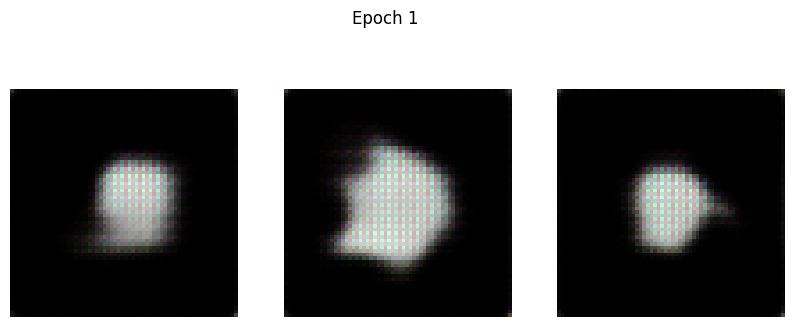

102/102 ━━━━━━━━━━━━━━━━━━━━ 28s 169ms/step - d_loss: 0.5037 - g_loss: 0.7856
Epoch 2/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 0.6727 - g_loss: 0.7625

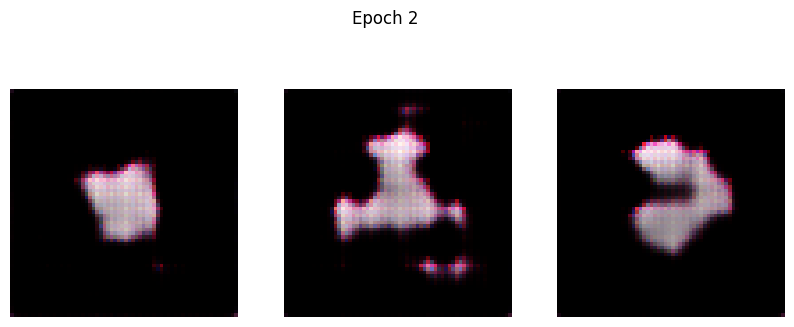

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 0.6728 - g_loss: 0.7625
Epoch 3/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 0.6764 - g_loss: 0.7251

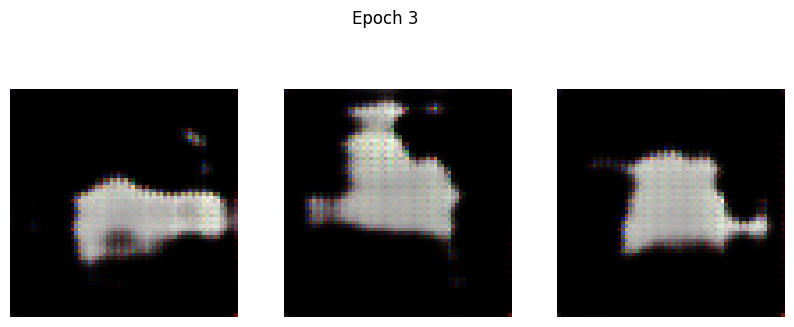

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 0.6764 - g_loss: 0.7250
Epoch 4/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 0.6622 - g_loss: 0.7450

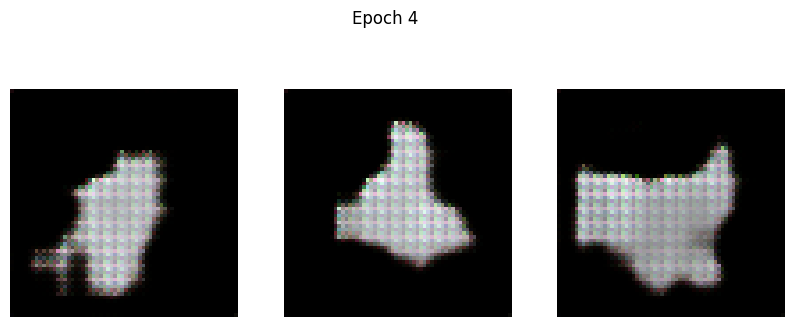

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: 0.6622 - g_loss: 0.7452
Epoch 5/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_loss: 0.6437 - g_loss: 0.7928

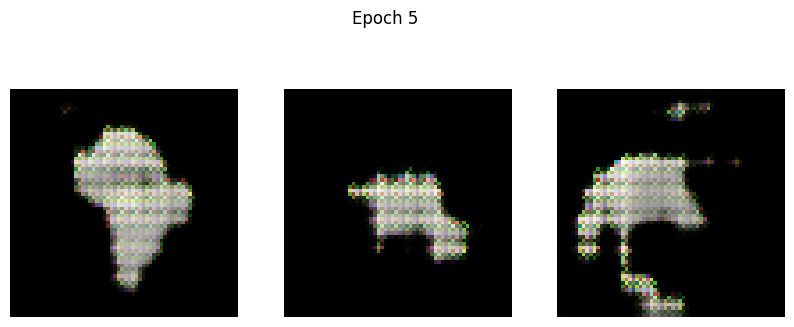

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: 0.6438 - g_loss: 0.7930
Epoch 6/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: 0.6649 - g_loss: 0.8561

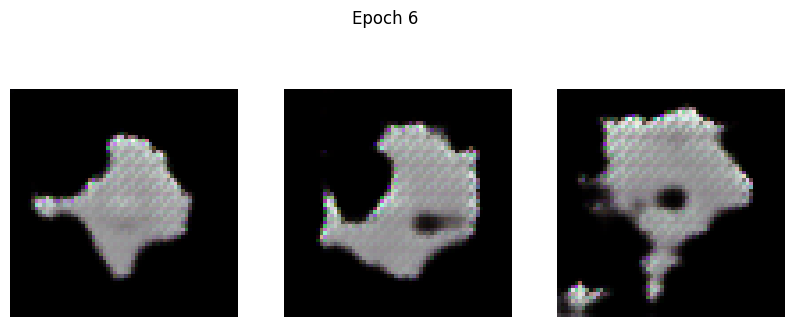

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - d_loss: 0.6649 - g_loss: 0.8557
Epoch 7/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: 0.6401 - g_loss: 0.8194

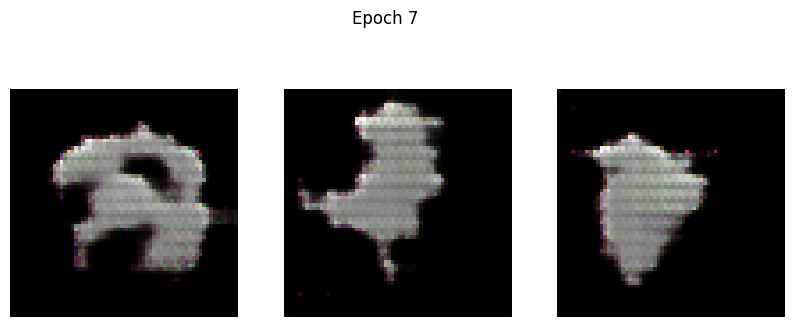

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: 0.6401 - g_loss: 0.8195
Epoch 8/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: 0.6293 - g_loss: 0.8282

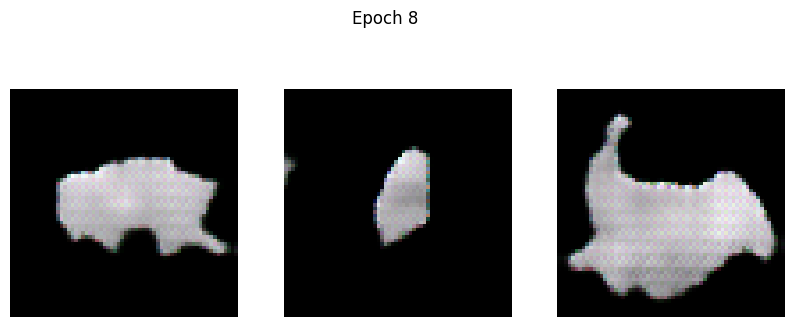

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: 0.6294 - g_loss: 0.8283
Epoch 9/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: 0.6410 - g_loss: 0.8131

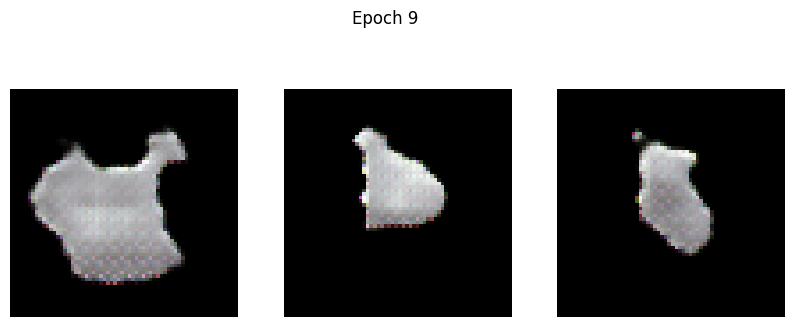

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: 0.6410 - g_loss: 0.8130
Epoch 10/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: 0.6501 - g_loss: 0.7849

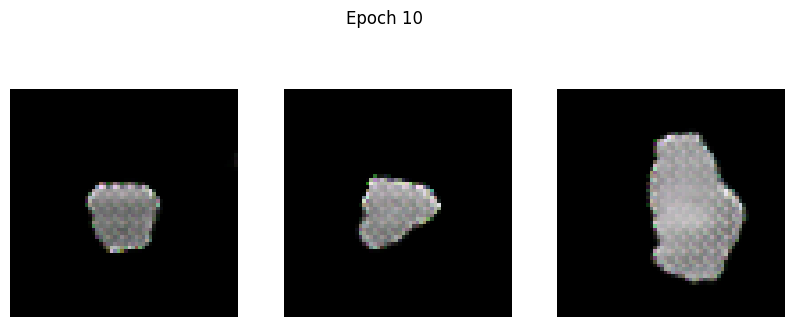

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: 0.6501 - g_loss: 0.7849
Epoch 11/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - d_loss: 0.6331 - g_loss: 0.8018

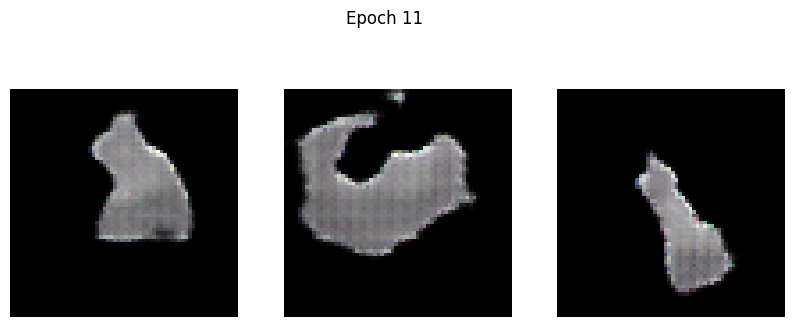

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: 0.6331 - g_loss: 0.8017
Epoch 12/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - d_loss: 0.6374 - g_loss: 0.8109

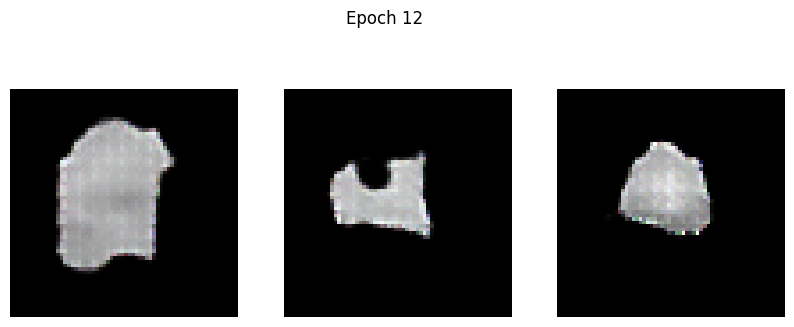

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - d_loss: 0.6374 - g_loss: 0.8109
Epoch 13/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: 0.6262 - g_loss: 0.8286

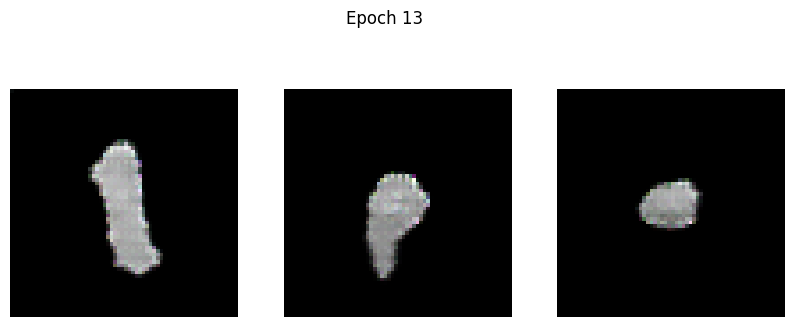

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - d_loss: 0.6263 - g_loss: 0.8287
Epoch 14/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: 0.6106 - g_loss: 0.8472

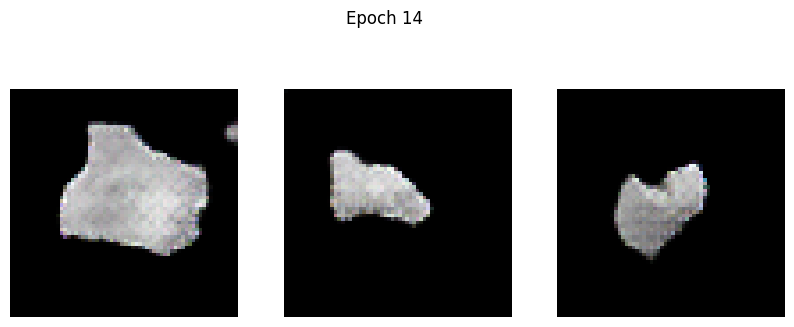

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - d_loss: 0.6106 - g_loss: 0.8474
Epoch 15/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.6162 - g_loss: 0.8858

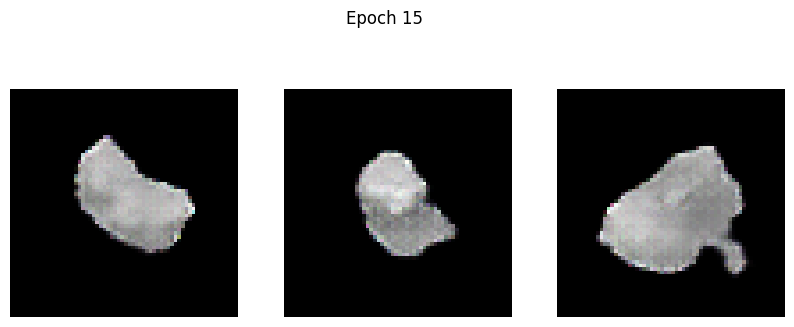

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - d_loss: 0.6162 - g_loss: 0.8859
Epoch 16/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.6054 - g_loss: 0.9337

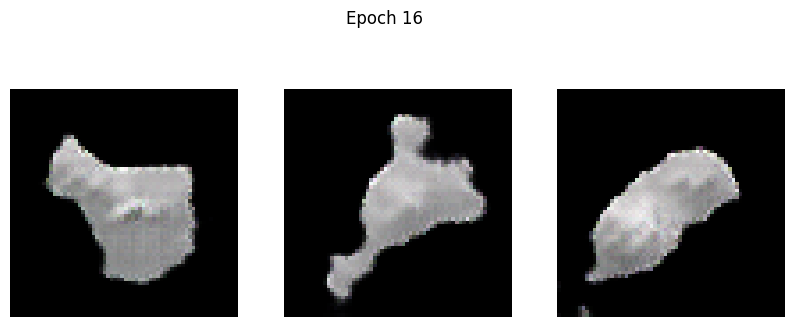

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.6054 - g_loss: 0.9337
Epoch 17/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.5830 - g_loss: 0.9589

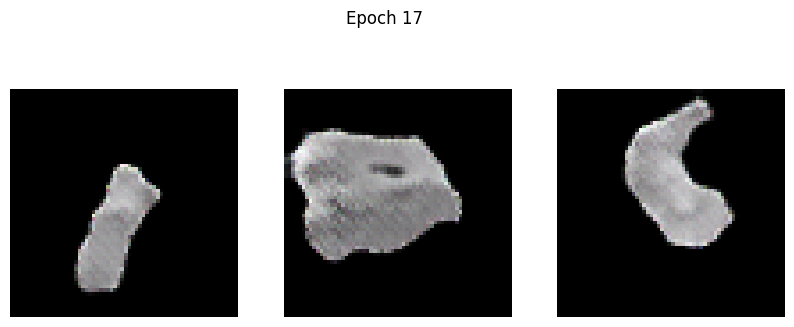

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.5829 - g_loss: 0.9588
Epoch 18/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.5625 - g_loss: 1.0058

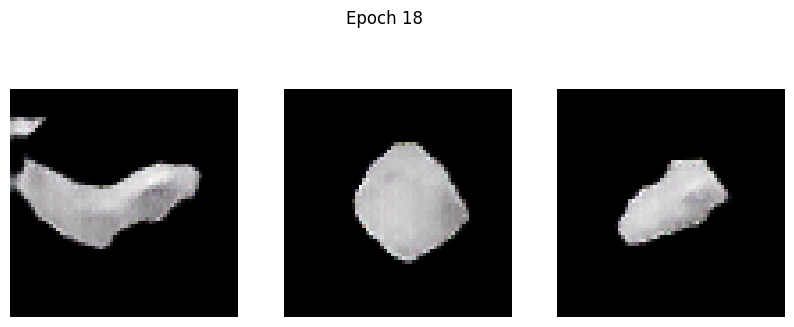

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.5624 - g_loss: 1.0059
Epoch 19/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.5626 - g_loss: 1.0407

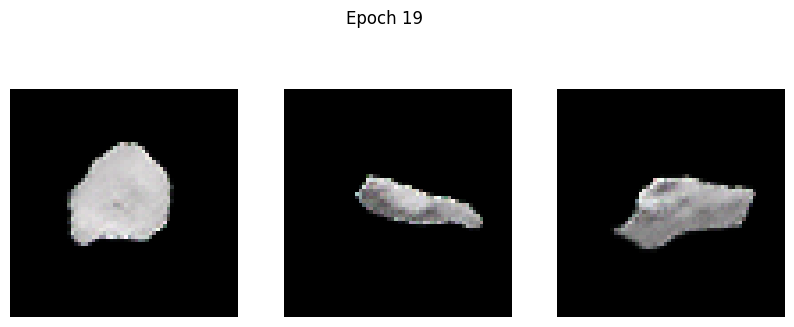

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5625 - g_loss: 1.0407
Epoch 20/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.5417 - g_loss: 1.0533

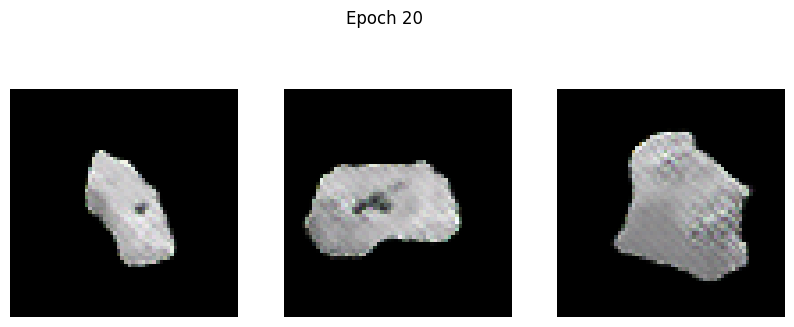

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.5418 - g_loss: 1.0534
Epoch 21/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5230 - g_loss: 1.0911

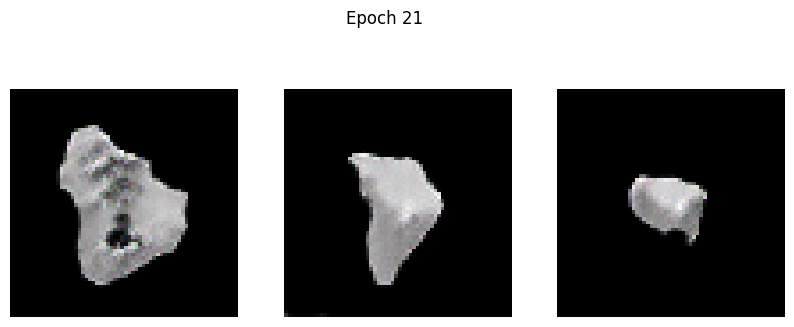

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5231 - g_loss: 1.0910
Epoch 22/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5061 - g_loss: 1.1140

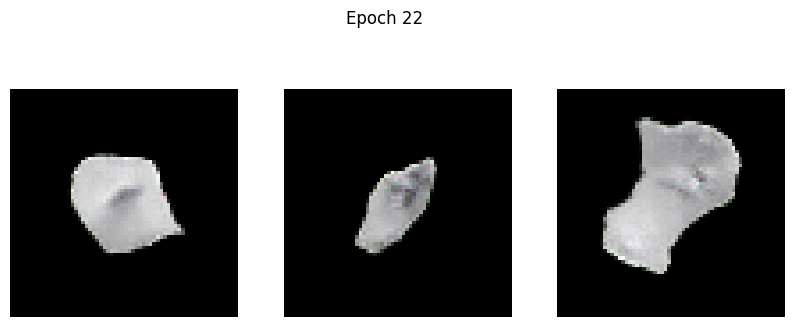

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5062 - g_loss: 1.1140
Epoch 23/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5074 - g_loss: 1.1486

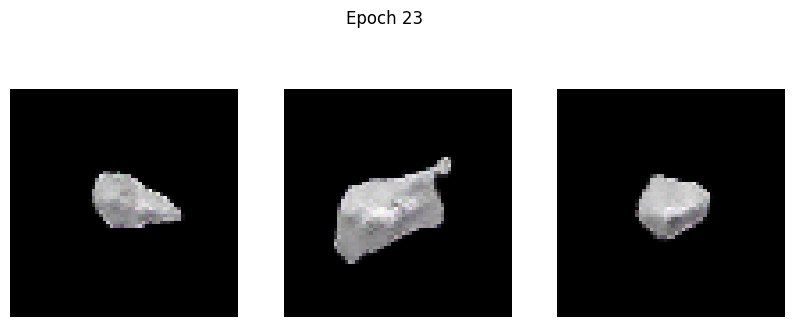

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5074 - g_loss: 1.1487
Epoch 24/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4955 - g_loss: 1.1360

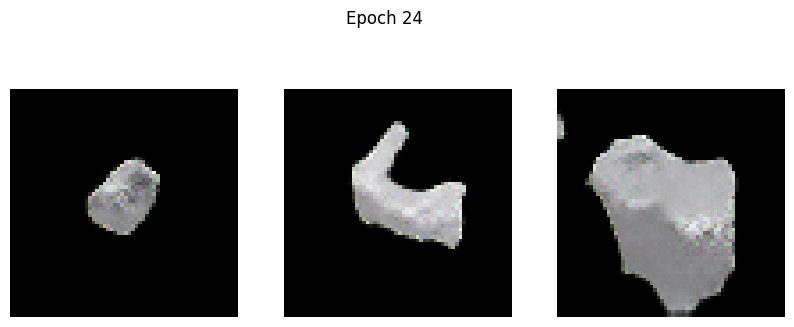

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4954 - g_loss: 1.1361
Epoch 25/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4878 - g_loss: 1.2146

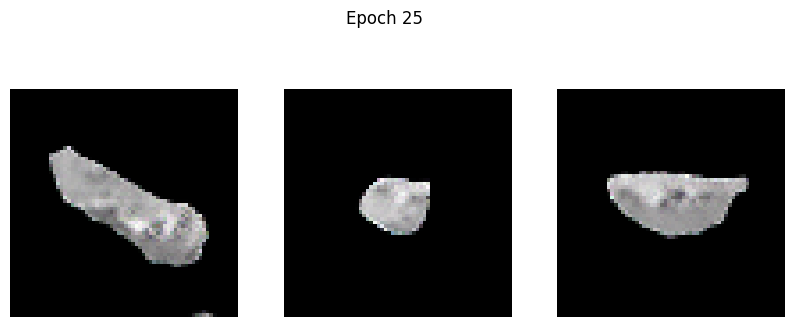

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4878 - g_loss: 1.2147
Epoch 26/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4659 - g_loss: 1.2638

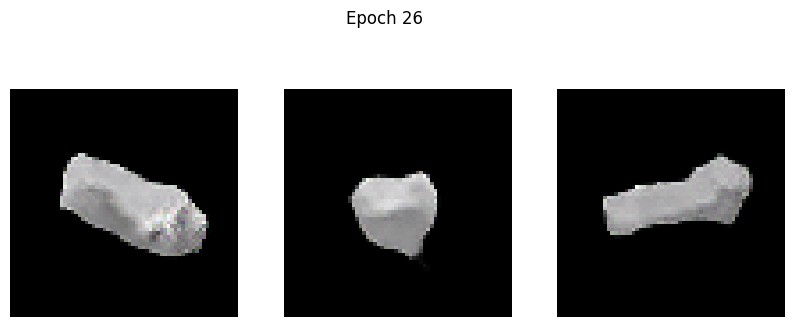

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4660 - g_loss: 1.2641
Epoch 27/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4538 - g_loss: 1.2524

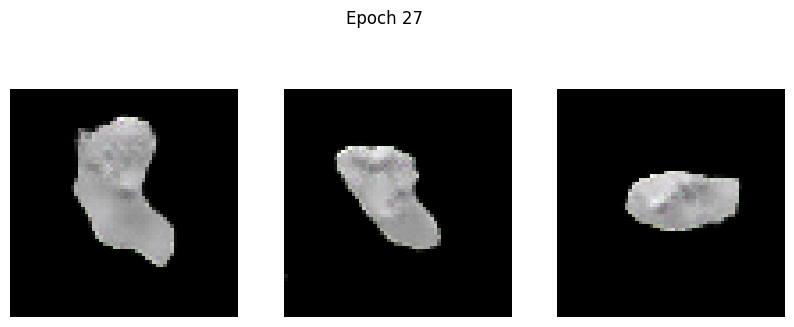

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4537 - g_loss: 1.2525
Epoch 28/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4490 - g_loss: 1.3858

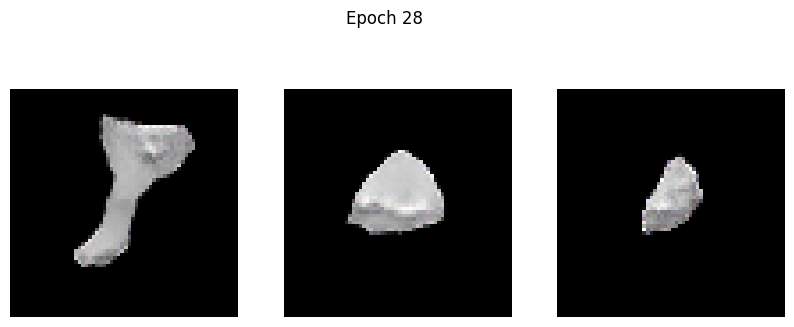

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4491 - g_loss: 1.3855
Epoch 29/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4388 - g_loss: 1.3499

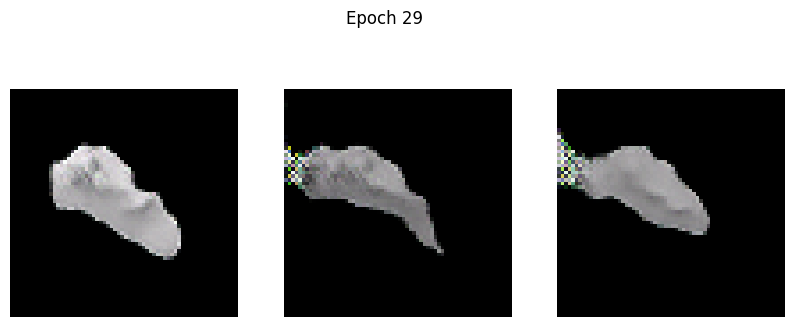

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4388 - g_loss: 1.3498
Epoch 30/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4639 - g_loss: 1.3683

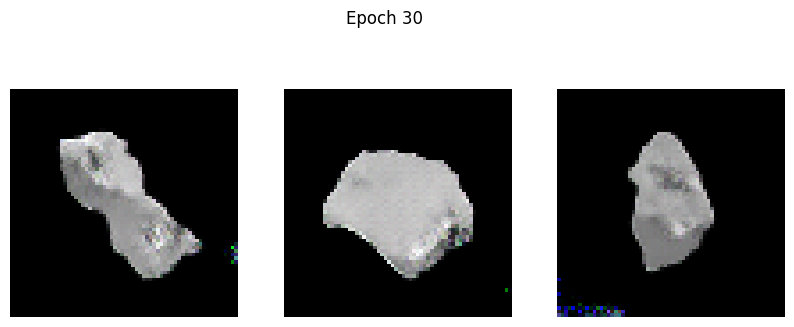

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4639 - g_loss: 1.3684
Epoch 31/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4739 - g_loss: 1.3235

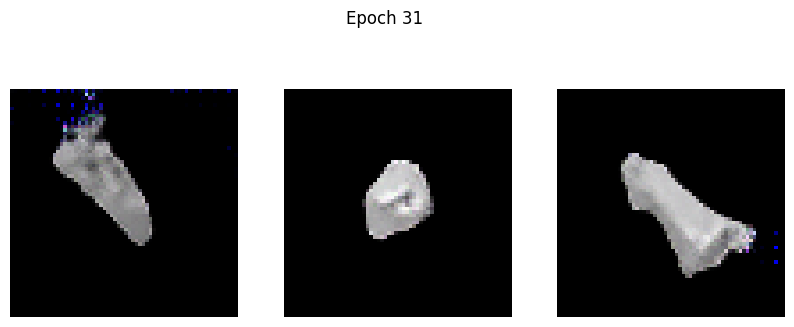

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4738 - g_loss: 1.3235
Epoch 32/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4077 - g_loss: 1.3389

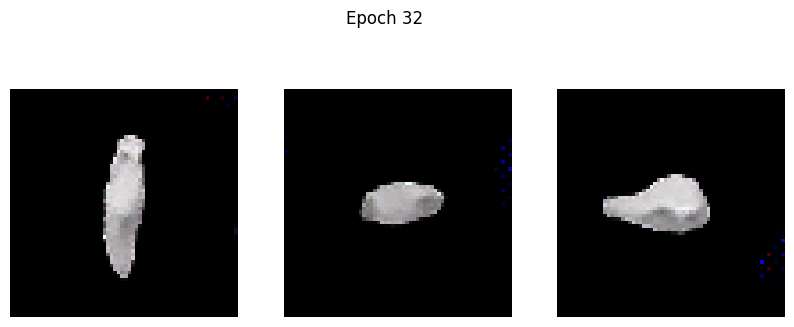

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4077 - g_loss: 1.3390
Epoch 33/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4324 - g_loss: 1.3933

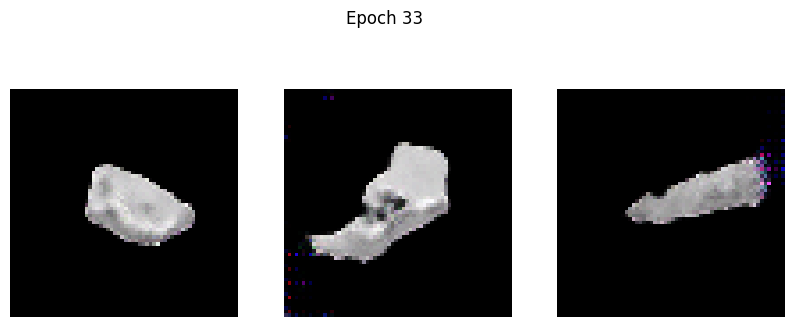

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4324 - g_loss: 1.3934
Epoch 34/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4270 - g_loss: 1.4124

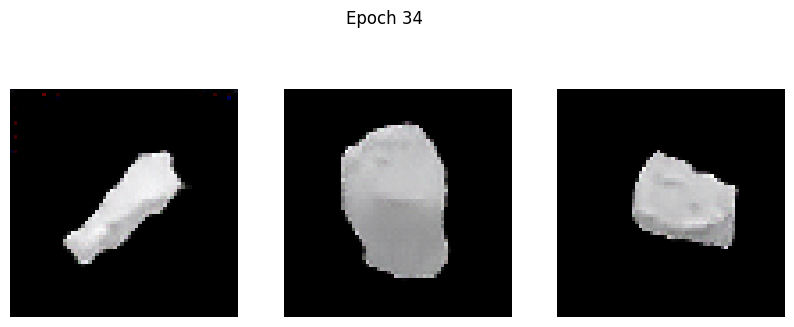

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4271 - g_loss: 1.4123
Epoch 35/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4634 - g_loss: 1.4741

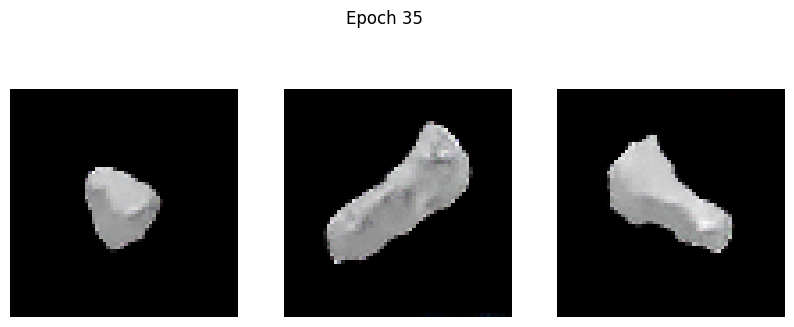

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4630 - g_loss: 1.4738
Epoch 36/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3764 - g_loss: 1.4583

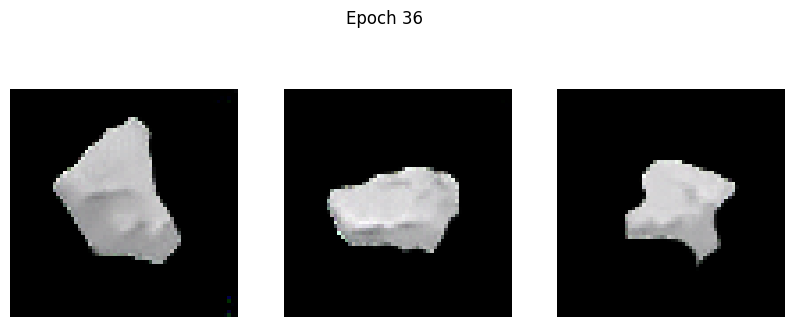

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3766 - g_loss: 1.4583
Epoch 37/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3900 - g_loss: 1.4973

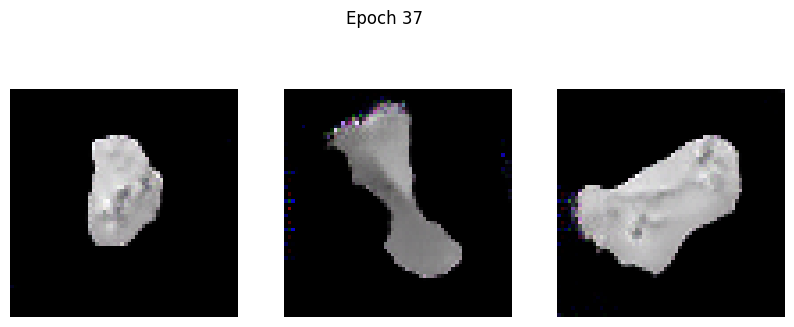

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3901 - g_loss: 1.4970
Epoch 38/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3794 - g_loss: 1.5557

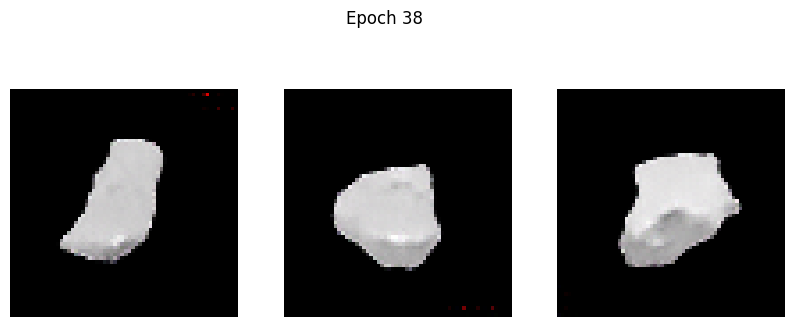

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3794 - g_loss: 1.5555
Epoch 39/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3934 - g_loss: 1.5523

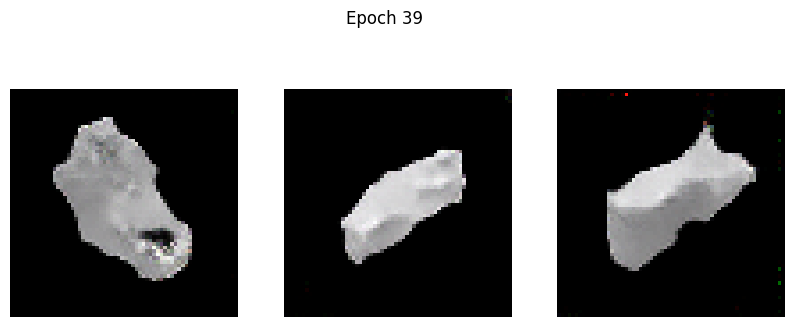

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3934 - g_loss: 1.5523
Epoch 40/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3888 - g_loss: 1.5654

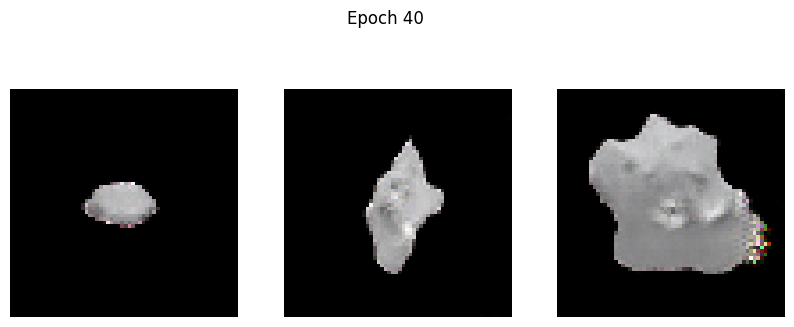

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3887 - g_loss: 1.5655
Epoch 41/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3654 - g_loss: 1.6205

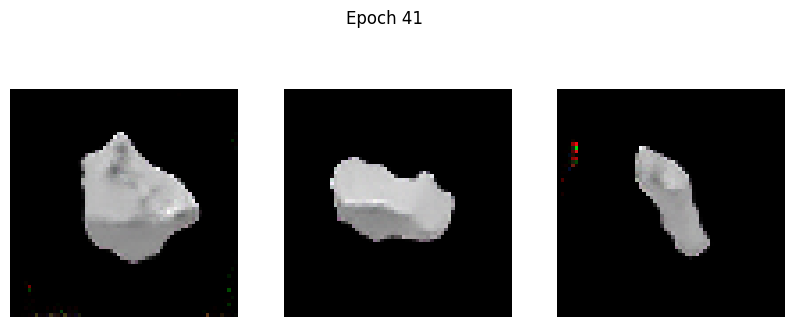

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3654 - g_loss: 1.6204
Epoch 42/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4091 - g_loss: 1.6523

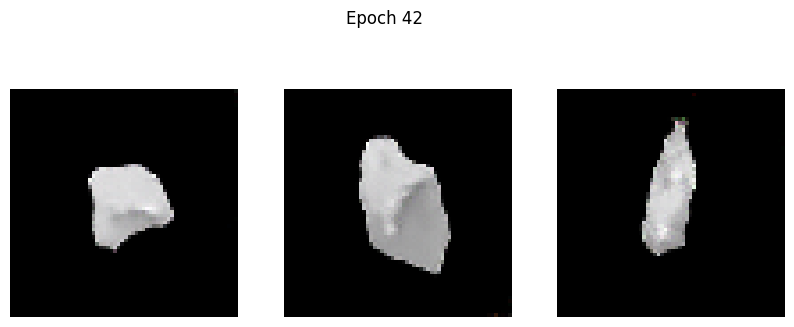

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4092 - g_loss: 1.6527
Epoch 43/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3359 - g_loss: 1.5536

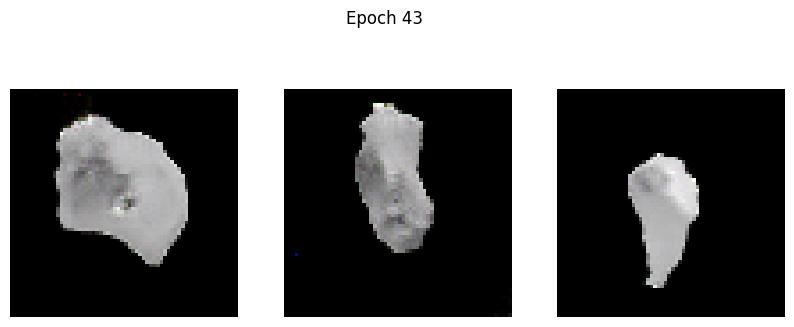

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3359 - g_loss: 1.5538
Epoch 44/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4299 - g_loss: 1.7938

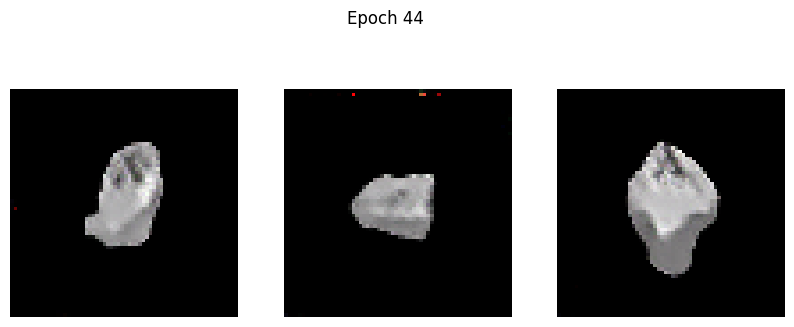

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4298 - g_loss: 1.7927
Epoch 45/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3613 - g_loss: 1.6443

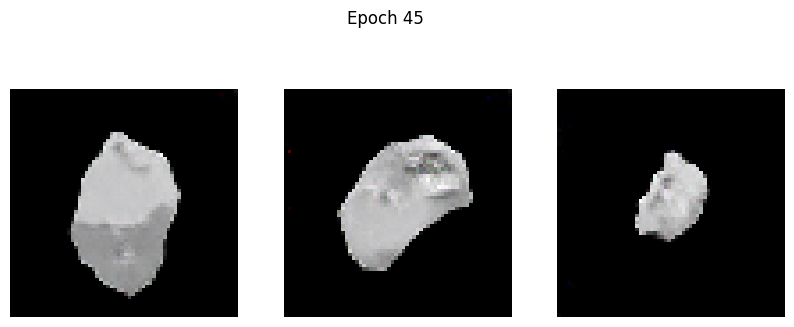

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3613 - g_loss: 1.6440
Epoch 46/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3279 - g_loss: 1.6523

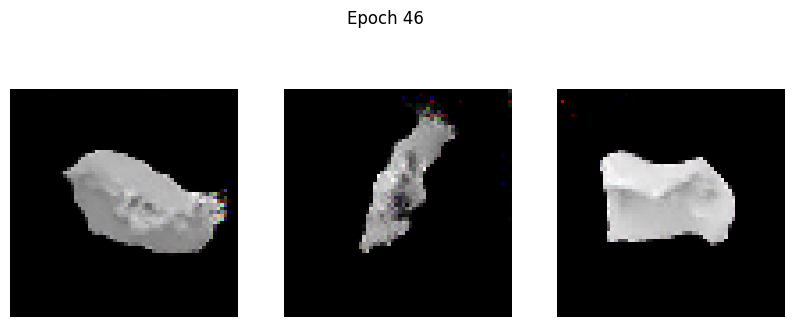

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3279 - g_loss: 1.6523
Epoch 47/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3633 - g_loss: 1.7518

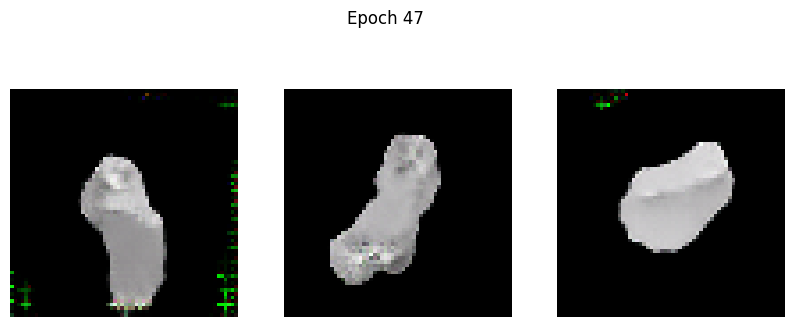

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3632 - g_loss: 1.7515
Epoch 48/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4664 - g_loss: 2.0506

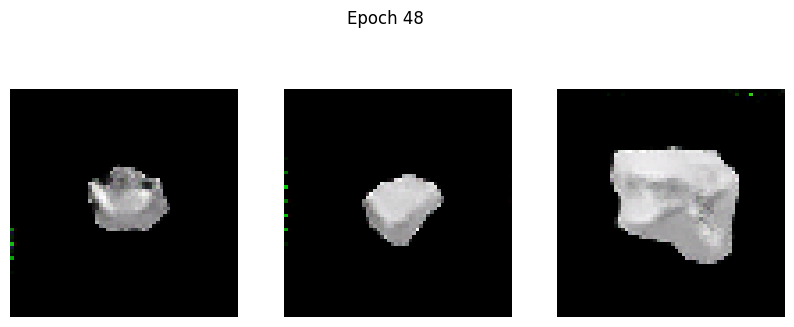

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4657 - g_loss: 2.0486
Epoch 49/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3237 - g_loss: 1.6385

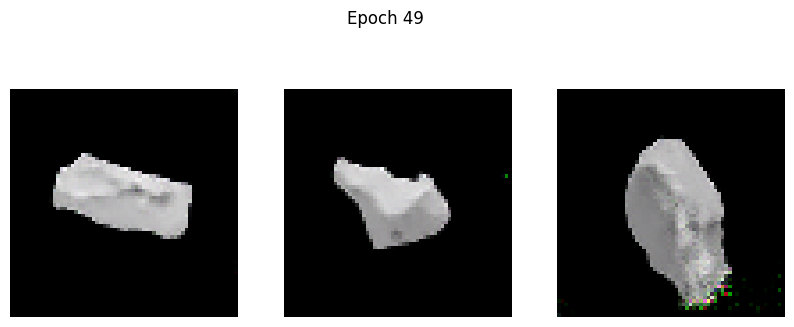

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3240 - g_loss: 1.6390
Epoch 50/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3014 - g_loss: 1.7228

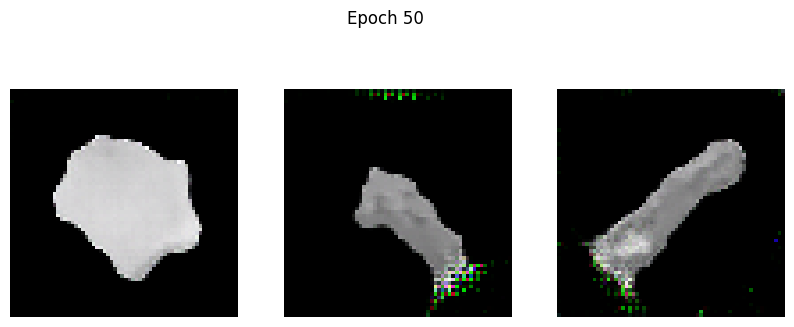

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3016 - g_loss: 1.7228
Epoch 51/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3307 - g_loss: 1.8274

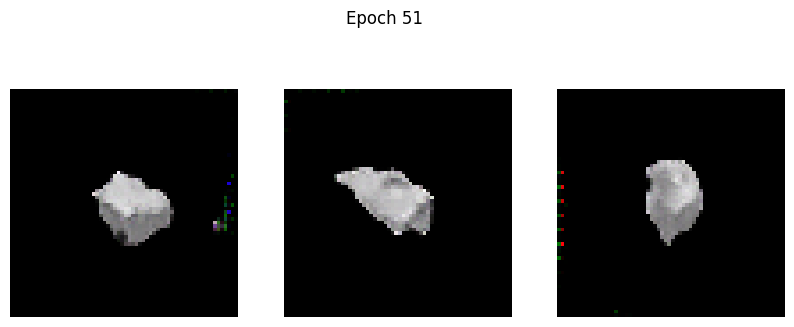

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3307 - g_loss: 1.8269
Epoch 52/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2960 - g_loss: 1.7892

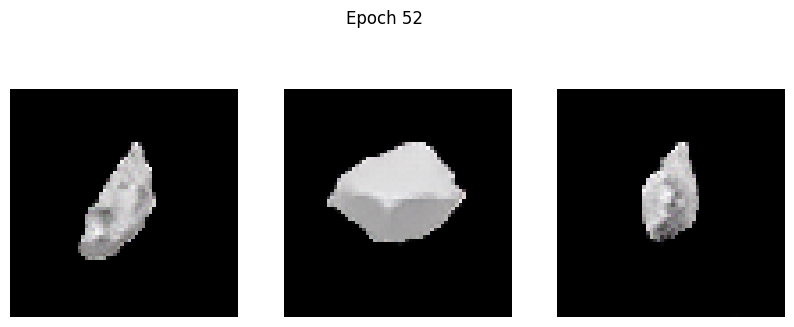

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2961 - g_loss: 1.7894
Epoch 53/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3165 - g_loss: 1.8305

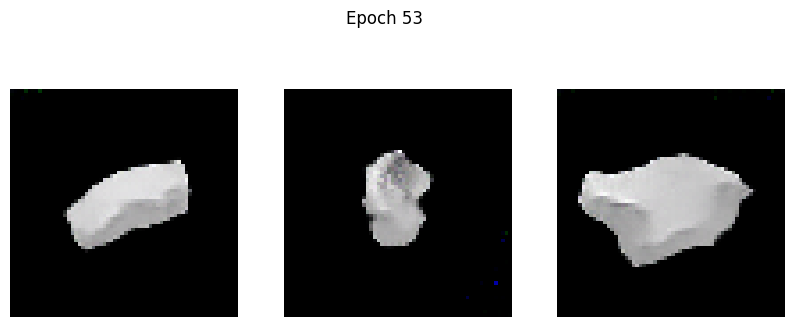

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3163 - g_loss: 1.8306
Epoch 54/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 1.1477 - g_loss: 3.3652

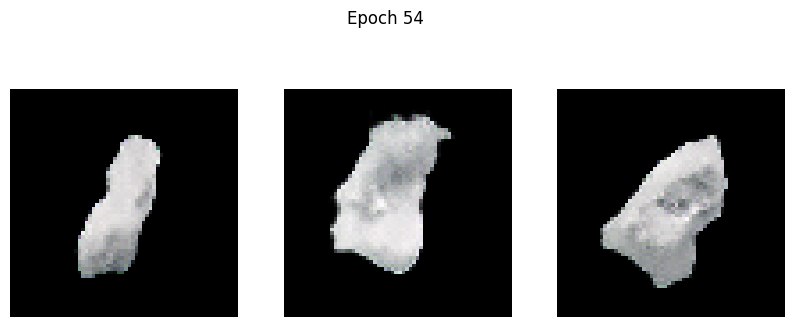

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 1.1441 - g_loss: 3.3577
Epoch 55/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3587 - g_loss: 1.5206

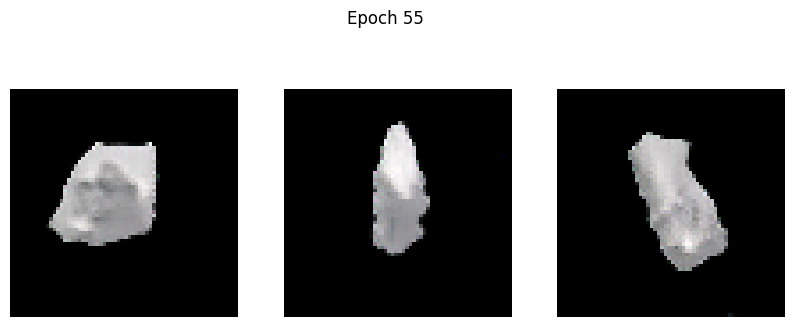

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3586 - g_loss: 1.5206
Epoch 56/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3181 - g_loss: 1.6503

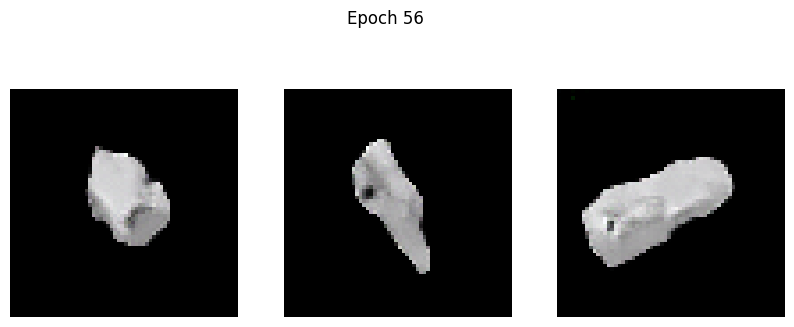

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3180 - g_loss: 1.6503
Epoch 57/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2721 - g_loss: 1.7292

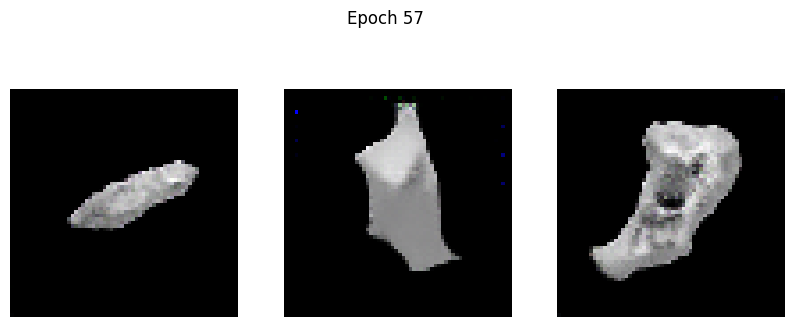

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2723 - g_loss: 1.7294
Epoch 58/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3053 - g_loss: 1.7727

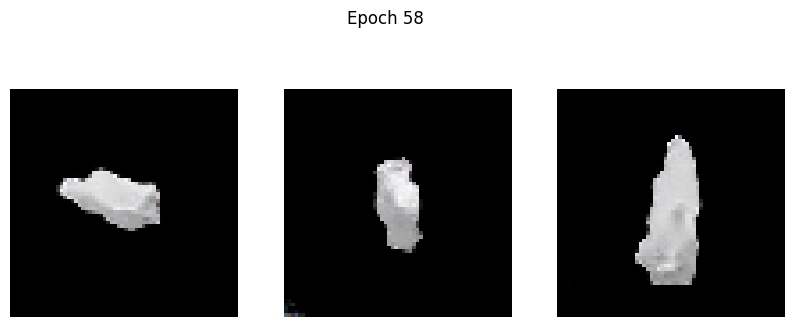

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3053 - g_loss: 1.7728
Epoch 59/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2748 - g_loss: 1.7626

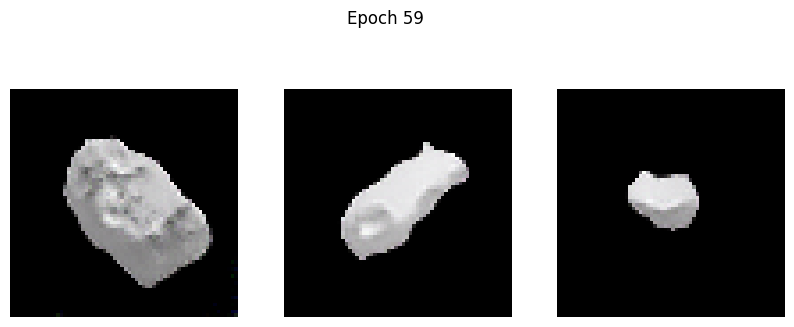

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2751 - g_loss: 1.7629
Epoch 60/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2818 - g_loss: 1.8287

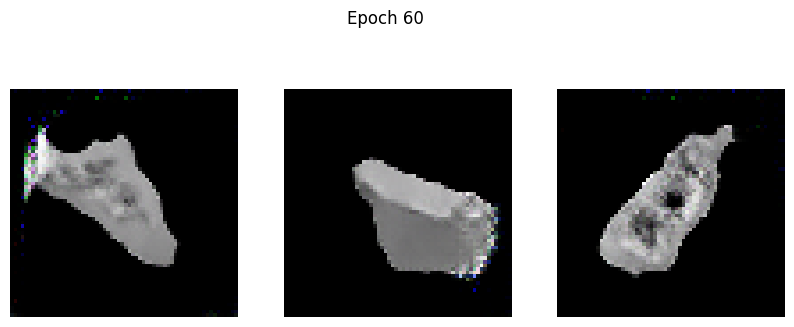

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2820 - g_loss: 1.8287
Epoch 61/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2761 - g_loss: 1.8971

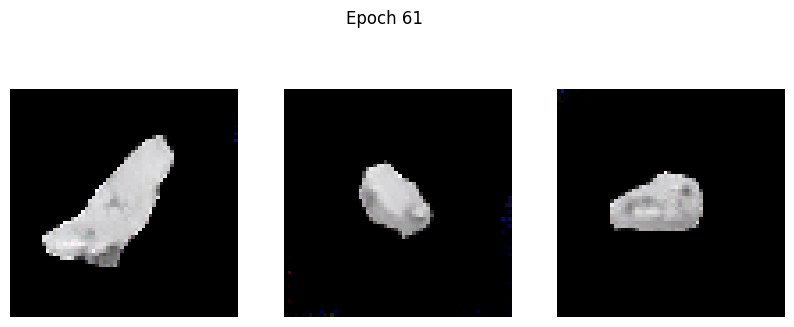

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2761 - g_loss: 1.8969
Epoch 62/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2805 - g_loss: 1.9056

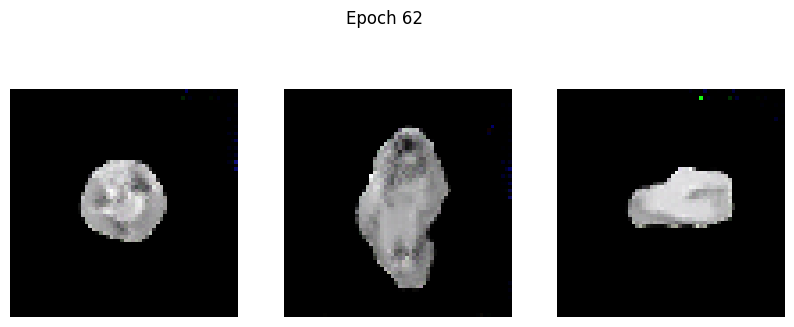

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2806 - g_loss: 1.9057
Epoch 63/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2567 - g_loss: 1.9067

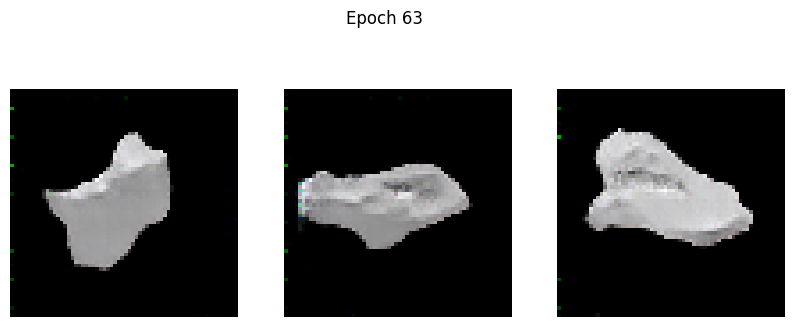

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2568 - g_loss: 1.9069
Epoch 64/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3003 - g_loss: 1.9720

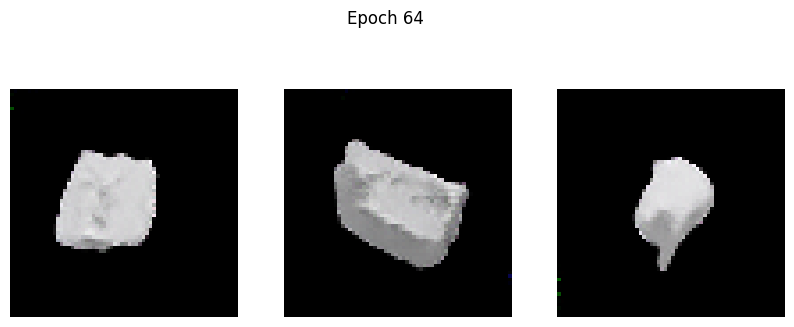

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3006 - g_loss: 1.9729
Epoch 65/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2676 - g_loss: 1.8936

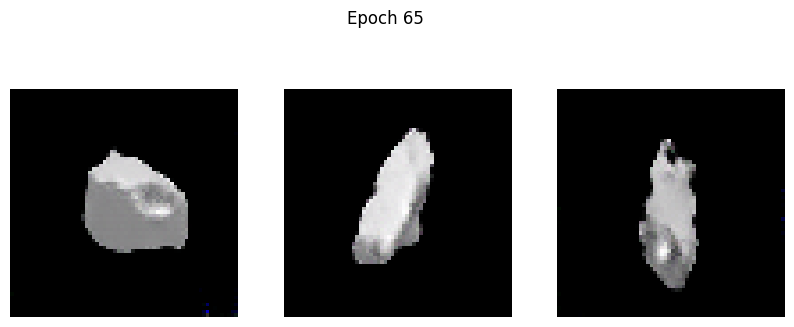

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2676 - g_loss: 1.8940
Epoch 66/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2797 - g_loss: 1.9397

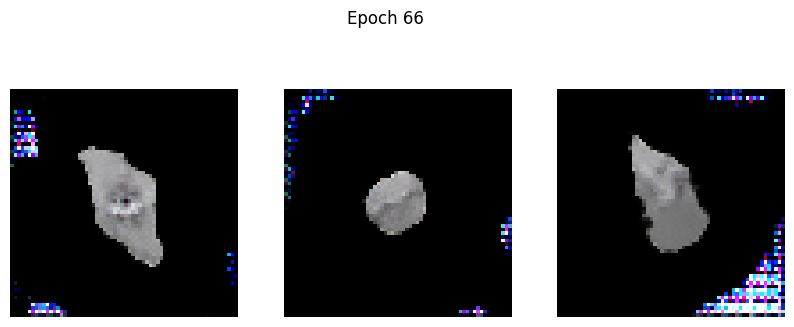

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2799 - g_loss: 1.9399
Epoch 67/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4011 - g_loss: 2.1523

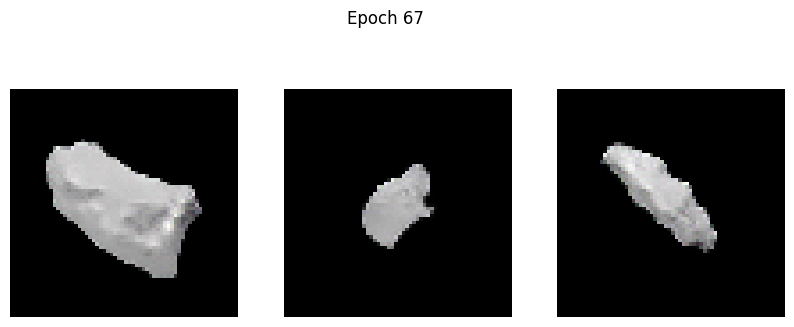

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4006 - g_loss: 2.1514
Epoch 68/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2632 - g_loss: 1.8840

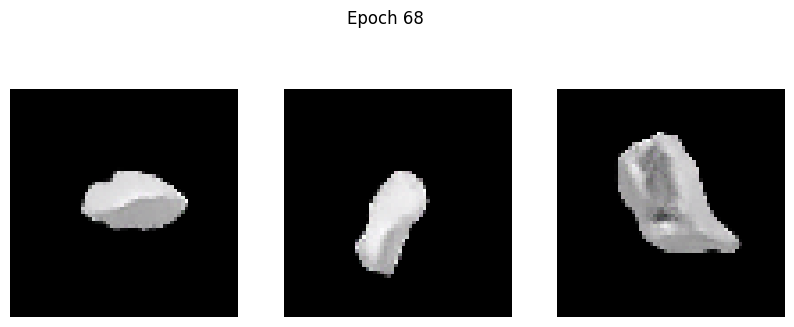

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2632 - g_loss: 1.8844
Epoch 69/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2745 - g_loss: 1.9982

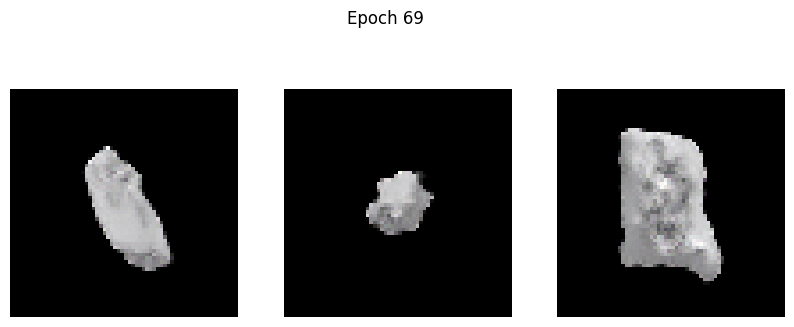

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2744 - g_loss: 1.9980
Epoch 70/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2613 - g_loss: 2.0141

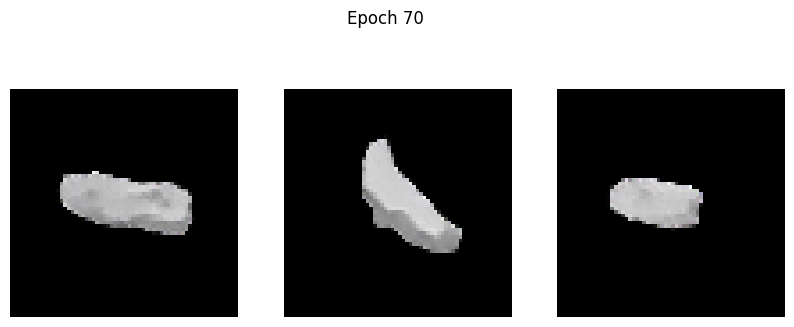

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2613 - g_loss: 2.0142
Epoch 71/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3086 - g_loss: 2.0264

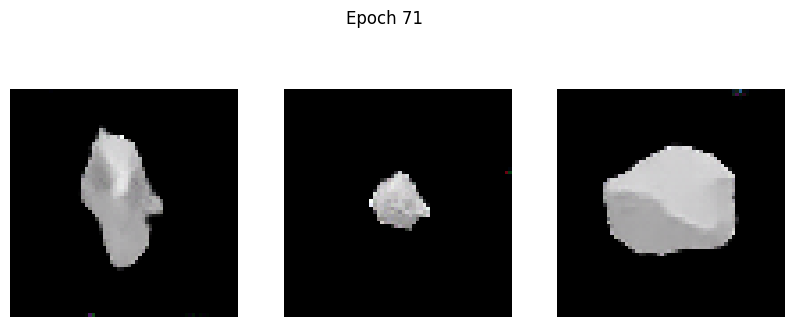

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3083 - g_loss: 2.0263
Epoch 72/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2615 - g_loss: 2.0657

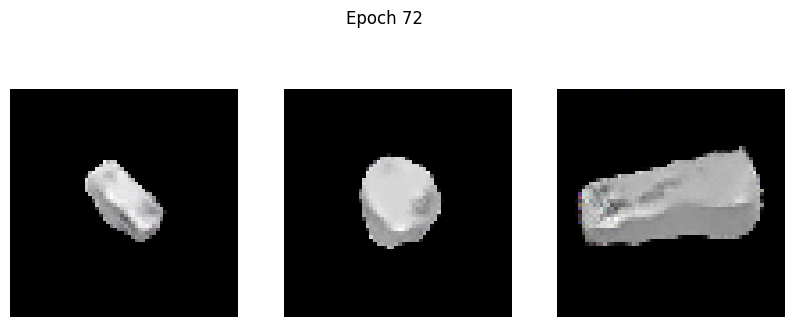

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2619 - g_loss: 2.0660
Epoch 73/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2386 - g_loss: 1.9894

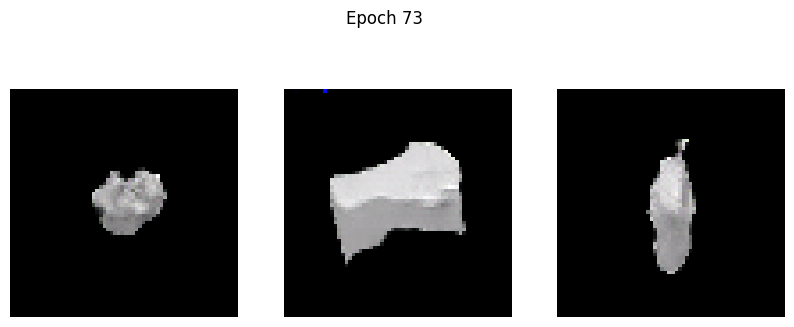

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2386 - g_loss: 1.9897
Epoch 74/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2358 - g_loss: 2.0091

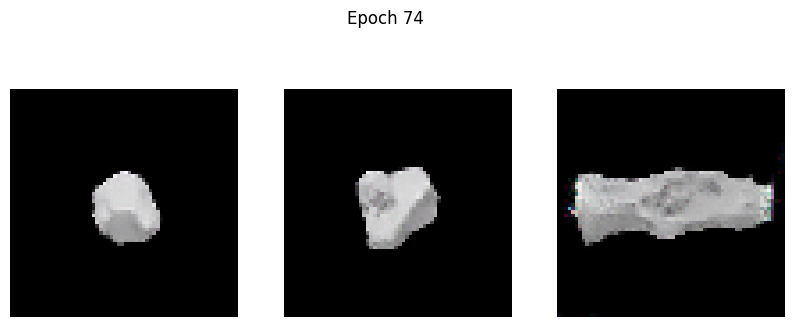

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2358 - g_loss: 2.0095
Epoch 75/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3239 - g_loss: 2.2495

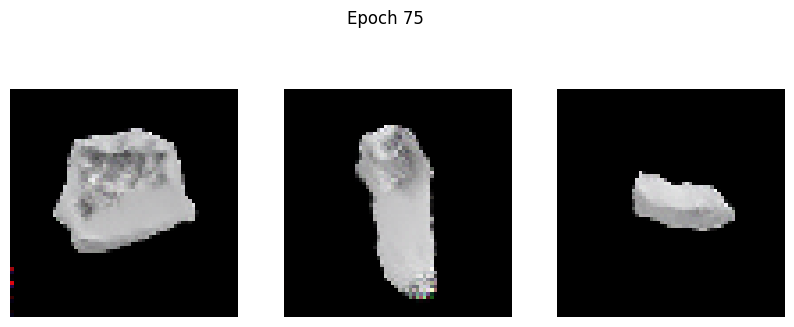

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3238 - g_loss: 2.2490
Epoch 76/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2364 - g_loss: 2.0486

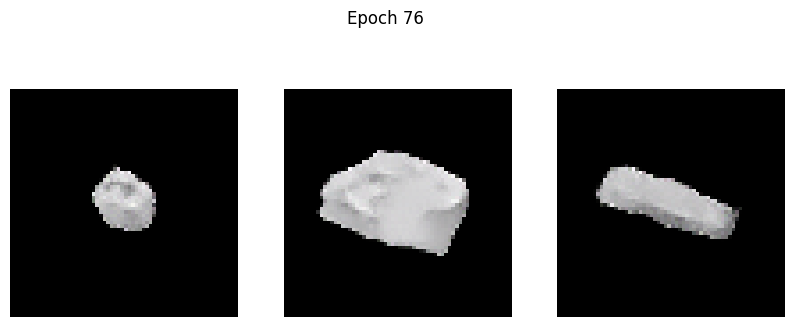

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2363 - g_loss: 2.0485
Epoch 77/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2104 - g_loss: 2.1001

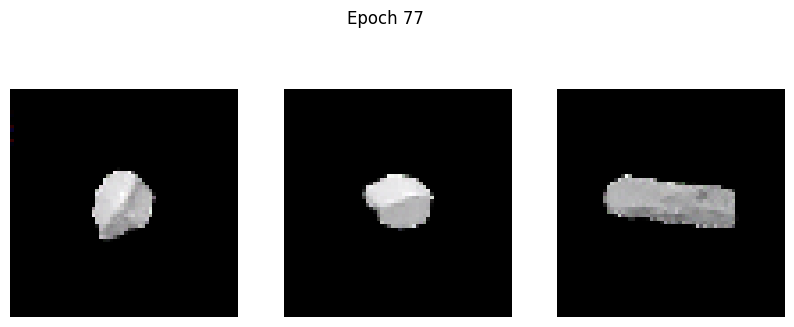

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2106 - g_loss: 2.1001
Epoch 78/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2492 - g_loss: 2.1296

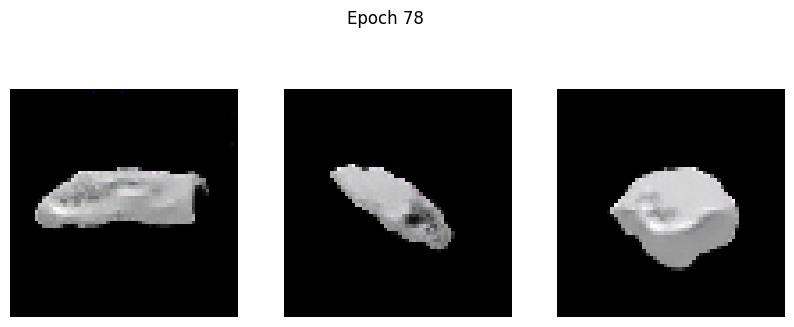

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2496 - g_loss: 2.1303
Epoch 79/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2495 - g_loss: 2.1293

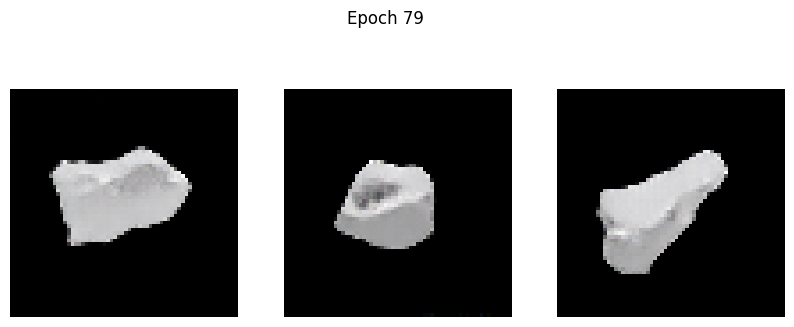

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2493 - g_loss: 2.1293
Epoch 80/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3615 - g_loss: 2.3131

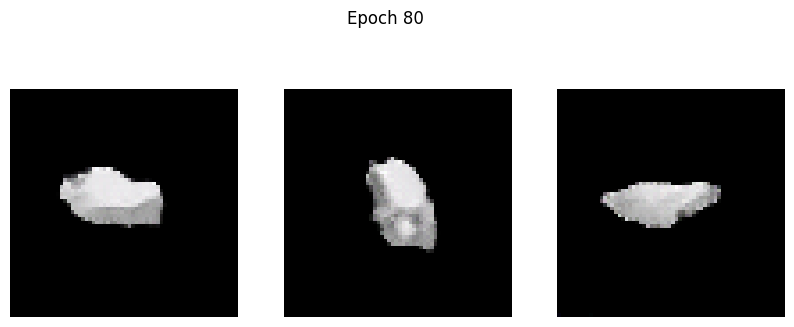

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3622 - g_loss: 2.3133
Epoch 81/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1764 - g_loss: 1.9600

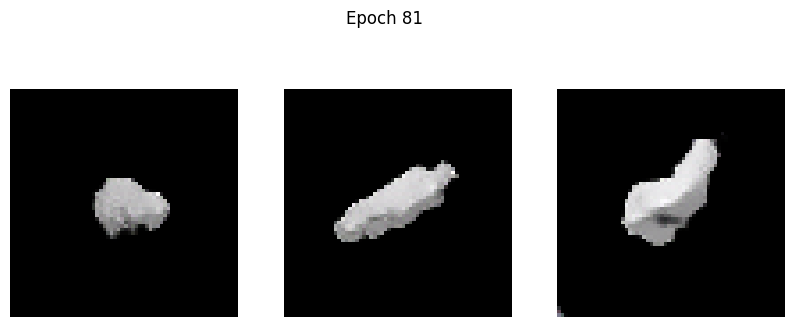

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1765 - g_loss: 1.9604
Epoch 82/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1980 - g_loss: 2.0706

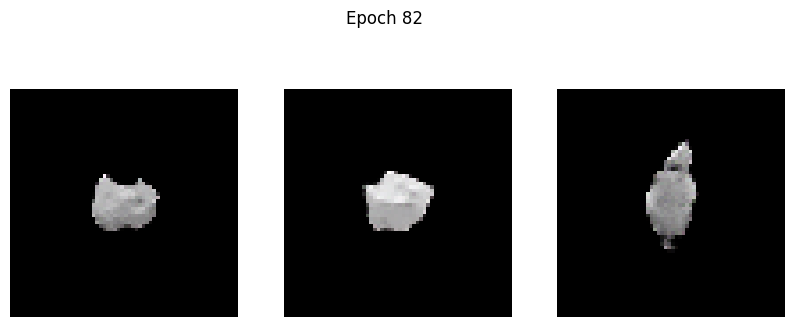

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1981 - g_loss: 2.0708
Epoch 83/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1701 - g_loss: 2.0543

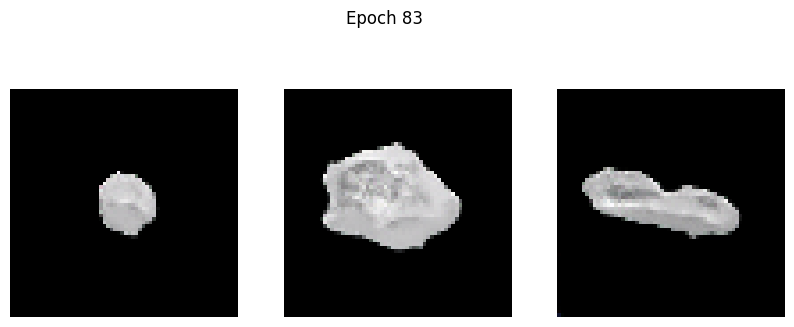

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1703 - g_loss: 2.0547
Epoch 84/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2435 - g_loss: 2.1960

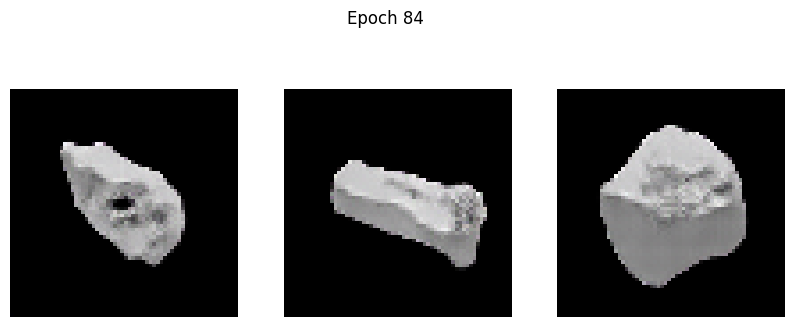

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2434 - g_loss: 2.1961
Epoch 85/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1708 - g_loss: 2.2742

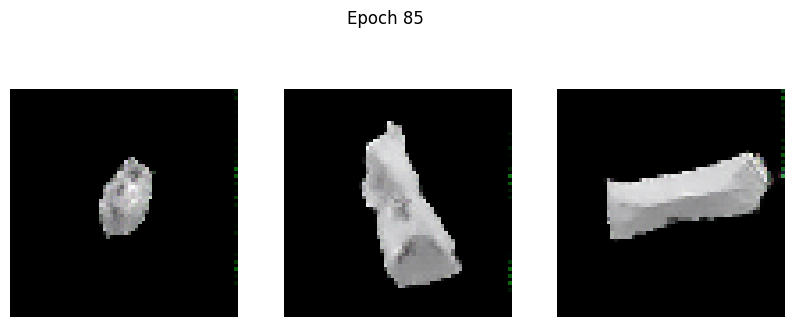

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1707 - g_loss: 2.2735
Epoch 86/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3082 - g_loss: 2.2914

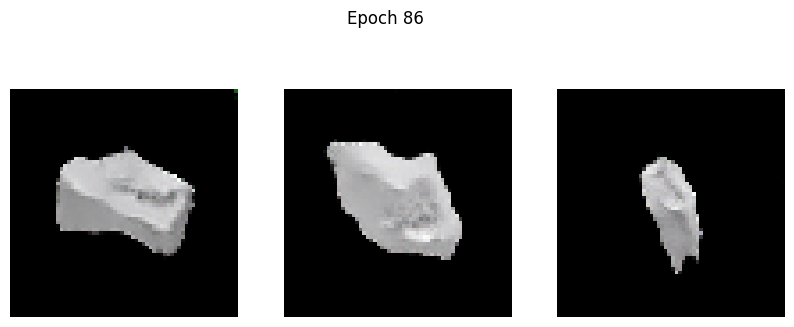

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3088 - g_loss: 2.2917
Epoch 87/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1476 - g_loss: 2.0301

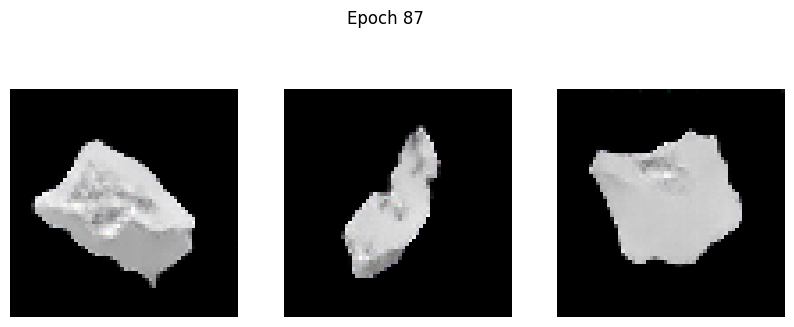

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1476 - g_loss: 2.0307
Epoch 88/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1602 - g_loss: 2.1033

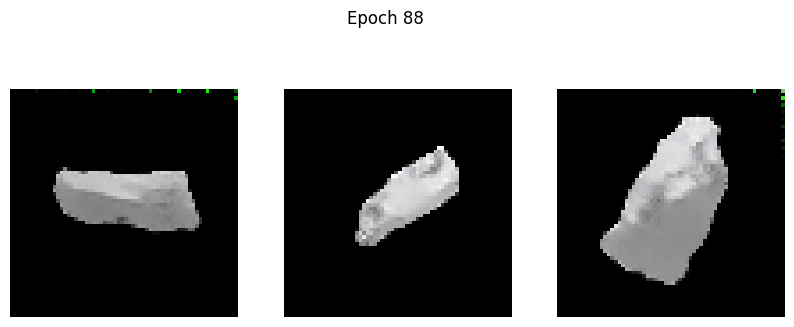

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1604 - g_loss: 2.1044
Epoch 89/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1813 - g_loss: 2.2896

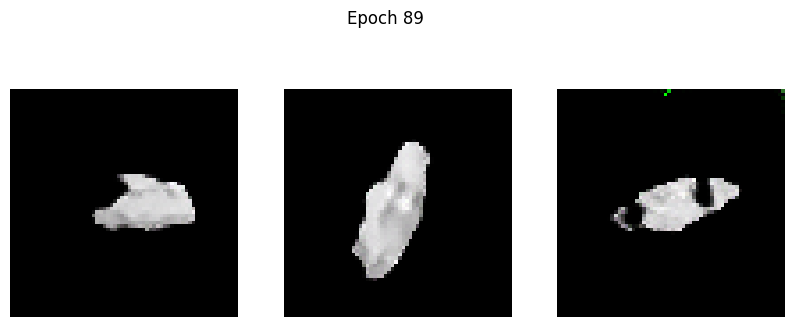

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1814 - g_loss: 2.2896
Epoch 90/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.1612 - g_loss: 2.2865

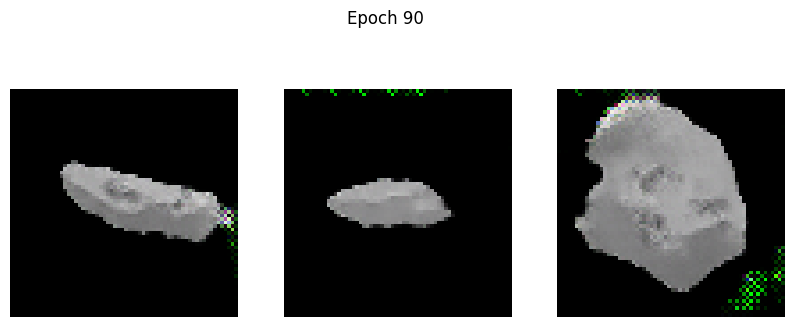

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1614 - g_loss: 2.2862
Epoch 91/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2160 - g_loss: 2.2980

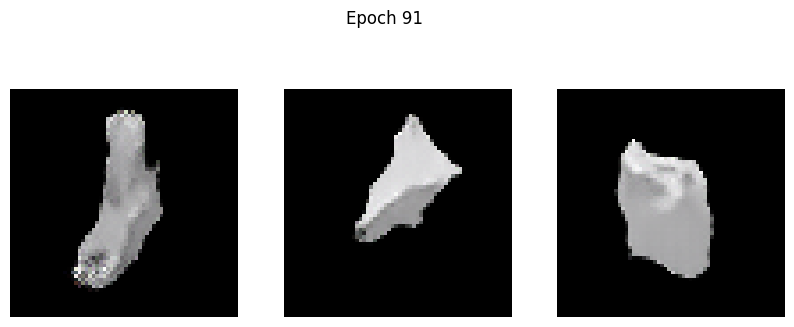

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2159 - g_loss: 2.2982
Epoch 92/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1978 - g_loss: 2.3526

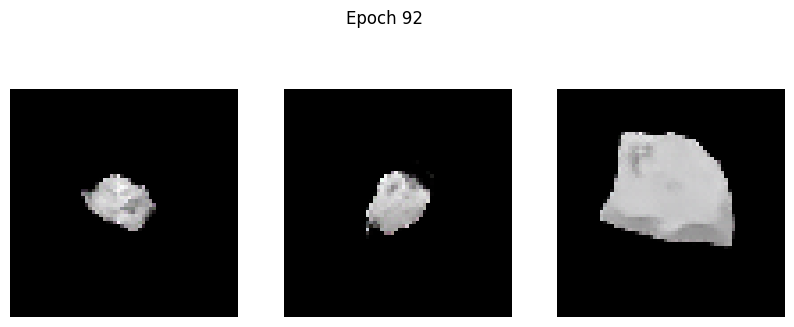

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1987 - g_loss: 2.3531
Epoch 93/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1637 - g_loss: 2.1835

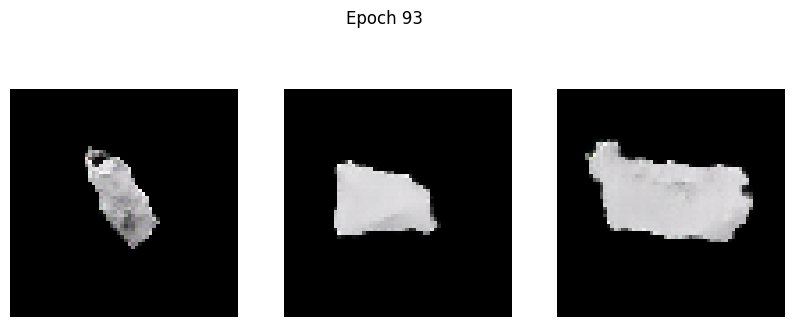

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: 0.1633 - g_loss: 2.1839
Epoch 94/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0738 - g_loss: 2.2086

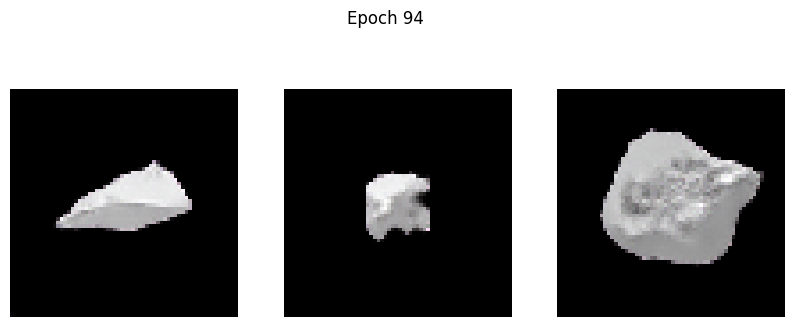

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0740 - g_loss: 2.2092
Epoch 95/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2001 - g_loss: 2.3690

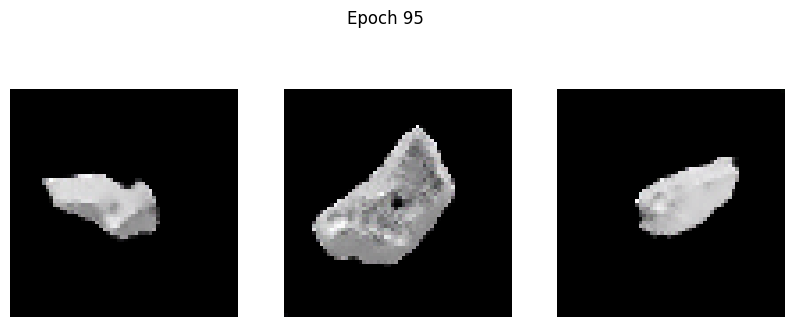

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1999 - g_loss: 2.3691
Epoch 96/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.0835 - g_loss: 2.3528

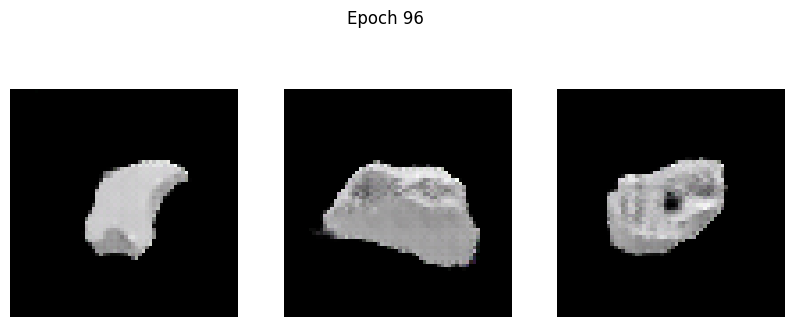

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0853 - g_loss: 2.3553
Epoch 97/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0457 - g_loss: 2.2703

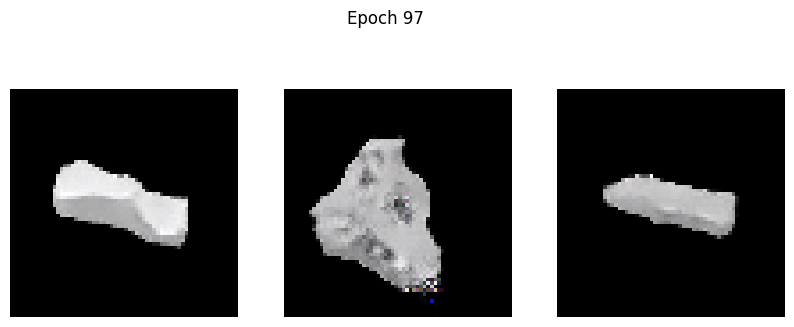

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0459 - g_loss: 2.2702
Epoch 98/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0883 - g_loss: 2.3403

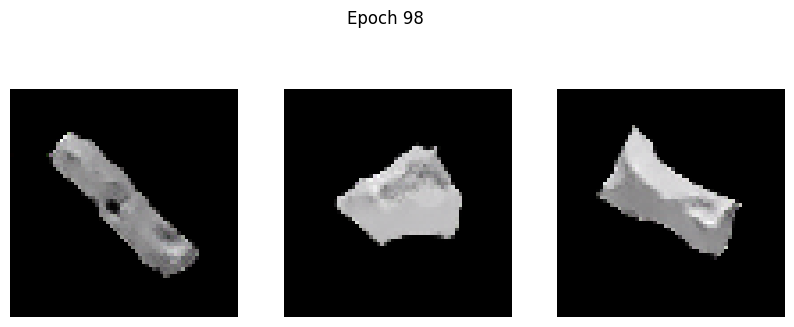

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0880 - g_loss: 2.3401
Epoch 99/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 1.8335 - g_loss: 5.5542

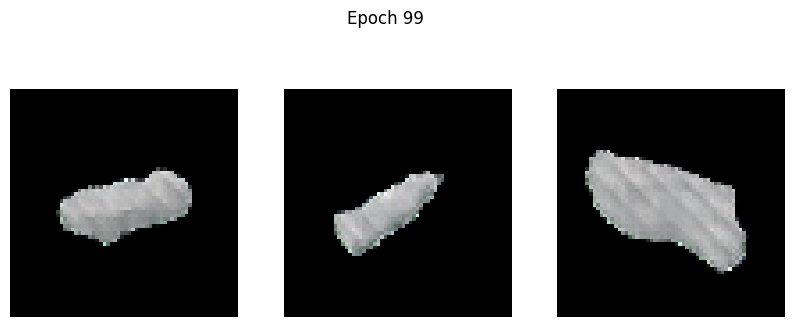

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 1.8351 - g_loss: 5.5589
Epoch 100/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3529 - g_loss: 2.0419

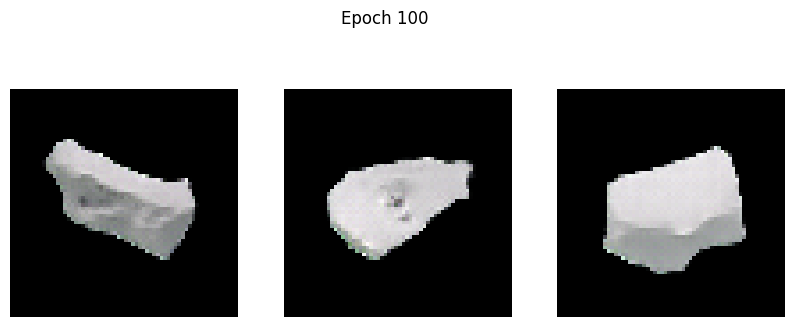

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3528 - g_loss: 2.0406
Epoch 101/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2848 - g_loss: 1.8082

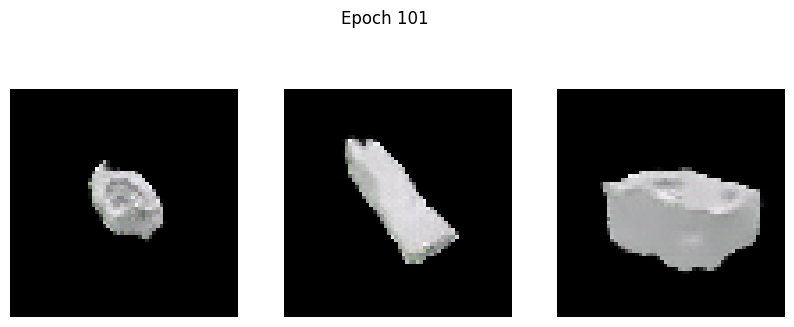

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2848 - g_loss: 1.8085
Epoch 102/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2113 - g_loss: 1.9476

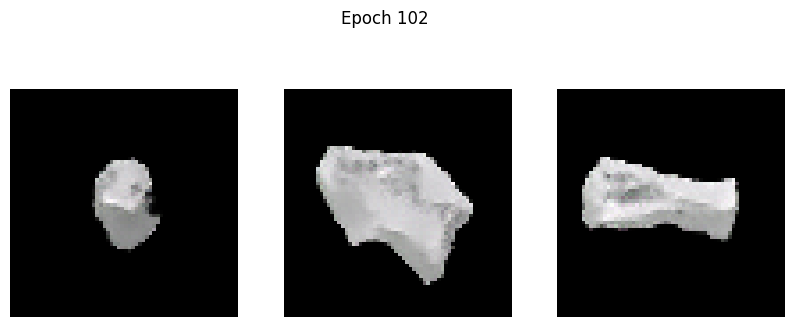

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2113 - g_loss: 1.9475
Epoch 103/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1592 - g_loss: 1.9955

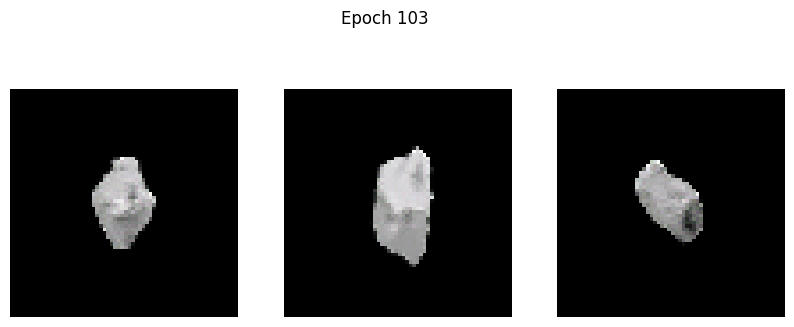

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1593 - g_loss: 1.9956
Epoch 104/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1073 - g_loss: 2.0052

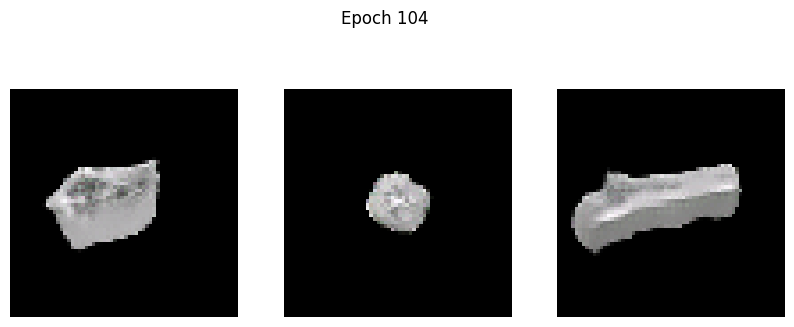

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1075 - g_loss: 2.0055
Epoch 105/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0813 - g_loss: 2.0102

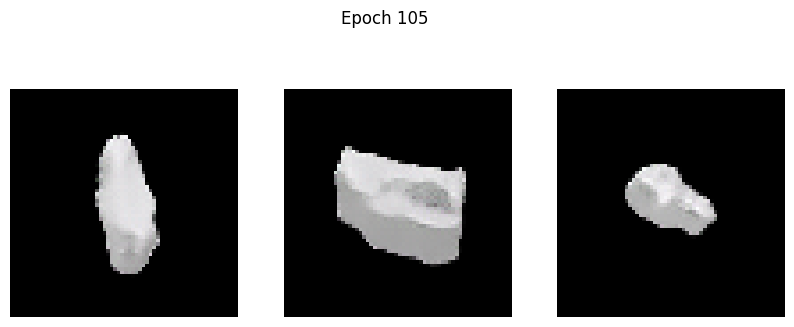

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - d_loss: 0.0814 - g_loss: 2.0104
Epoch 106/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0441 - g_loss: 2.1318

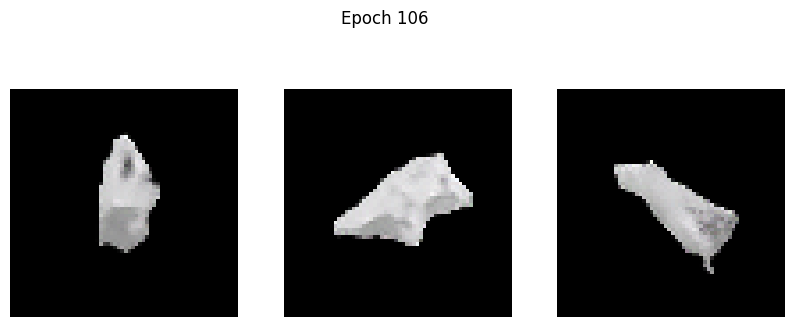

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0445 - g_loss: 2.1317
Epoch 107/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0466 - g_loss: 2.1650

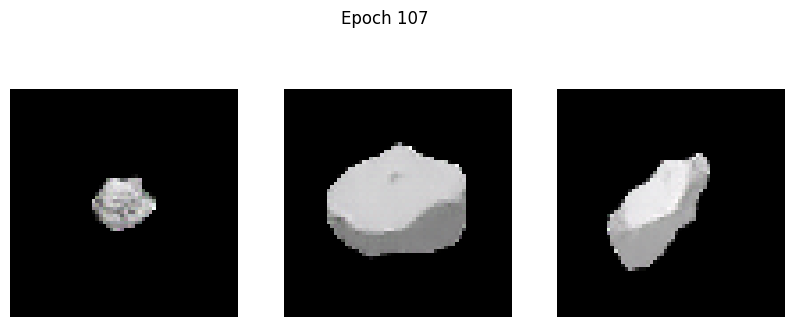

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0470 - g_loss: 2.1653
Epoch 108/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.0285 - g_loss: 2.1194

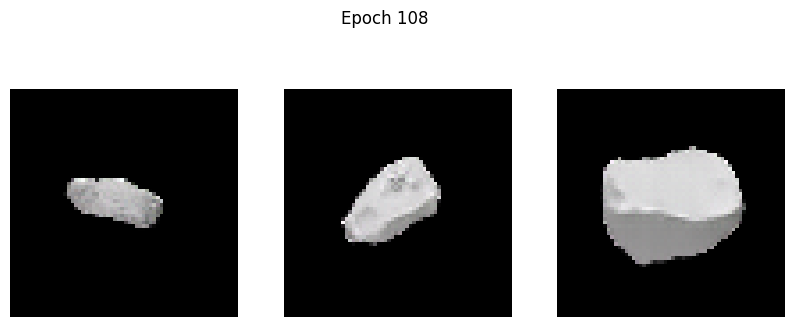

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0286 - g_loss: 2.1201
Epoch 109/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.1741 - g_loss: 2.2304

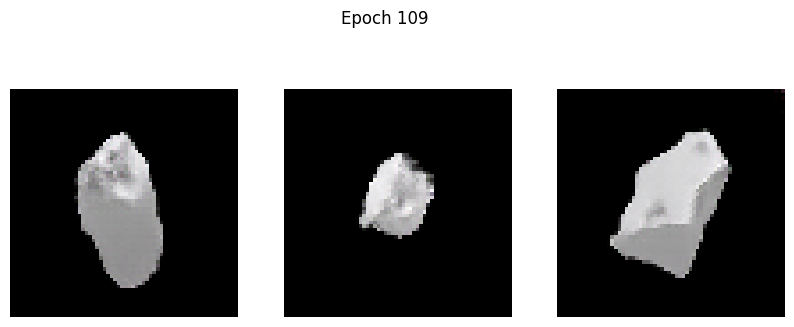

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1738 - g_loss: 2.2305
Epoch 110/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.0460 - g_loss: 2.2458

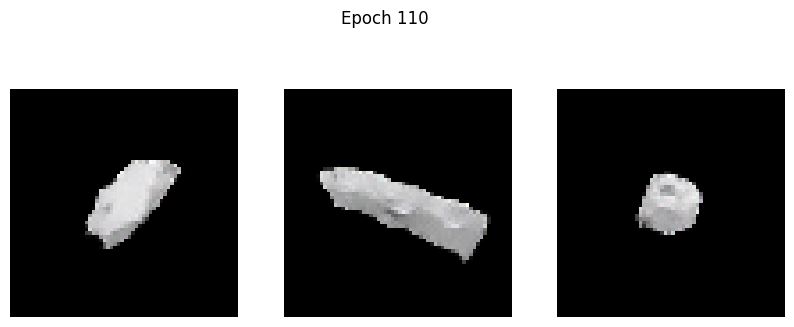

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0455 - g_loss: 2.2461
Epoch 111/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0233 - g_loss: 2.3319

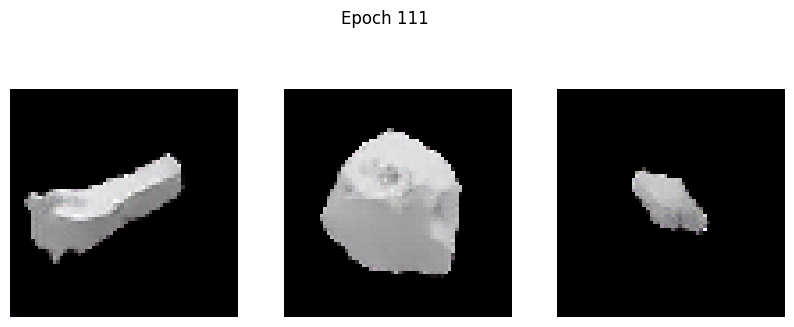

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0226 - g_loss: 2.3325
Epoch 112/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0188 - g_loss: 2.3350

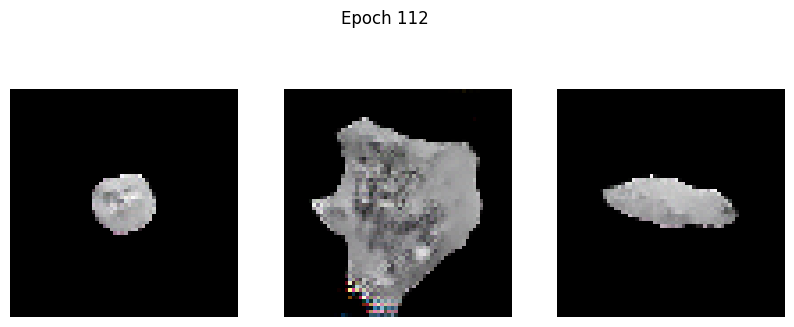

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0187 - g_loss: 2.3354
Epoch 113/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.0181 - g_loss: 2.4595

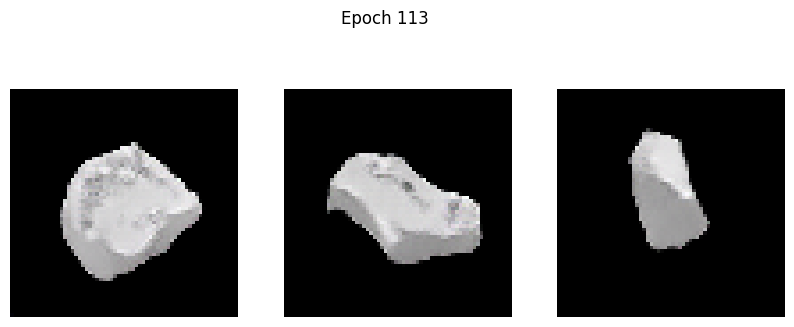

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0174 - g_loss: 2.4599
Epoch 114/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0064 - g_loss: 2.3848

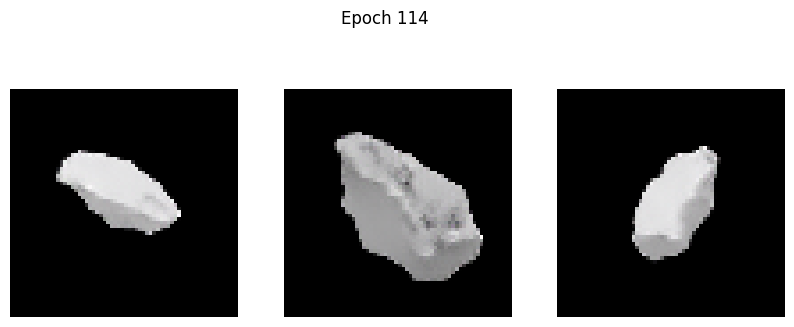

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0067 - g_loss: 2.3847
Epoch 115/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1488 - g_loss: 2.5751

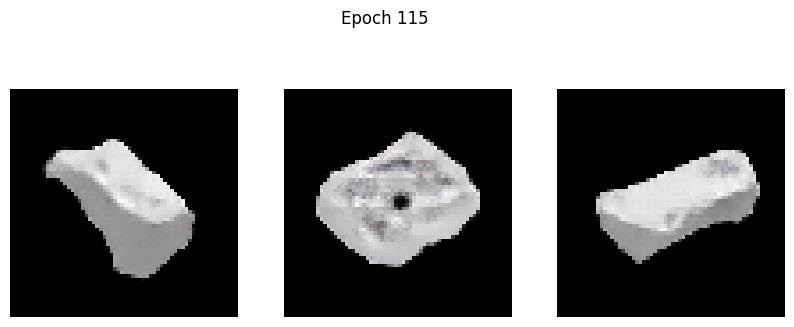

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1499 - g_loss: 2.5763
Epoch 116/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1167 - g_loss: 2.2685

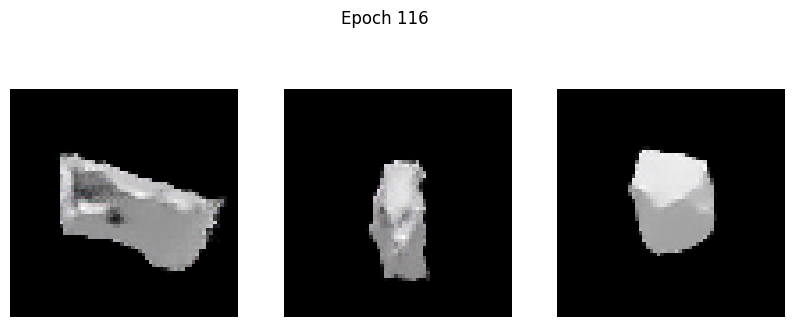

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1167 - g_loss: 2.2686
Epoch 117/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1301 - g_loss: 2.4119

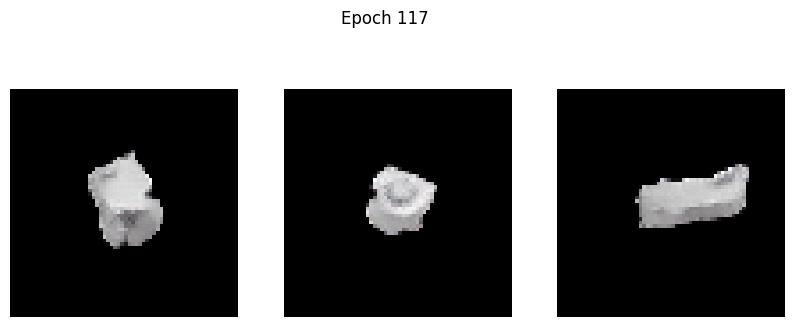

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1299 - g_loss: 2.4125
Epoch 118/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1497 - g_loss: 2.8513

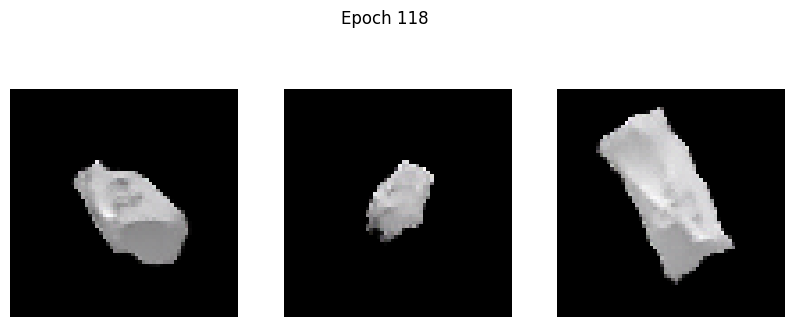

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1510 - g_loss: 2.8512
Epoch 119/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1003 - g_loss: 2.1871

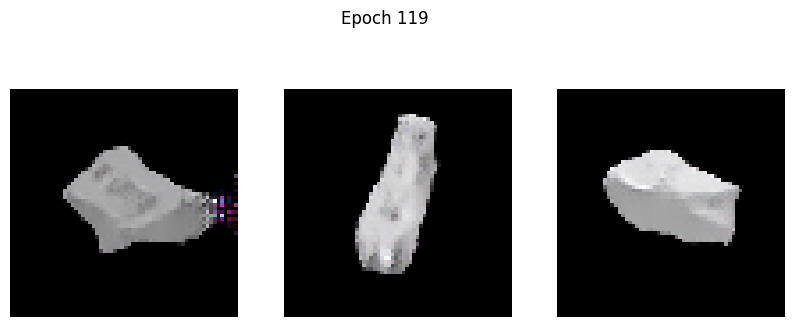

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1007 - g_loss: 2.1875
Epoch 120/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0179 - g_loss: 2.6212

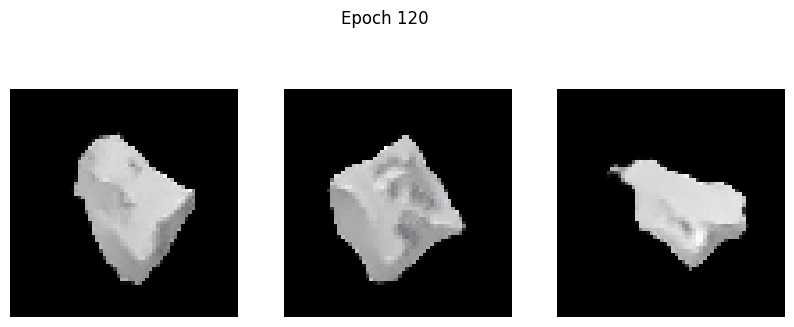

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0180 - g_loss: 2.6205
Epoch 121/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1514 - g_loss: 2.3418

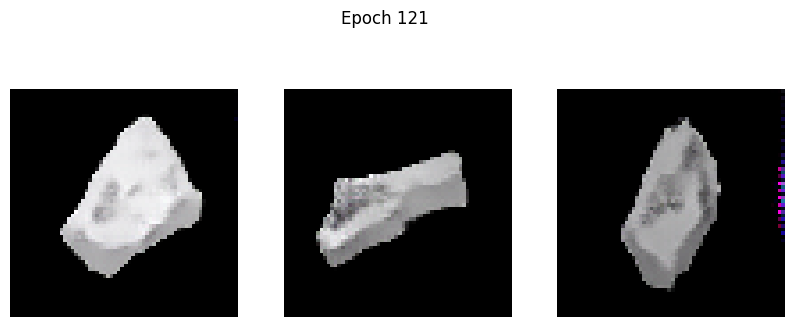

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1514 - g_loss: 2.3428
Epoch 122/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 1.1321 - g_loss: 3.1507

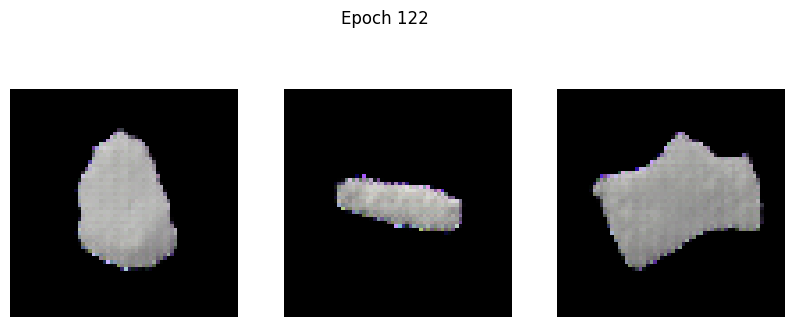

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 1.1454 - g_loss: 3.1576
Epoch 123/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4259 - g_loss: 1.7711

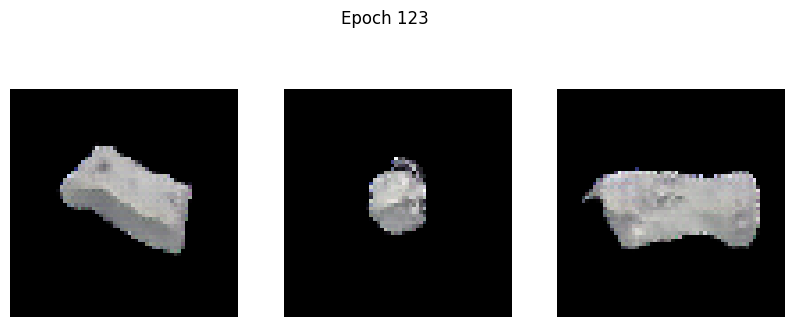

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4249 - g_loss: 1.7703
Epoch 124/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1403 - g_loss: 1.6465

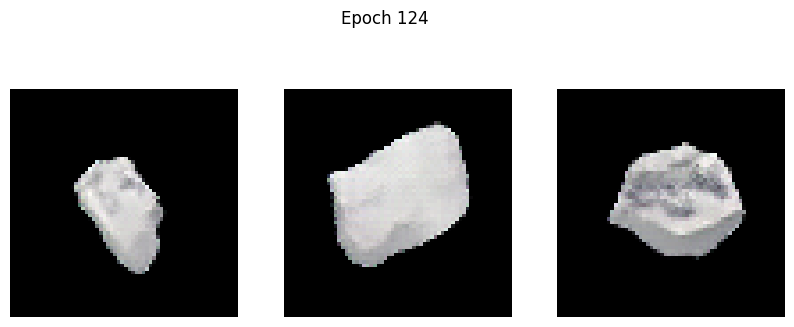

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1399 - g_loss: 1.6467
Epoch 125/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0310 - g_loss: 1.7962

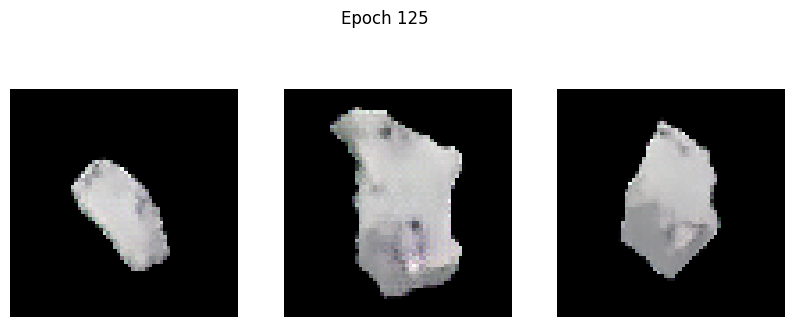

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0306 - g_loss: 1.7962
Epoch 126/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1196 - g_loss: 1.8614

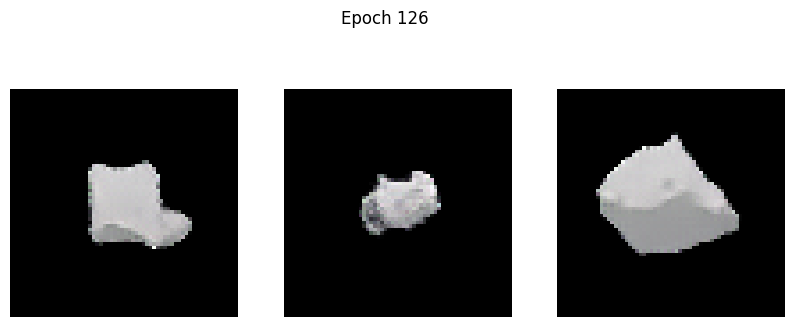

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1195 - g_loss: 1.8615
Epoch 127/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1600 - g_loss: 1.9695

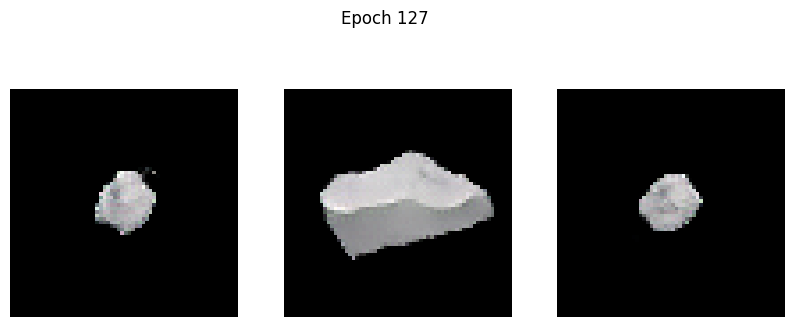

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1597 - g_loss: 1.9692
Epoch 128/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1279 - g_loss: 2.0445

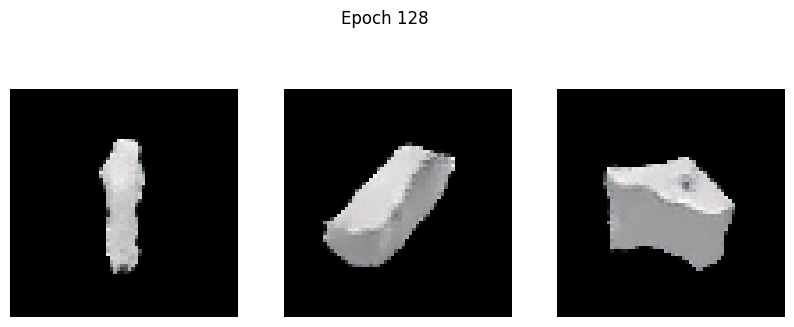

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1278 - g_loss: 2.0445
Epoch 129/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1100 - g_loss: 2.0943

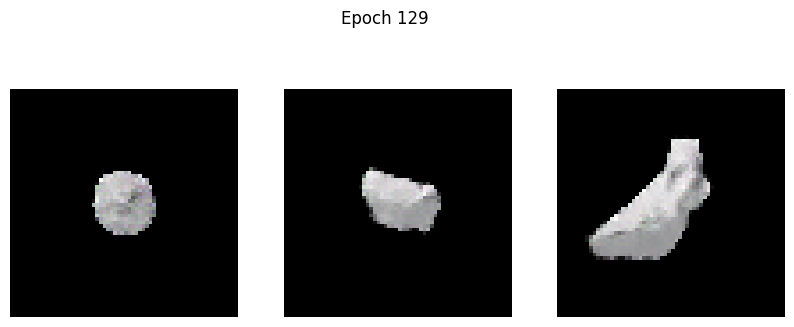

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1112 - g_loss: 2.0942
Epoch 130/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1694 - g_loss: 2.2937

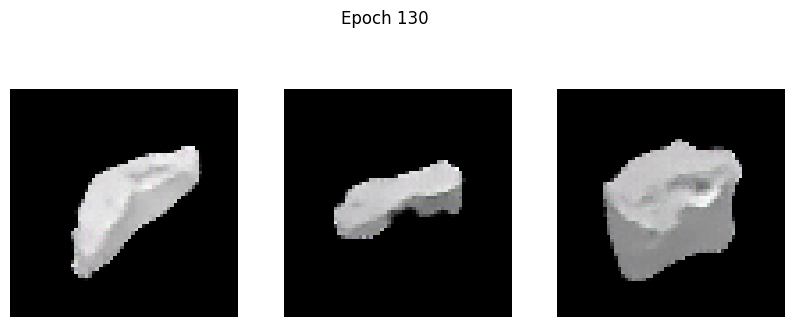

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1690 - g_loss: 2.2936
Epoch 131/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.2493 - g_loss: 2.3152

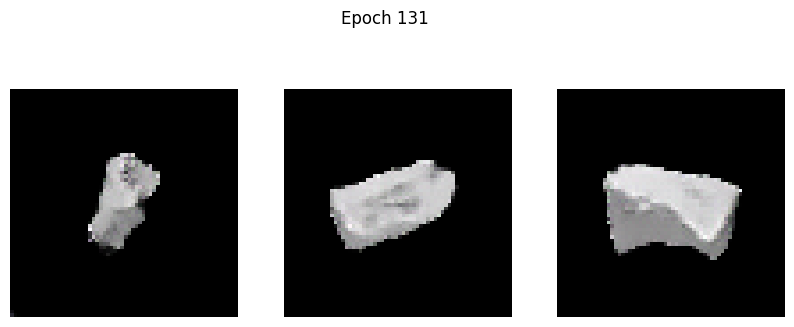

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.2498 - g_loss: 2.3147
Epoch 132/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.2418 - g_loss: 2.3906

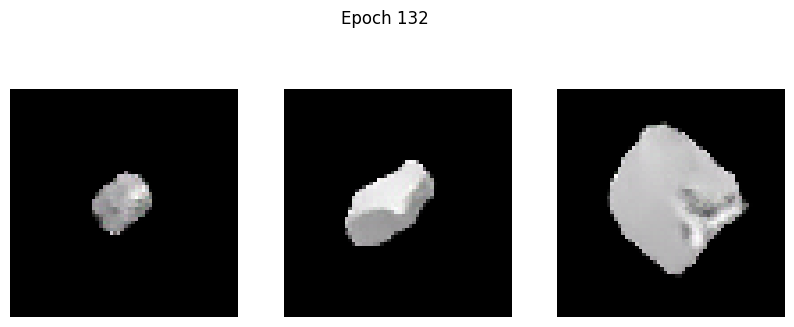

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.2413 - g_loss: 2.3905
Epoch 133/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.2685 - g_loss: 2.3820

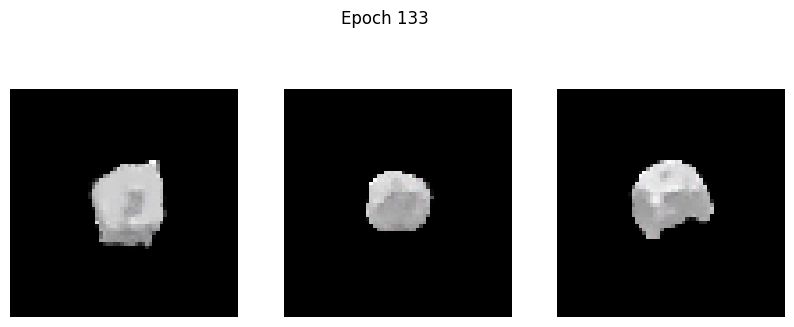

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.2684 - g_loss: 2.3821
Epoch 134/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.3476 - g_loss: 2.3174

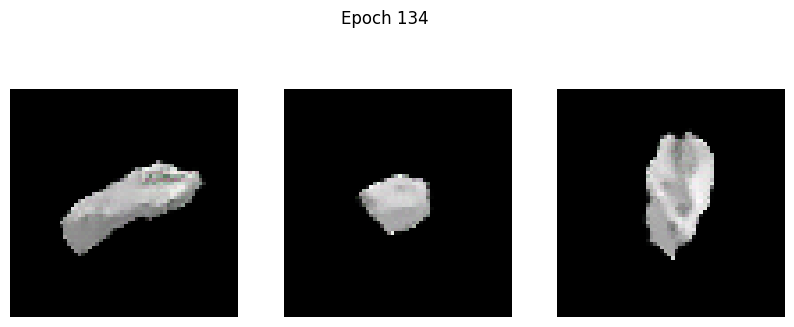

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.3465 - g_loss: 2.3190
Epoch 135/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1797 - g_loss: 2.8176

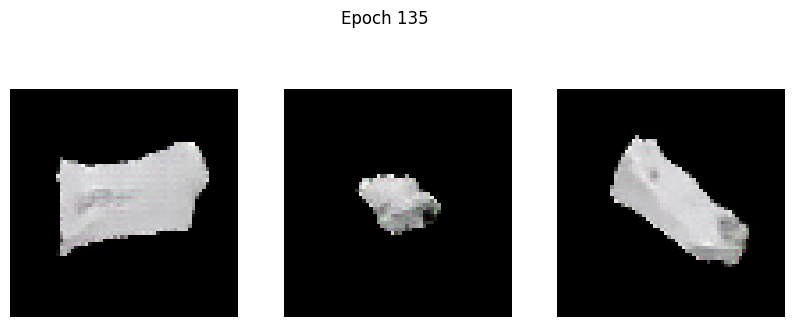

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1764 - g_loss: 2.8147
Epoch 136/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.4526 - g_loss: 2.4341

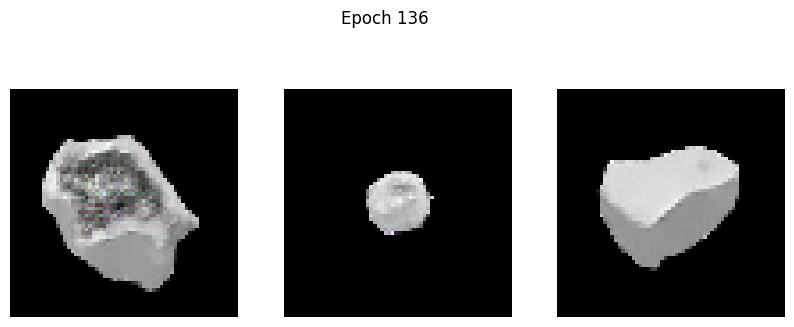

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.4538 - g_loss: 2.4342
Epoch 137/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0407 - g_loss: 2.6915

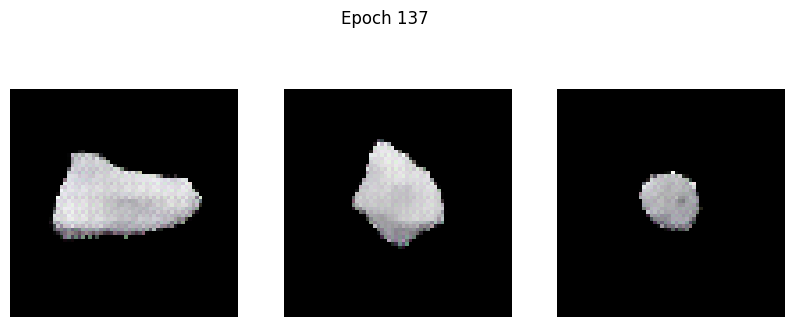

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0505 - g_loss: 2.7022
Epoch 138/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.6313 - g_loss: 3.5470

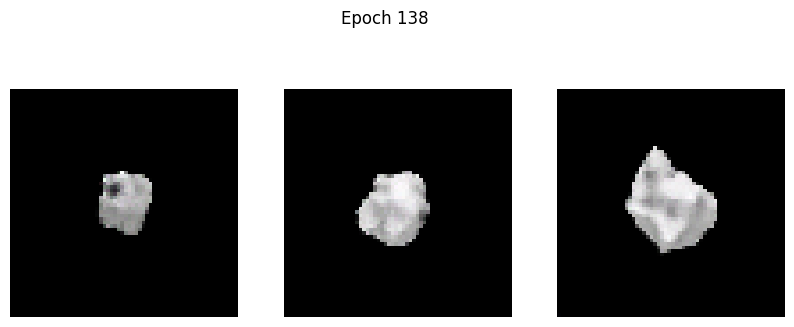

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.6264 - g_loss: 3.5396
Epoch 139/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.2228 - g_loss: 2.3399

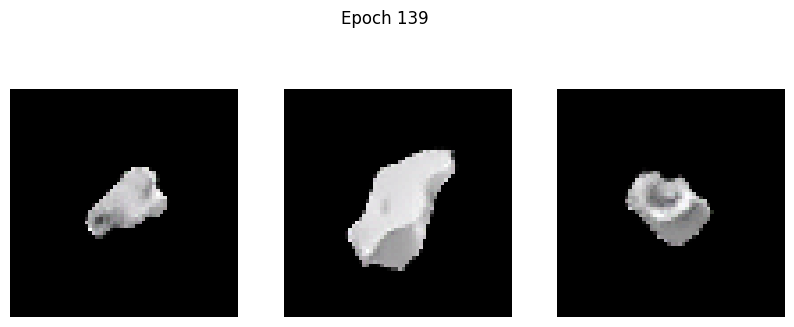

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.2234 - g_loss: 2.3396
Epoch 140/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.3638 - g_loss: 2.3144

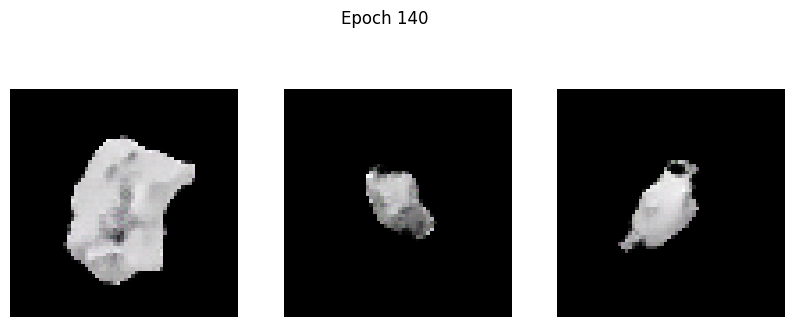

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.3647 - g_loss: 2.3144
Epoch 141/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.5812 - g_loss: 2.3077

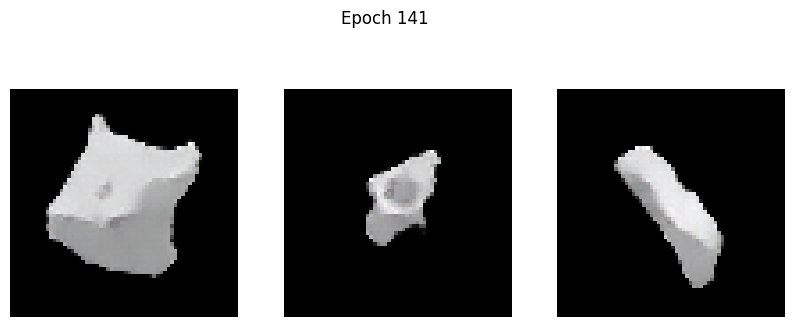

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.5812 - g_loss: 2.3079
Epoch 142/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.6454 - g_loss: 2.4695

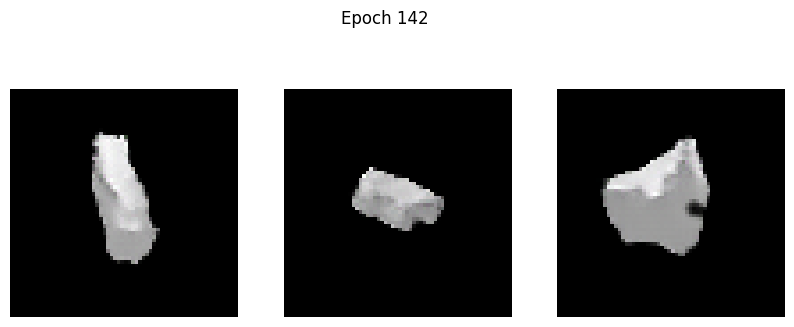

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.6454 - g_loss: 2.4692
Epoch 143/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.7043 - g_loss: 2.6688

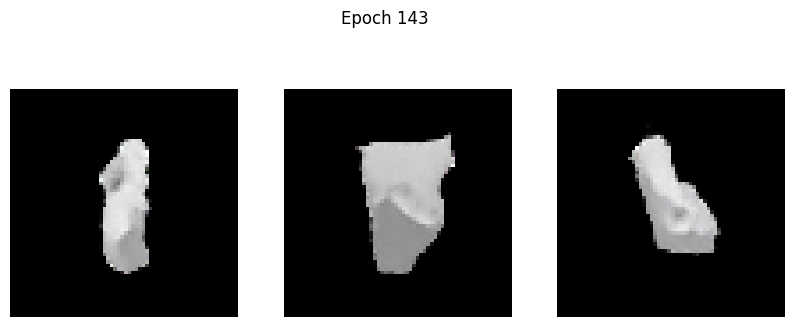

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.7043 - g_loss: 2.6686
Epoch 144/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 1.1375 - g_loss: 3.7107

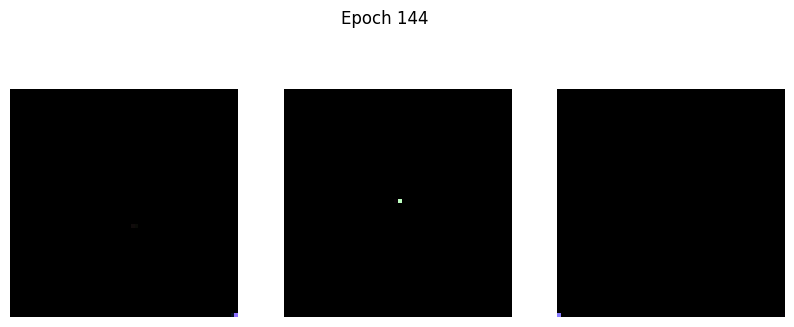

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 1.2218 - g_loss: 3.7791
Epoch 145/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1953 - g_loss: 10.4128

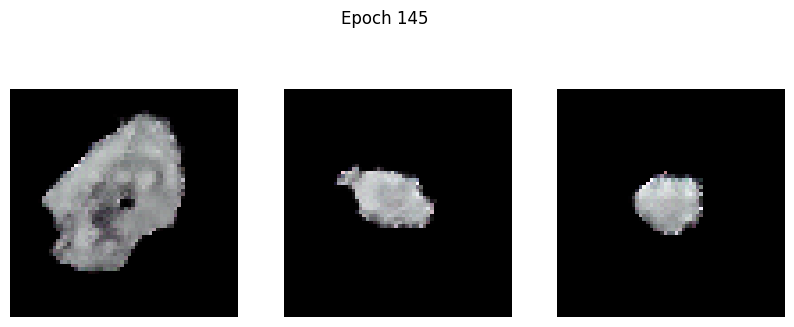

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1889 - g_loss: 10.3876
Epoch 146/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4247 - g_loss: 3.0440

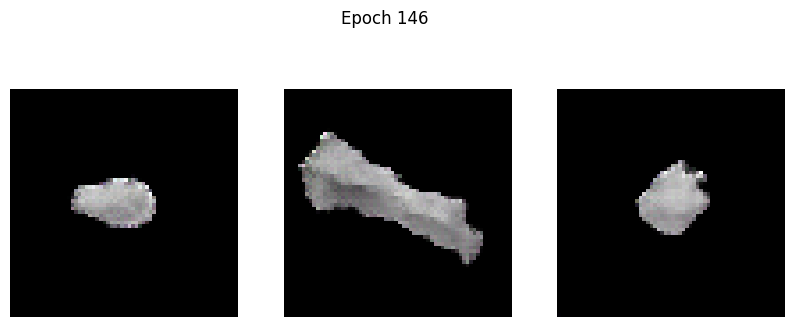

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4226 - g_loss: 3.0396
Epoch 147/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0128 - g_loss: 1.9925

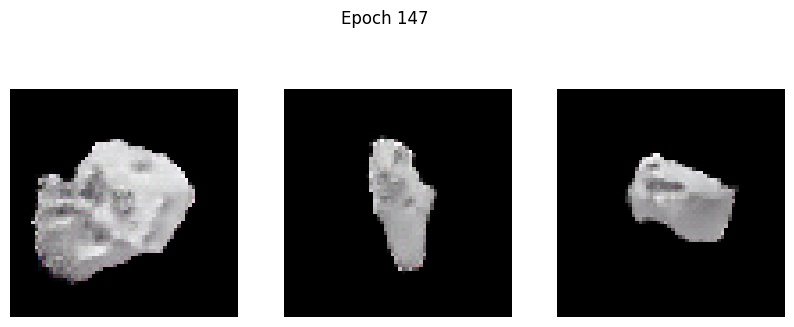

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.0133 - g_loss: 1.9922
Epoch 148/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0405 - g_loss: 1.8918

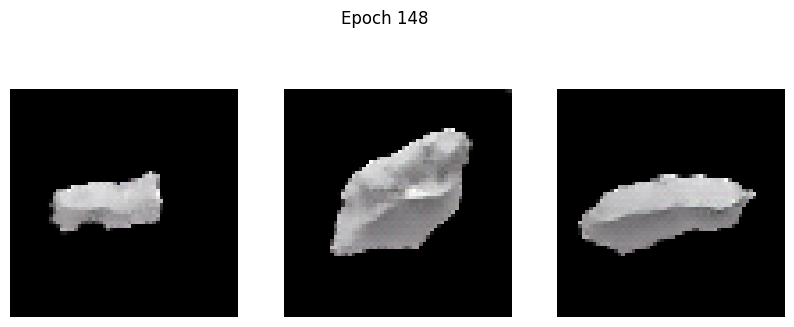

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0417 - g_loss: 1.8922
Epoch 149/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.3984 - g_loss: 1.9920

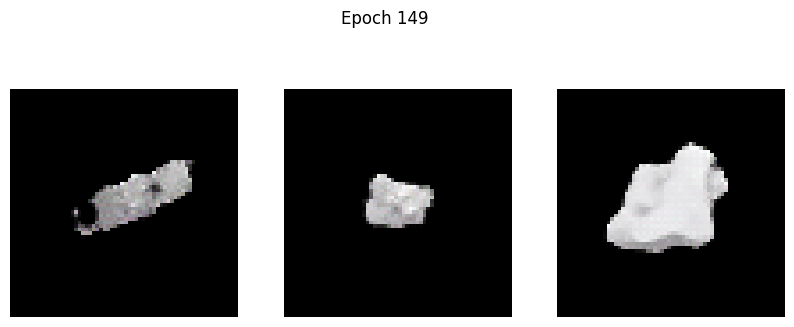

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.3984 - g_loss: 1.9923
Epoch 150/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.1790 - g_loss: 2.0831

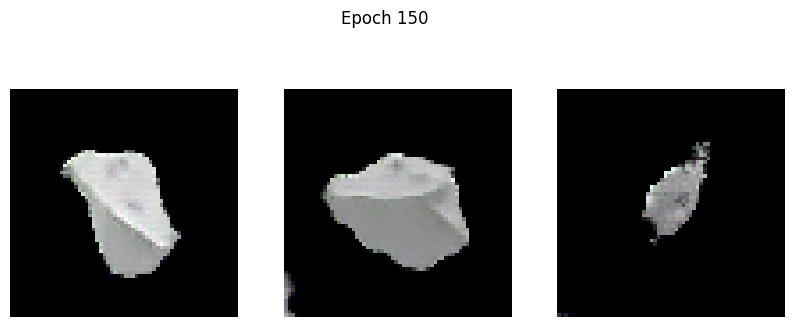

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.1739 - g_loss: 2.0847
Epoch 151/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.3192 - g_loss: 2.1085

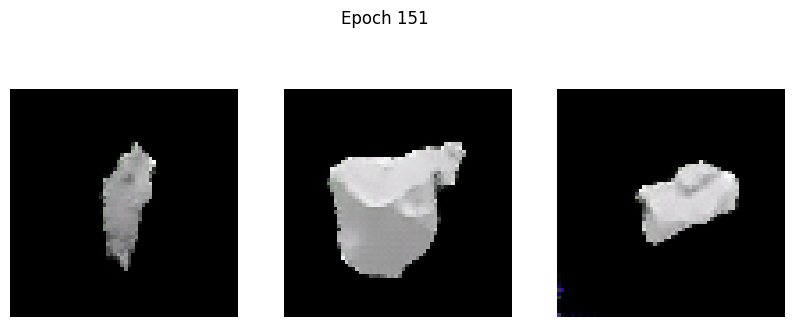

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.3192 - g_loss: 2.1090
Epoch 152/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.5641 - g_loss: 2.1496

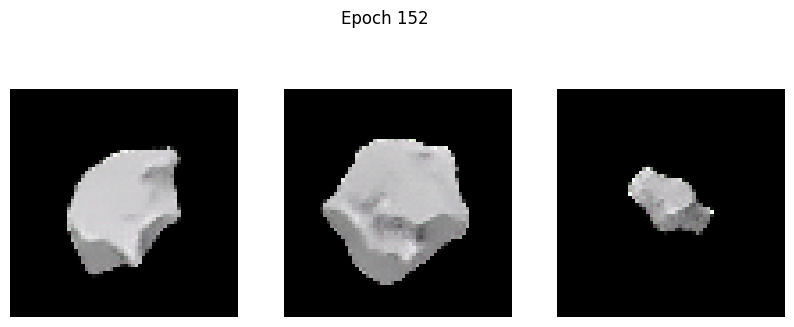

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.5633 - g_loss: 2.1495
Epoch 153/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.3773 - g_loss: 2.1977

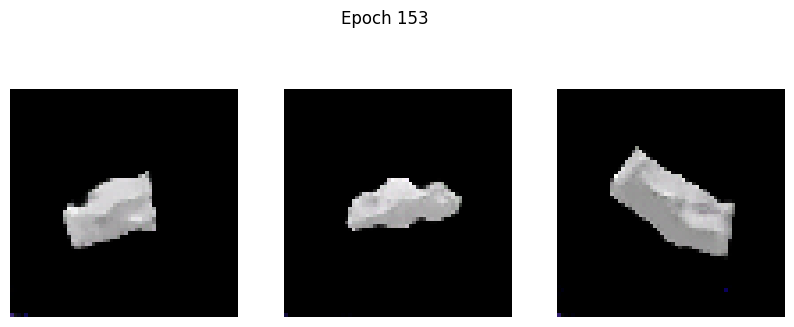

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.3785 - g_loss: 2.1979
Epoch 154/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.5938 - g_loss: 2.1664

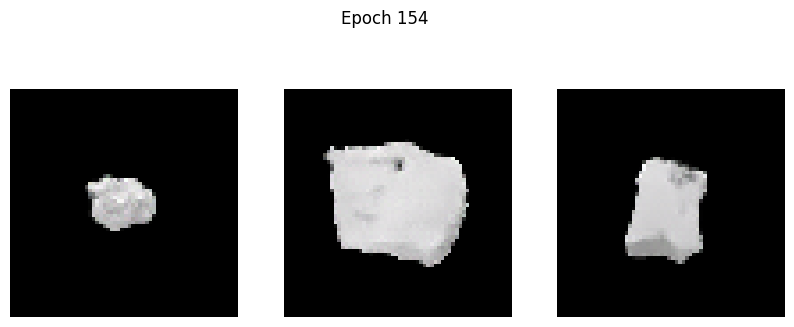

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.5935 - g_loss: 2.1669
Epoch 155/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.6470 - g_loss: 2.2396

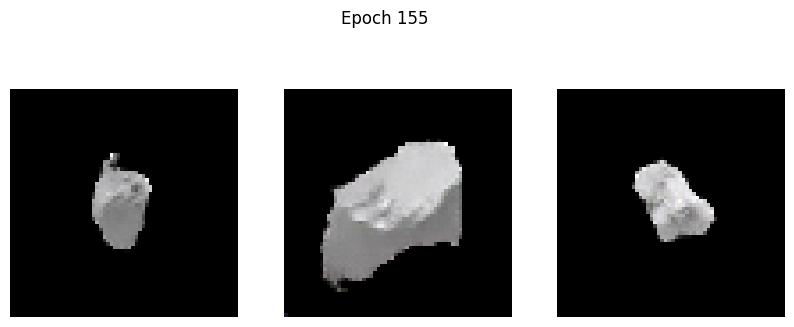

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.6480 - g_loss: 2.2398
Epoch 156/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.6310 - g_loss: 2.2910

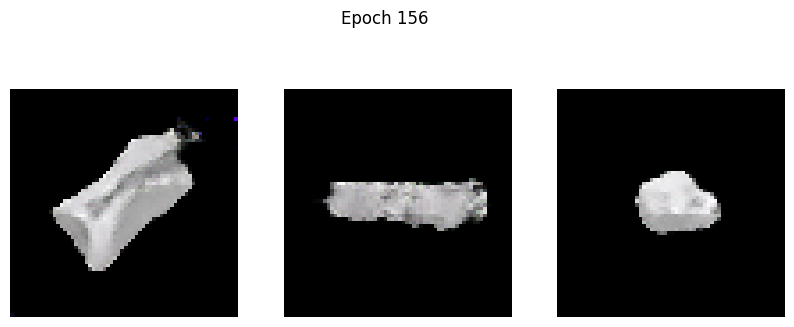

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.6326 - g_loss: 2.2912
Epoch 157/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.8846 - g_loss: 2.2507

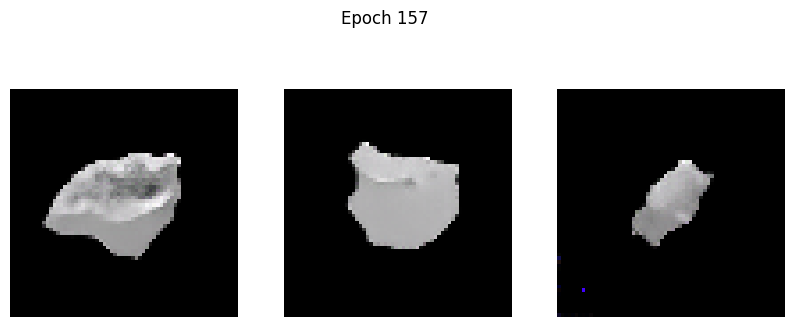

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.8837 - g_loss: 2.2511
Epoch 158/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.8312 - g_loss: 2.4234

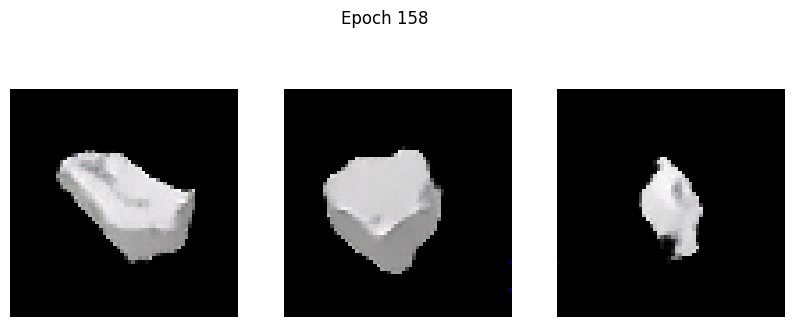

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.8299 - g_loss: 2.4237
Epoch 159/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.2834 - g_loss: 2.7929

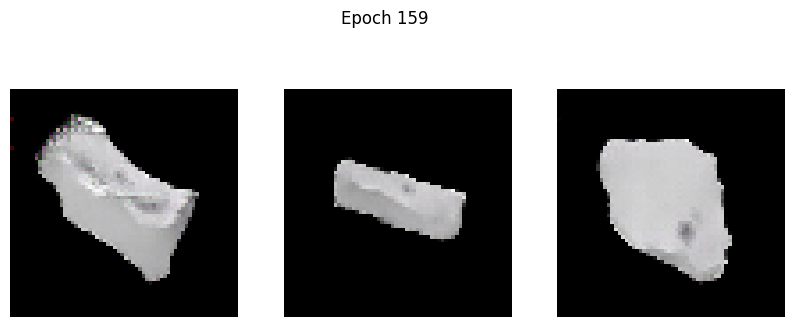

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.2860 - g_loss: 2.7916
Epoch 160/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.2106 - g_loss: 2.4379

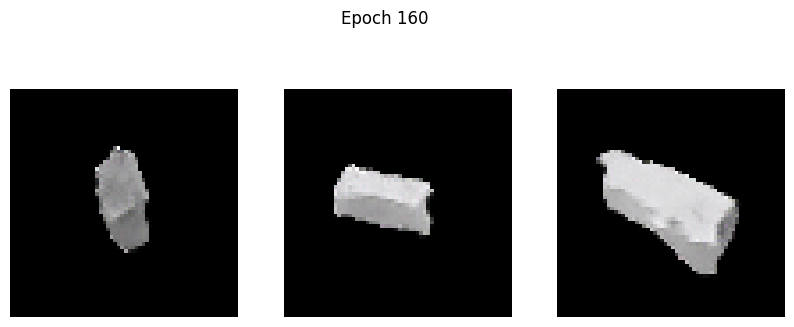

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.2086 - g_loss: 2.4373
Epoch 161/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -1.0203 - g_loss: 2.3557

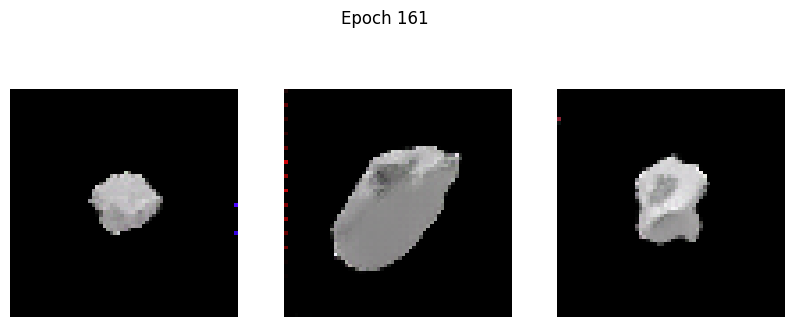

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - d_loss: -1.0191 - g_loss: 2.3562
Epoch 162/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.5698 - g_loss: 2.6330

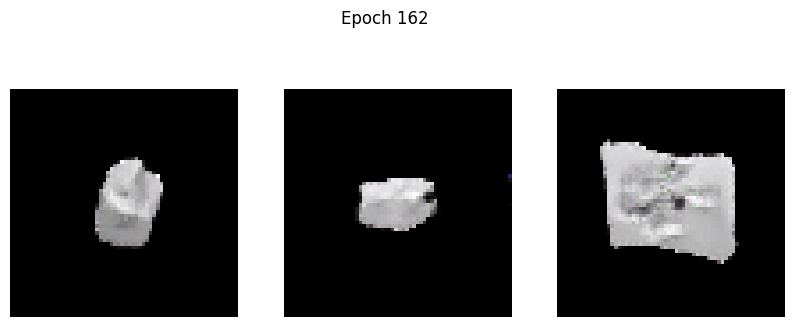

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.5678 - g_loss: 2.6336
Epoch 163/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.8036 - g_loss: 2.9164

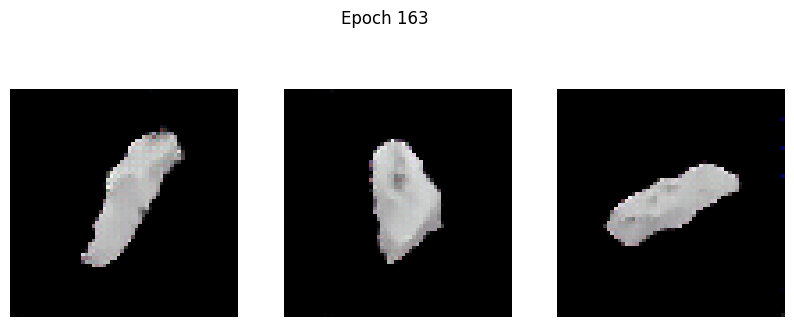

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.7947 - g_loss: 2.9171
Epoch 164/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.4269 - g_loss: 2.8184

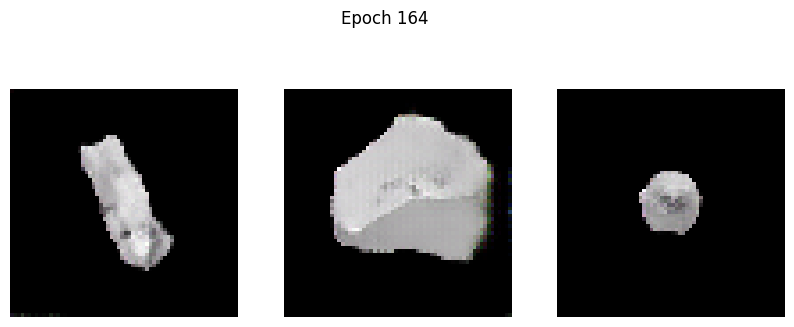

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.4297 - g_loss: 2.8154
Epoch 165/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.9149 - g_loss: 2.4471

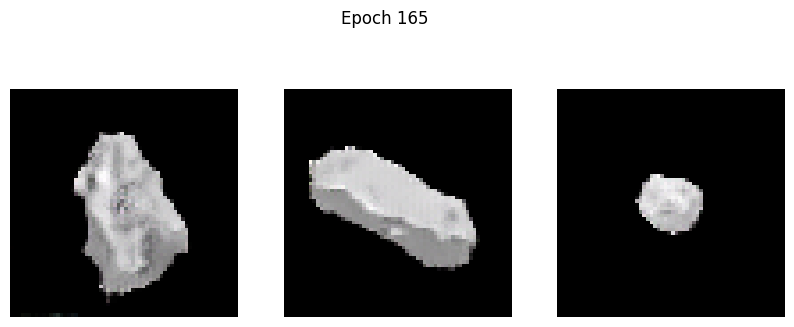

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -0.9160 - g_loss: 2.4470
Epoch 166/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.0315 - g_loss: 2.6387

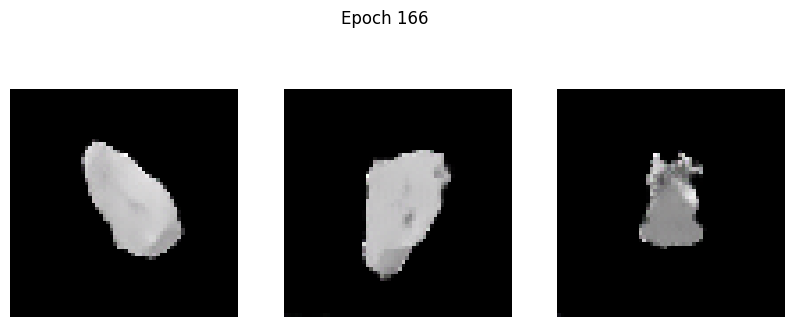

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.0292 - g_loss: 2.6386
Epoch 167/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.2647 - g_loss: 2.5946

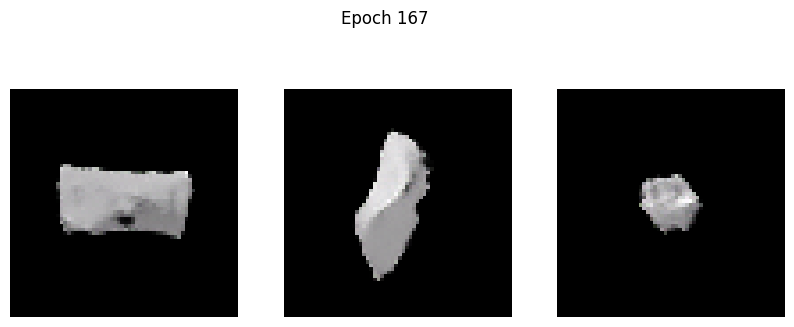

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.2650 - g_loss: 2.5952
Epoch 168/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.0316 - g_loss: 2.8232

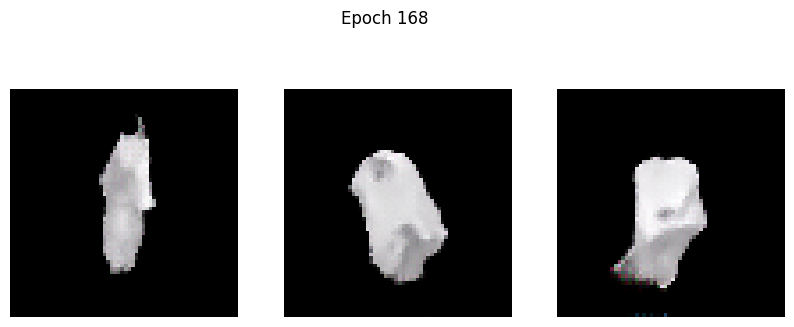

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.0265 - g_loss: 2.8271
Epoch 169/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.5176 - g_loss: 2.5440

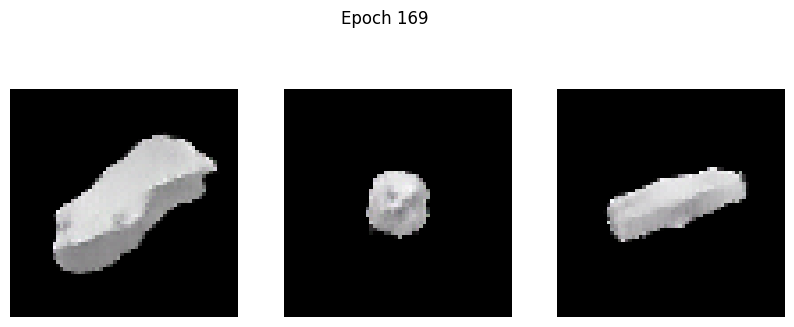

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.5167 - g_loss: 2.5440
Epoch 170/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.4622 - g_loss: 2.8375

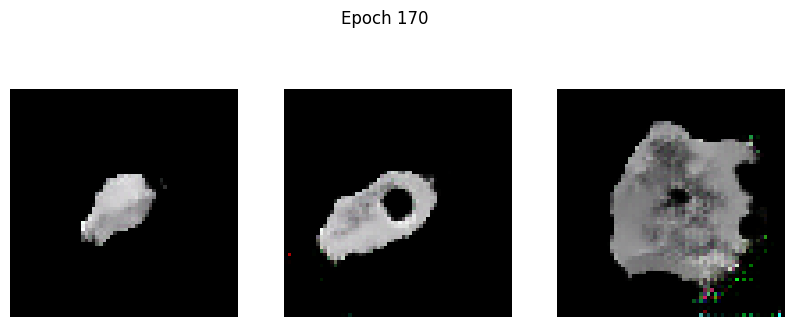

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.4592 - g_loss: 2.8375
Epoch 171/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.7461 - g_loss: 3.0184

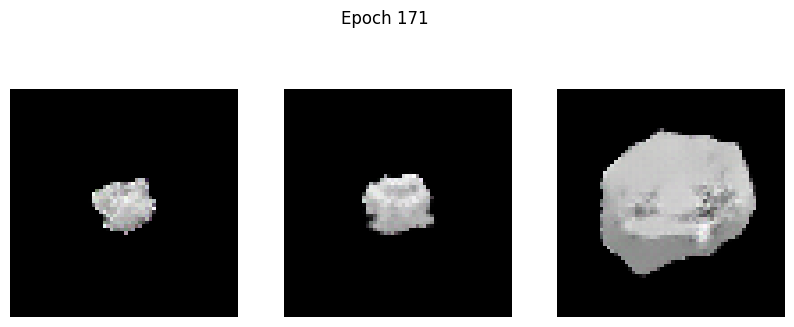

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.7489 - g_loss: 3.0169
Epoch 172/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.1781 - g_loss: 2.6357

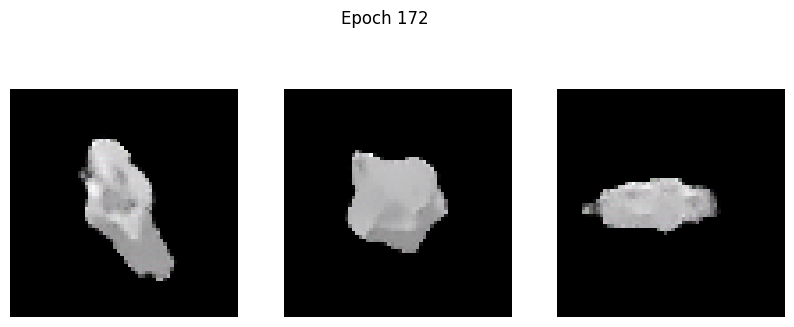

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.1805 - g_loss: 2.6365
Epoch 173/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.3393 - g_loss: 2.9376

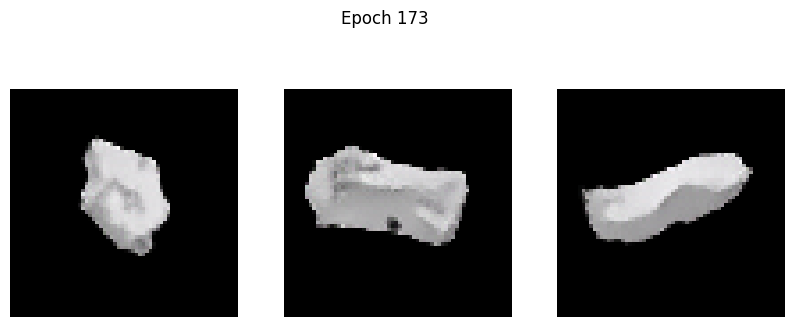

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.3398 - g_loss: 2.9371
Epoch 174/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.5819 - g_loss: 2.7372

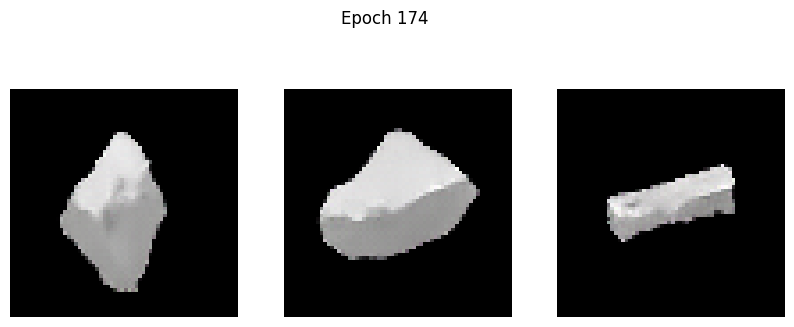

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.5820 - g_loss: 2.7383
Epoch 175/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.5047 - g_loss: 3.0557

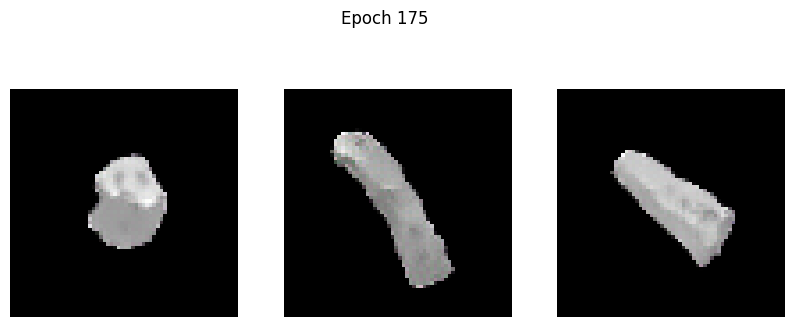

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.5026 - g_loss: 3.0553
Epoch 176/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2614 - g_loss: 4.2441

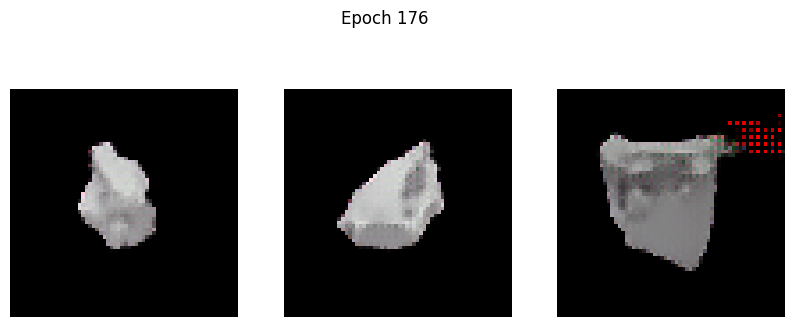

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2571 - g_loss: 4.2369
Epoch 177/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.6167 - g_loss: 2.5759

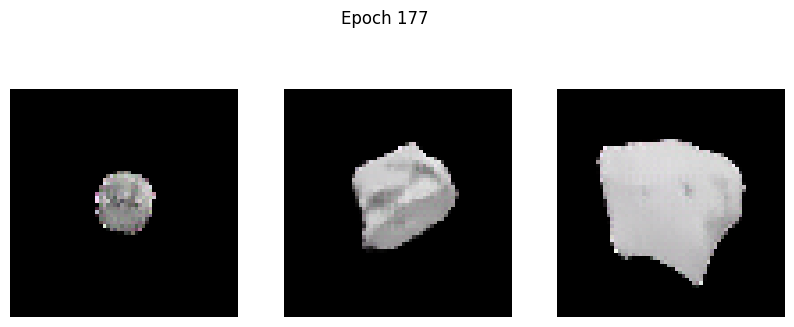

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.6177 - g_loss: 2.5762
Epoch 178/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.8734 - g_loss: 2.7095

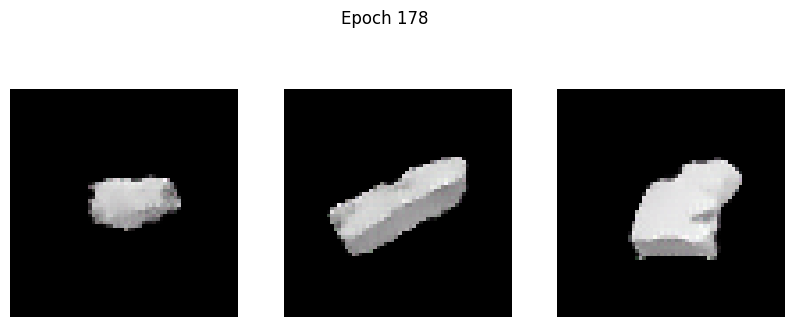

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.8722 - g_loss: 2.7106
Epoch 179/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.5340 - g_loss: 2.7257

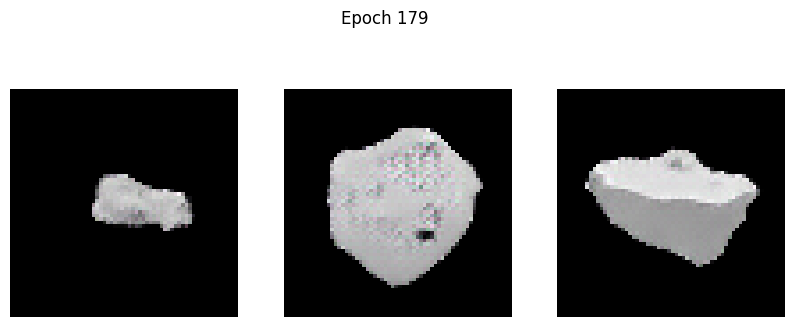

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.5371 - g_loss: 2.7277
Epoch 180/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.5297 - g_loss: 3.0369

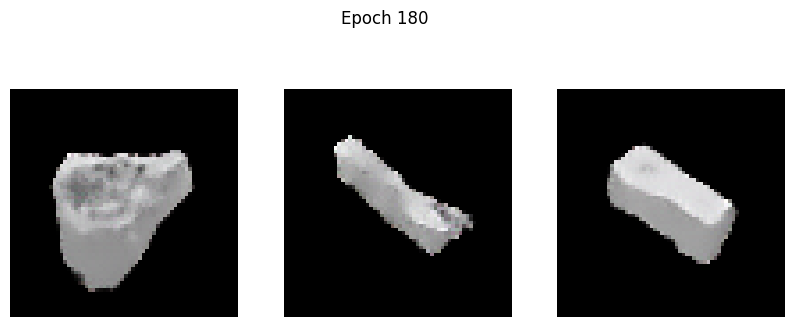

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.5354 - g_loss: 3.0365
Epoch 181/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -2.0617 - g_loss: 3.0231

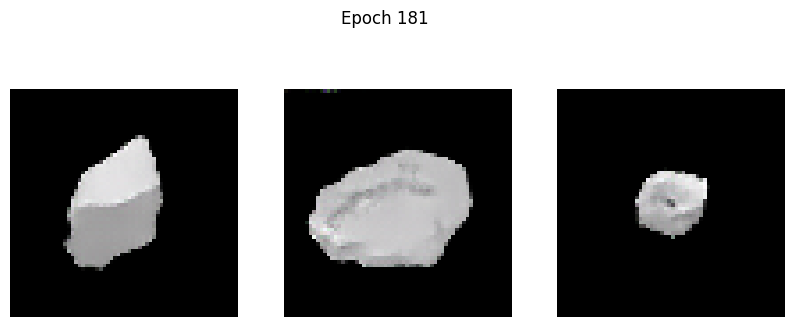

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.0624 - g_loss: 3.0231
Epoch 182/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.8789 - g_loss: 4.0179

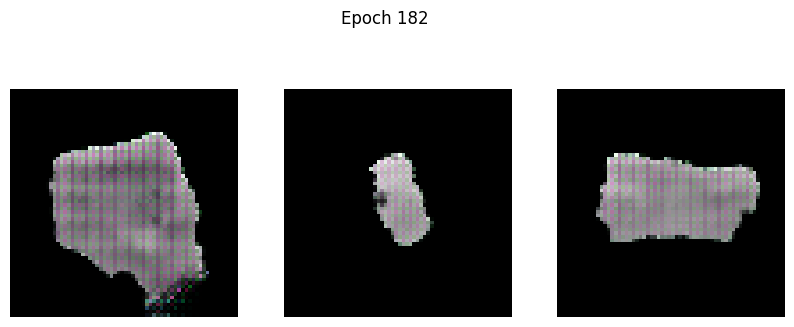

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.8281 - g_loss: 4.0492
Epoch 183/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.6273 - g_loss: 4.6736

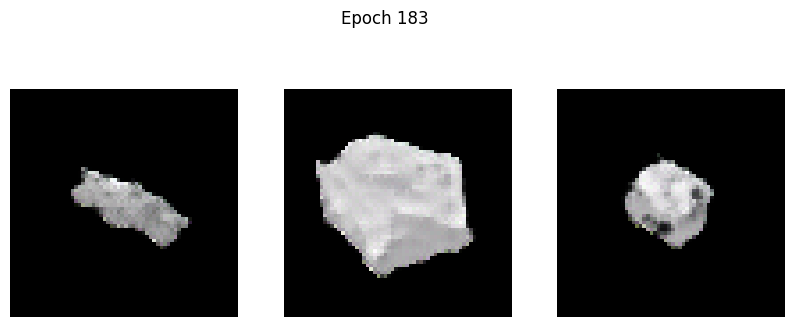

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6196 - g_loss: 4.6634
Epoch 184/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.9484 - g_loss: 2.4424

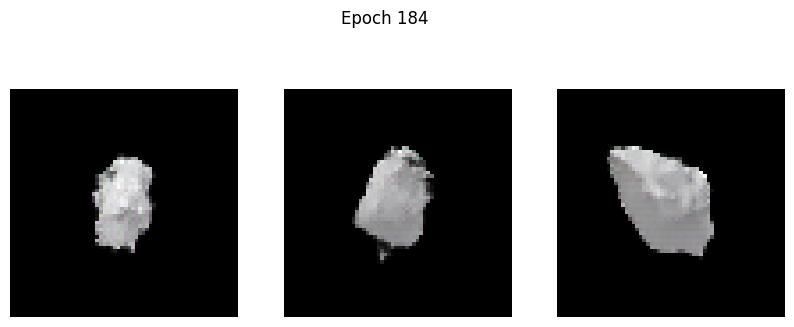

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.9459 - g_loss: 2.4411
Epoch 185/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.9269 - g_loss: 2.3442

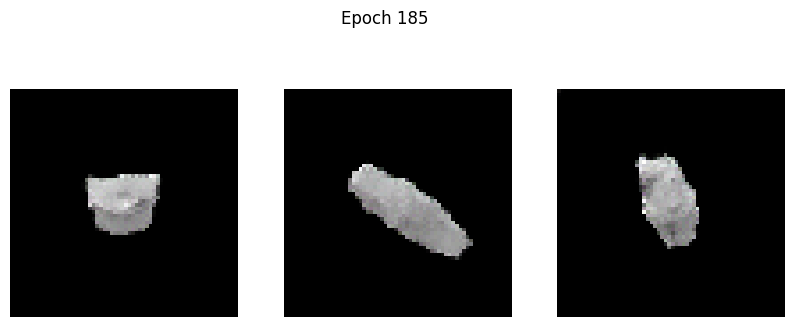

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.9311 - g_loss: 2.3437
Epoch 186/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.2156 - g_loss: 2.2527

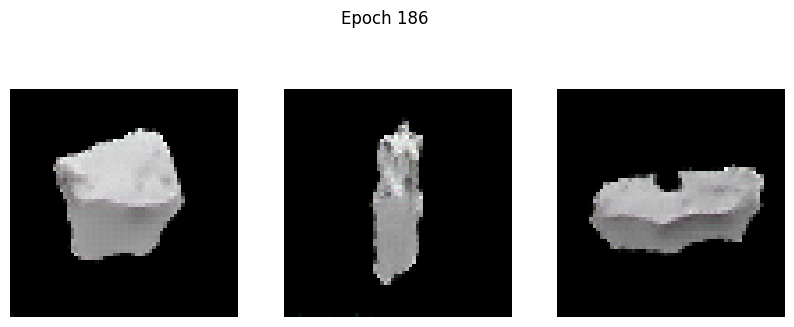

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.2192 - g_loss: 2.2535
Epoch 187/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.9551 - g_loss: 2.4585

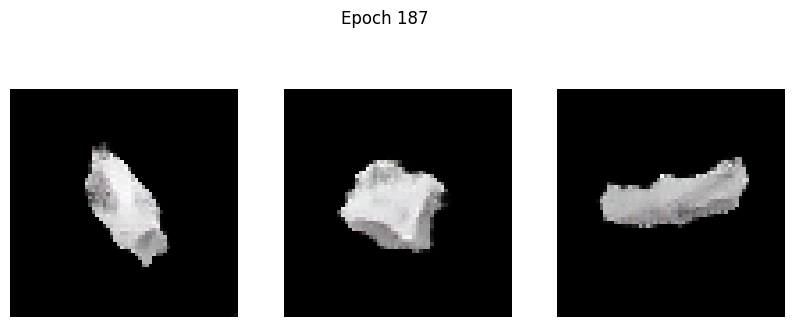

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.9632 - g_loss: 2.4587
Epoch 188/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.6857 - g_loss: 2.6473

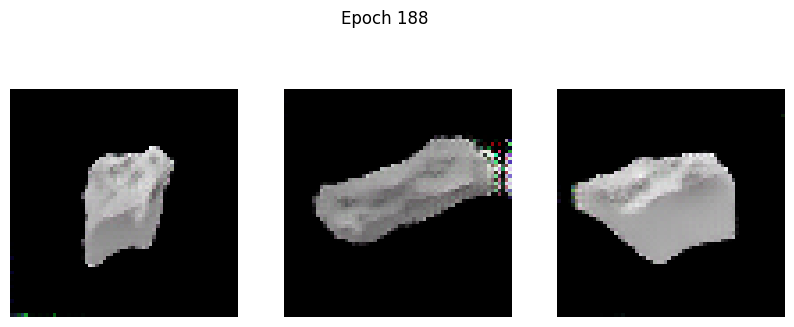

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.6849 - g_loss: 2.6478
Epoch 189/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.1625 - g_loss: 3.6663

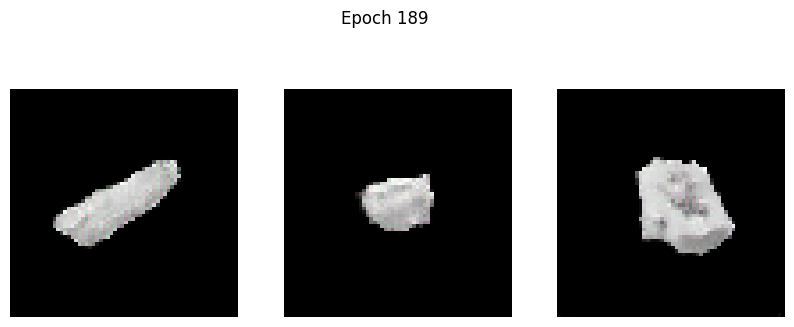

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.1654 - g_loss: 3.6633
Epoch 190/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.0968 - g_loss: 2.8918

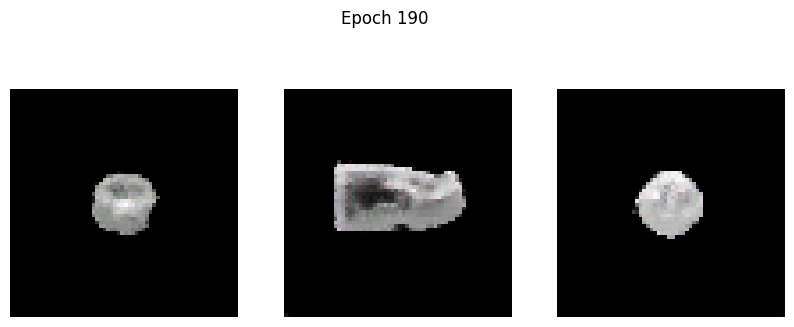

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.1016 - g_loss: 2.8912
Epoch 191/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.6747 - g_loss: 2.7523

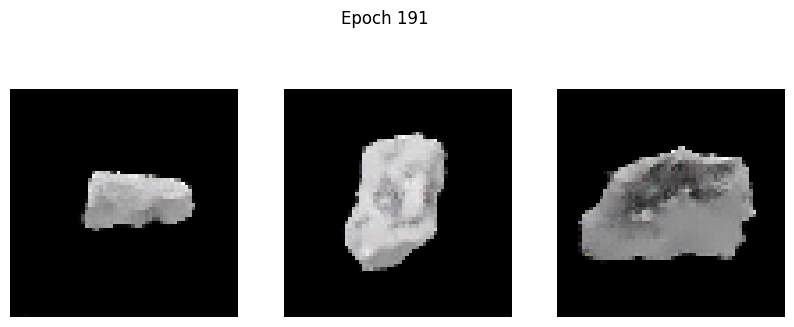

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.6788 - g_loss: 2.7524
Epoch 192/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.5171 - g_loss: 2.7837

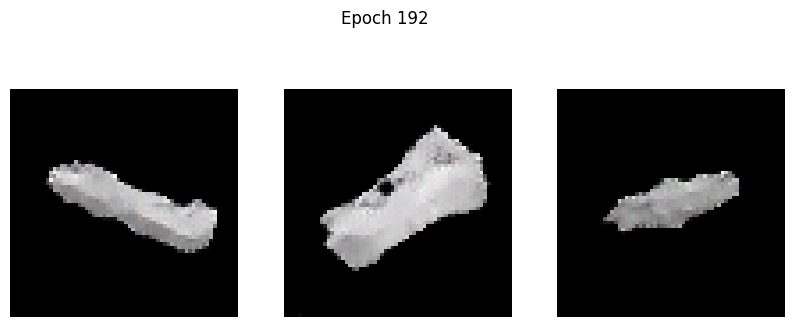

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.5157 - g_loss: 2.7845
Epoch 193/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.0769 - g_loss: 2.9937

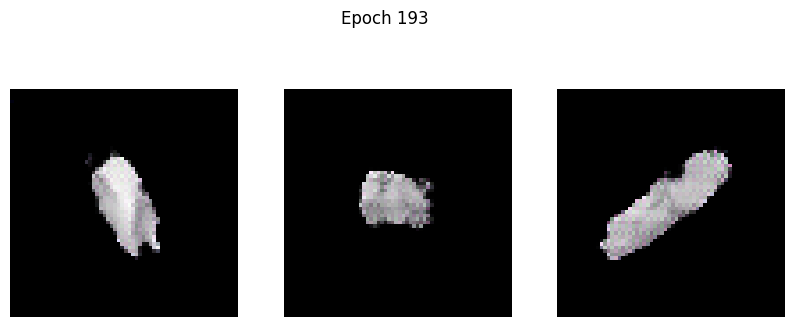

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.0671 - g_loss: 2.9973
Epoch 194/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.0708 - g_loss: 4.5574

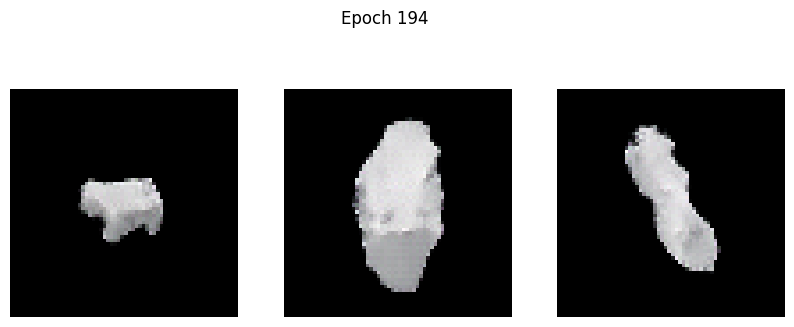

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.0812 - g_loss: 4.5510
Epoch 195/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.4883 - g_loss: 2.7564

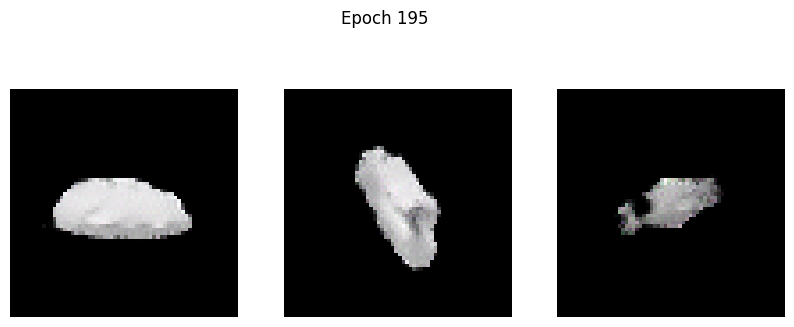

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.4887 - g_loss: 2.7559
Epoch 196/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.7312 - g_loss: 2.8617

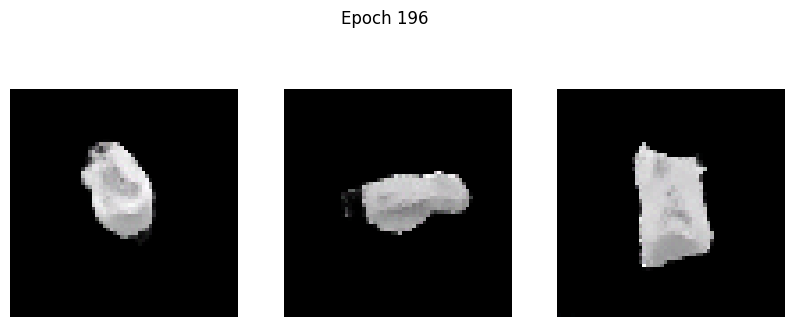

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.7401 - g_loss: 2.8608
Epoch 197/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.4758 - g_loss: 2.8310

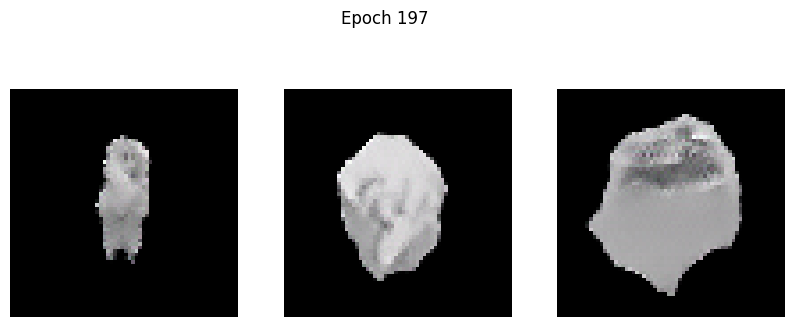

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.4847 - g_loss: 2.8319
Epoch 198/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.5045 - g_loss: 3.3506

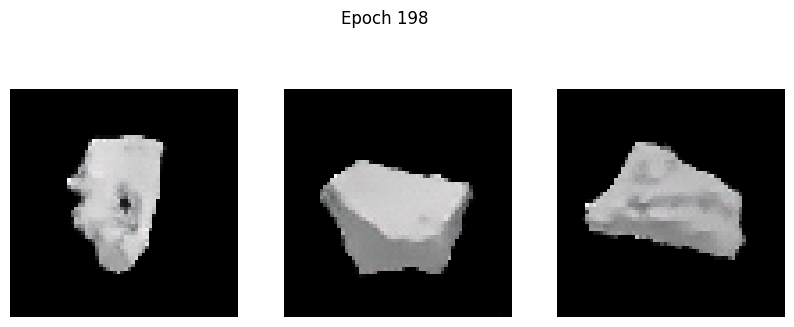

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -3.5002 - g_loss: 3.3515
Epoch 199/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.3533 - g_loss: 3.0686

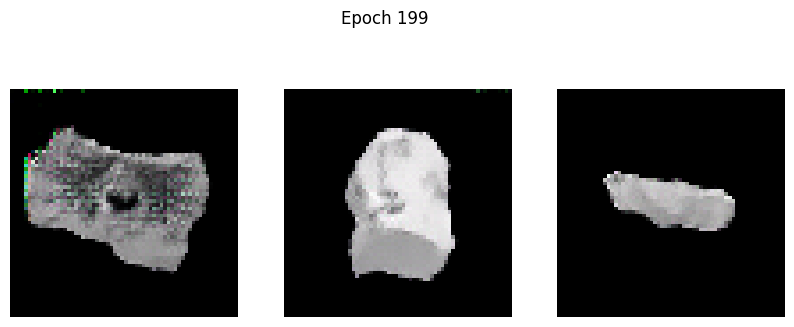

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.3644 - g_loss: 3.0678
Epoch 200/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.9674 - g_loss: 3.7966

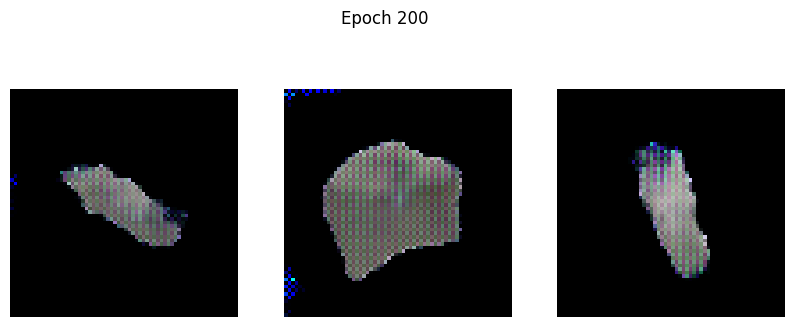

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.9195 - g_loss: 3.8081
Epoch 201/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 1.0039 - g_loss: 6.5813

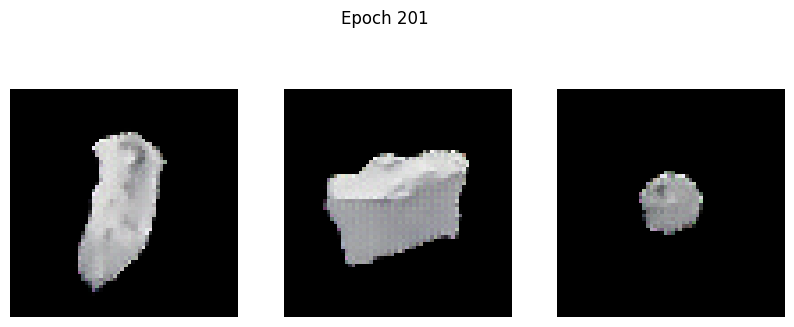

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.9851 - g_loss: 6.5612
Epoch 202/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.6038 - g_loss: 2.6569

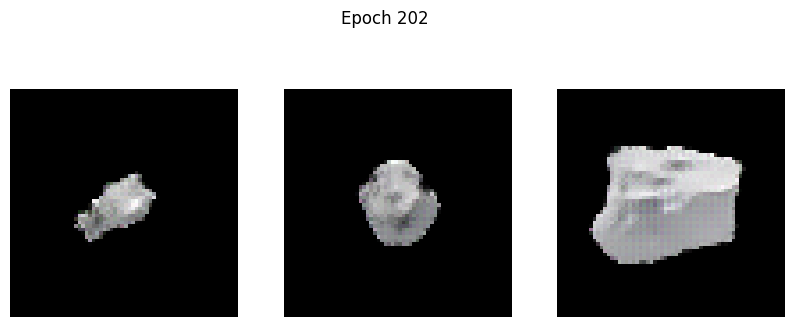

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.6088 - g_loss: 2.6566
Epoch 203/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -4.6387 - g_loss: 2.4722

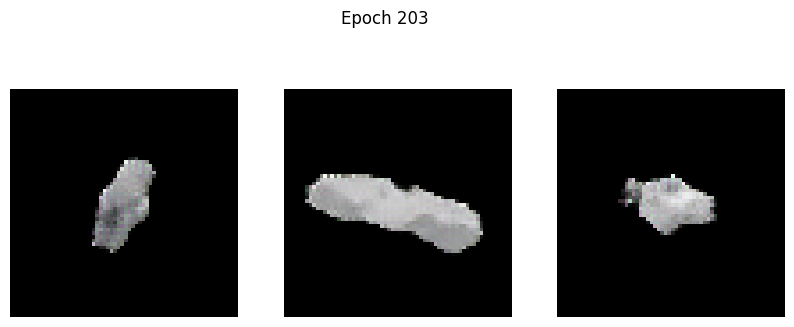

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -4.6350 - g_loss: 2.4725
Epoch 204/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.3624 - g_loss: 4.3701

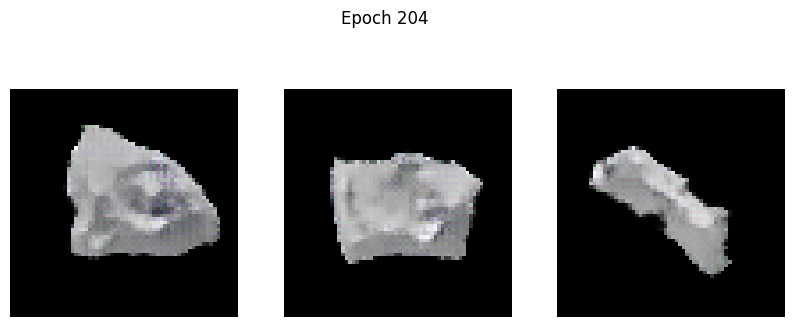

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.3547 - g_loss: 4.3799
Epoch 205/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -4.0785 - g_loss: 2.8091

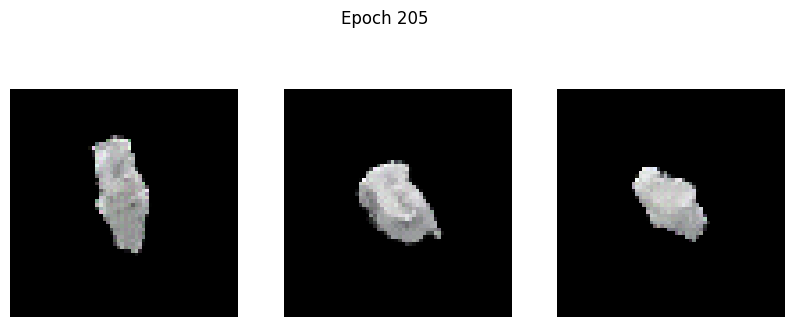

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -4.0833 - g_loss: 2.8087
Epoch 206/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -4.6083 - g_loss: 2.7464

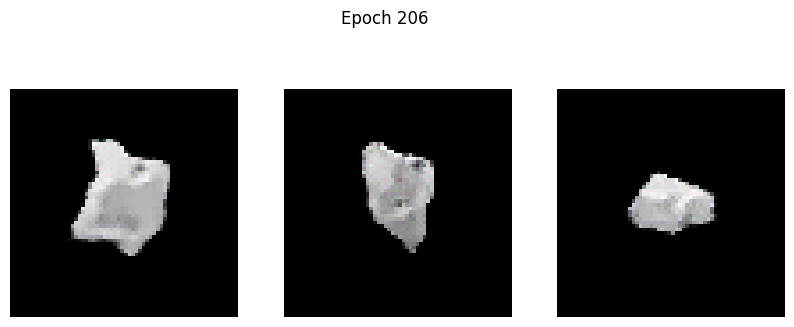

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -4.6084 - g_loss: 2.7466
Epoch 207/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -6.0336 - g_loss: 2.8255

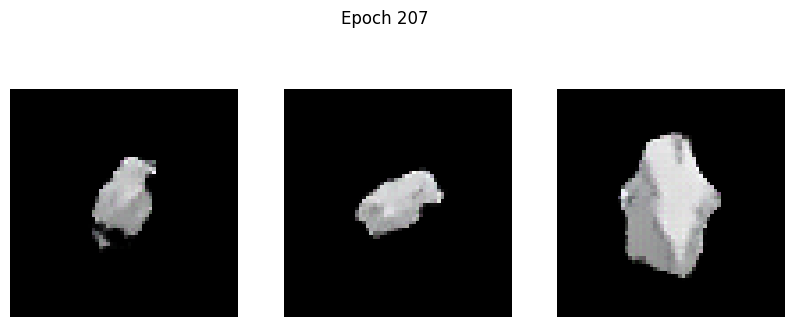

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -6.0255 - g_loss: 2.8275
Epoch 208/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -4.9811 - g_loss: 3.3043

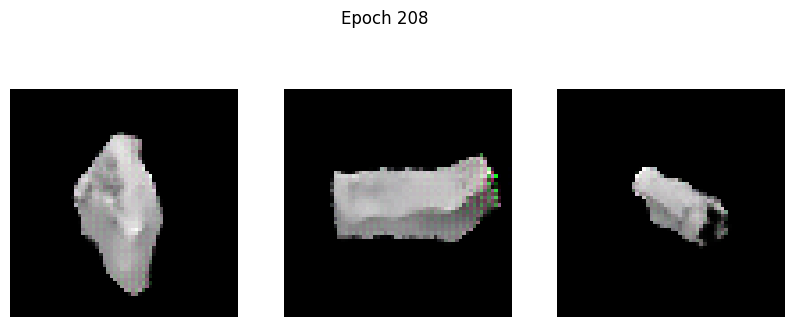

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -4.9750 - g_loss: 3.3052
Epoch 209/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -4.3794 - g_loss: 3.3897

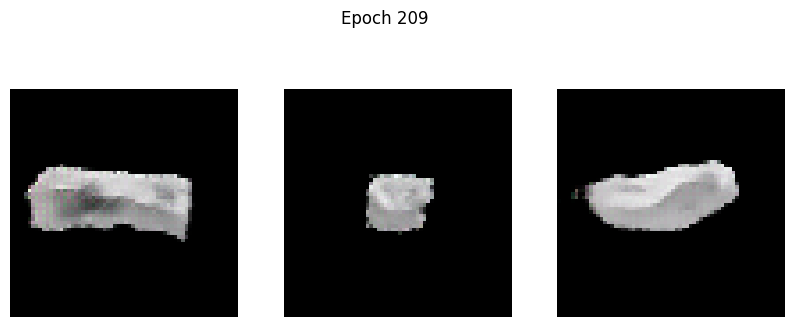

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -4.3857 - g_loss: 3.3880
Epoch 210/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -5.5423 - g_loss: 2.8785

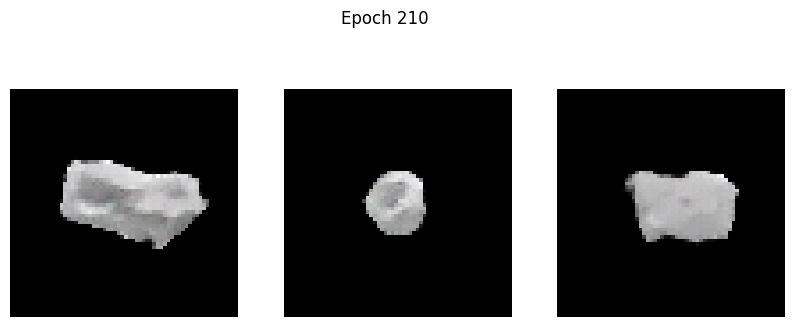

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -5.5481 - g_loss: 2.8793
Epoch 211/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -6.3282 - g_loss: 3.1611

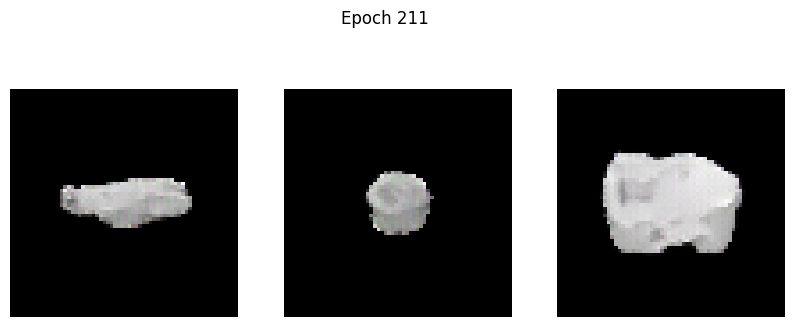

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -6.3298 - g_loss: 3.1629
Epoch 212/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -4.3346 - g_loss: 4.3081

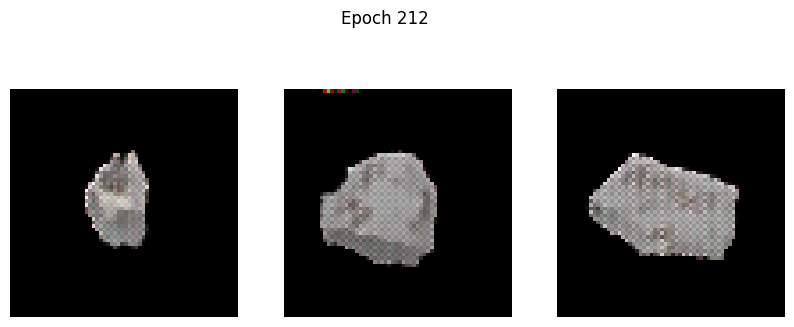

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -4.3217 - g_loss: 4.3111
Epoch 213/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 1.2548 - g_loss: 6.0657

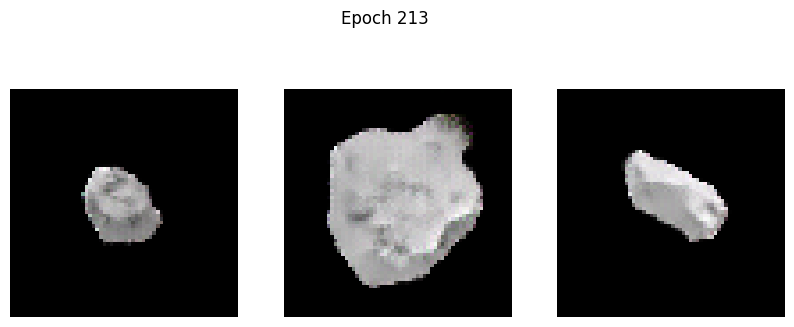

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 1.2076 - g_loss: 6.0524
Epoch 214/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -8.2858 - g_loss: 2.8360

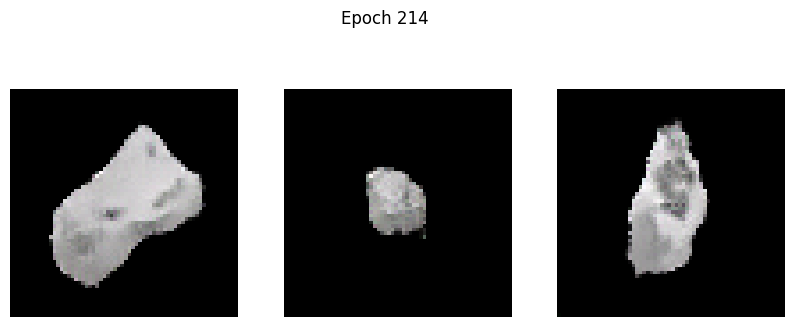

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -8.2868 - g_loss: 2.8359
Epoch 215/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -10.0539 - g_loss: 2.9310

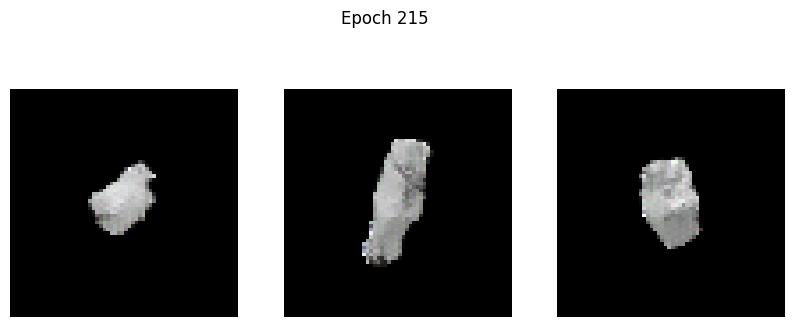

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -10.0424 - g_loss: 2.9311
Epoch 216/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -7.8633 - g_loss: 3.0563

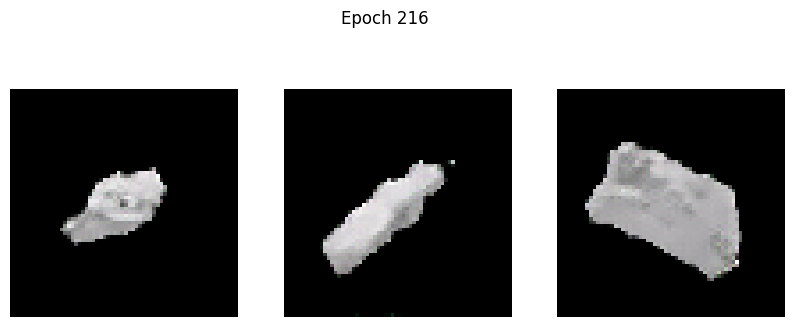

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -7.8648 - g_loss: 3.0578
Epoch 217/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -8.6457 - g_loss: 3.6494

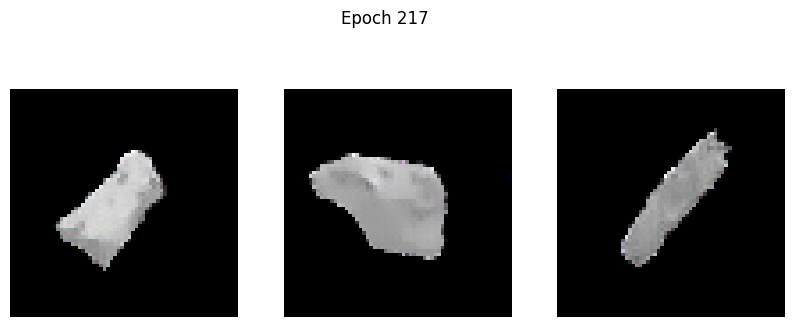

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -8.6348 - g_loss: 3.6492
Epoch 218/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -5.5758 - g_loss: 4.5492

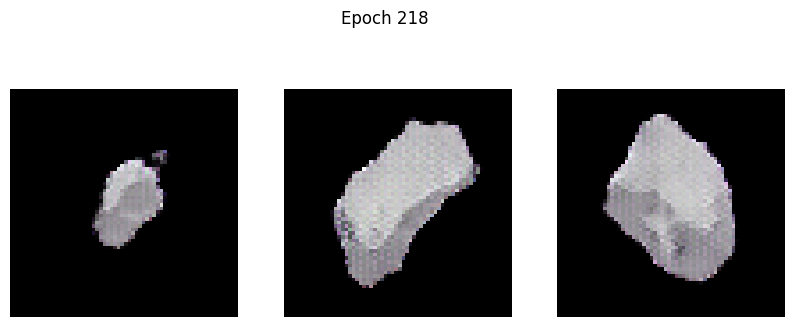

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -5.5815 - g_loss: 4.5466
Epoch 219/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -6.9086 - g_loss: 3.5537

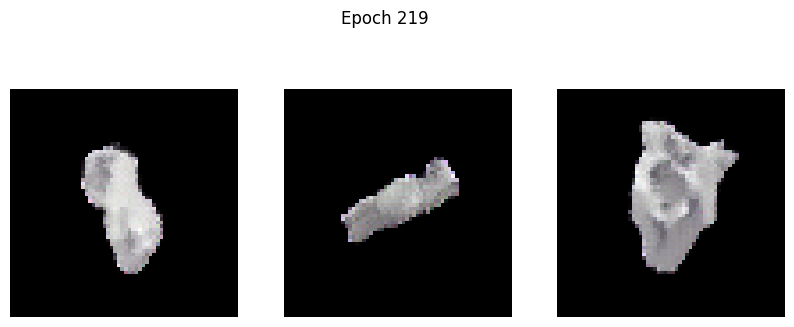

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -6.9088 - g_loss: 3.5542
Epoch 220/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -6.2526 - g_loss: 3.9664

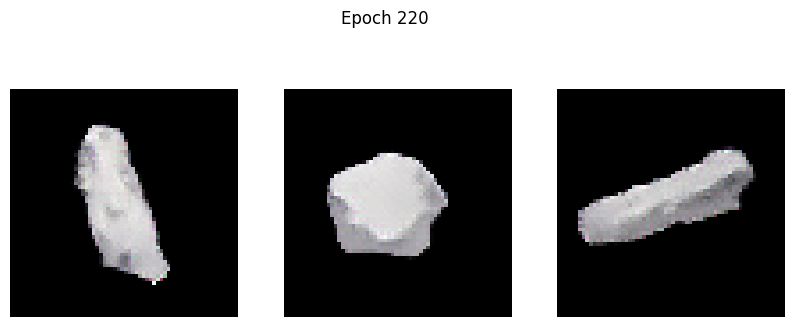

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - d_loss: -6.2811 - g_loss: 3.9596
Epoch 221/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -7.8196 - g_loss: 3.4485

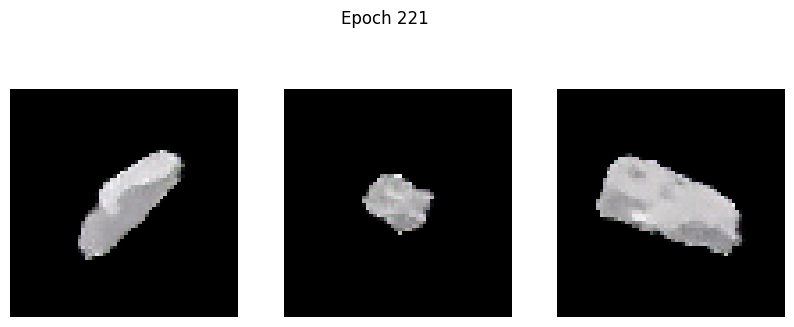

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -7.8369 - g_loss: 3.4459
Epoch 222/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -7.8546 - g_loss: 3.6323

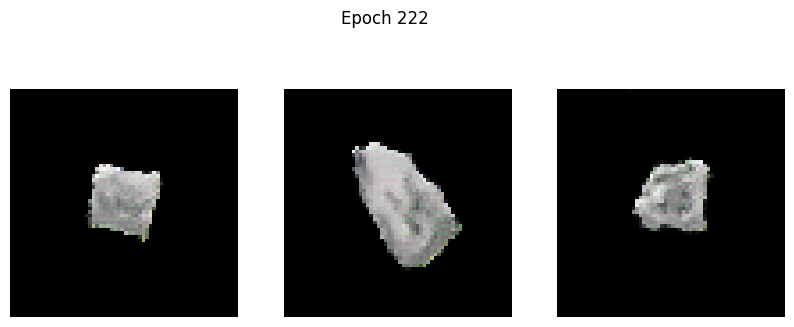

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -7.8584 - g_loss: 3.6356
Epoch 223/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -9.8865 - g_loss: 4.0981

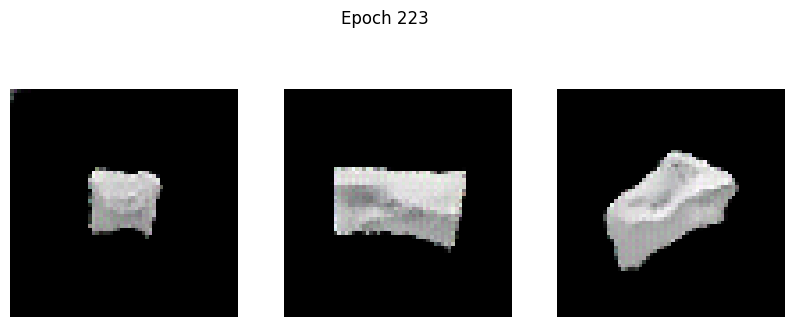

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -9.8987 - g_loss: 4.0933
Epoch 224/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -10.2914 - g_loss: 3.4269

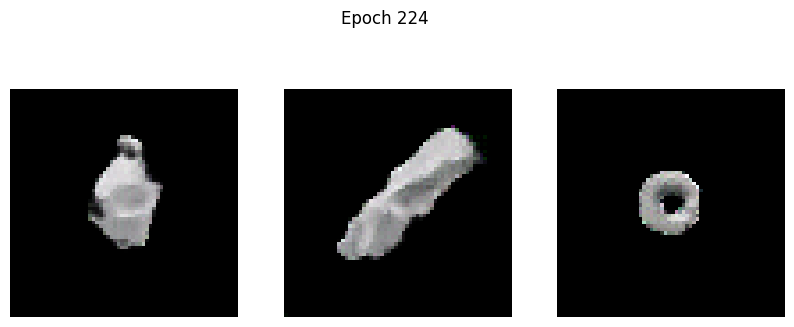

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -10.3043 - g_loss: 3.4282
Epoch 225/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -5.1616 - g_loss: 6.0061

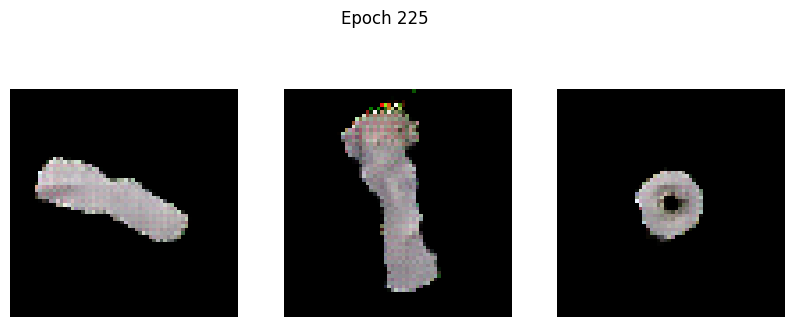

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -5.1328 - g_loss: 6.0242
Epoch 226/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -10.3862 - g_loss: 3.7915

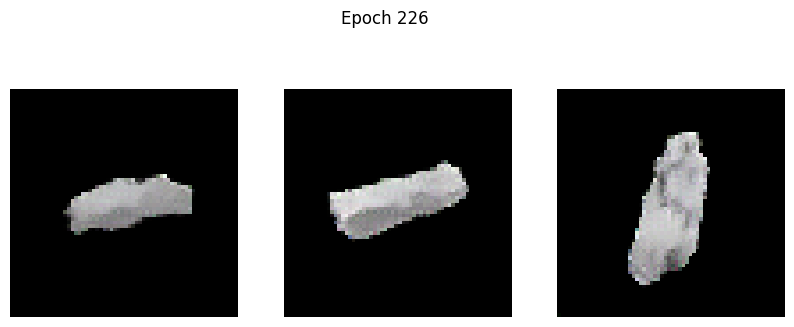

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -10.3960 - g_loss: 3.7891
Epoch 227/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -14.2459 - g_loss: 3.1306

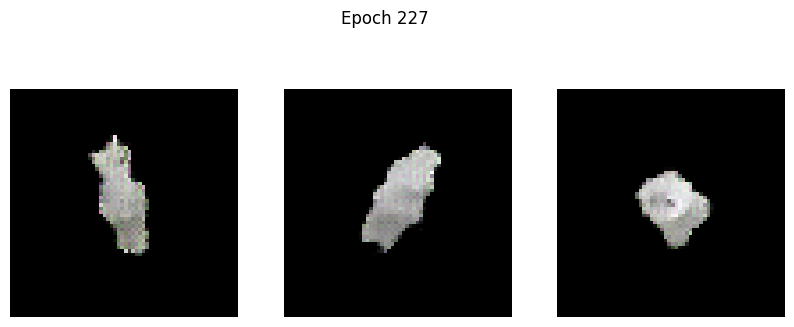

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -14.2386 - g_loss: 3.1357
Epoch 228/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -16.6313 - g_loss: 4.6363

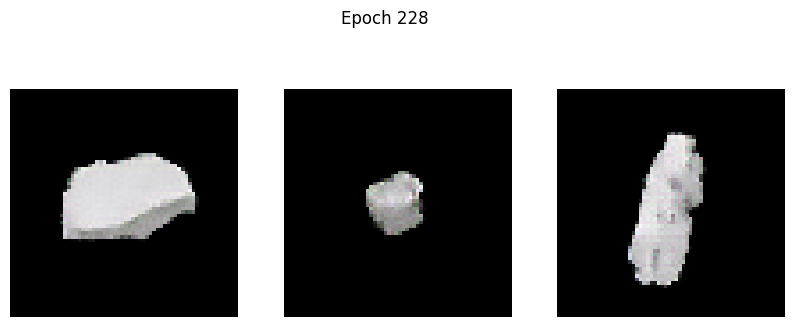

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -16.6143 - g_loss: 4.6286
Epoch 229/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -17.4773 - g_loss: 3.8584

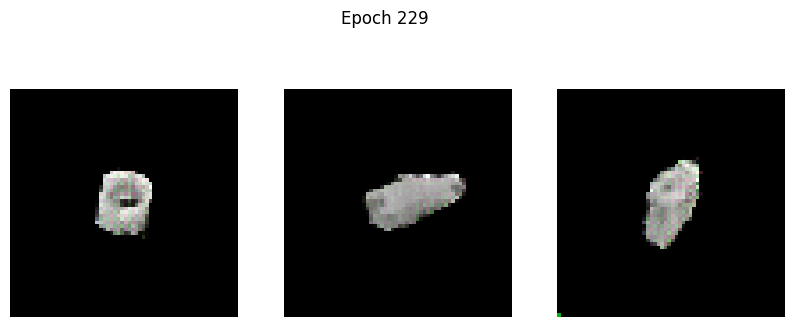

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -17.4483 - g_loss: 3.8616
Epoch 230/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -14.0668 - g_loss: 4.0811

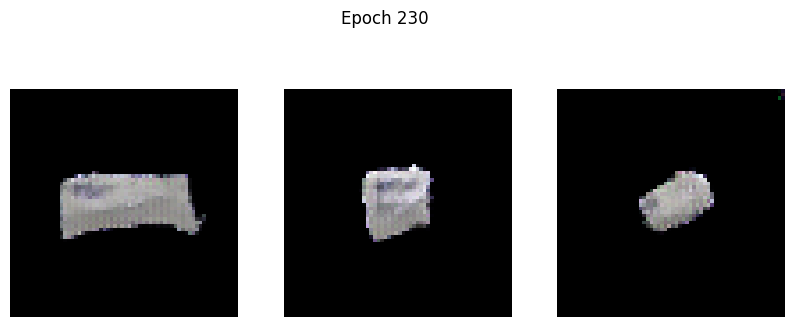

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -14.0781 - g_loss: 4.0842
Epoch 231/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 195.4126 - g_loss: 79.8454

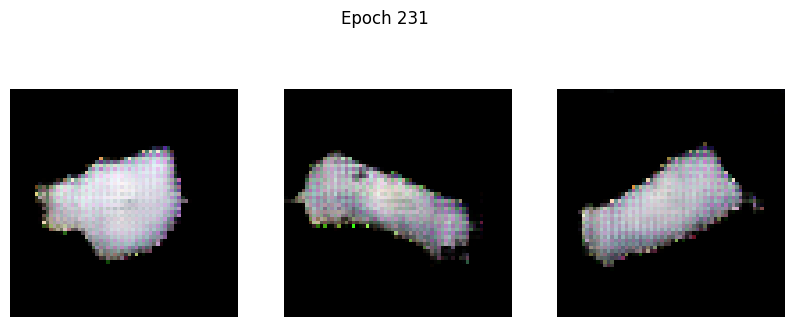

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 194.4207 - g_loss: 79.6246
Epoch 232/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.7553 - g_loss: 7.4149

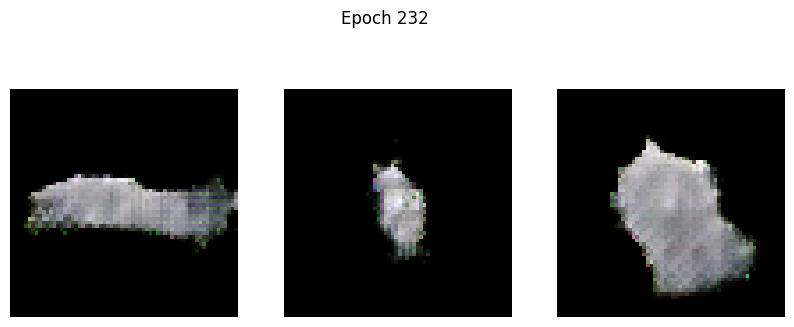

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.7659 - g_loss: 7.4059
Epoch 233/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -11.1122 - g_loss: 4.5998

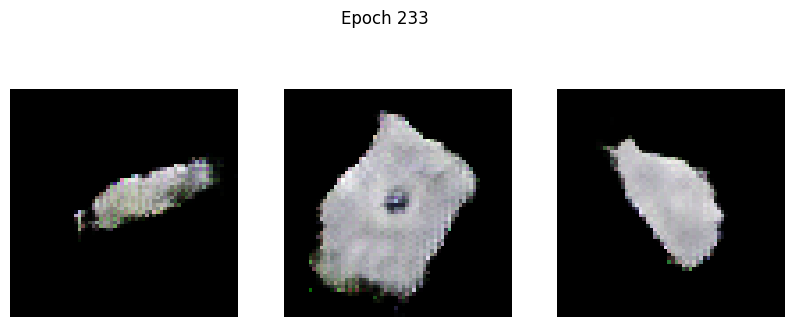

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -11.1014 - g_loss: 4.5971
Epoch 234/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -10.6133 - g_loss: 3.7551

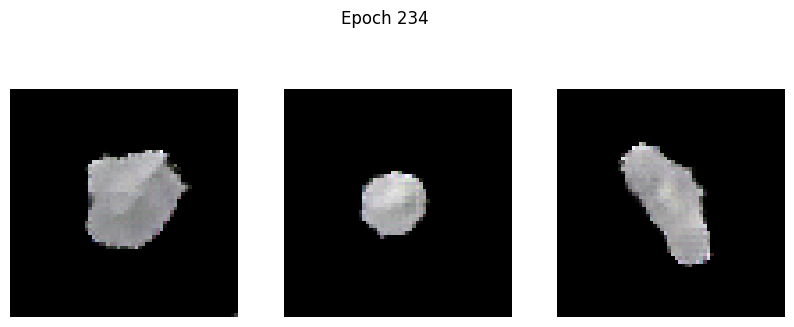

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -10.6183 - g_loss: 3.7522
Epoch 235/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -10.9819 - g_loss: 2.8993

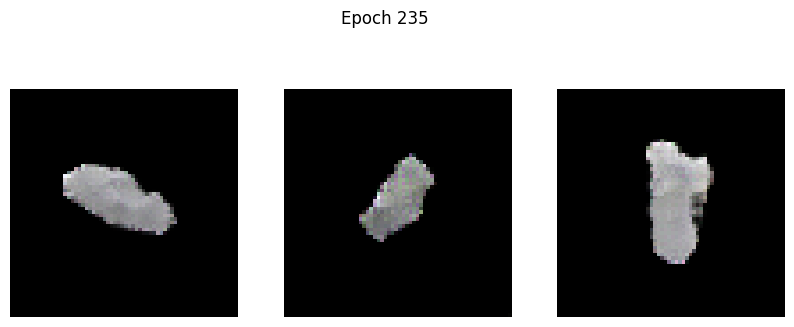

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -10.9879 - g_loss: 2.9007
Epoch 236/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -12.2747 - g_loss: 2.8542

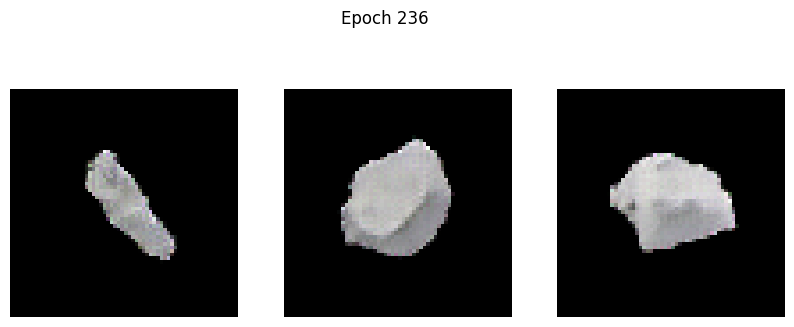

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -12.2881 - g_loss: 2.8545
Epoch 237/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -15.6059 - g_loss: 2.4469

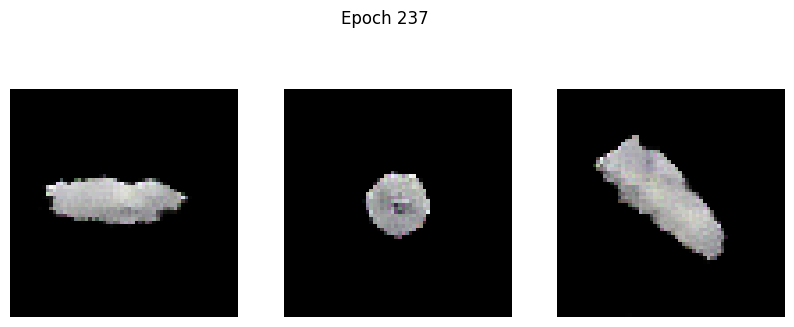

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -15.6062 - g_loss: 2.4487
Epoch 238/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -15.1193 - g_loss: 2.5723

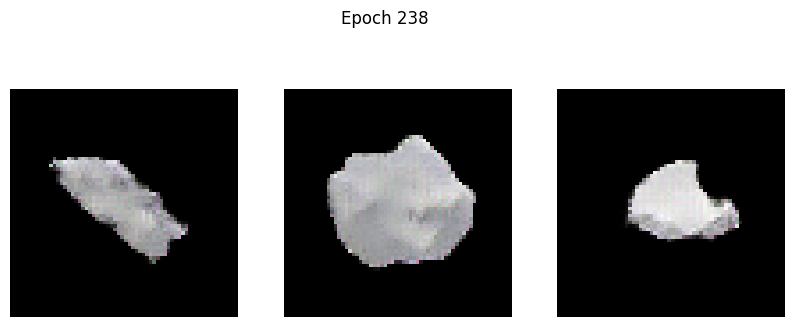

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -15.1273 - g_loss: 2.5721
Epoch 239/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -15.1239 - g_loss: 2.7631

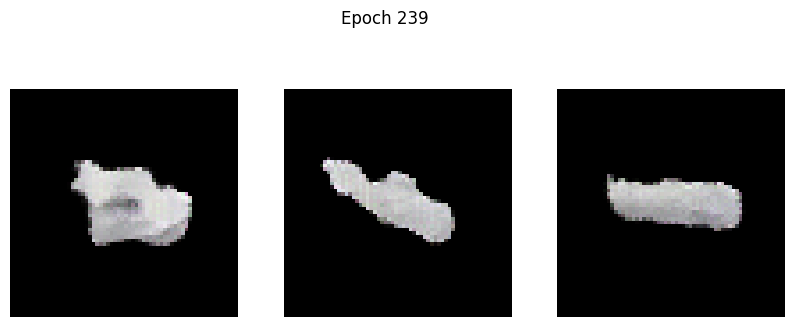

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -15.1321 - g_loss: 2.7620
Epoch 240/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -16.8837 - g_loss: 2.4600

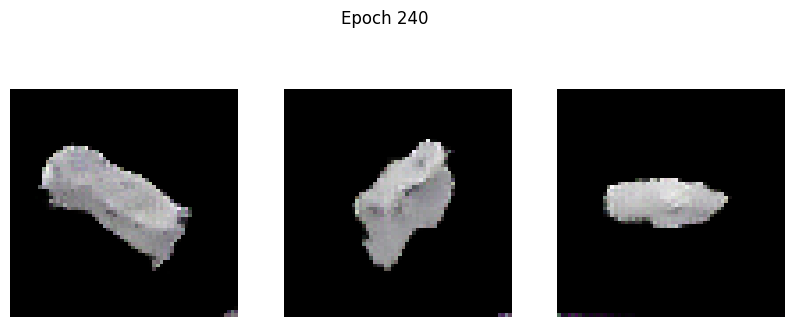

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -16.8745 - g_loss: 2.4610
Epoch 241/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -13.5165 - g_loss: 2.8245

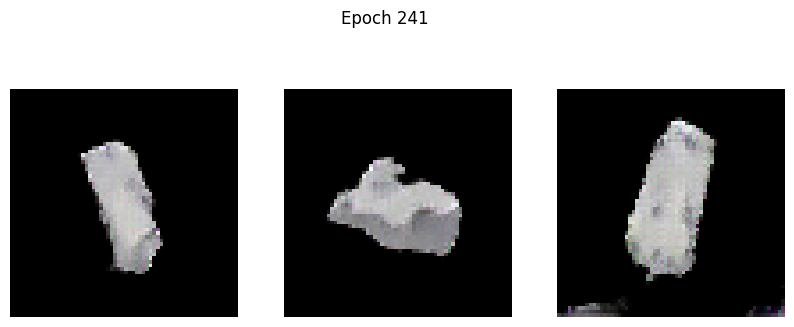

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -13.5446 - g_loss: 2.8239
Epoch 242/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -24.2034 - g_loss: 3.1446

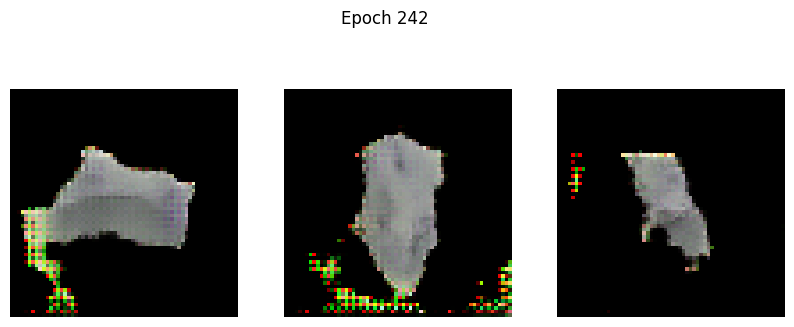

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -23.9873 - g_loss: 3.1566
Epoch 243/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 863.0535 - g_loss: 317.1628

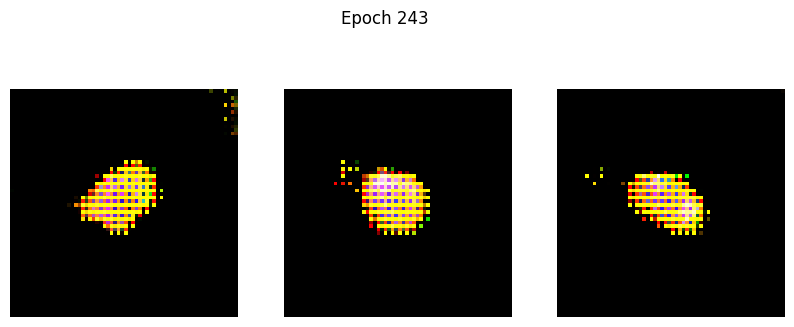

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 860.7859 - g_loss: 318.0690
Epoch 244/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 12.4122 - g_loss: 107.9040

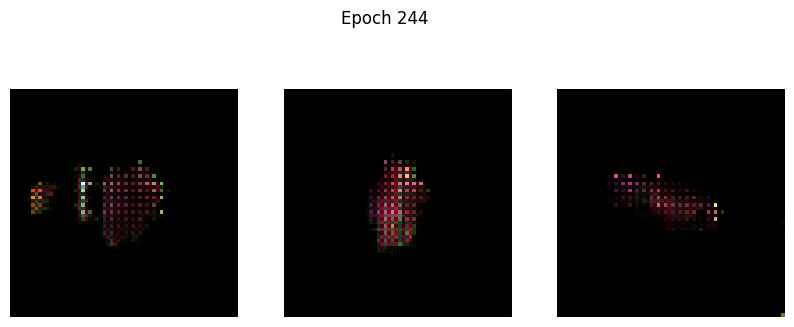

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 12.4892 - g_loss: 107.9346
Epoch 245/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 25.0597 - g_loss: 73.4057

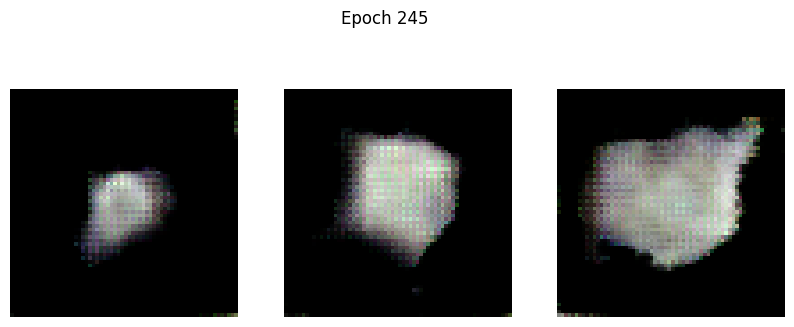

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 25.1964 - g_loss: 73.1681
Epoch 246/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 41.9979 - g_loss: 28.4845

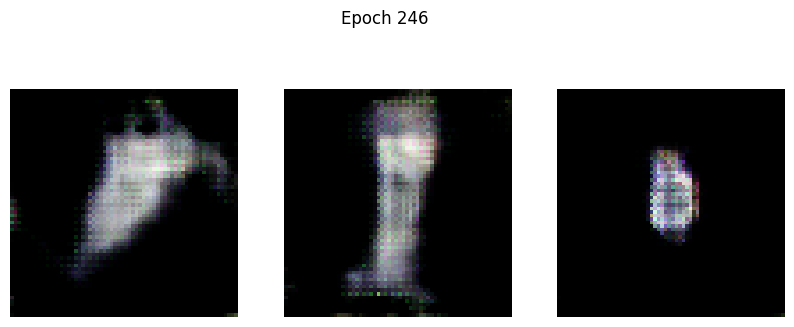

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 41.9545 - g_loss: 28.4468
Epoch 247/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 24.1814 - g_loss: 19.6946

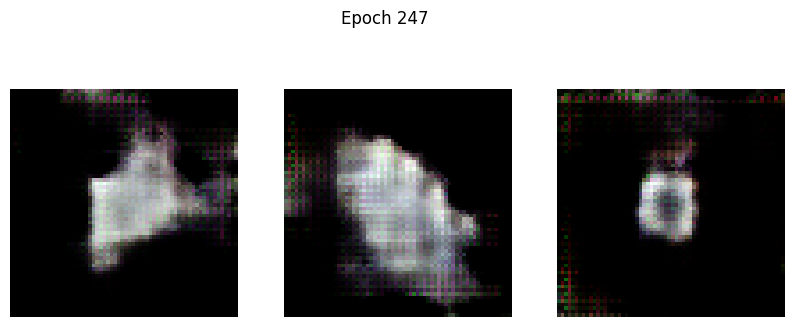

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 24.1491 - g_loss: 19.6731
Epoch 248/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 13.0267 - g_loss: 19.6125

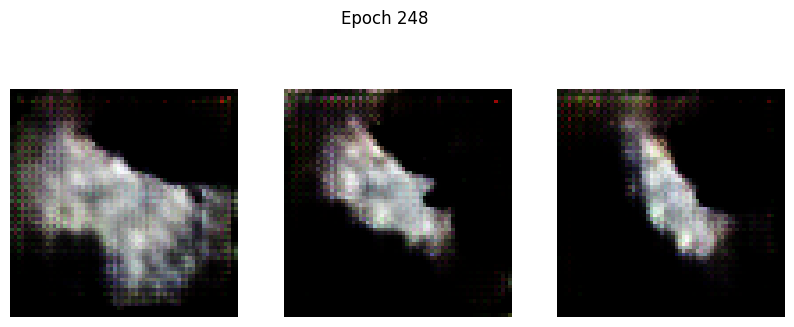

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 12.9940 - g_loss: 19.5828
Epoch 249/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 5.3163 - g_loss: 13.4486

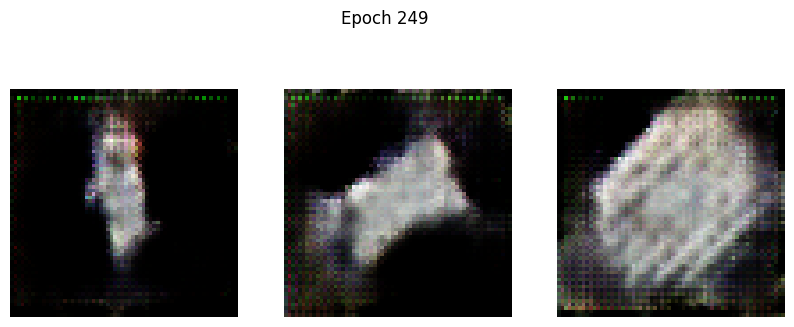

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 5.3139 - g_loss: 13.4498
Epoch 250/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 4.5843 - g_loss: 14.0332

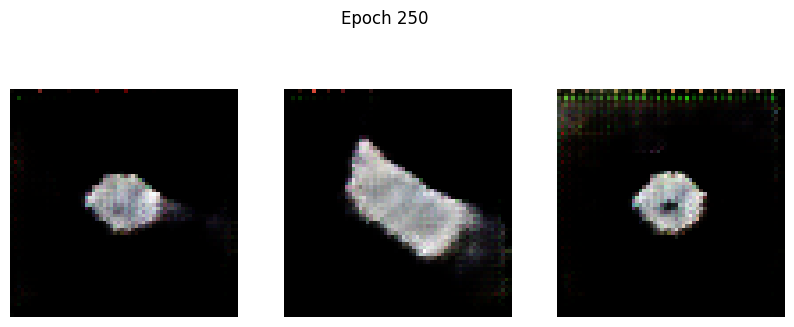

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 4.5830 - g_loss: 14.0375
Epoch 251/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 3.5404 - g_loss: 14.6265

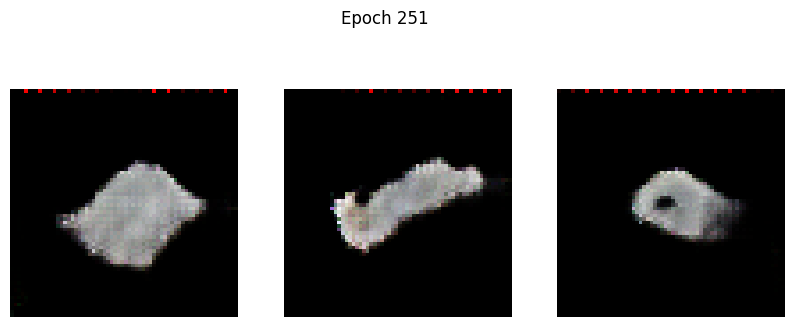

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 3.5458 - g_loss: 14.6199
Epoch 252/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 4.9791 - g_loss: 13.2548

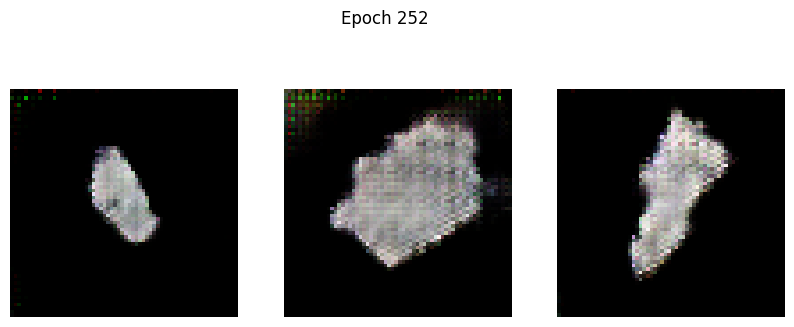

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 4.9754 - g_loss: 13.2493
Epoch 253/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 3.2049 - g_loss: 12.6496

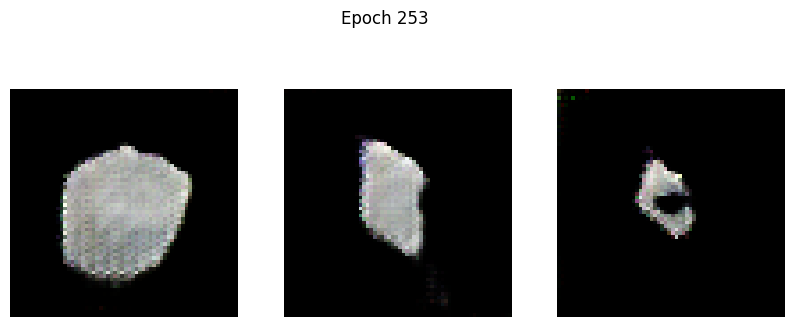

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 3.2086 - g_loss: 12.6380
Epoch 254/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 4.1699 - g_loss: 10.6079

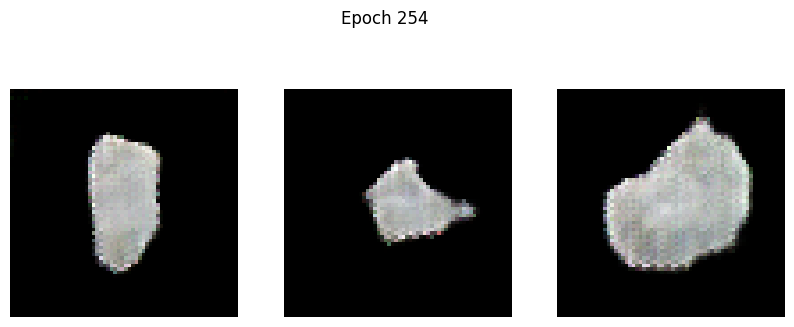

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 4.1673 - g_loss: 10.6020
Epoch 255/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 3.4105 - g_loss: 9.3557

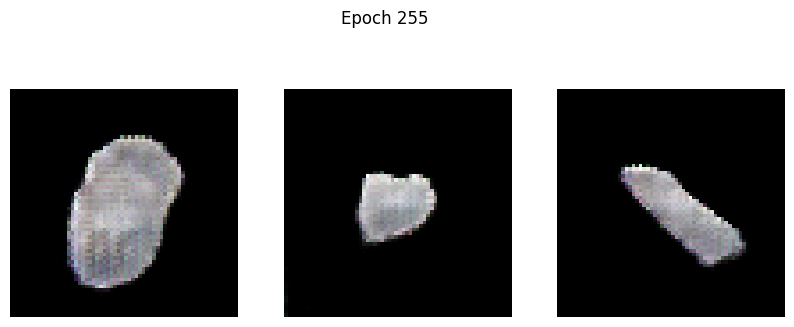

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 3.4079 - g_loss: 9.3514
Epoch 256/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 2.2033 - g_loss: 8.4817

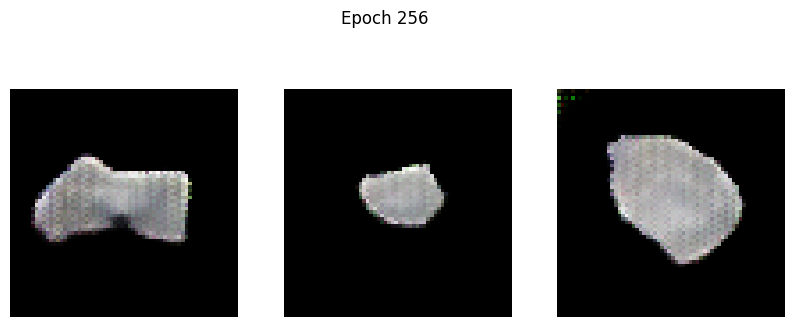

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 2.2040 - g_loss: 8.4772
Epoch 257/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 1.9610 - g_loss: 7.8467

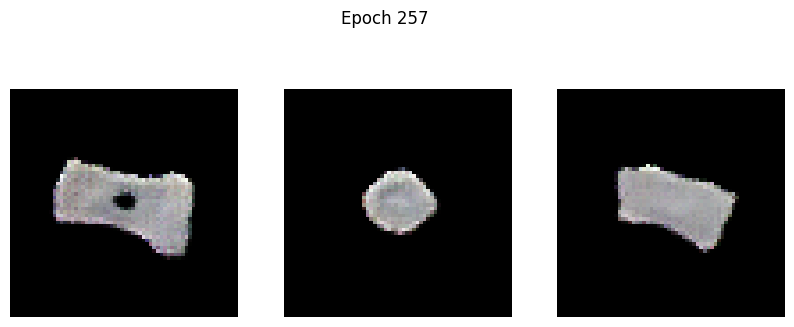

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 1.9573 - g_loss: 7.8428
Epoch 258/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 1.5642 - g_loss: 7.4153

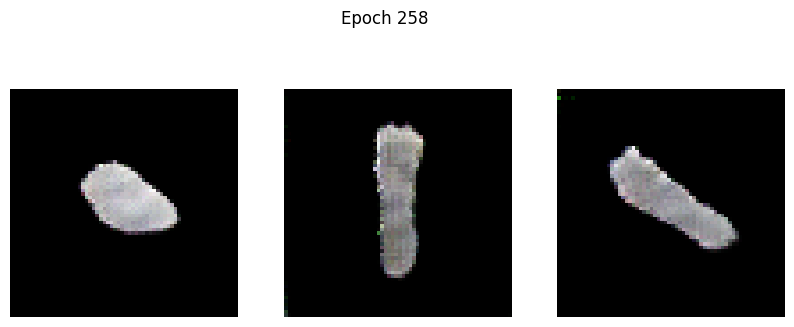

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 1.5620 - g_loss: 7.4112
Epoch 259/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.5961 - g_loss: 7.2350

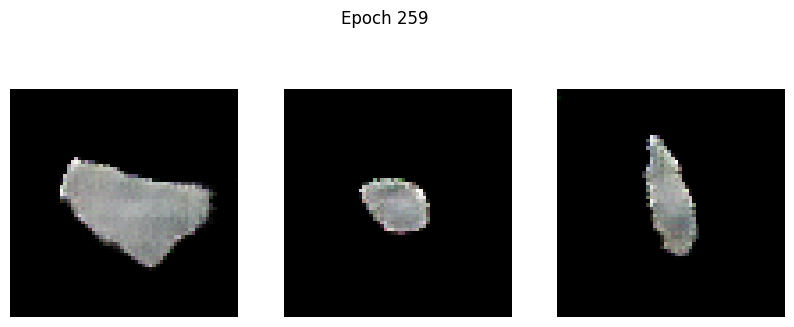

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.5964 - g_loss: 7.2304
Epoch 260/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.0373 - g_loss: 6.4845

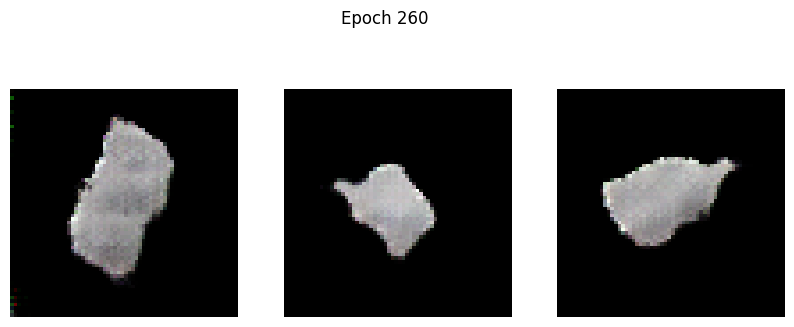

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.0333 - g_loss: 6.4814
Epoch 261/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.6182 - g_loss: 6.0935

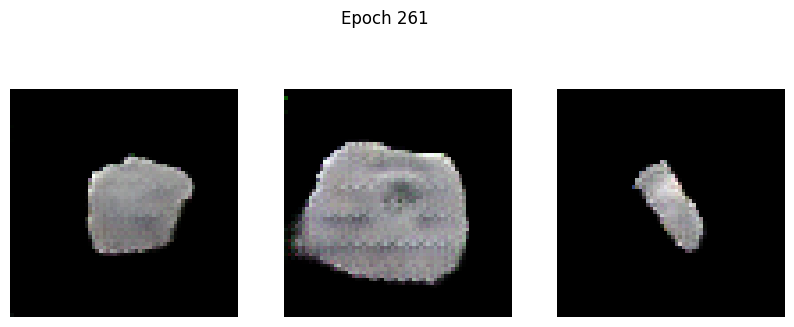

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.6191 - g_loss: 6.0917
Epoch 262/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.1660 - g_loss: 5.8861

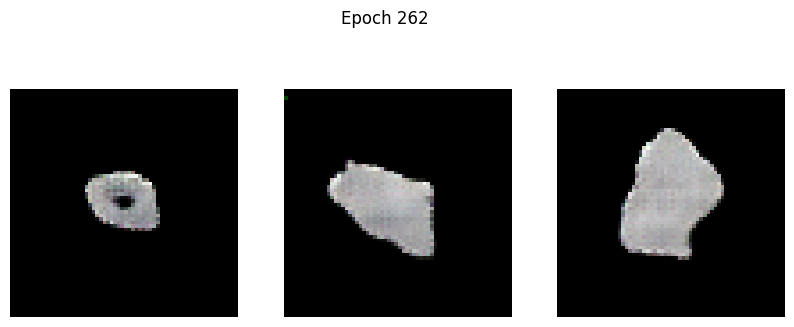

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.1682 - g_loss: 5.8839
Epoch 263/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.0288 - g_loss: 5.4800

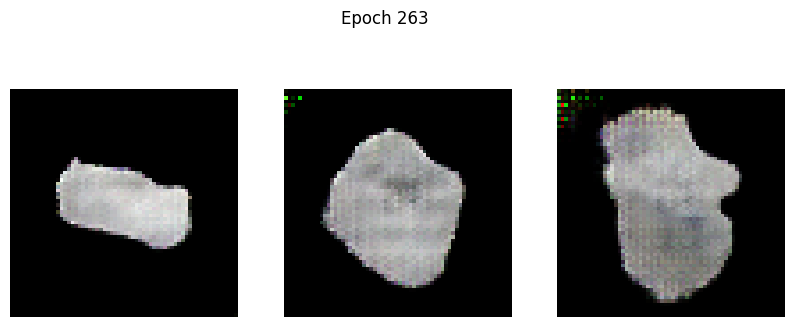

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.0277 - g_loss: 5.4786
Epoch 264/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.9474 - g_loss: 5.1431

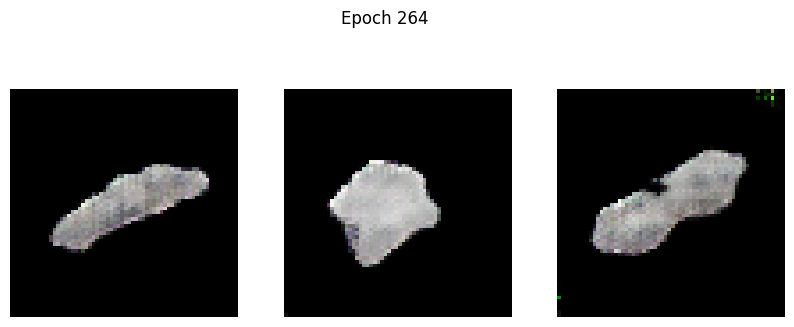

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.9480 - g_loss: 5.1402
Epoch 265/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.0810 - g_loss: 5.5937

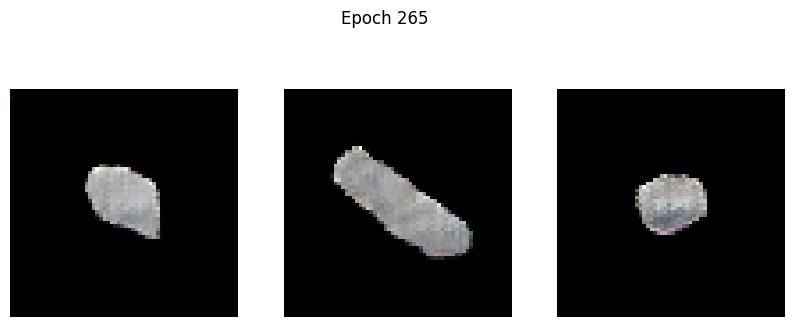

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.0853 - g_loss: 5.5903
Epoch 266/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.0042 - g_loss: 5.0591

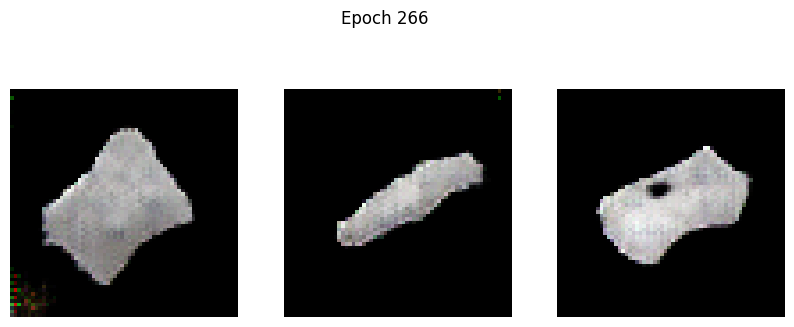

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.0038 - g_loss: 5.0581
Epoch 267/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.4780 - g_loss: 4.7199

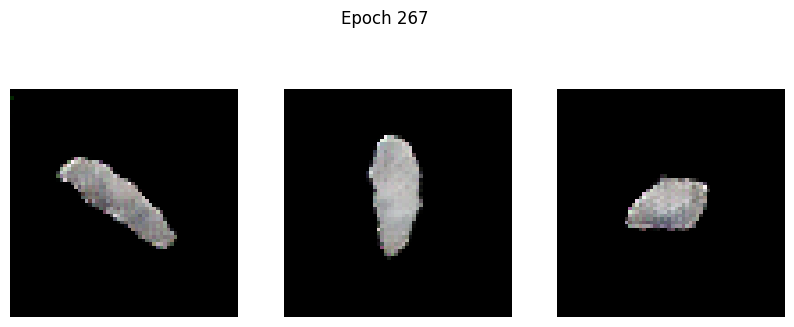

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.4770 - g_loss: 4.7214
Epoch 268/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.7361 - g_loss: 4.6949

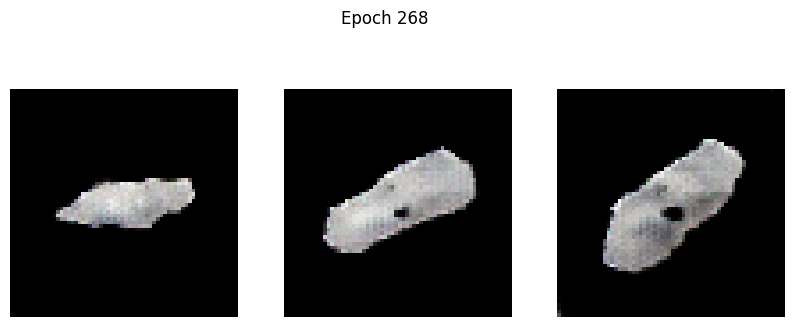

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.7394 - g_loss: 4.6945
Epoch 269/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.2222 - g_loss: 4.5516

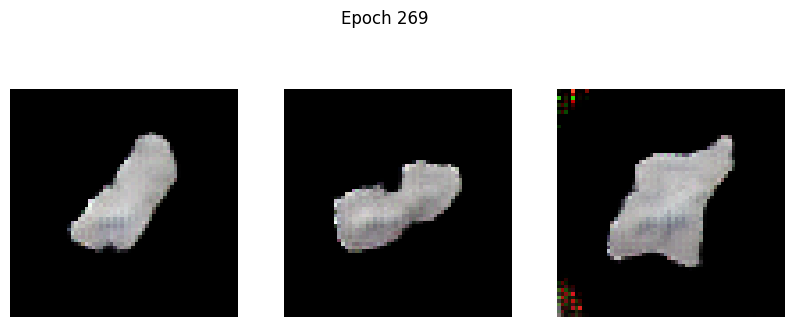

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.2309 - g_loss: 4.5526
Epoch 270/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -4.0853 - g_loss: 4.7170

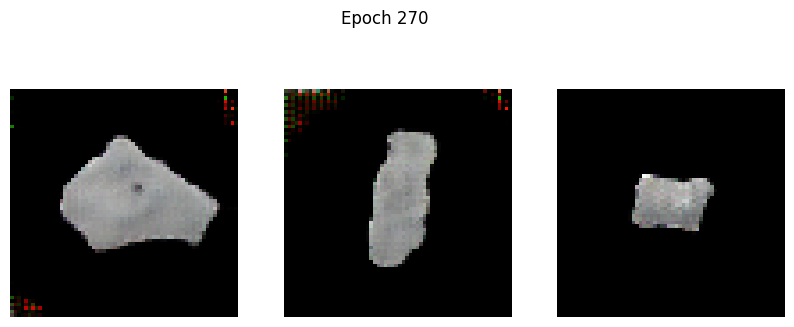

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.0857 - g_loss: 4.7149
Epoch 271/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.3440 - g_loss: 4.5551

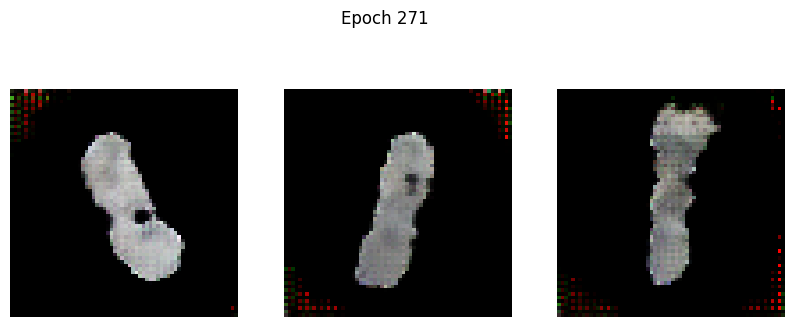

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -5.3294 - g_loss: 4.5527
Epoch 272/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.9034 - g_loss: 4.5114

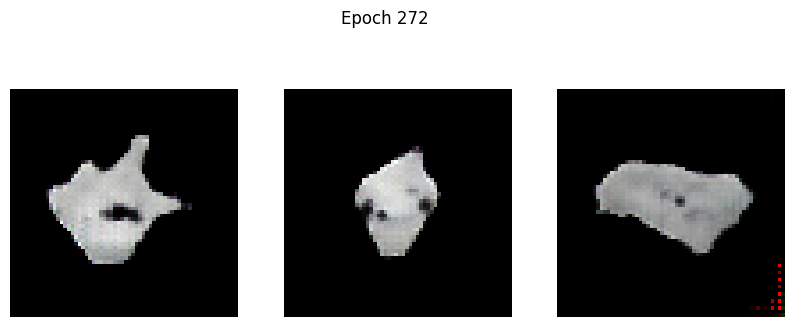

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -5.8979 - g_loss: 4.5104
Epoch 273/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -4.2328 - g_loss: 4.1727

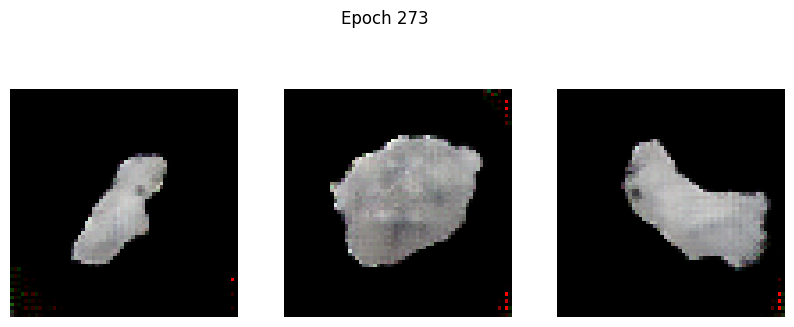

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.2384 - g_loss: 4.1737
Epoch 274/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -6.4837 - g_loss: 4.0031

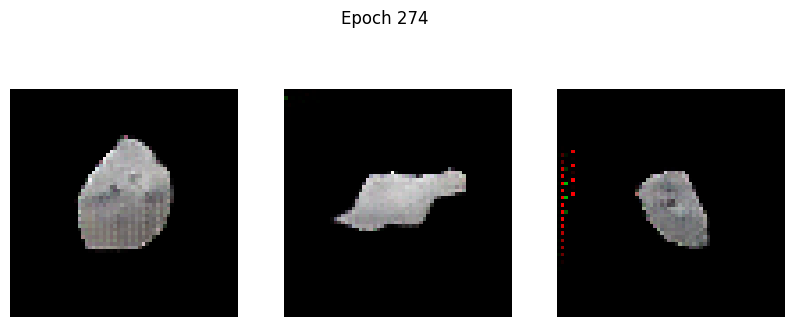

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.4751 - g_loss: 4.0034
Epoch 275/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.7450 - g_loss: 4.3265

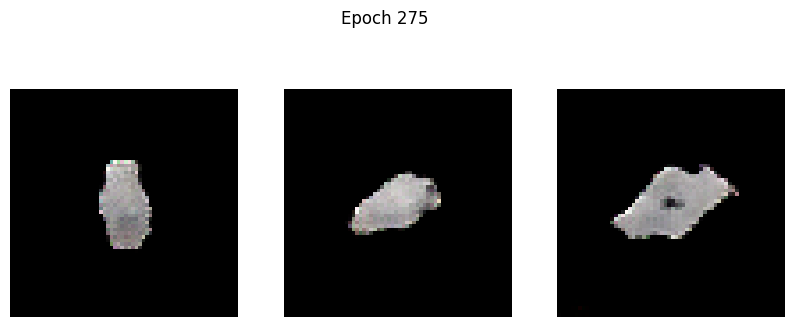

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -5.7312 - g_loss: 4.3317
Epoch 276/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -7.2923 - g_loss: 5.2896

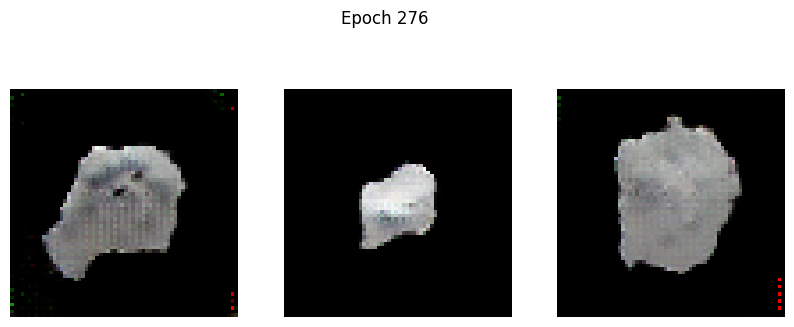

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -7.2873 - g_loss: 5.2836
Epoch 277/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -6.9125 - g_loss: 4.2791

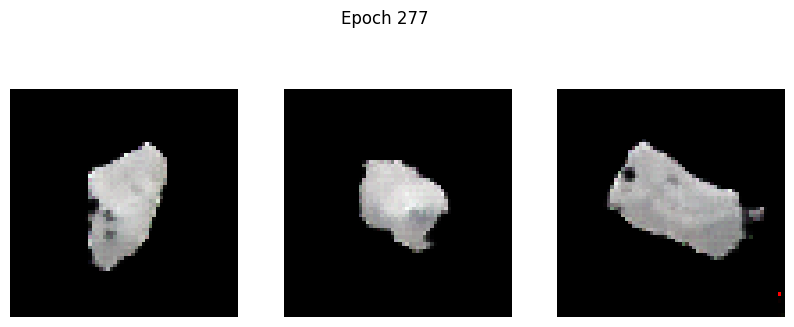

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -6.9089 - g_loss: 4.2788
Epoch 278/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -7.0638 - g_loss: 4.0085

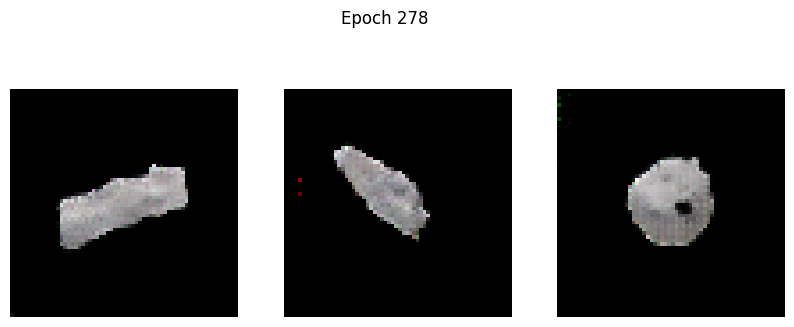

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -7.0627 - g_loss: 4.0081
Epoch 279/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -8.9290 - g_loss: 4.0996

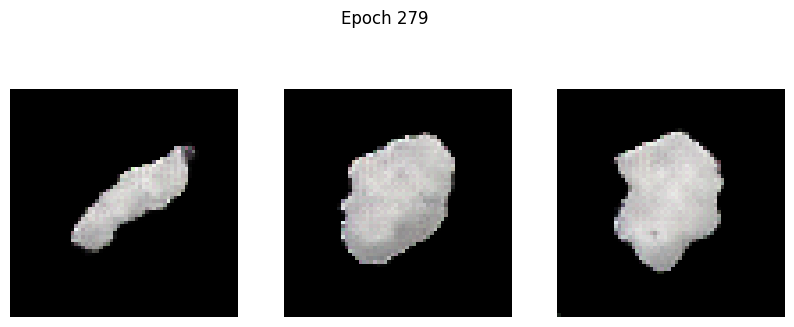

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -8.9269 - g_loss: 4.0983
Epoch 280/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -8.2855 - g_loss: 4.0945

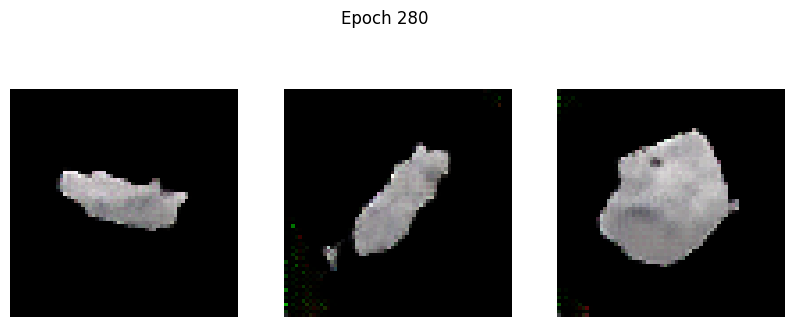

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -8.2952 - g_loss: 4.0937
Epoch 281/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -8.6329 - g_loss: 3.9909

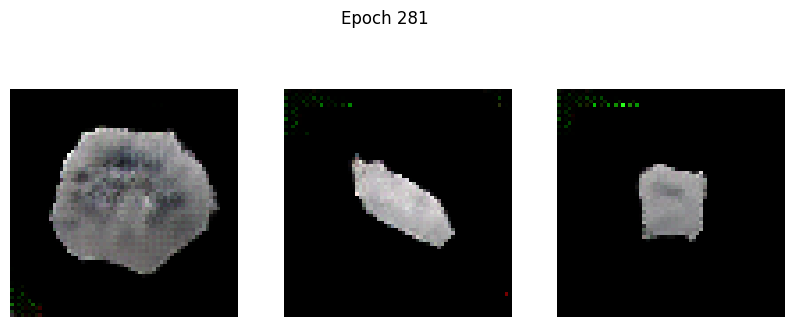

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -8.6373 - g_loss: 3.9894
Epoch 282/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -13.6801 - g_loss: 3.9918

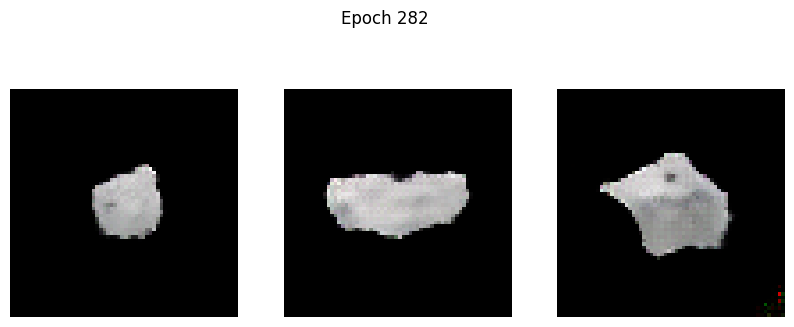

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -13.6560 - g_loss: 3.9918
Epoch 283/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -10.5790 - g_loss: 3.9472

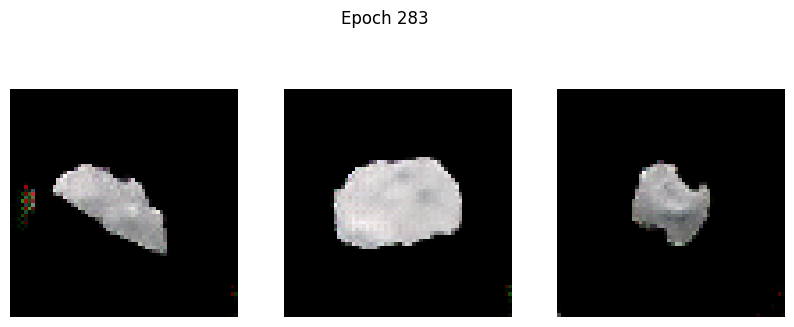

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -10.5776 - g_loss: 3.9464
Epoch 284/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -12.1008 - g_loss: 3.9731

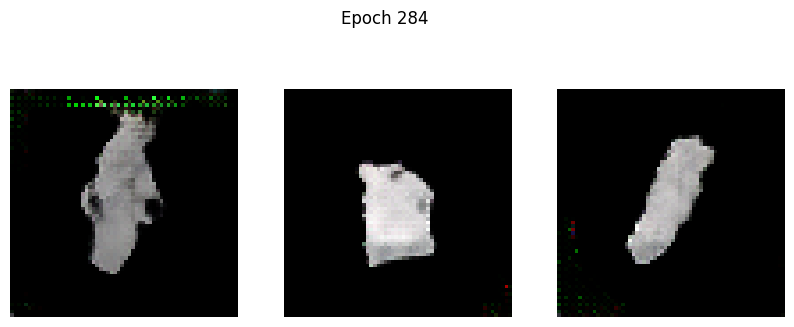

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -12.0943 - g_loss: 3.9719
Epoch 285/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -13.0143 - g_loss: 3.6021

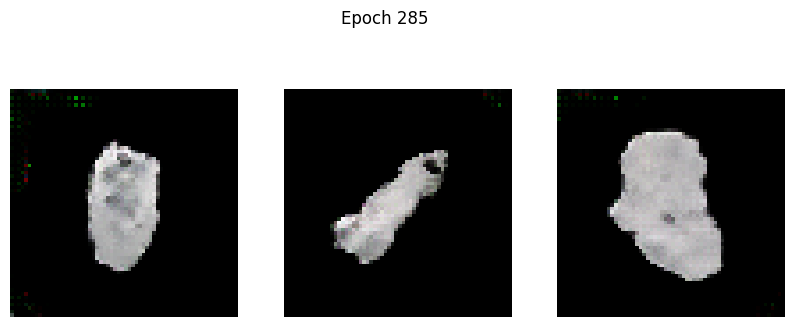

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -13.0046 - g_loss: 3.6027
Epoch 286/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -13.6403 - g_loss: 3.9091

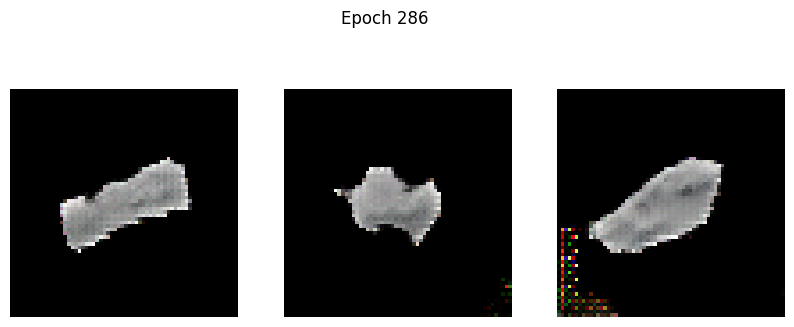

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -13.6182 - g_loss: 3.9194
Epoch 287/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 3.6645 - g_loss: 13.0708

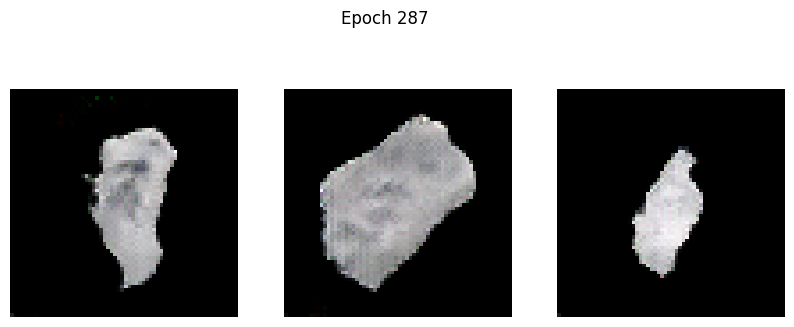

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 3.5583 - g_loss: 13.0231
Epoch 288/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -14.2931 - g_loss: 3.8807

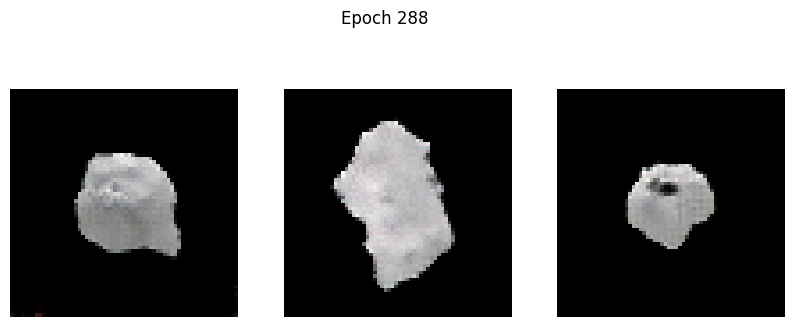

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -14.2992 - g_loss: 3.8810
Epoch 289/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -16.4897 - g_loss: 3.6410

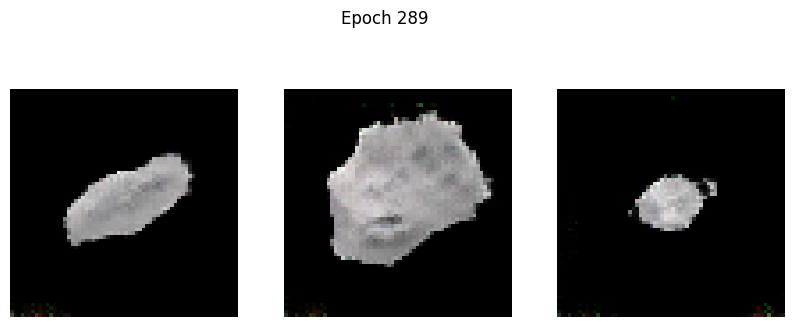

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -16.4883 - g_loss: 3.6408
Epoch 290/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -16.6640 - g_loss: 3.8157

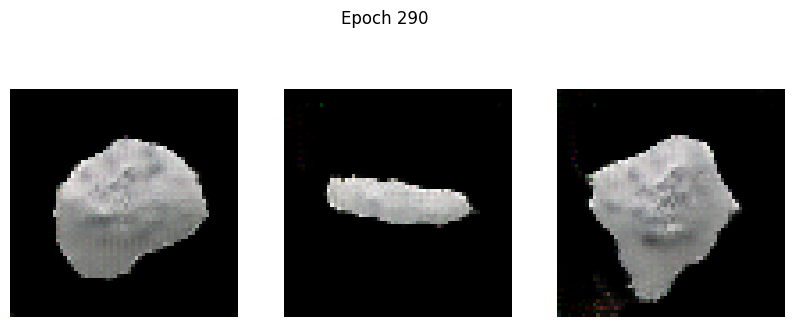

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -16.6757 - g_loss: 3.8203
Epoch 291/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -14.5979 - g_loss: 3.7189

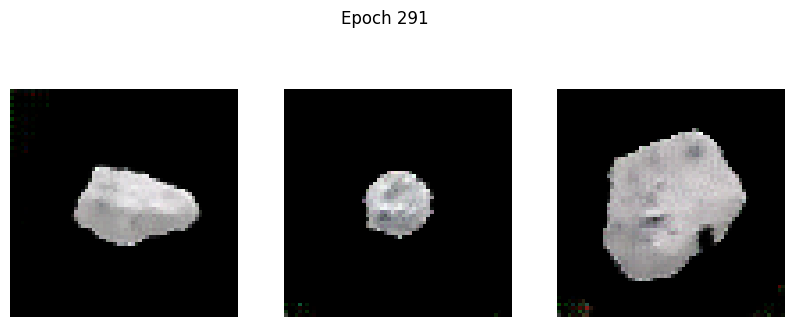

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -14.6198 - g_loss: 3.7182
Epoch 292/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -11.9326 - g_loss: 5.7279

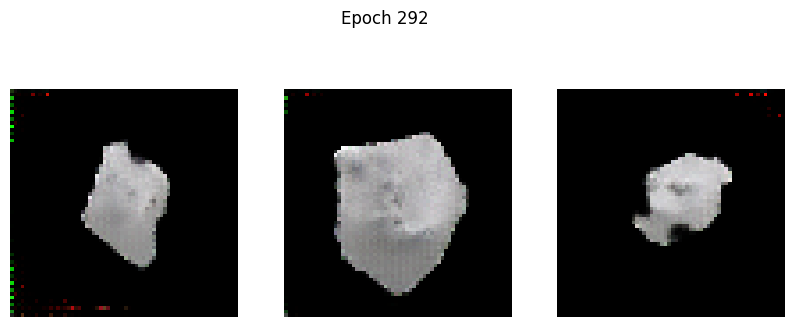

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -11.9210 - g_loss: 5.7389
Epoch 293/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -18.6123 - g_loss: 4.8416

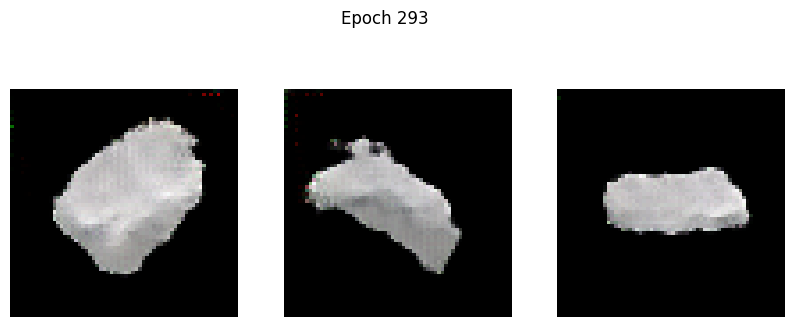

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -18.6092 - g_loss: 4.8399
Epoch 294/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -13.7571 - g_loss: 6.6410

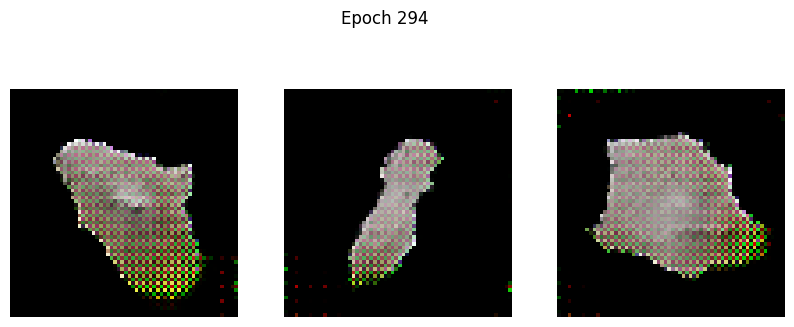

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -13.5748 - g_loss: 6.6771
Epoch 295/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -9.1959 - g_loss: 8.0455

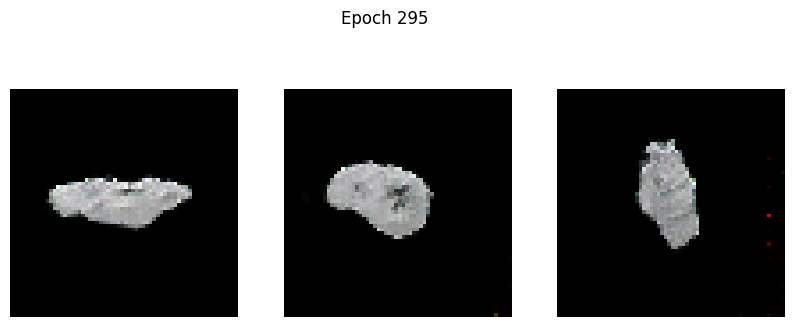

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -9.2365 - g_loss: 8.0295
Epoch 296/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -18.2091 - g_loss: 3.9368

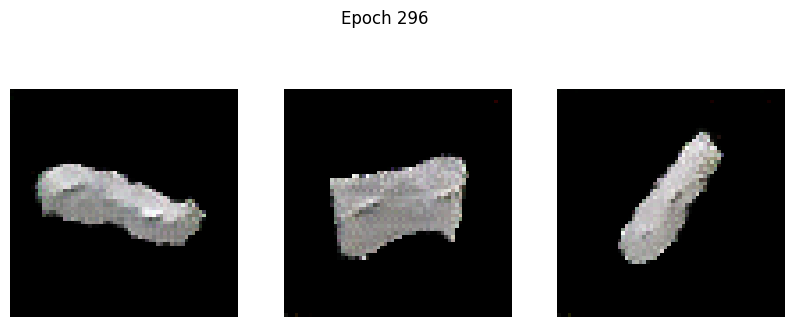

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -18.1918 - g_loss: 3.9358
Epoch 297/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -19.5383 - g_loss: 3.4441

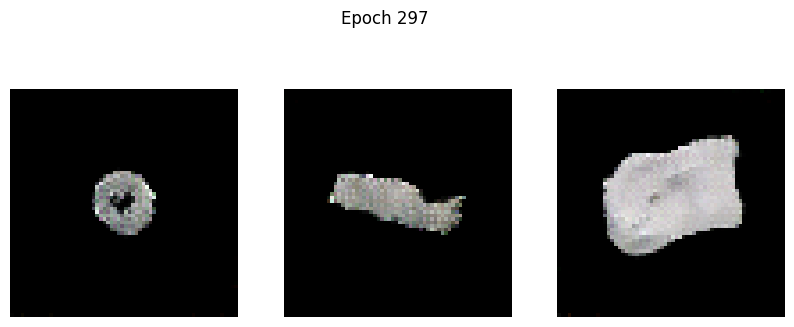

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -19.5387 - g_loss: 3.4449
Epoch 298/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -19.5678 - g_loss: 3.5386

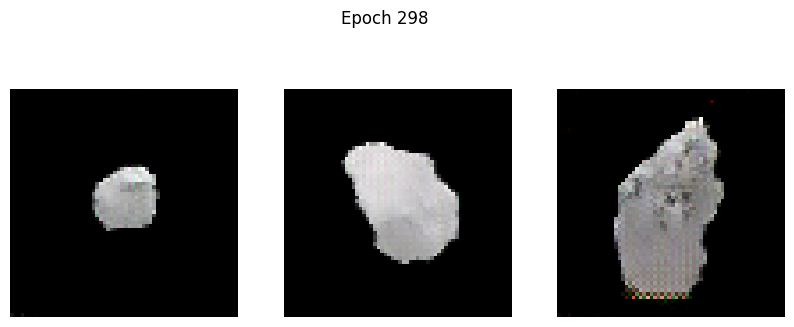

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -19.5705 - g_loss: 3.5398
Epoch 299/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -19.3665 - g_loss: 3.7968

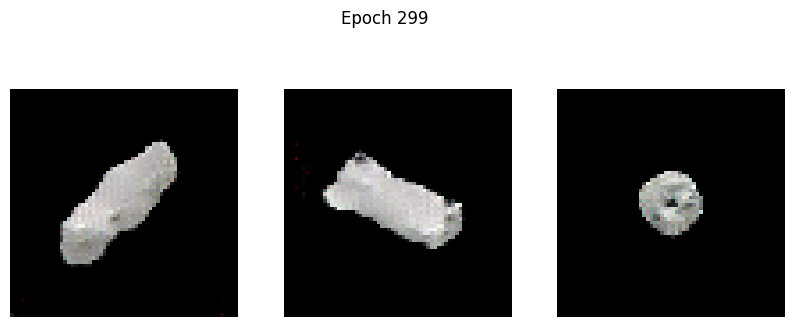

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -19.3681 - g_loss: 3.7975
Epoch 300/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -22.4913 - g_loss: 3.8802

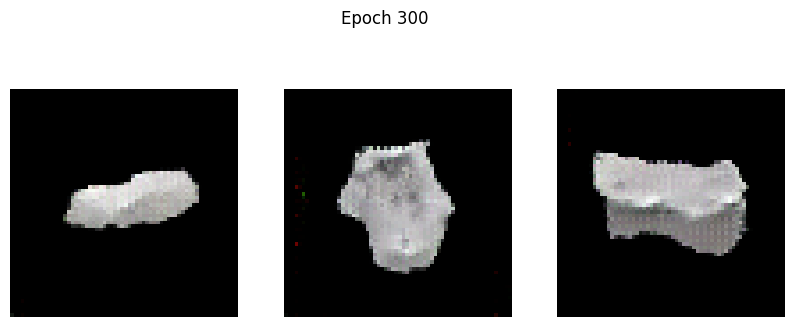

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -22.4804 - g_loss: 3.8793
Epoch 301/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -26.2097 - g_loss: 5.5016

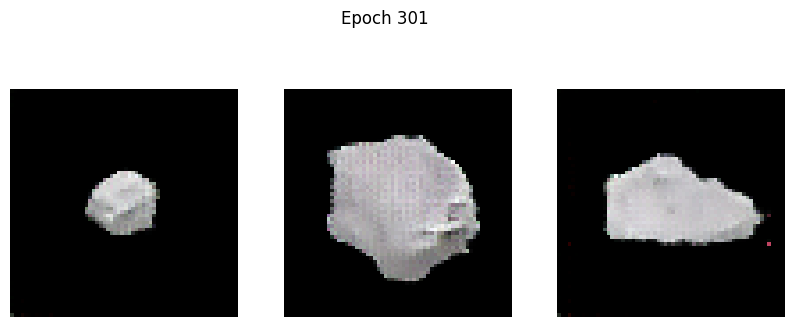

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -26.1531 - g_loss: 5.5000
Epoch 302/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -18.8112 - g_loss: 3.9707

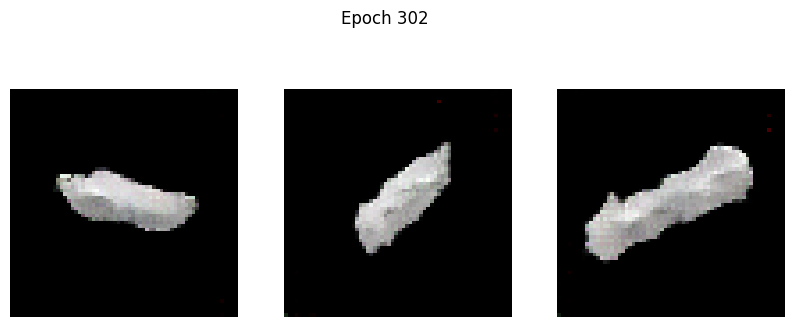

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -18.8802 - g_loss: 3.9692
Epoch 303/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -22.9485 - g_loss: 4.0987

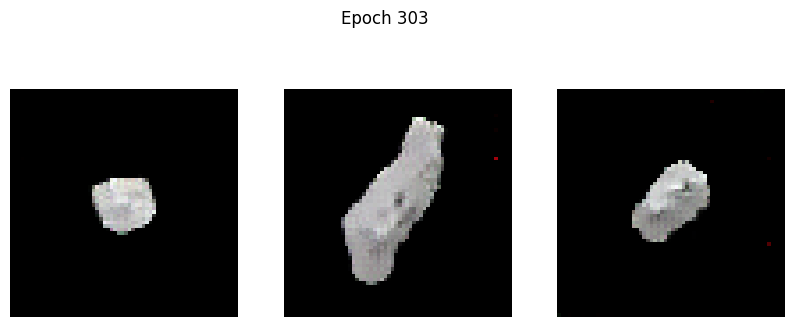

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -22.9484 - g_loss: 4.0977
Epoch 304/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -28.0695 - g_loss: 3.8998

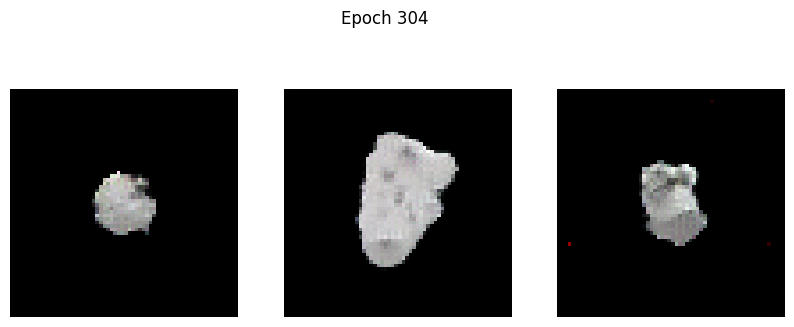

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -28.0638 - g_loss: 3.9019
Epoch 305/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -24.4007 - g_loss: 5.0617

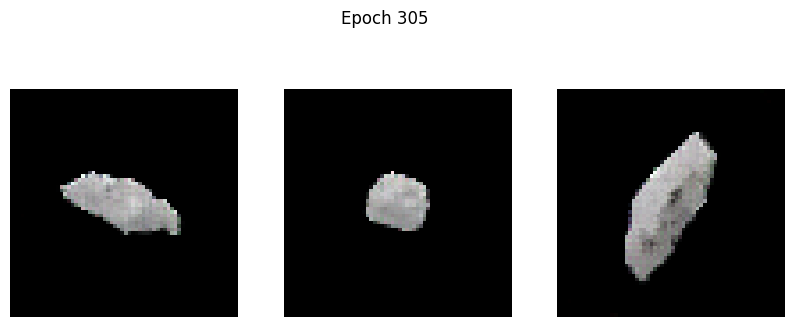

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -24.4336 - g_loss: 5.0607
Epoch 306/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -36.4258 - g_loss: 5.2590

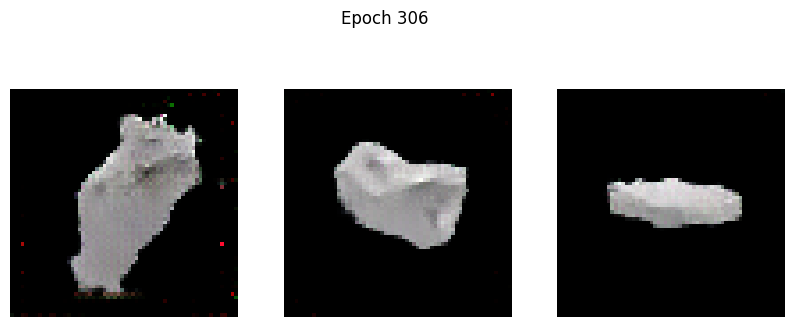

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -36.3559 - g_loss: 5.2542
Epoch 307/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -36.1303 - g_loss: 4.3109

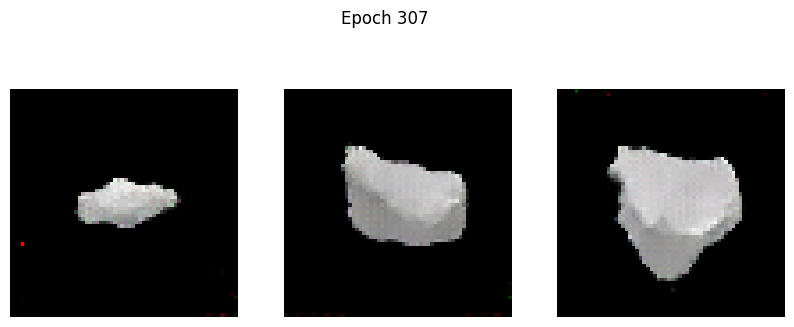

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -36.1027 - g_loss: 4.3114
Epoch 308/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -35.6013 - g_loss: 4.9974

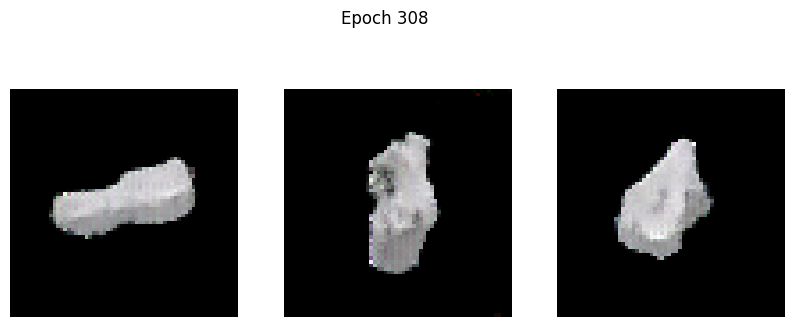

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -35.5740 - g_loss: 5.0015
Epoch 309/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -35.6997 - g_loss: 6.9342

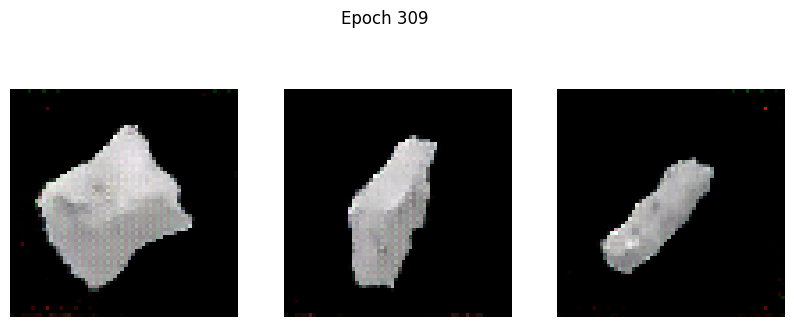

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -35.6611 - g_loss: 6.9243
Epoch 310/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -27.6571 - g_loss: 4.2591

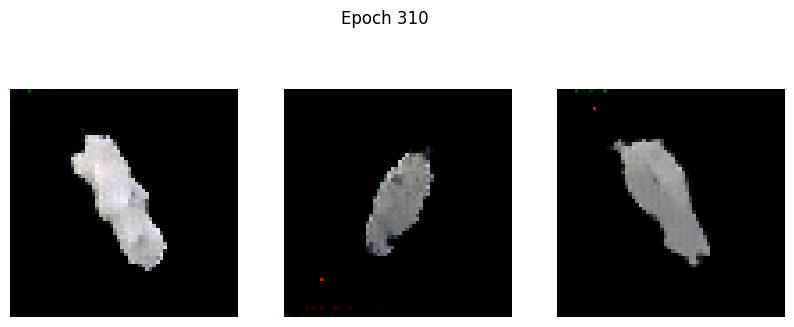

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -27.6954 - g_loss: 4.2648
Epoch 311/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -26.5443 - g_loss: 7.1243

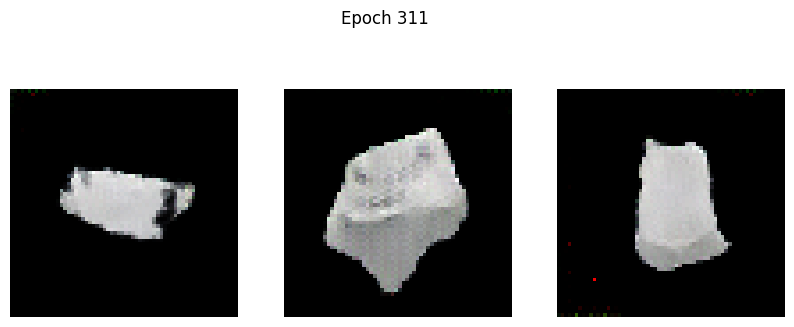

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -26.6240 - g_loss: 7.1060
Epoch 312/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -42.1688 - g_loss: 4.7058

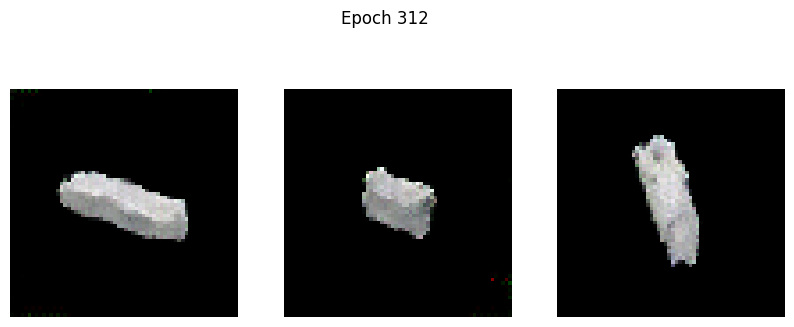

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -42.1764 - g_loss: 4.7064
Epoch 313/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -26.1964 - g_loss: 12.4499

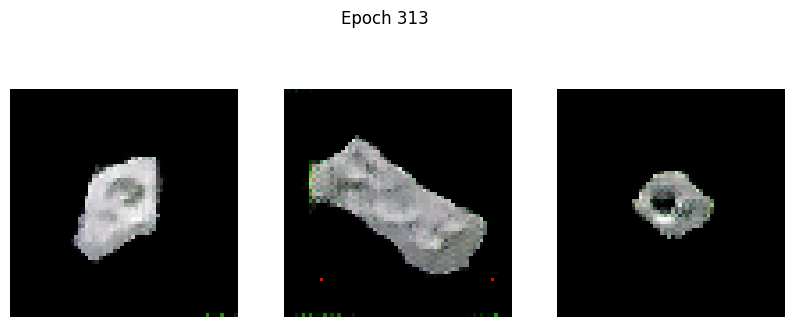

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -26.2247 - g_loss: 12.4225
Epoch 314/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -46.8993 - g_loss: 4.6376

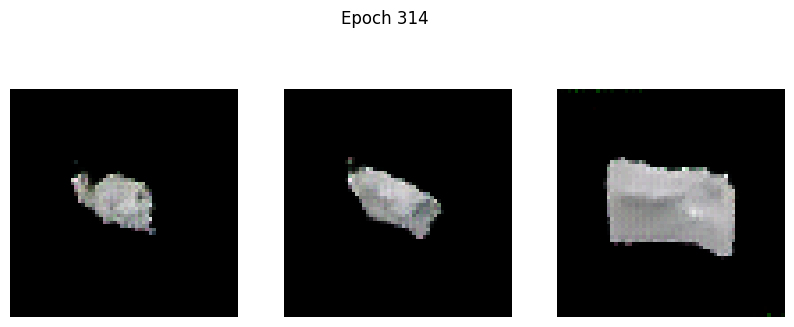

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -46.8578 - g_loss: 4.6426
Epoch 315/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -45.2973 - g_loss: 5.3829

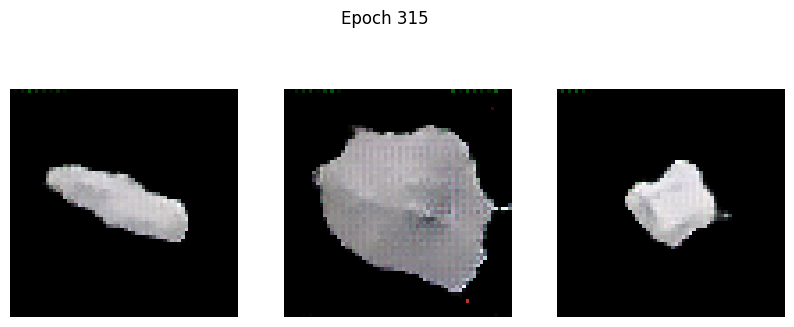

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -45.3023 - g_loss: 5.3780
Epoch 316/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -50.8125 - g_loss: 5.6331

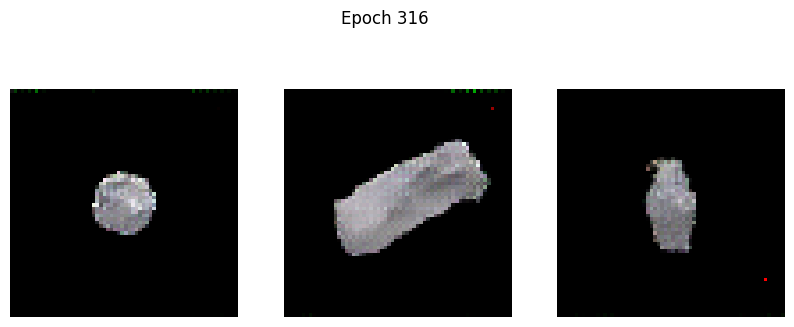

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -50.7738 - g_loss: 5.6433
Epoch 317/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -54.0128 - g_loss: 7.3218

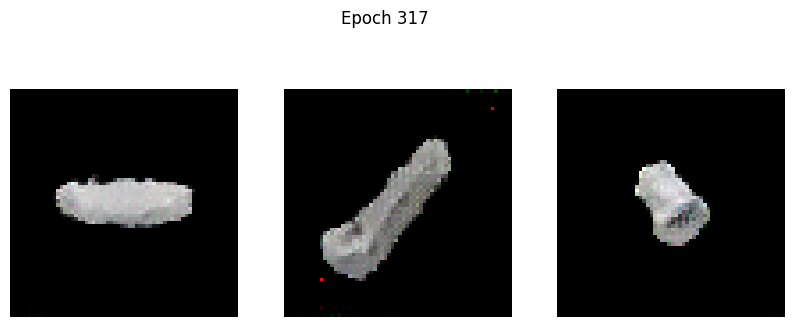

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -53.9967 - g_loss: 7.3126
Epoch 318/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -38.9741 - g_loss: 9.1567

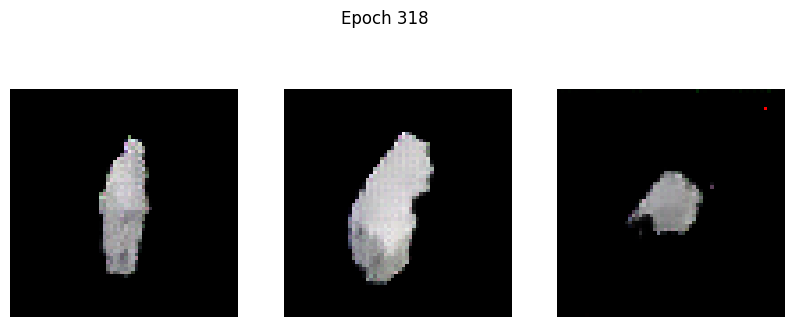

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -39.0072 - g_loss: 9.1497
Epoch 319/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -56.6801 - g_loss: 4.7125

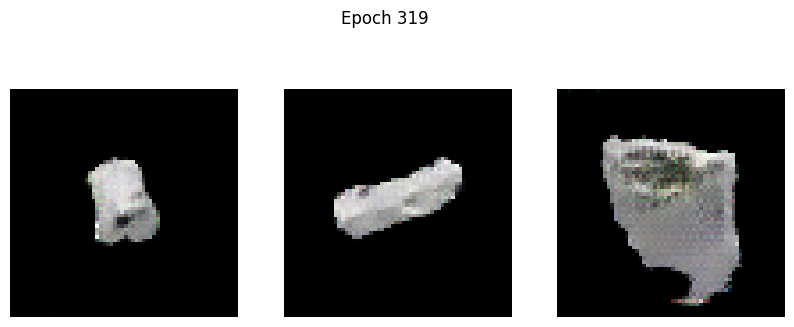

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -56.7932 - g_loss: 4.7124
Epoch 320/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -77.1468 - g_loss: 4.9623

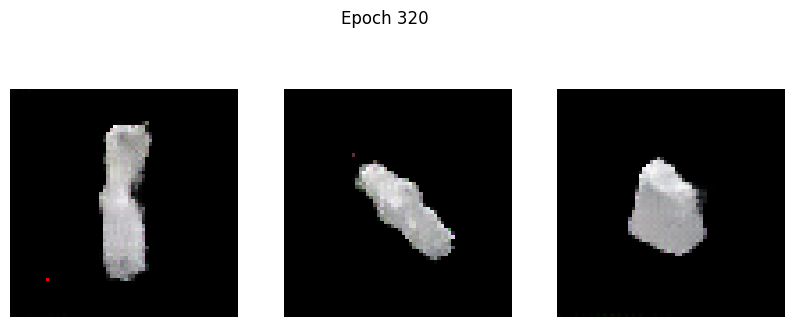

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -77.0994 - g_loss: 4.9667
Epoch 321/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -66.7581 - g_loss: 6.5350

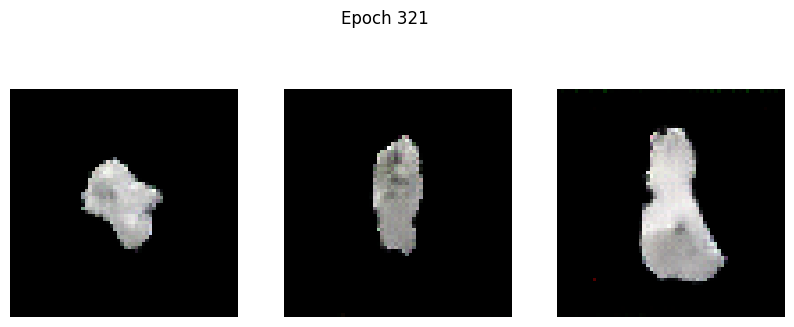

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -66.7558 - g_loss: 6.5340
Epoch 322/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 949.7818 - g_loss: 56.1091

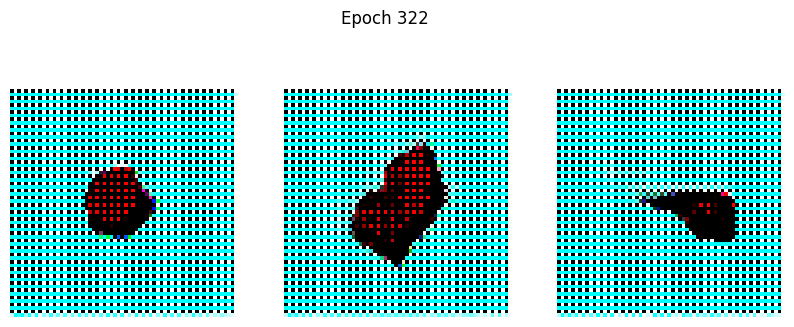

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 1014.8583 - g_loss: 63.5847
Epoch 323/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 795.2827 - g_loss: 6267.7651

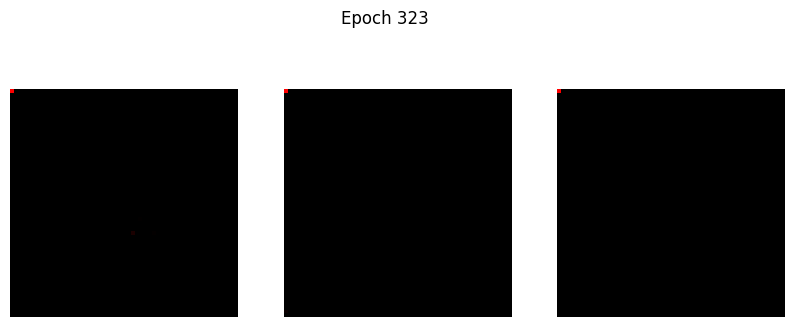

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 794.3722 - g_loss: 6238.1812
Epoch 324/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 172.2630 - g_loss: 1396.3988

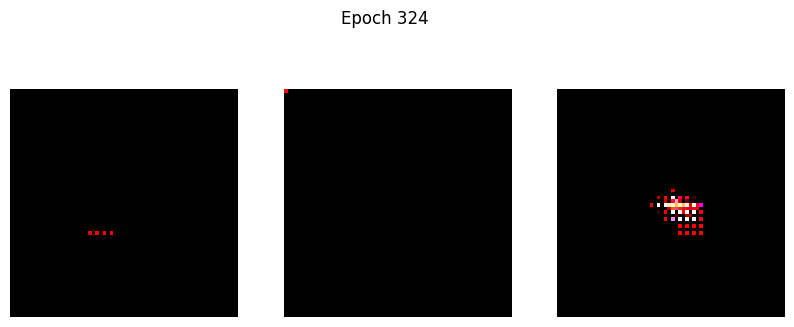

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 171.7705 - g_loss: 1393.7797
Epoch 325/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 25.2803 - g_loss: 1018.4478

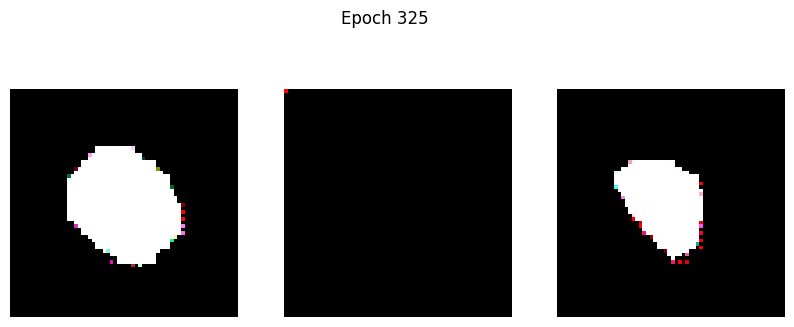

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 25.1815 - g_loss: 1016.7031
Epoch 326/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -6.3761 - g_loss: 653.4657

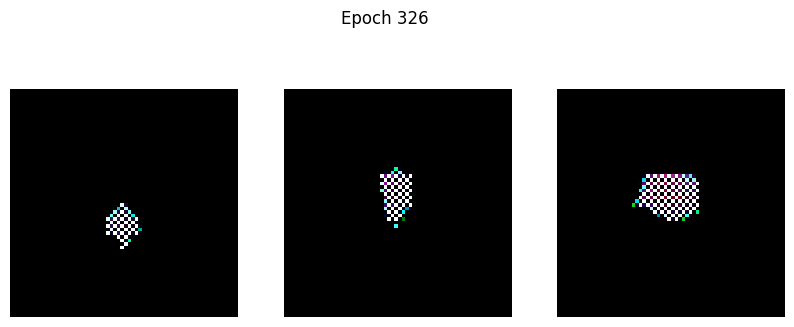

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -6.3724 - g_loss: 653.2319
Epoch 327/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -2.5048 - g_loss: 589.6732

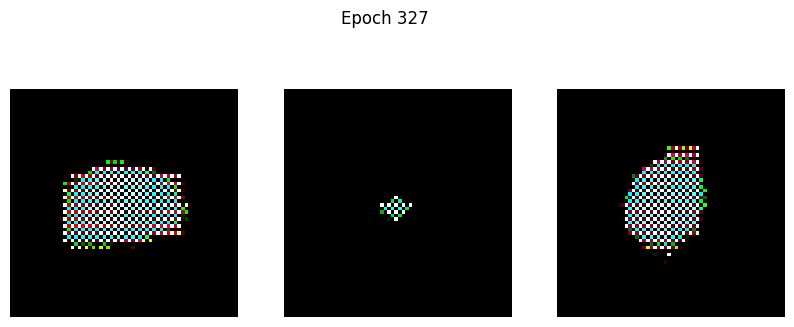

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -2.4618 - g_loss: 589.9973
Epoch 328/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 13.7370 - g_loss: 862.7223

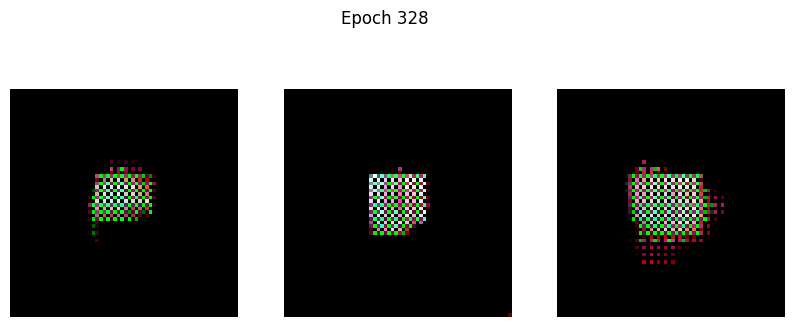

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 13.7190 - g_loss: 862.3368
Epoch 329/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 7.7079 - g_loss: 634.8154

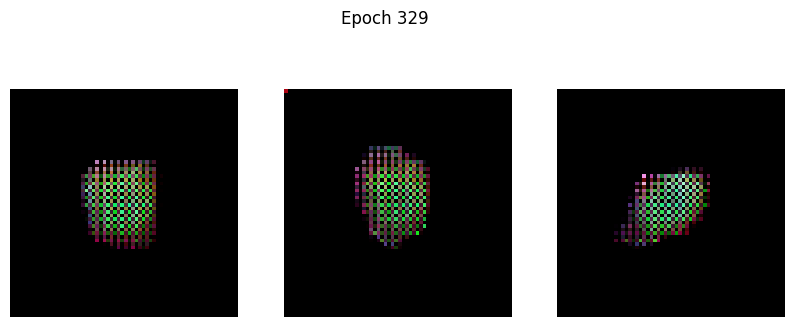

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 7.6616 - g_loss: 634.2521
Epoch 330/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.7464 - g_loss: 519.1345

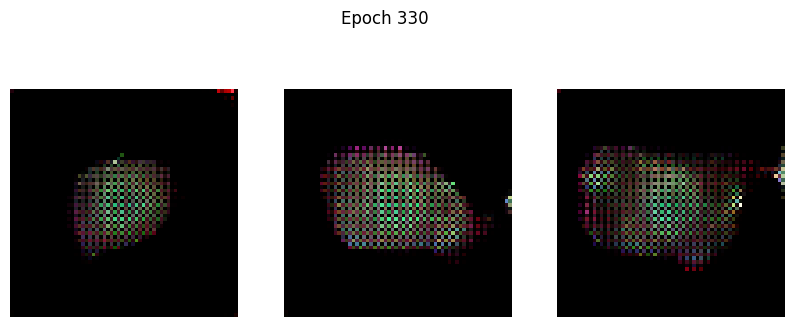

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.7897 - g_loss: 518.9985
Epoch 331/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -4.6955 - g_loss: 496.7110

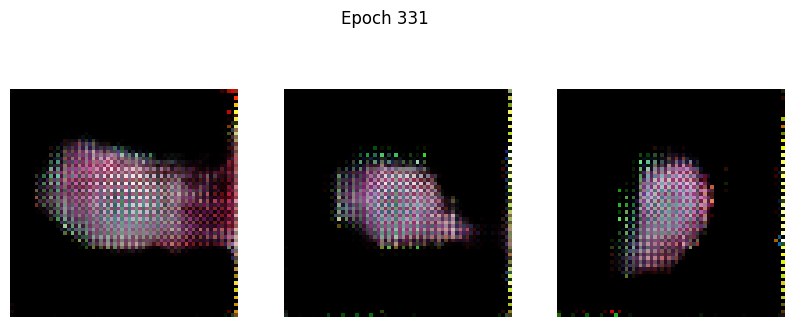

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.9767 - g_loss: 497.0578
Epoch 332/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 391.8751 - g_loss: 69.2081

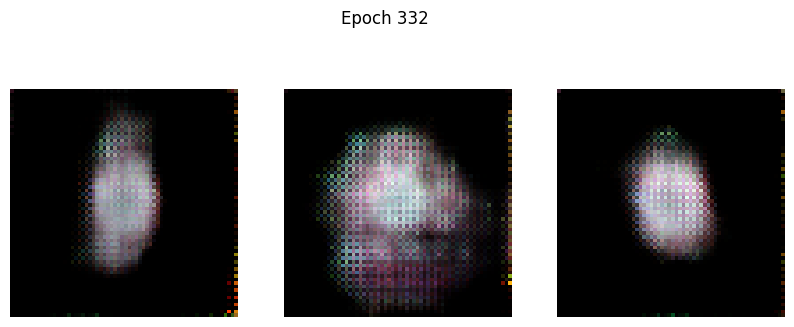

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 391.3266 - g_loss: 69.5332
Epoch 333/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 276.9960 - g_loss: 94.8245

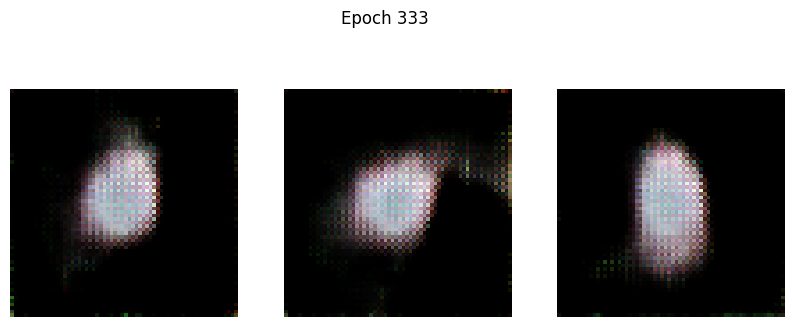

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 276.5198 - g_loss: 94.8840
Epoch 334/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 196.1213 - g_loss: 80.0484

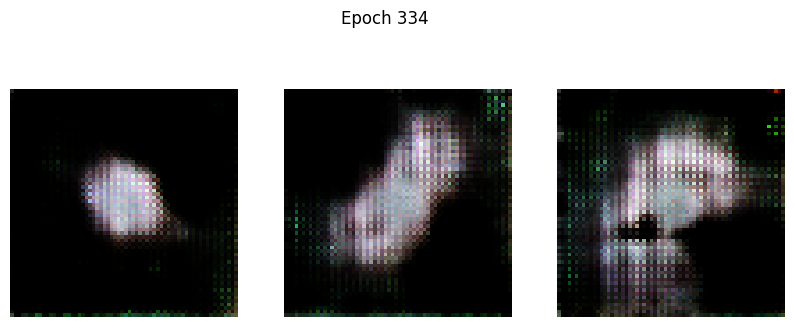

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 195.9659 - g_loss: 80.1396
Epoch 335/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 157.4386 - g_loss: 79.1013

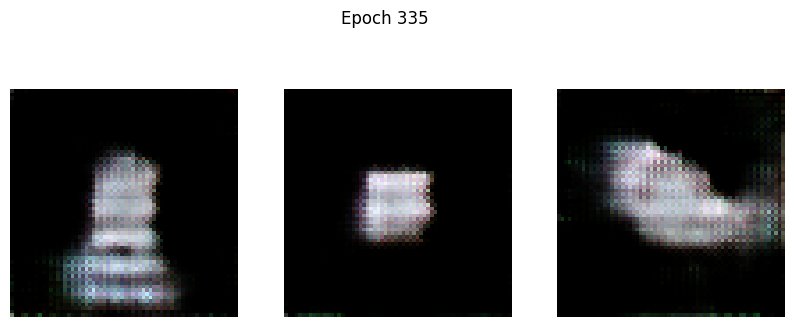

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 157.3517 - g_loss: 79.0084
Epoch 336/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 131.0204 - g_loss: 80.2879

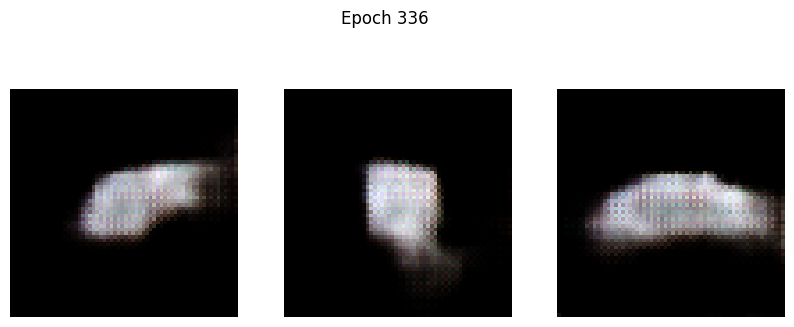

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - d_loss: 130.9479 - g_loss: 80.3183
Epoch 337/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 104.7754 - g_loss: 59.7718

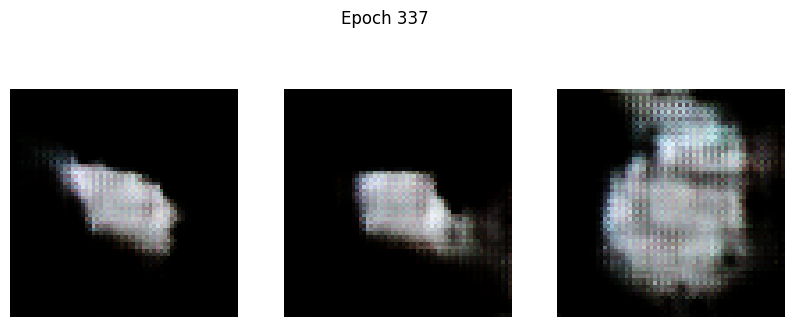

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 104.7718 - g_loss: 59.8039
Epoch 338/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 87.5471 - g_loss: 51.2440

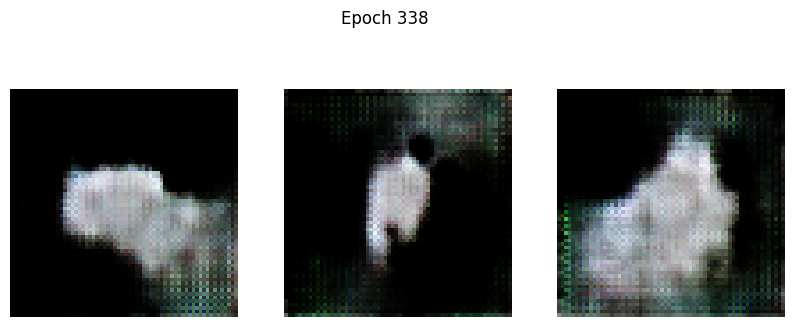

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 87.6145 - g_loss: 51.3261
Epoch 339/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 94.6971 - g_loss: 56.7542

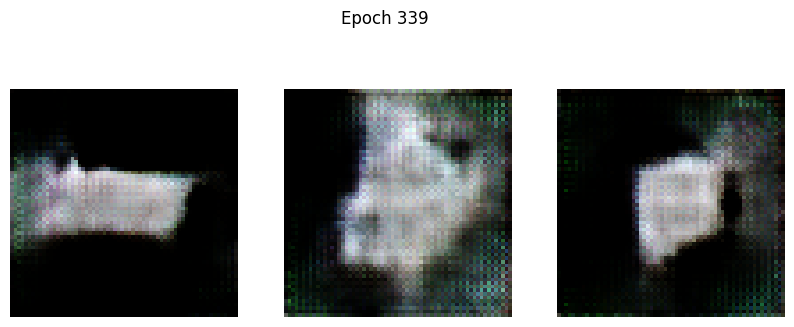

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 94.5419 - g_loss: 56.7754
Epoch 340/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 85.5176 - g_loss: 54.8792

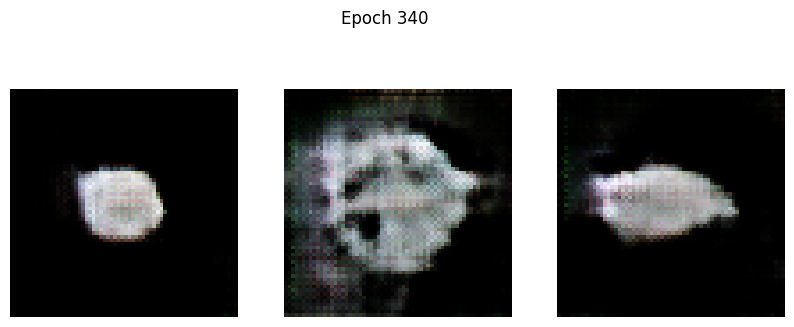

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 85.4155 - g_loss: 54.9494
Epoch 341/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 64.8250 - g_loss: 67.1646

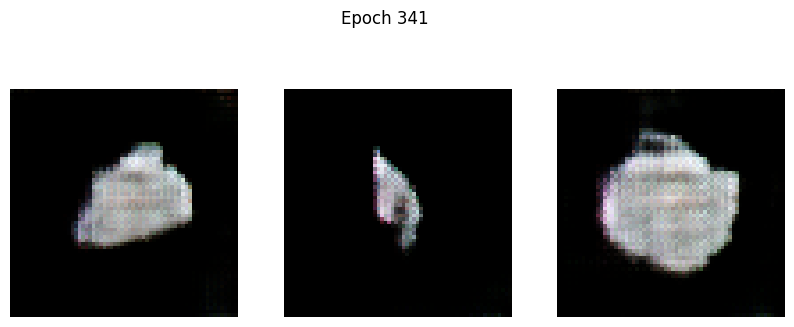

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 64.7797 - g_loss: 67.0529
Epoch 342/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 51.5538 - g_loss: 49.1713

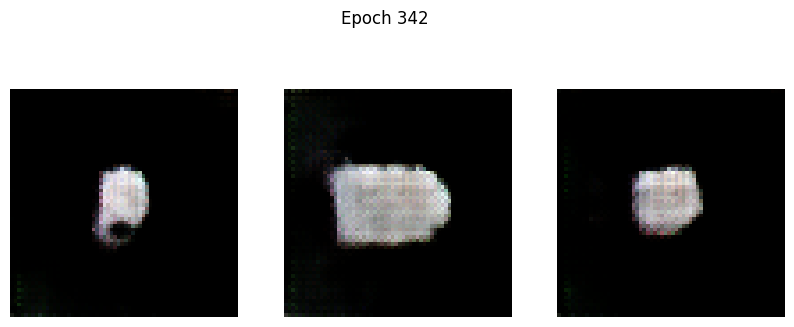

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 51.5159 - g_loss: 49.1674
Epoch 343/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 46.7378 - g_loss: 55.5761

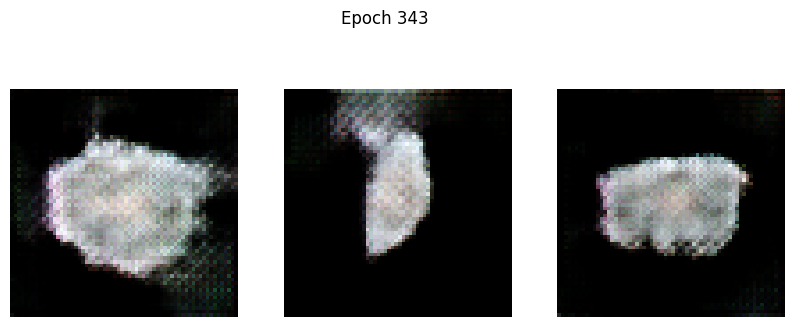

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 46.7060 - g_loss: 55.5420
Epoch 344/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 56.2878 - g_loss: 43.4585

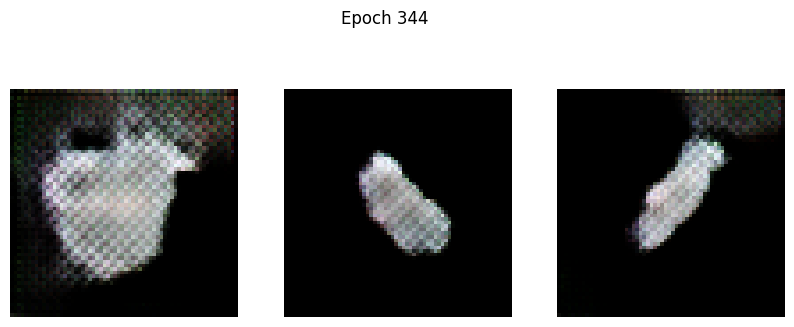

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 56.1669 - g_loss: 43.4366
Epoch 345/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 41.9773 - g_loss: 41.8237

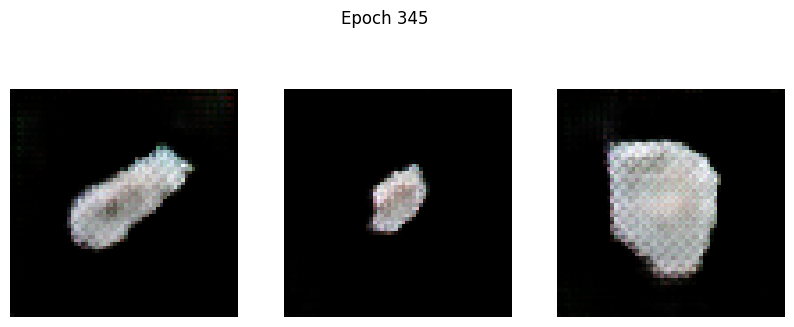

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 41.9641 - g_loss: 41.8268
Epoch 346/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 38.5884 - g_loss: 35.3184

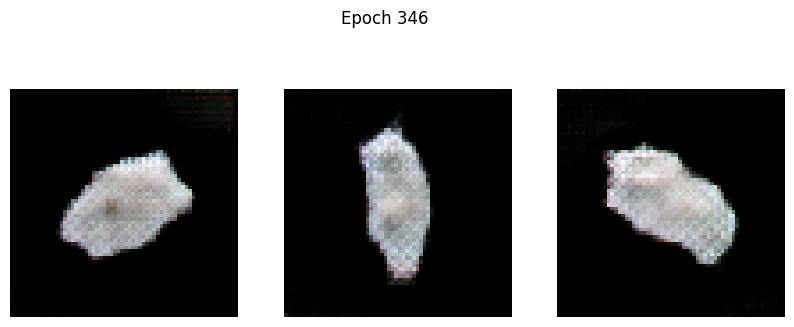

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 38.6039 - g_loss: 35.4005
Epoch 347/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 46.3386 - g_loss: 49.1279

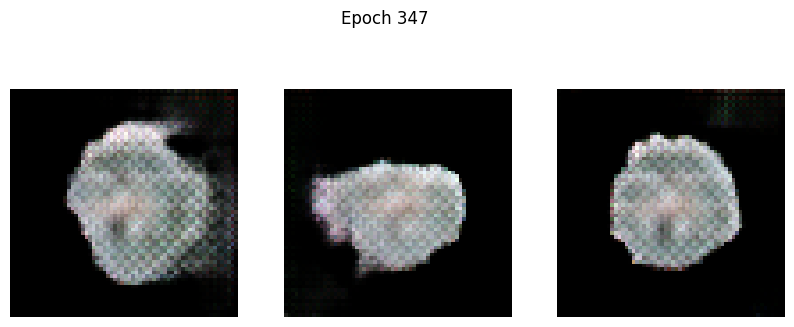

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 46.2500 - g_loss: 49.0014
Epoch 348/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 45.1975 - g_loss: 50.4037

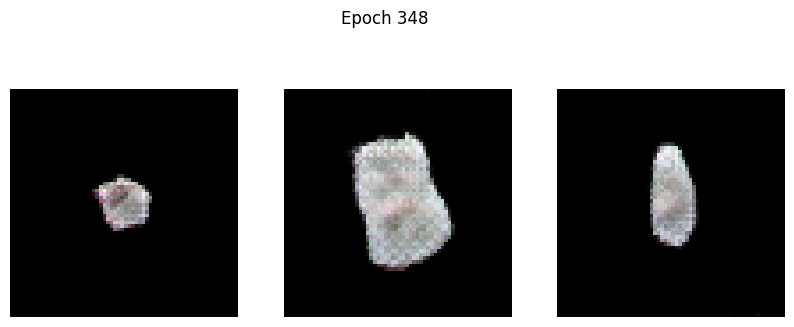

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 45.1682 - g_loss: 50.3252
Epoch 349/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 34.6586 - g_loss: 31.4489

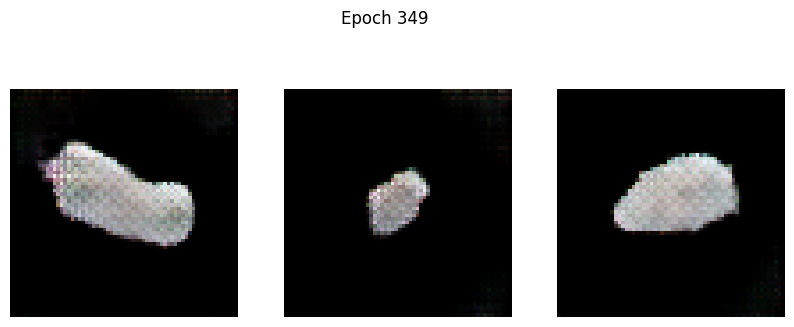

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 34.6389 - g_loss: 31.4513
Epoch 350/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 28.5824 - g_loss: 25.6691

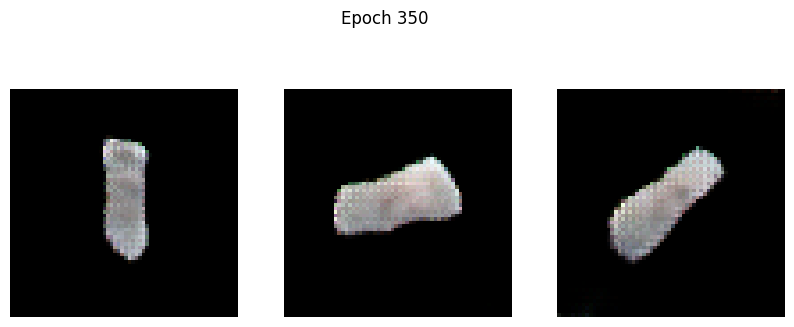

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 28.5808 - g_loss: 25.6624
Epoch 351/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 39.7052 - g_loss: 47.0404

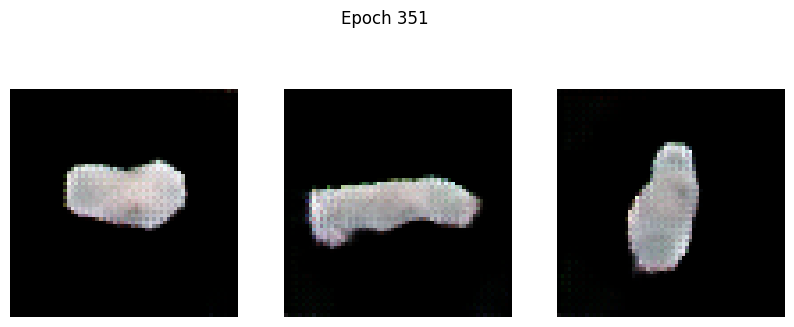

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 39.6169 - g_loss: 46.9079
Epoch 352/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 24.9814 - g_loss: 23.9713

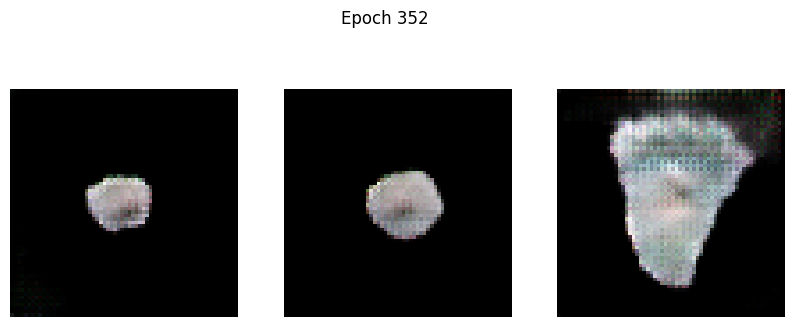

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 24.9804 - g_loss: 23.9695
Epoch 353/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 23.4341 - g_loss: 23.1983

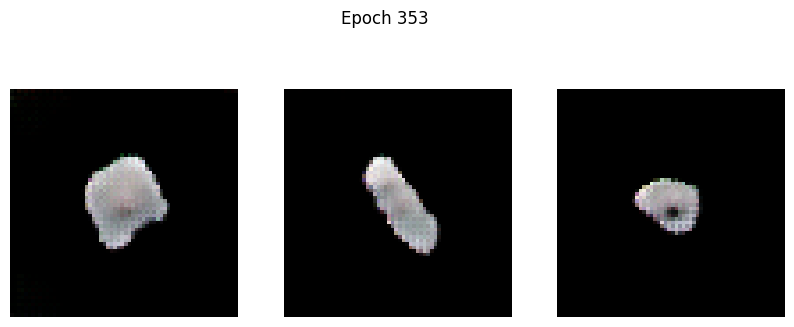

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 23.4442 - g_loss: 23.1812
Epoch 354/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 23.3277 - g_loss: 19.7504

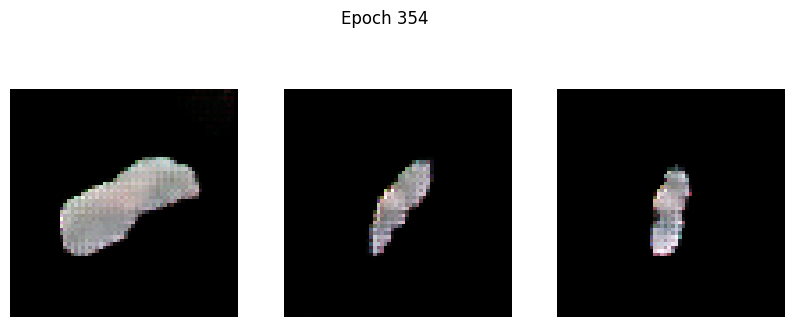

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 23.3327 - g_loss: 19.7348
Epoch 355/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 22.2804 - g_loss: 23.8005

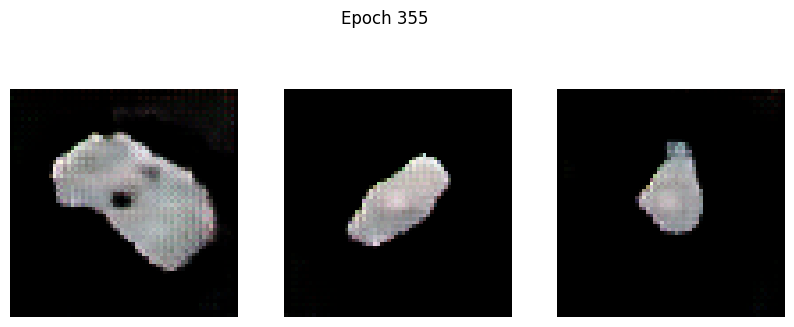

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 22.2912 - g_loss: 23.8070
Epoch 356/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 23.4319 - g_loss: 22.2764

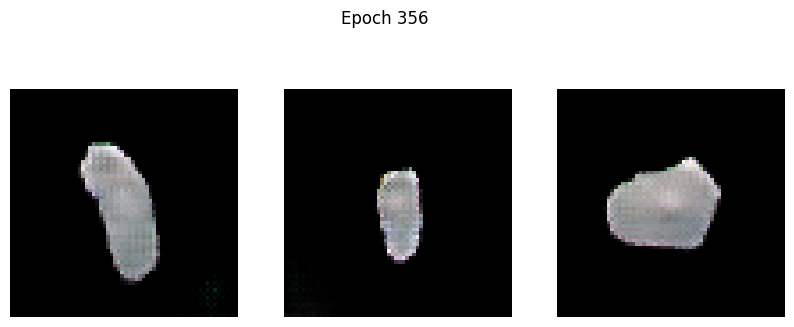

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 23.4491 - g_loss: 22.2815
Epoch 357/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 24.7307 - g_loss: 23.3057

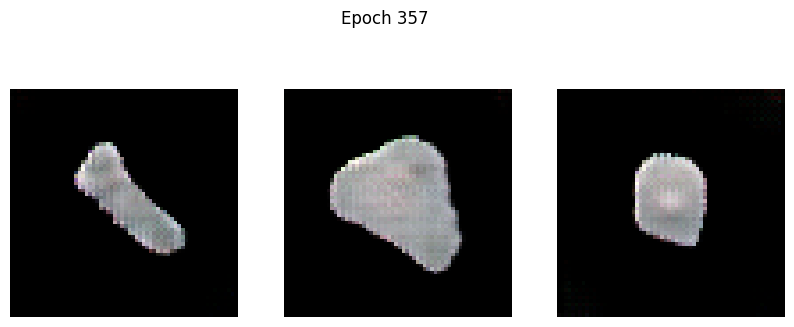

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 24.7290 - g_loss: 23.3297
Epoch 358/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 21.2824 - g_loss: 26.6792

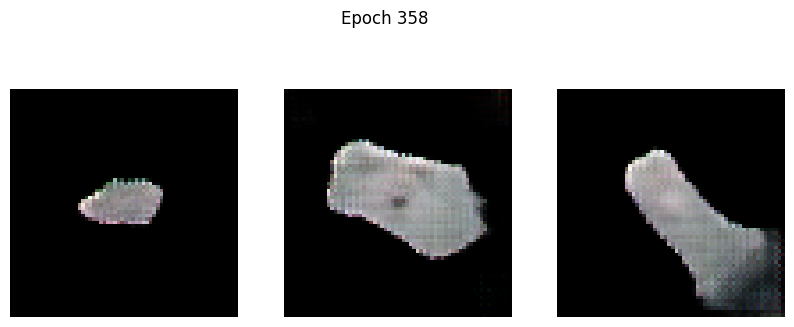

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 21.3145 - g_loss: 26.6588
Epoch 359/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 17.5947 - g_loss: 14.2766

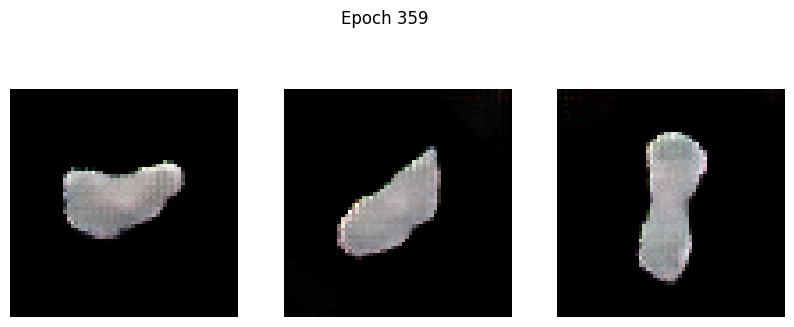

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 17.5803 - g_loss: 14.2735
Epoch 360/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 12.6138 - g_loss: 16.6079

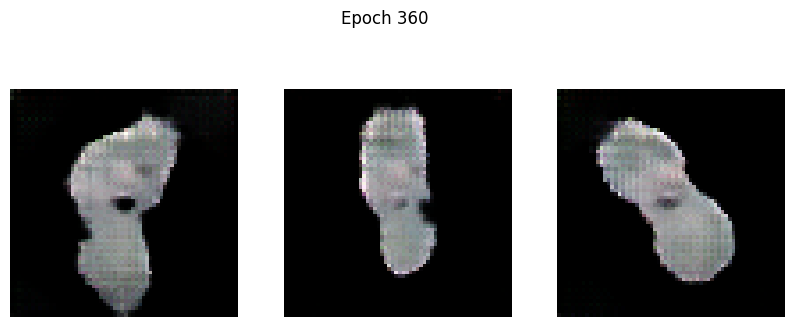

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 12.6121 - g_loss: 16.6004
Epoch 361/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 12.8874 - g_loss: 14.3827

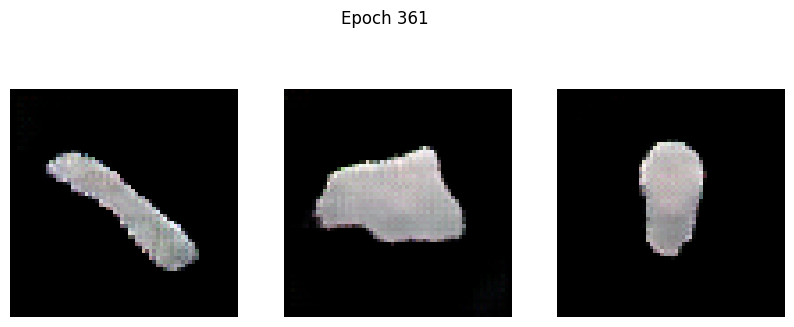

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 12.8846 - g_loss: 14.4056
Epoch 362/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 5.9006 - g_loss: 14.1126

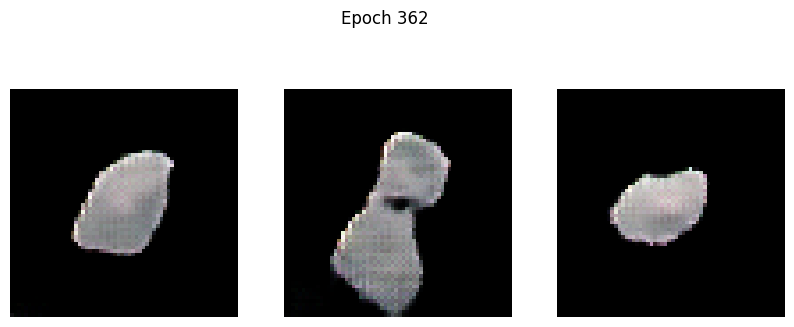

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 5.9258 - g_loss: 14.1198
Epoch 363/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 12.9330 - g_loss: 13.1305

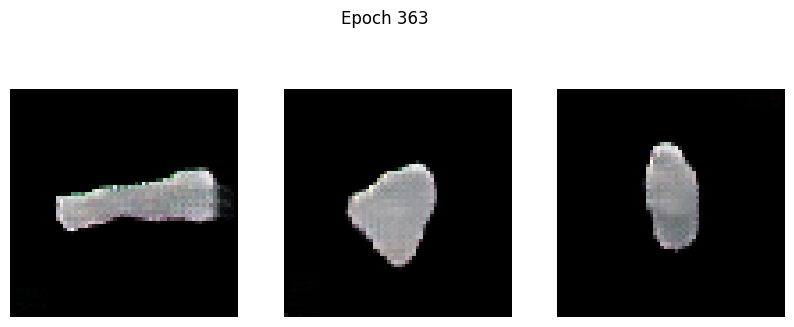

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 12.8893 - g_loss: 13.1290
Epoch 364/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 5.7827 - g_loss: 14.1899

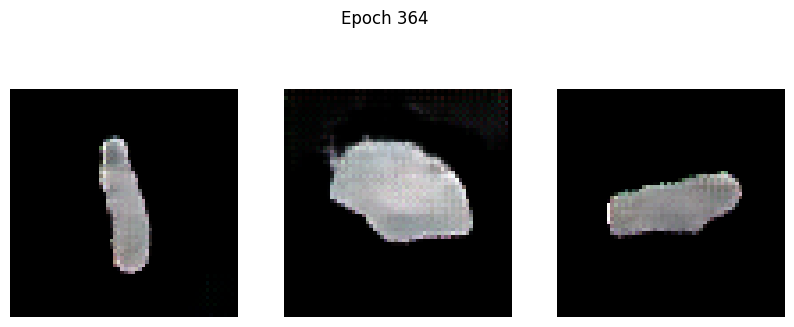

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 5.7964 - g_loss: 14.1992
Epoch 365/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 5.2492 - g_loss: 14.8203

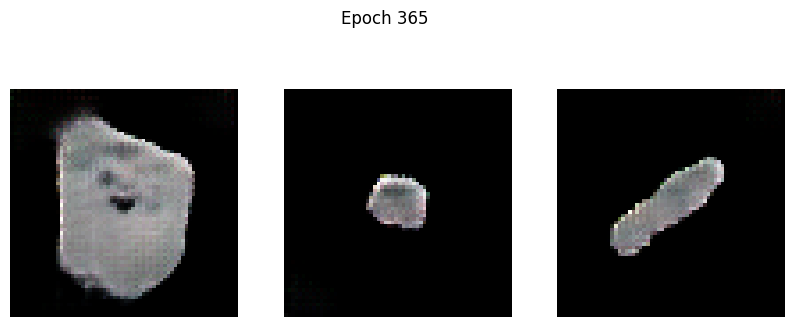

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 5.2394 - g_loss: 14.8141
Epoch 366/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 5.3184 - g_loss: 12.0218

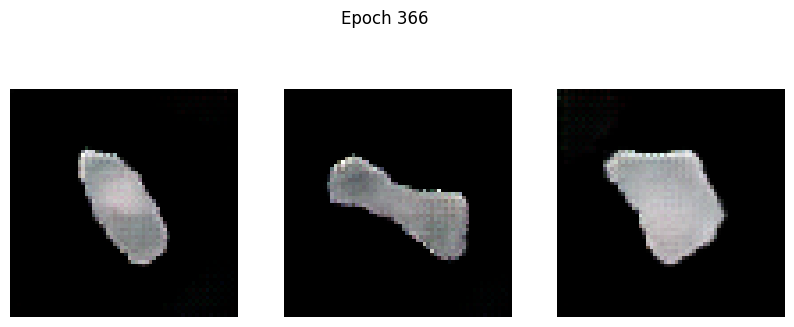

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 5.3114 - g_loss: 12.0241
Epoch 367/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.6689 - g_loss: 13.0457

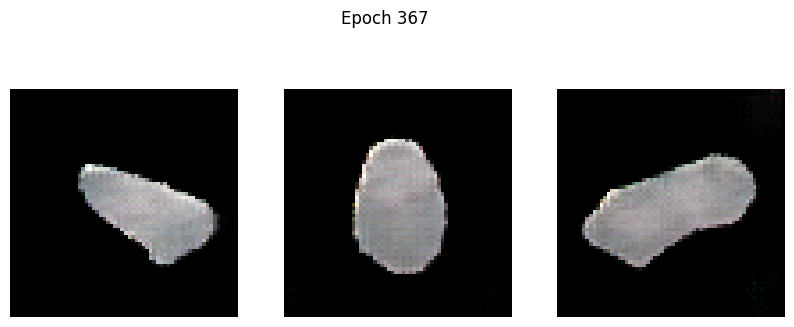

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.6546 - g_loss: 13.0539
Epoch 368/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 3.2896 - g_loss: 11.1704

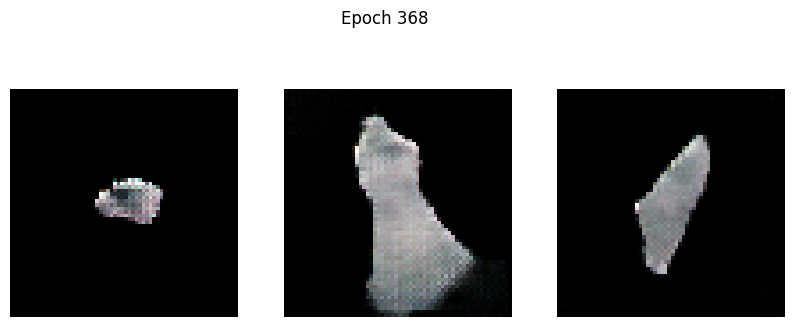

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 3.2862 - g_loss: 11.1758
Epoch 369/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.4818 - g_loss: 12.6351

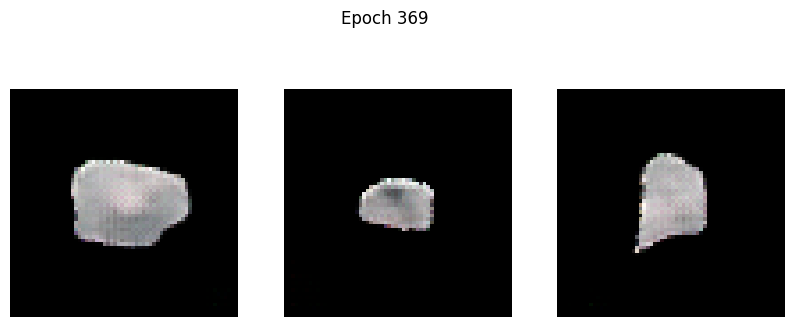

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.4620 - g_loss: 12.6308
Epoch 370/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2655 - g_loss: 13.5280

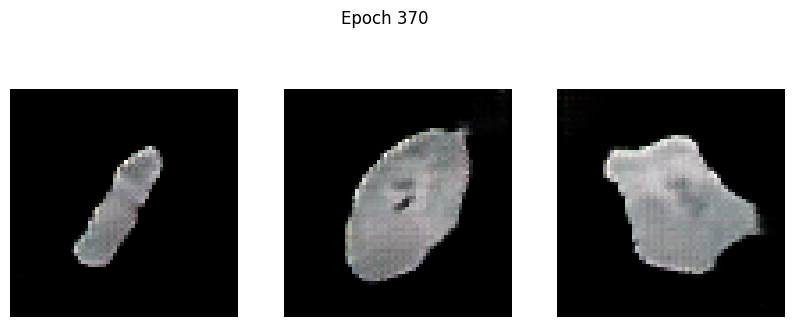

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2547 - g_loss: 13.5202
Epoch 371/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.6286 - g_loss: 10.4791

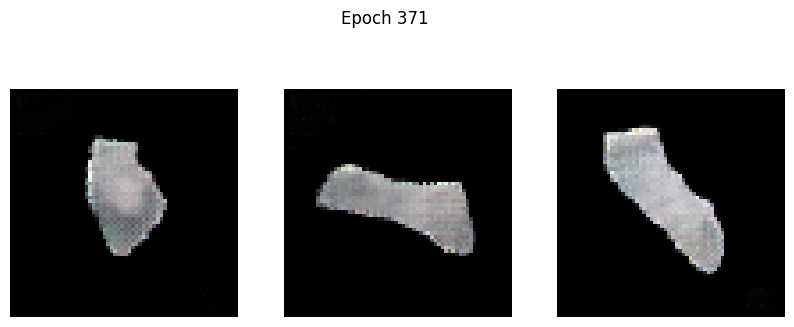

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.6400 - g_loss: 10.4805
Epoch 372/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.9526 - g_loss: 10.8241

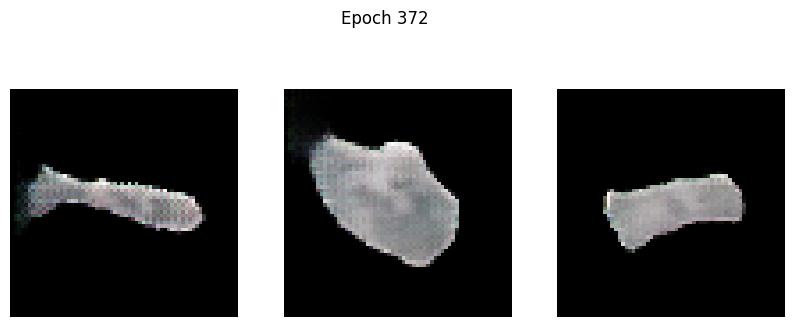

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.9245 - g_loss: 10.8240
Epoch 373/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.0306 - g_loss: 10.6394

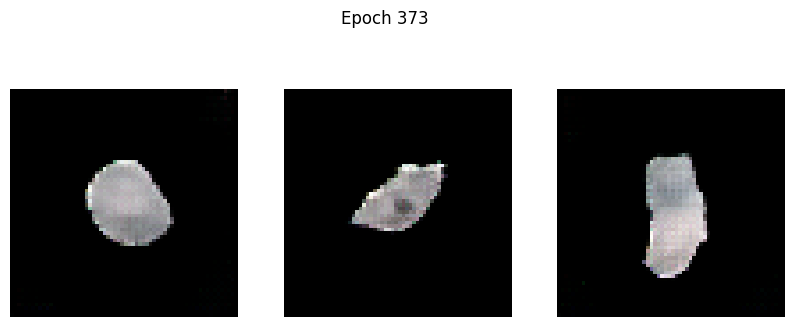

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.0089 - g_loss: 10.6403
Epoch 374/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.3772 - g_loss: 9.4273

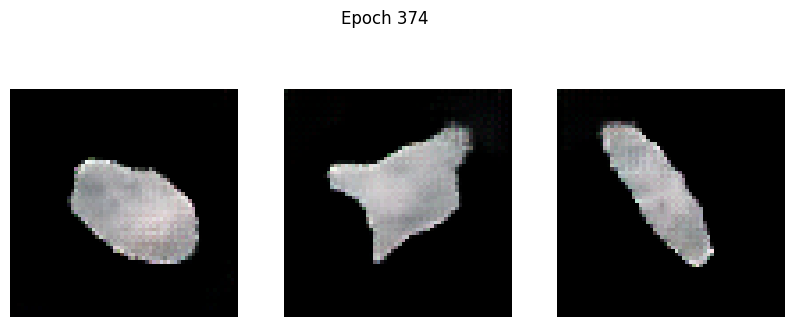

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.4113 - g_loss: 9.4330
Epoch 375/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.1796 - g_loss: 10.2868

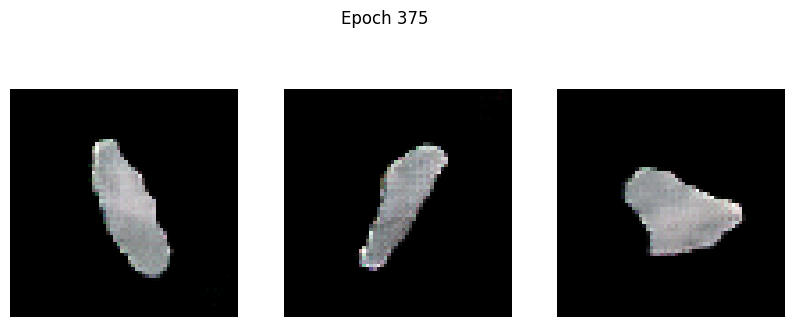

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.1708 - g_loss: 10.2848
Epoch 376/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.5614 - g_loss: 10.4463

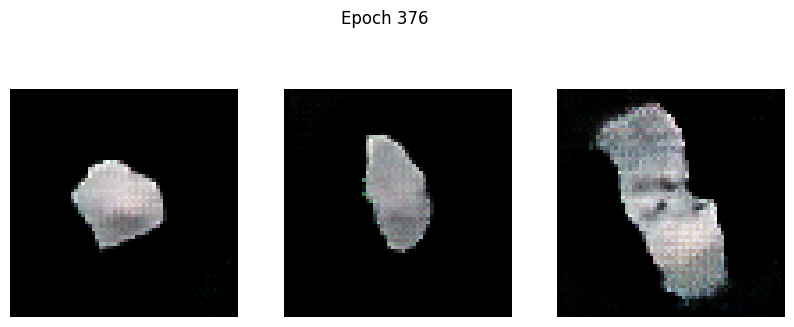

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.5653 - g_loss: 10.4431
Epoch 377/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.5457 - g_loss: 9.5511

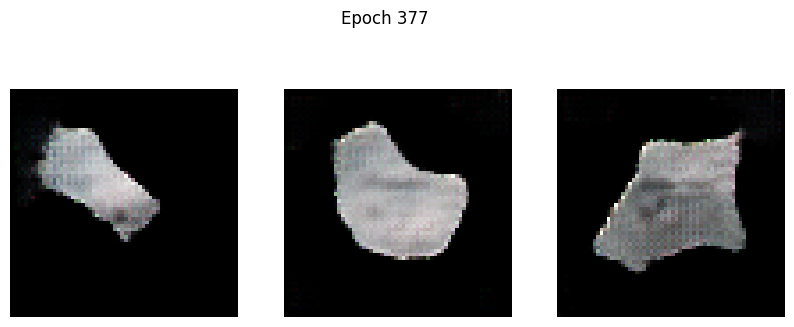

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.5650 - g_loss: 9.5472
Epoch 378/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.7246 - g_loss: 9.1580

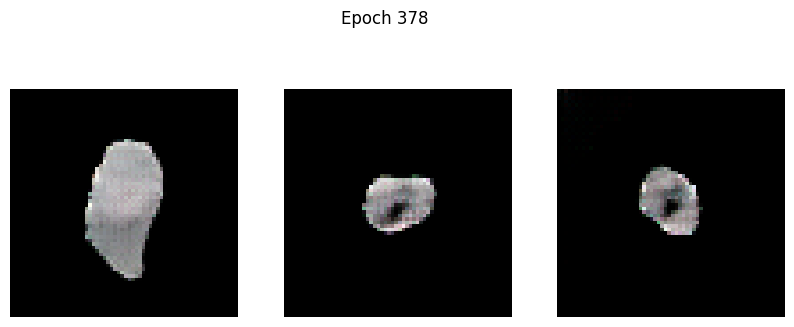

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -8.7309 - g_loss: 9.1577
Epoch 379/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.3289 - g_loss: 8.3397

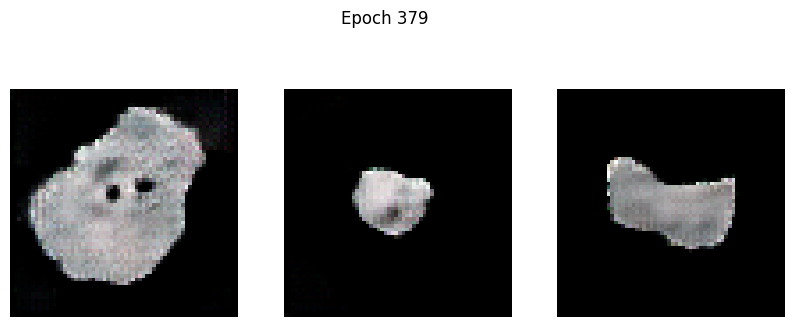

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.3559 - g_loss: 8.3442
Epoch 380/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -14.4281 - g_loss: 8.3427

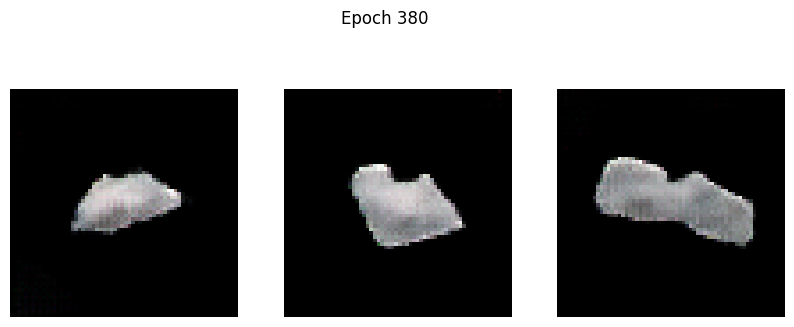

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -14.4308 - g_loss: 8.3442
Epoch 381/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -13.2635 - g_loss: 8.1184

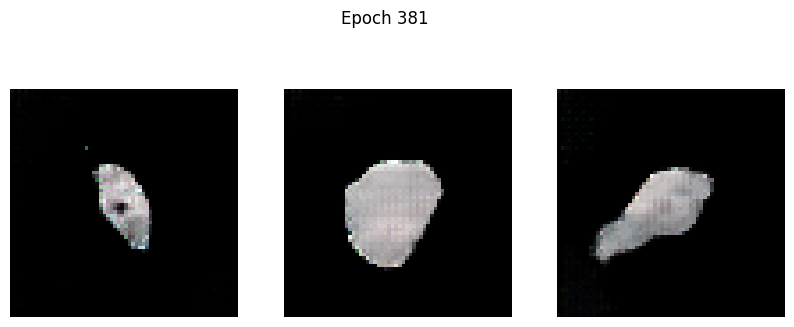

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -13.2760 - g_loss: 8.1192
Epoch 382/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -13.6845 - g_loss: 7.6308

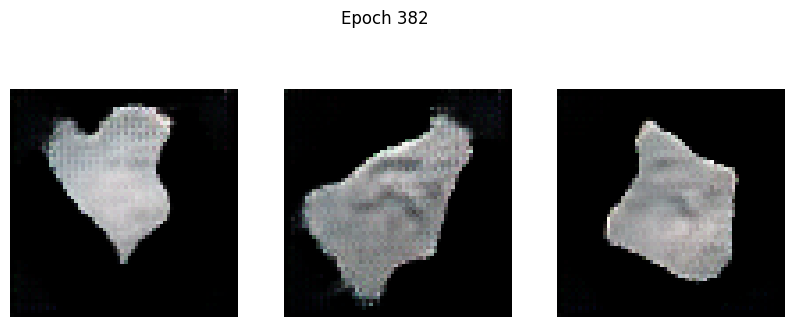

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -13.7054 - g_loss: 7.6320
Epoch 383/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -19.2079 - g_loss: 8.2079

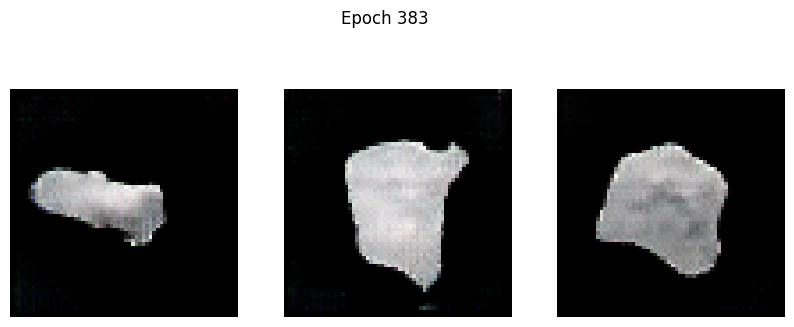

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -19.2251 - g_loss: 8.2063
Epoch 384/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -19.7195 - g_loss: 7.5694

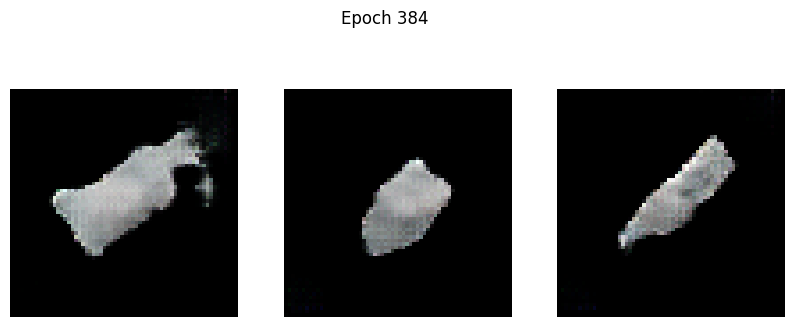

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -19.7306 - g_loss: 7.5690
Epoch 385/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -17.1689 - g_loss: 8.7365

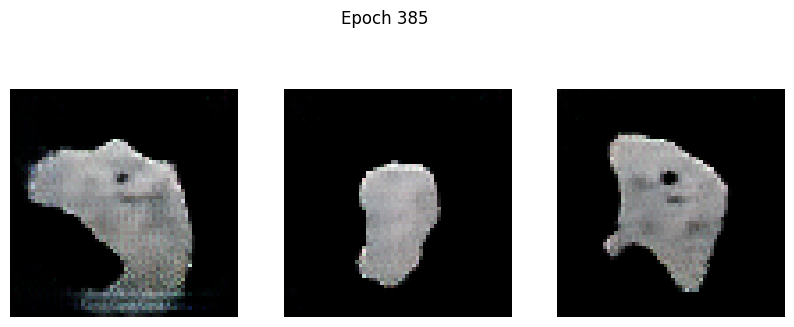

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -17.1975 - g_loss: 8.7269
Epoch 386/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -25.9654 - g_loss: 6.7315

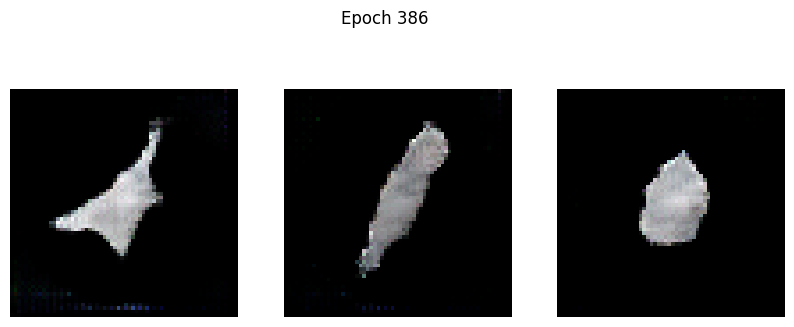

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -25.9430 - g_loss: 6.7347
Epoch 387/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -19.0038 - g_loss: 7.0595

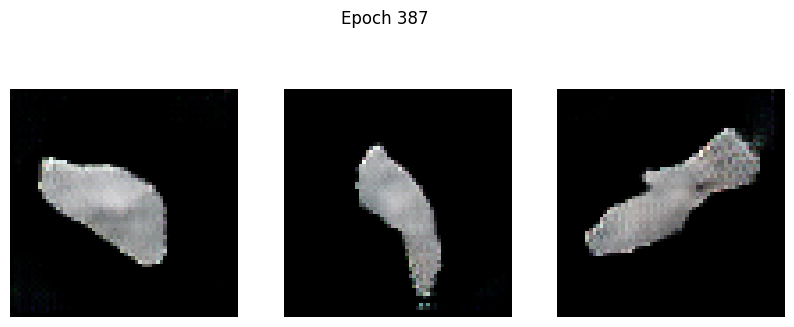

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -19.0768 - g_loss: 7.0569
Epoch 388/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -30.9432 - g_loss: 6.1889

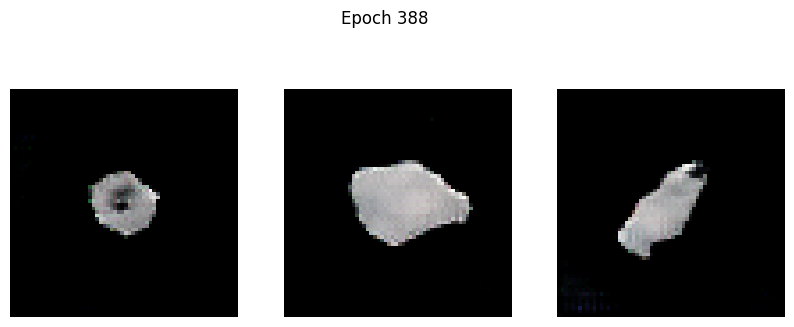

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -30.9216 - g_loss: 6.1923
Epoch 389/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -30.6061 - g_loss: 5.9432

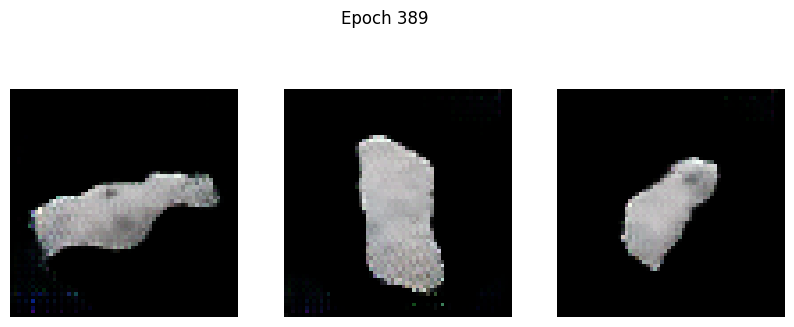

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -30.6065 - g_loss: 5.9409
Epoch 390/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -31.6917 - g_loss: 6.4450

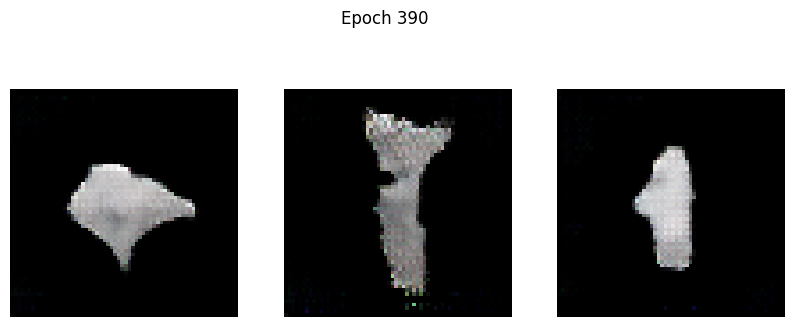

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -31.7007 - g_loss: 6.4457
Epoch 391/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -25.4875 - g_loss: 10.4905

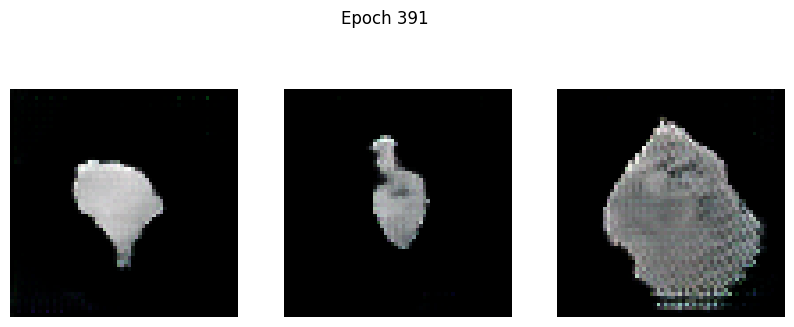

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -25.4766 - g_loss: 10.5122
Epoch 392/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.4445 - g_loss: 30.4672

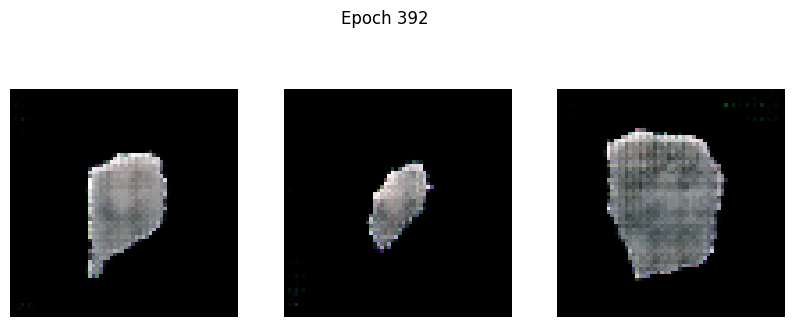

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.4066 - g_loss: 30.6066
Epoch 393/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -14.4066 - g_loss: 16.9173

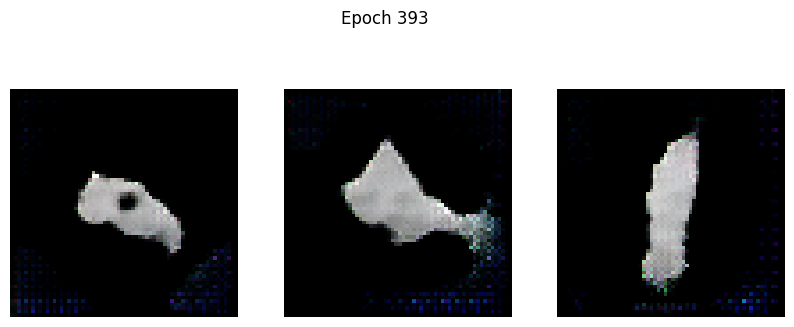

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -14.5120 - g_loss: 16.8914
Epoch 394/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -33.3221 - g_loss: 9.0394

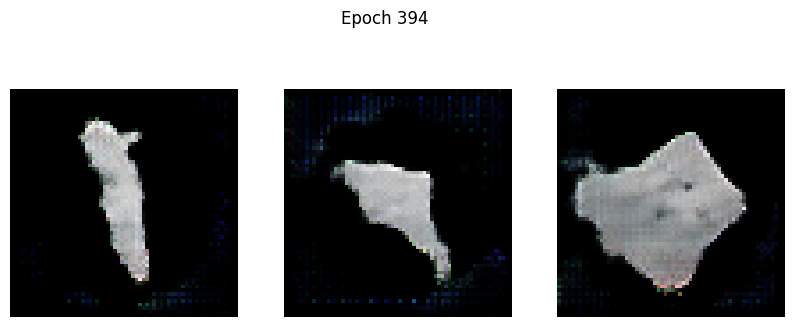

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -33.3010 - g_loss: 9.0335
Epoch 395/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -37.8224 - g_loss: 7.1136

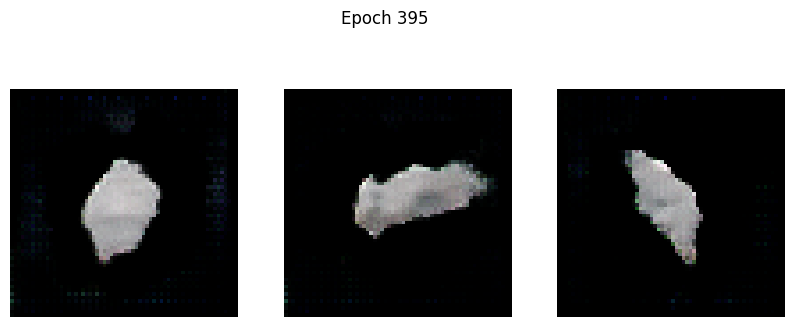

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -37.7847 - g_loss: 7.1142
Epoch 396/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -46.4362 - g_loss: 5.7409

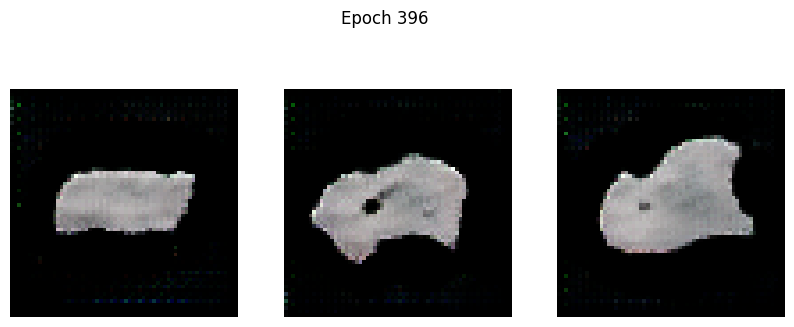

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -46.3865 - g_loss: 5.7424
Epoch 397/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -39.0827 - g_loss: 5.7723

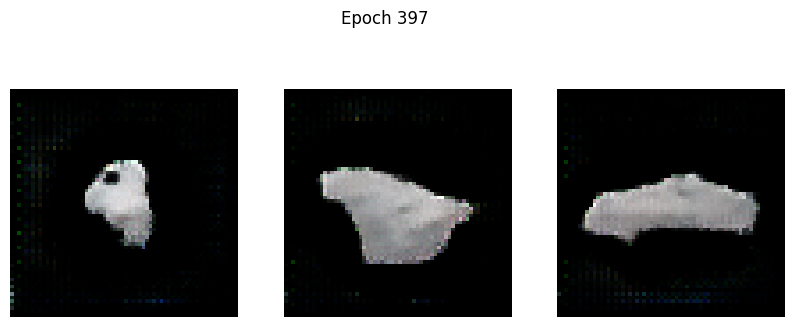

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -39.1318 - g_loss: 5.7681
Epoch 398/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -49.2436 - g_loss: 5.6262

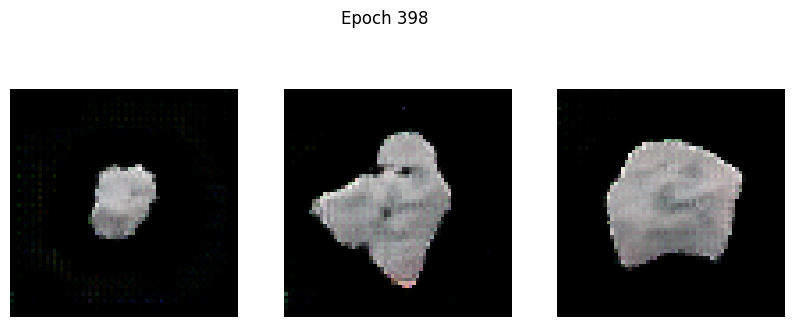

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -49.1840 - g_loss: 5.6211
Epoch 399/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -49.9844 - g_loss: 4.4200

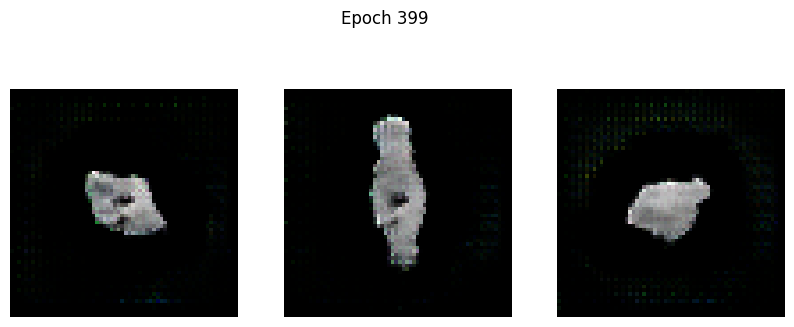

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -50.0541 - g_loss: 4.4215
Epoch 400/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -62.6156 - g_loss: 4.6543

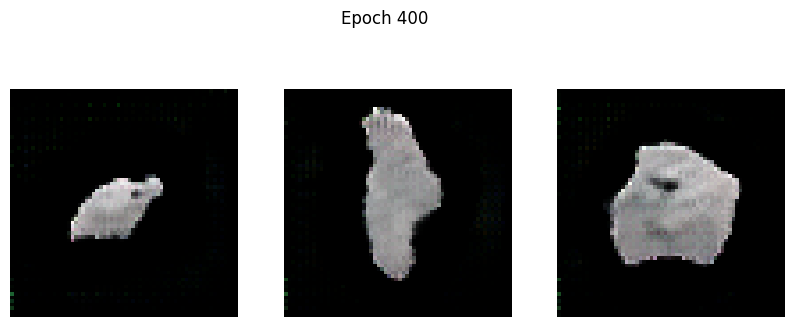

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -62.5746 - g_loss: 4.6525
Epoch 401/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -48.9012 - g_loss: 4.2004

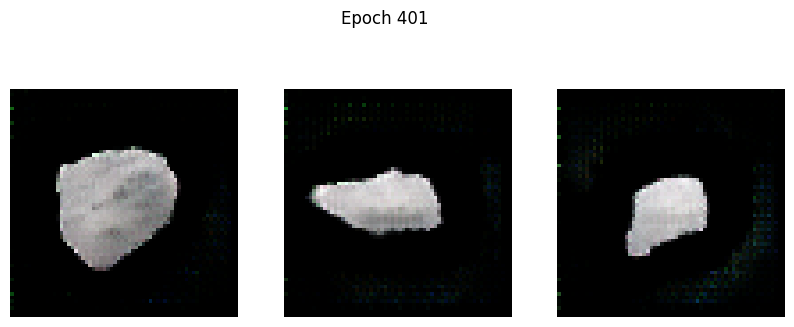

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -48.9214 - g_loss: 4.2033
Epoch 402/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -53.8821 - g_loss: 5.7648

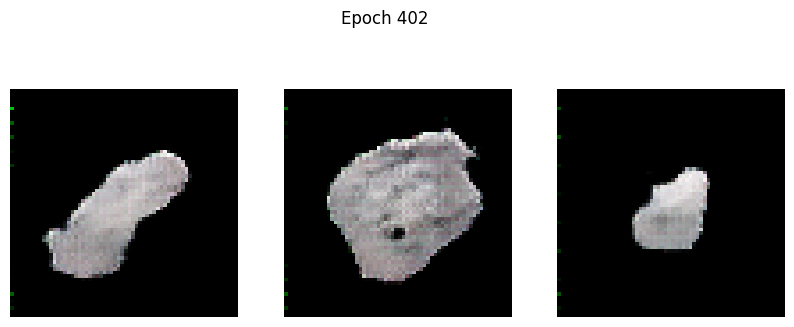

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -53.8182 - g_loss: 5.7694
Epoch 403/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -75.9131 - g_loss: 5.0318

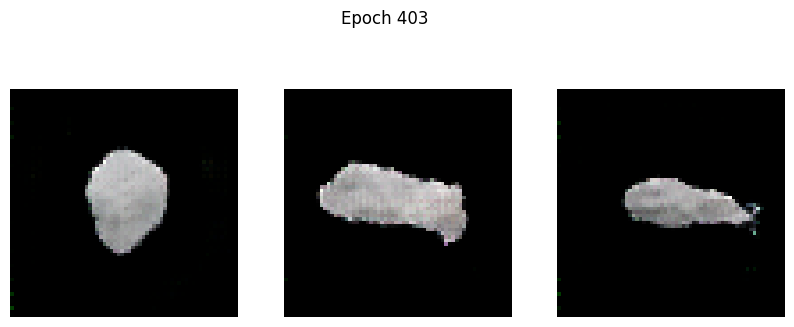

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -75.7982 - g_loss: 5.0283
Epoch 404/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.0028 - g_loss: 35.1831

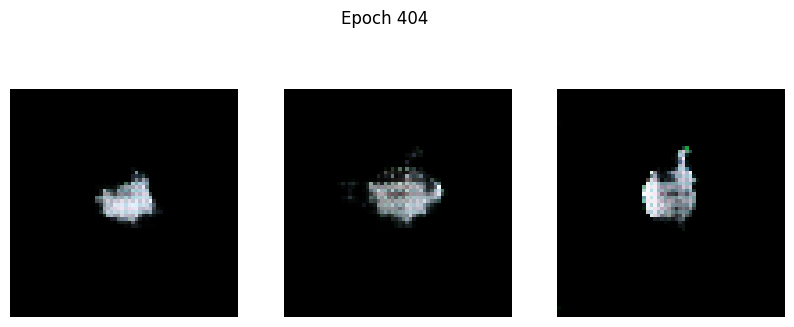

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.4807 - g_loss: 35.8584
Epoch 405/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -45.6226 - g_loss: 33.9046

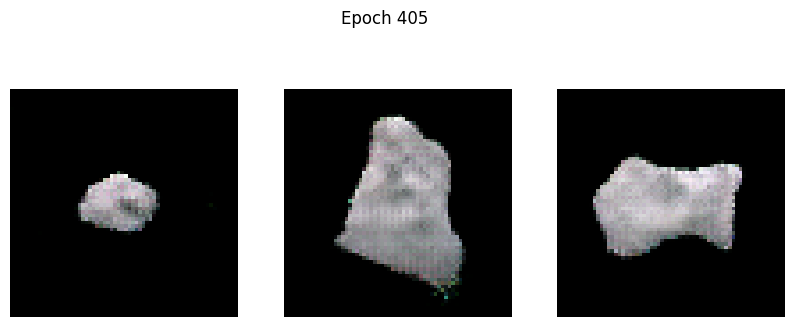

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -45.6017 - g_loss: 33.8051
Epoch 406/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -50.4988 - g_loss: 10.4684

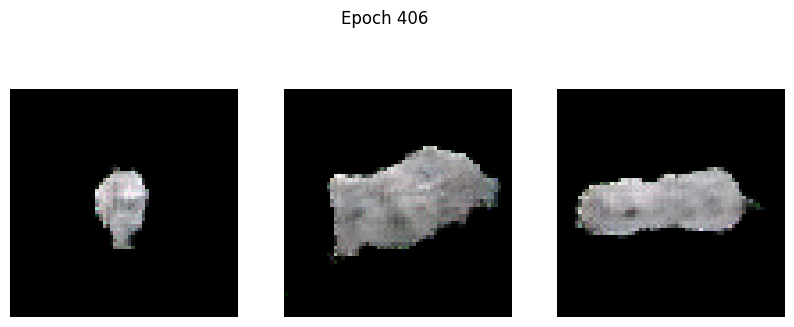

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -50.5167 - g_loss: 10.4481
Epoch 407/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -68.1592 - g_loss: 6.5383

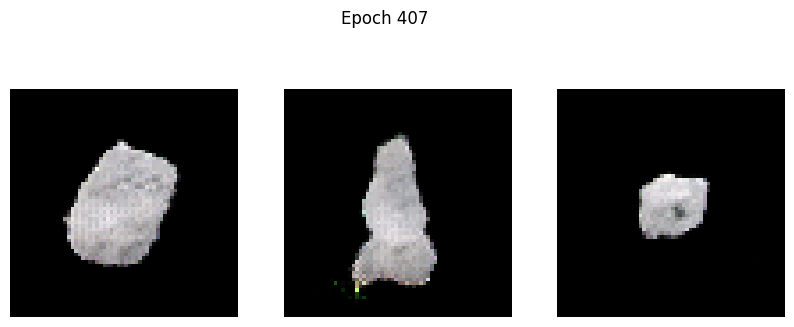

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -68.0813 - g_loss: 6.5351
Epoch 408/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -21.2462 - g_loss: 19.9035

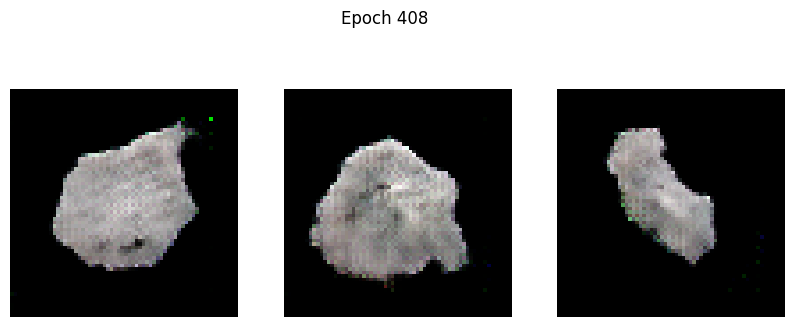

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -21.0389 - g_loss: 20.0729
Epoch 409/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -50.1134 - g_loss: 14.7859

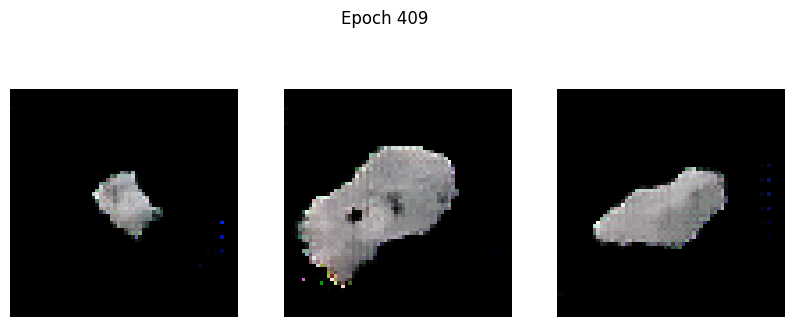

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -50.0779 - g_loss: 14.7626
Epoch 410/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -56.3852 - g_loss: 8.8058

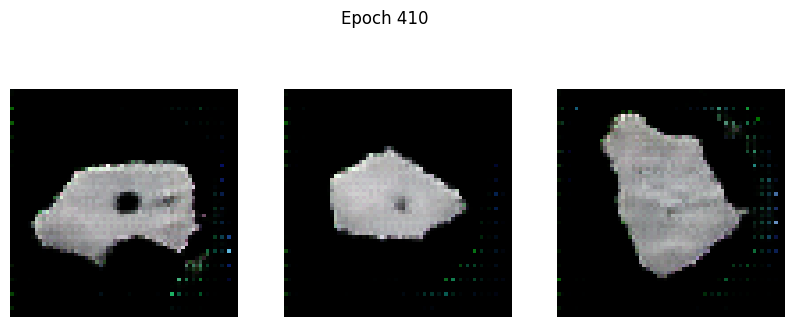

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -56.3817 - g_loss: 8.7991
Epoch 411/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -57.4356 - g_loss: 7.0616

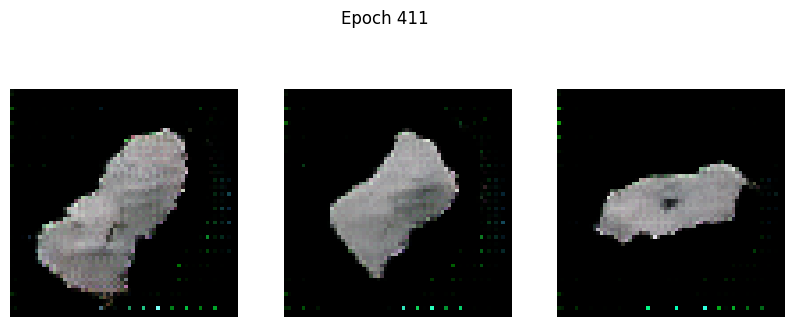

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -57.4987 - g_loss: 7.0587
Epoch 412/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -67.1346 - g_loss: 6.0144

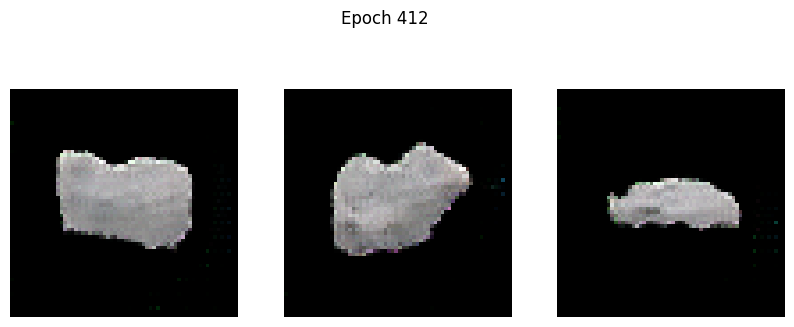

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -67.1120 - g_loss: 6.0144
Epoch 413/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -64.9099 - g_loss: 5.5886

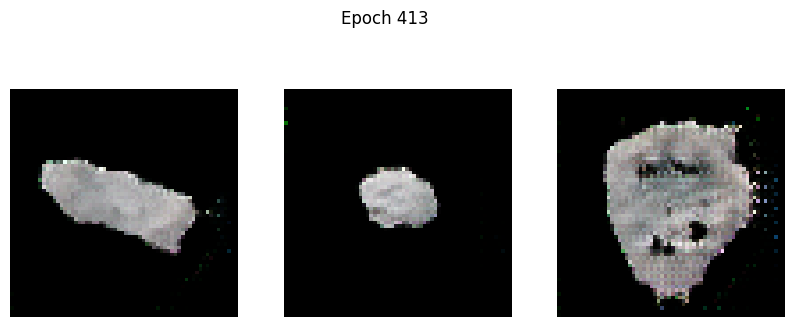

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -64.9283 - g_loss: 5.5870
Epoch 414/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -94.7211 - g_loss: 4.3843

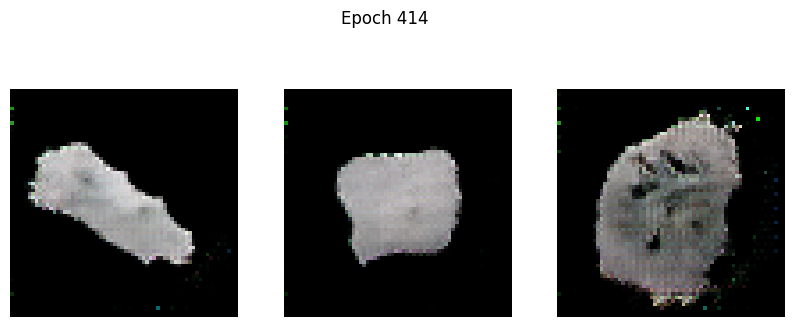

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -94.5206 - g_loss: 4.3843
Epoch 415/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -92.8725 - g_loss: 4.4386

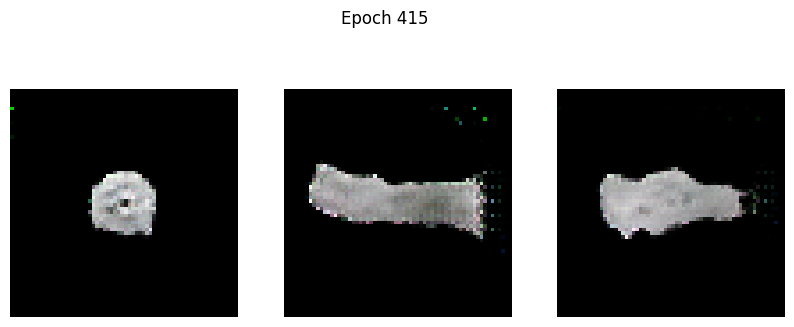

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -92.7582 - g_loss: 4.4378
Epoch 416/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -84.4347 - g_loss: 4.1067

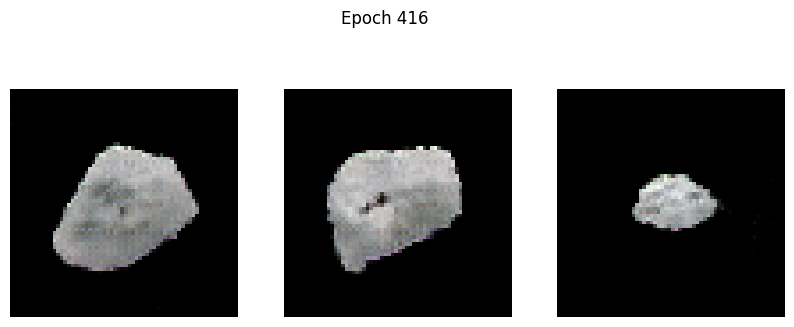

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -84.3630 - g_loss: 4.1074
Epoch 417/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -87.8492 - g_loss: 4.2923

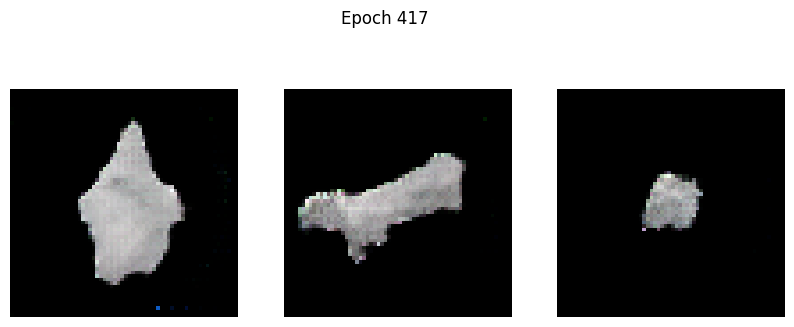

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -87.8144 - g_loss: 4.2933
Epoch 418/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -74.5206 - g_loss: 6.1670

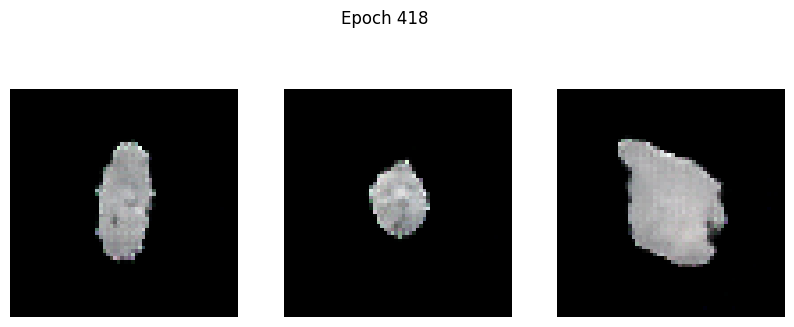

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -74.5021 - g_loss: 6.1675
Epoch 419/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -78.7495 - g_loss: 7.1601

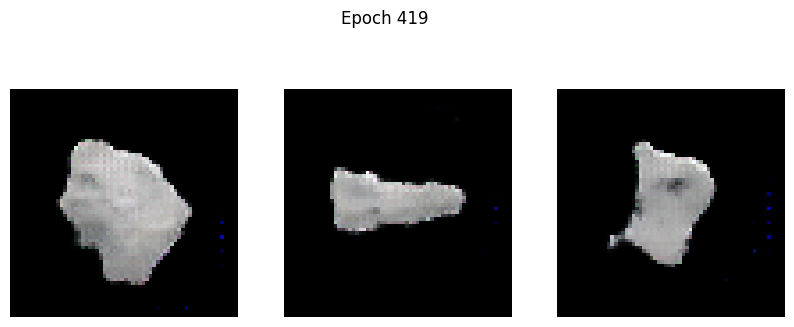

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -78.6382 - g_loss: 7.1674
Epoch 420/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -87.1812 - g_loss: 8.9283

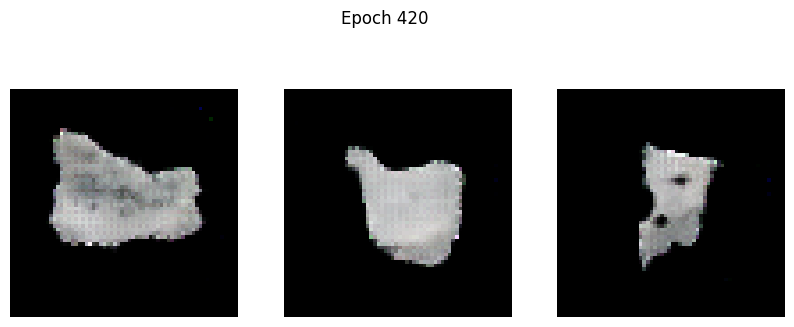

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -87.1180 - g_loss: 8.9155
Epoch 421/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -72.4375 - g_loss: 6.9755

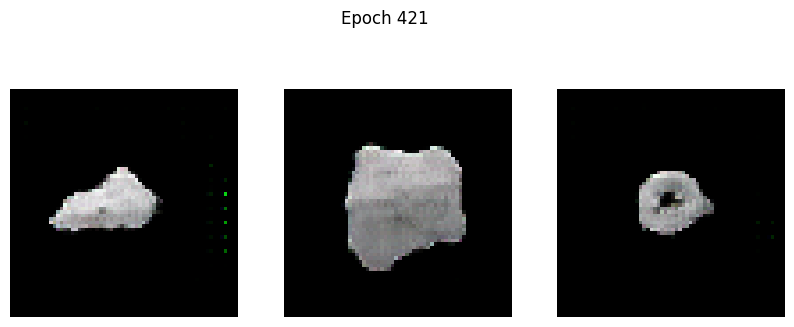

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -72.5122 - g_loss: 6.9698
Epoch 422/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -96.1992 - g_loss: 7.1940

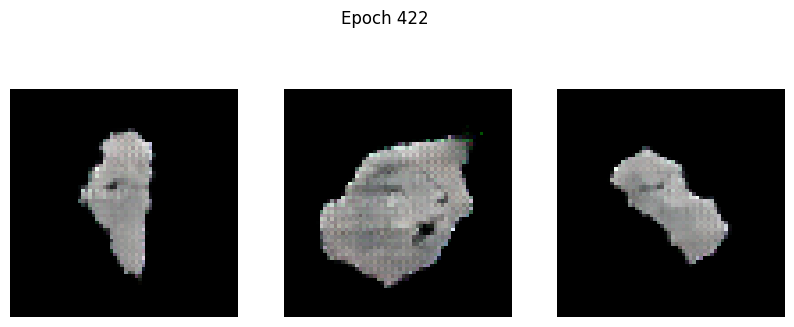

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -95.8429 - g_loss: 7.2835
Epoch 423/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -70.8649 - g_loss: 16.0163

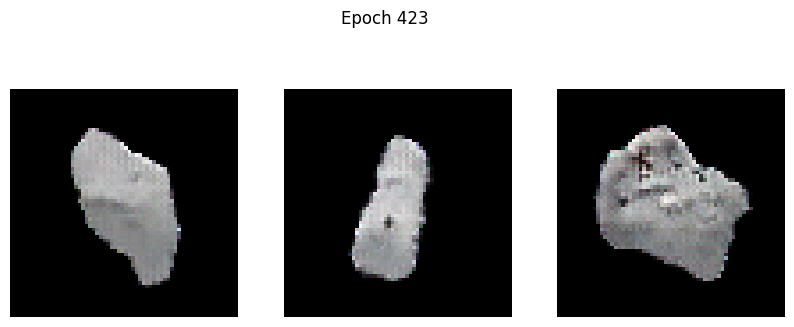

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -70.9964 - g_loss: 15.9876
Epoch 424/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -75.2670 - g_loss: 8.5935

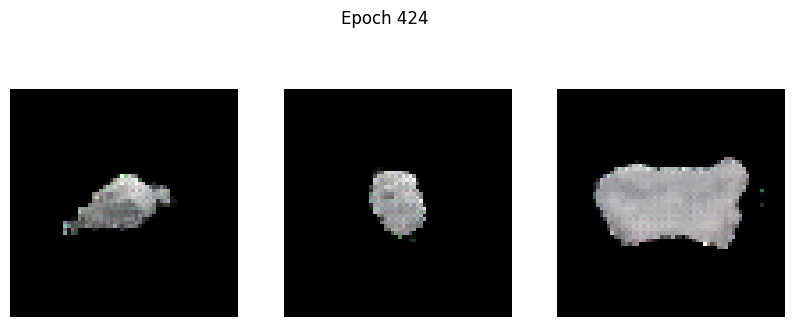

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -75.3874 - g_loss: 8.5865
Epoch 425/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -116.5052 - g_loss: 6.7912

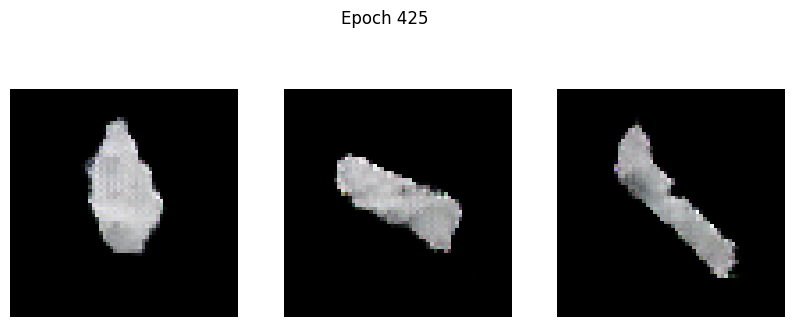

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - d_loss: -116.2411 - g_loss: 6.7936
Epoch 426/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -98.5116 - g_loss: 8.5507

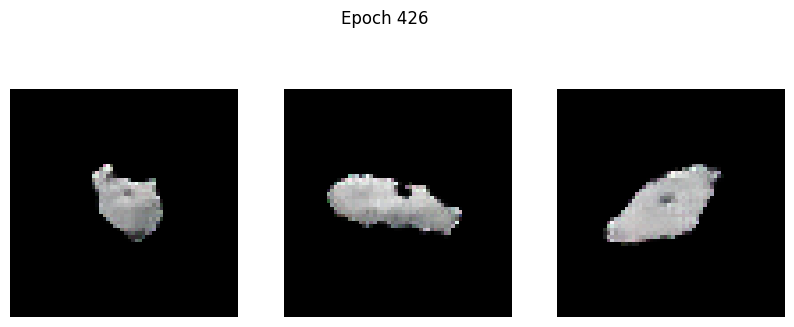

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -98.4412 - g_loss: 8.5601
Epoch 427/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -114.8067 - g_loss: 7.6365

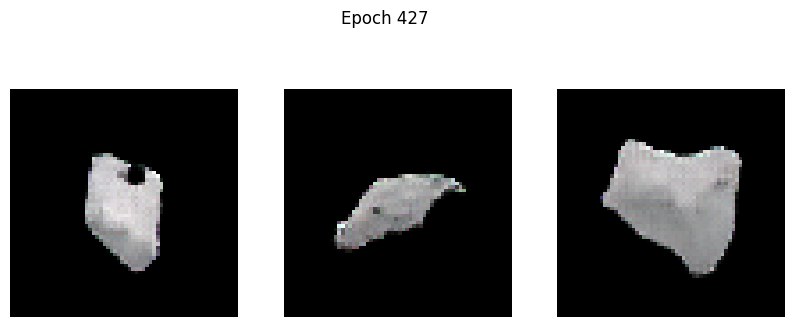

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -114.6042 - g_loss: 7.6327
Epoch 428/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -87.1817 - g_loss: 6.3756

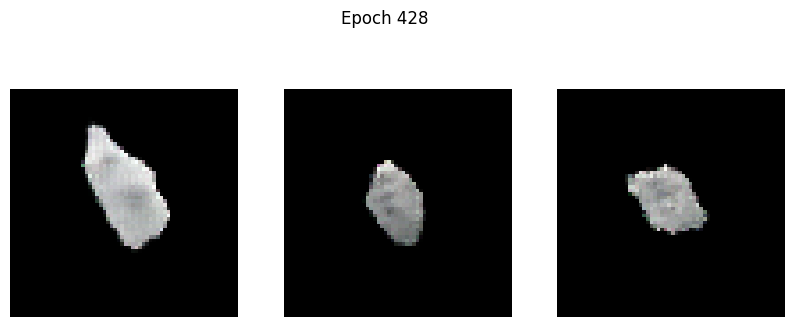

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -87.2811 - g_loss: 6.3780
Epoch 429/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -55.0868 - g_loss: 13.5833

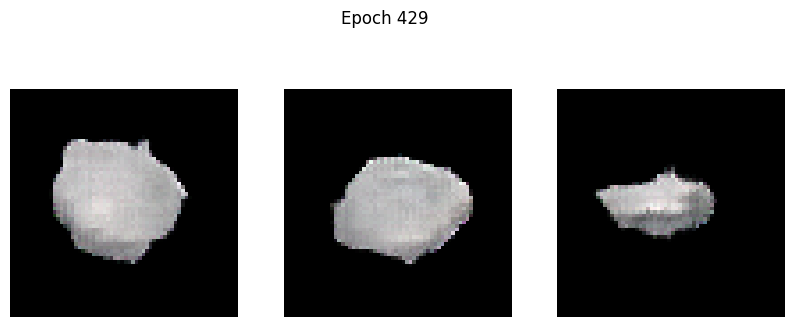

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -55.1288 - g_loss: 13.6175
Epoch 430/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -83.7952 - g_loss: 11.2333

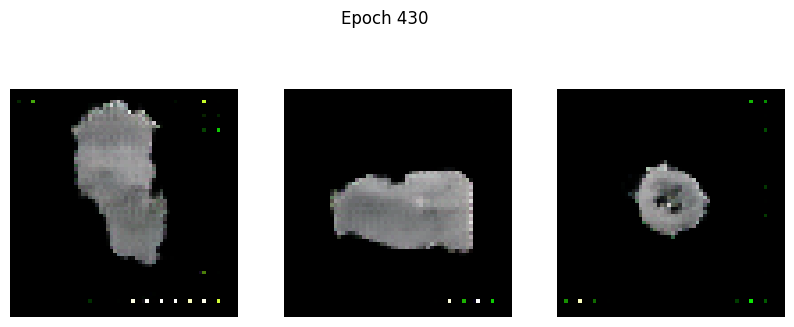

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -83.8932 - g_loss: 11.2252
Epoch 431/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -128.1962 - g_loss: 6.8433

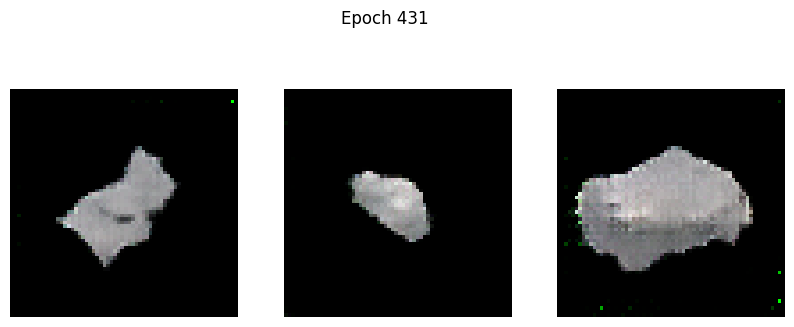

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -127.9573 - g_loss: 6.8434
Epoch 432/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 6480.6343 - g_loss: 3332.1814

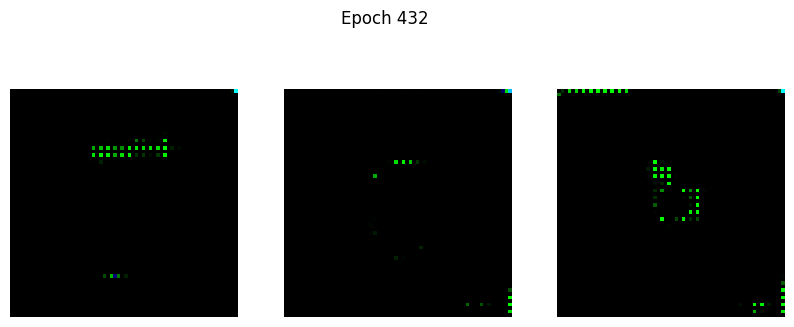

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 6538.1133 - g_loss: 3391.9639
Epoch 433/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 291.4798 - g_loss: 1723.5642

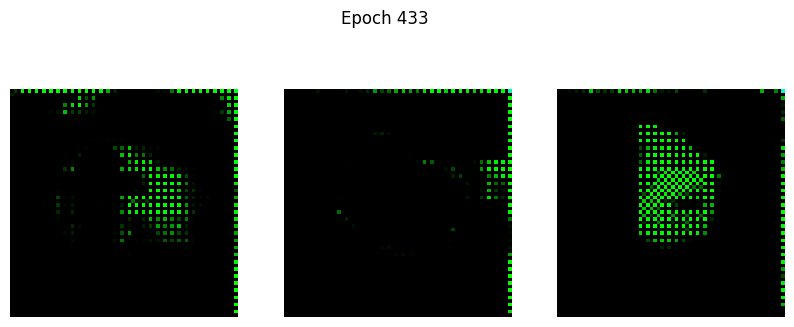

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 289.7305 - g_loss: 1720.0298
Epoch 434/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 58.0022 - g_loss: 1621.3153

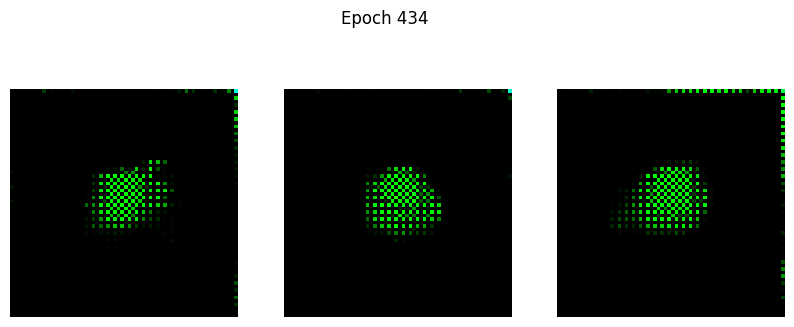

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 58.5125 - g_loss: 1623.9403
Epoch 435/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 56.7605 - g_loss: 2037.6204

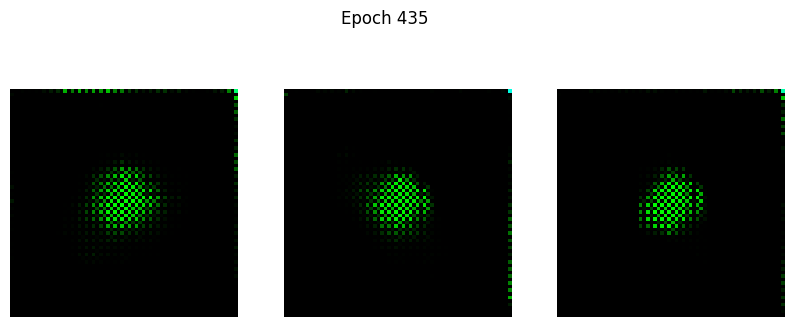

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 56.7652 - g_loss: 2040.0137
Epoch 436/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 31.0172 - g_loss: 2045.2719

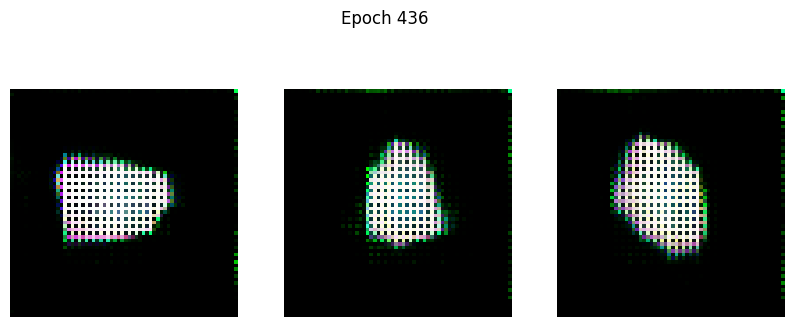

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 32.0104 - g_loss: 2040.8910
Epoch 437/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 341.8350 - g_loss: 1083.0179

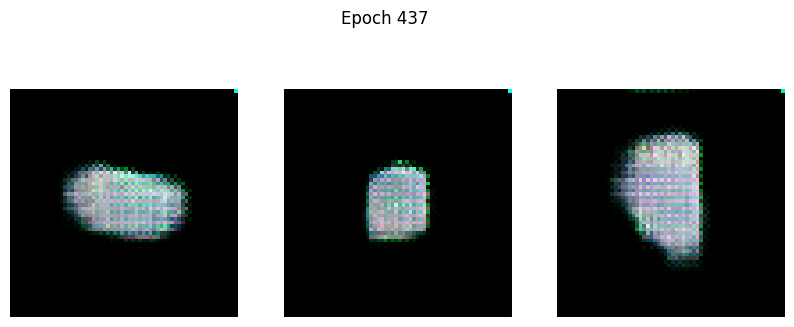

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 342.5129 - g_loss: 1079.7994
Epoch 438/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 525.9242 - g_loss: 285.8445

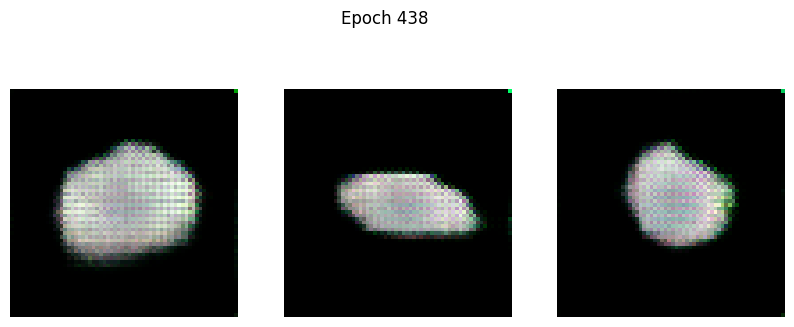

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 525.7823 - g_loss: 285.8326
Epoch 439/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 451.7138 - g_loss: 208.6123

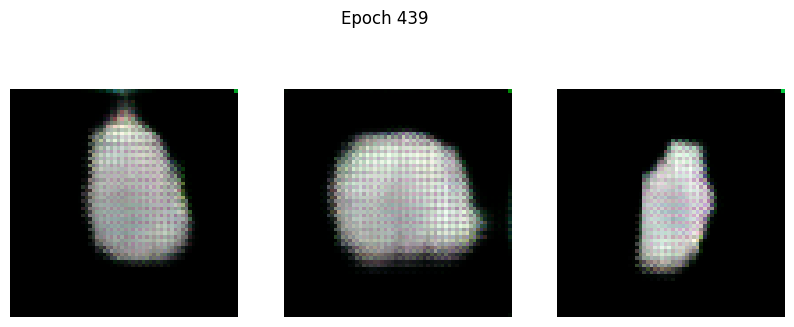

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 451.4450 - g_loss: 208.6289
Epoch 440/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 321.0953 - g_loss: 149.8160

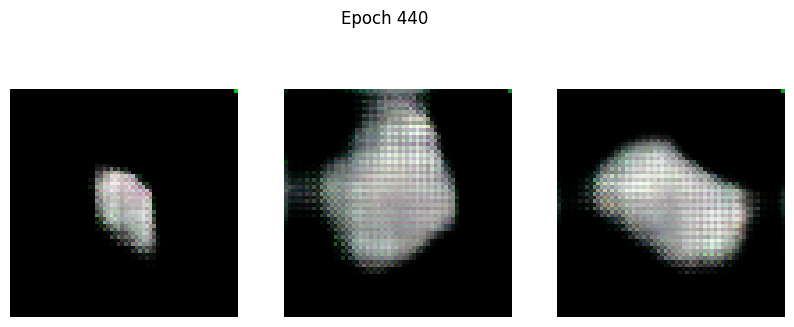

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 321.1150 - g_loss: 149.8318
Epoch 441/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 287.7216 - g_loss: 202.0154

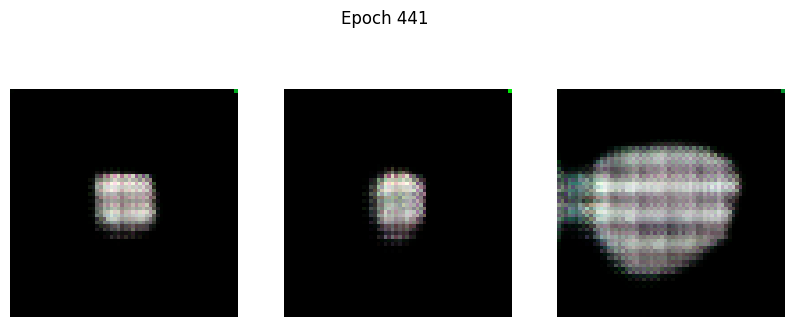

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 287.8322 - g_loss: 201.6102
Epoch 442/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 291.2529 - g_loss: 135.9075

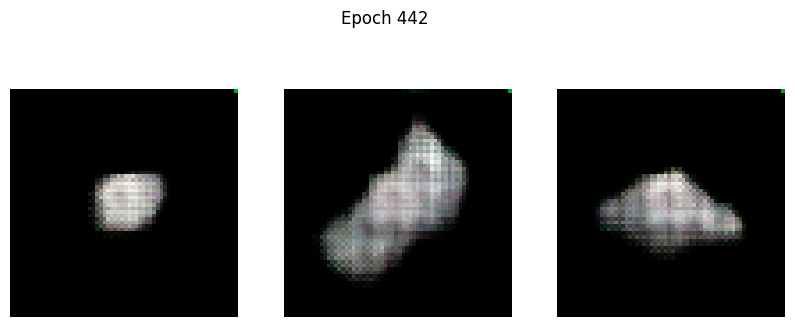

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 290.9611 - g_loss: 135.9042
Epoch 443/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 262.0806 - g_loss: 106.5454

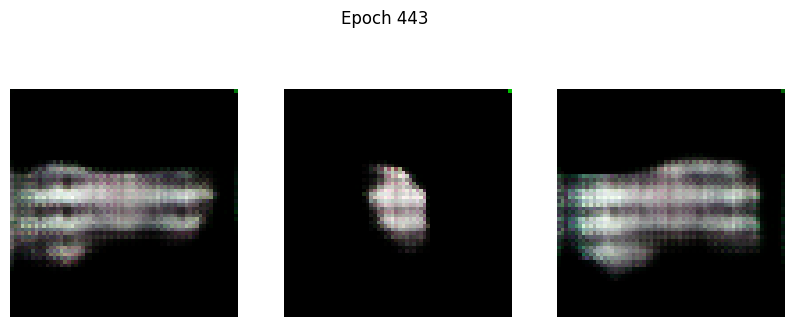

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 262.0598 - g_loss: 106.4276
Epoch 444/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 236.5022 - g_loss: 91.2315

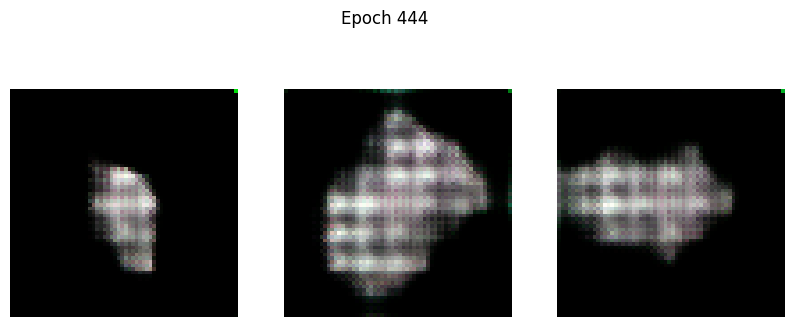

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 236.5645 - g_loss: 91.2987
Epoch 445/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 256.3647 - g_loss: 108.4982

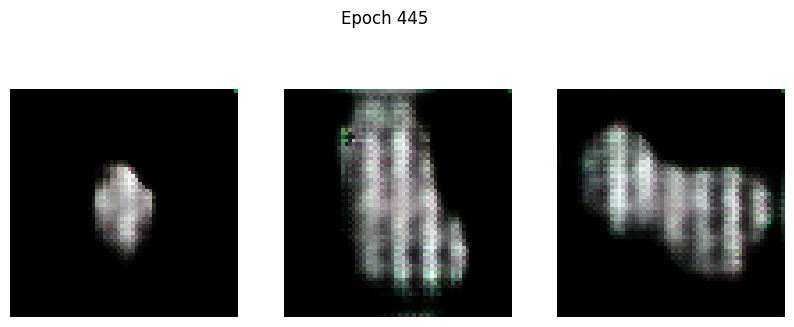

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 256.2879 - g_loss: 108.7059
Epoch 446/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 235.2647 - g_loss: 141.9132

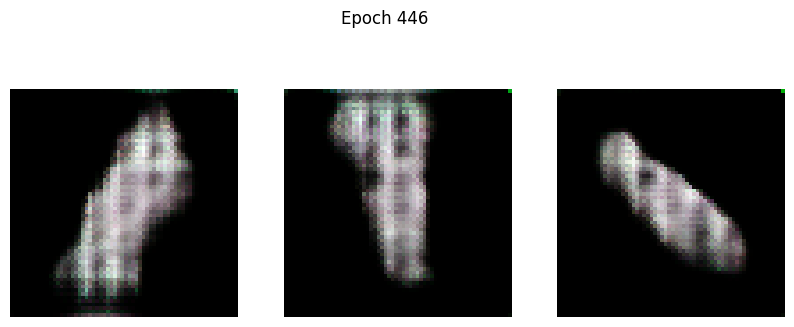

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 235.0317 - g_loss: 141.8087
Epoch 447/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 199.0836 - g_loss: 117.4834

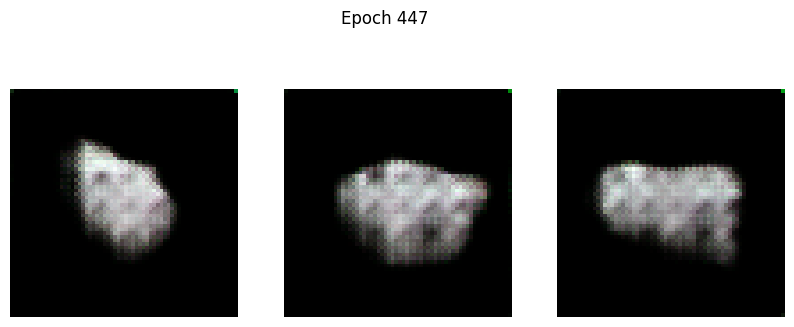

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 198.9857 - g_loss: 117.6778
Epoch 448/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 211.6756 - g_loss: 133.3767

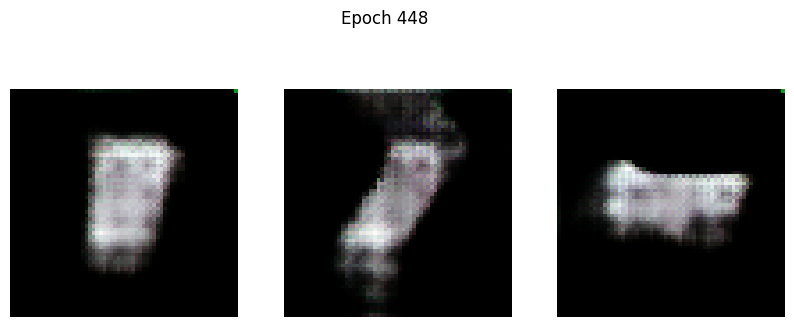

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 211.4457 - g_loss: 133.3655
Epoch 449/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 158.4023 - g_loss: 118.6026

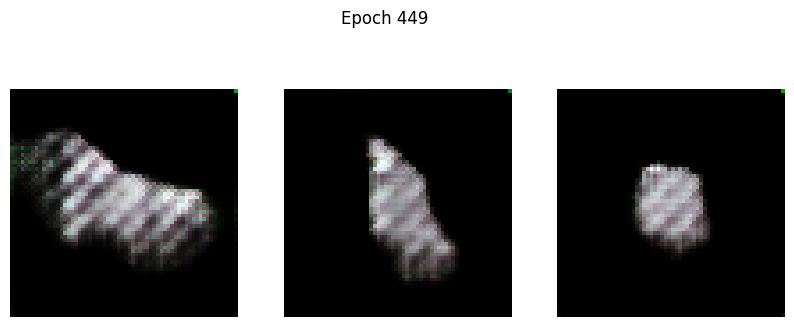

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 158.4659 - g_loss: 118.4975
Epoch 450/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 153.0645 - g_loss: 111.1408

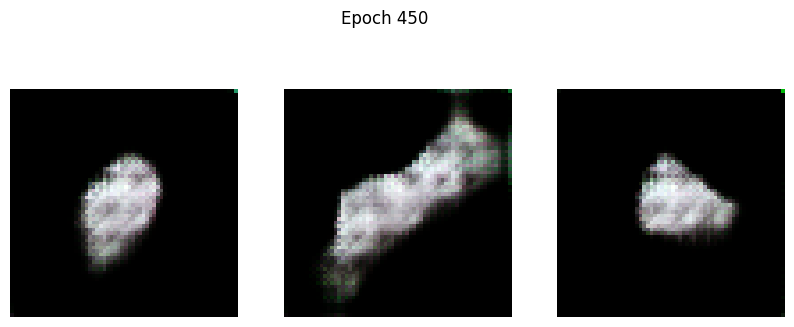

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 153.0964 - g_loss: 111.1823
Epoch 451/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 136.2457 - g_loss: 118.6924

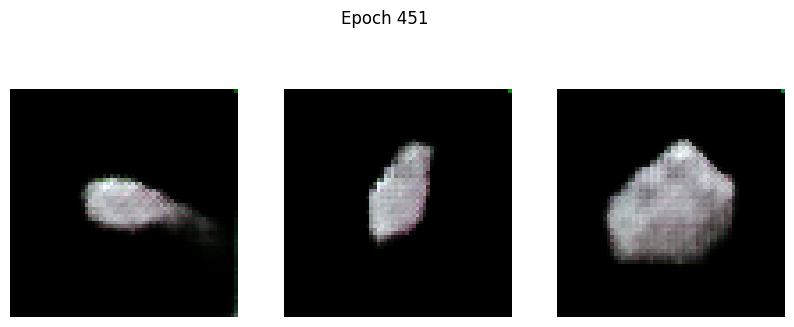

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 136.2607 - g_loss: 118.6155
Epoch 452/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 134.8142 - g_loss: 104.0597

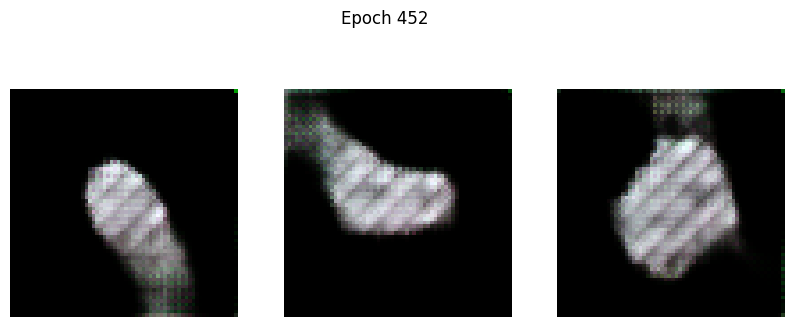

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 134.7480 - g_loss: 104.0539
Epoch 453/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 123.4072 - g_loss: 94.7868

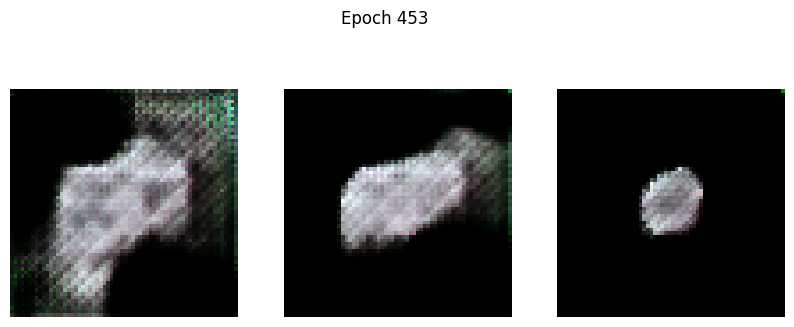

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 123.3229 - g_loss: 94.8594
Epoch 454/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 99.1377 - g_loss: 95.4764

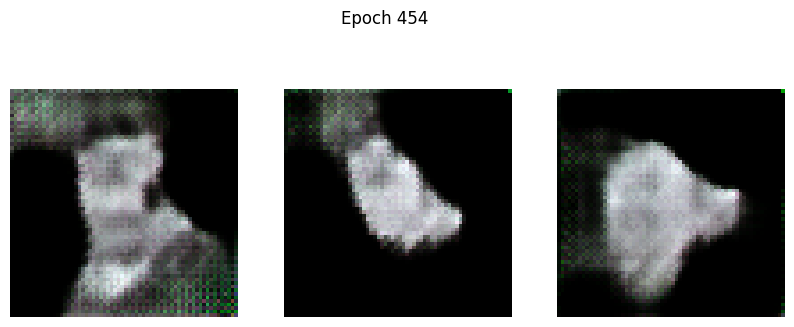

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 99.1419 - g_loss: 95.4689
Epoch 455/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 85.5798 - g_loss: 83.7521

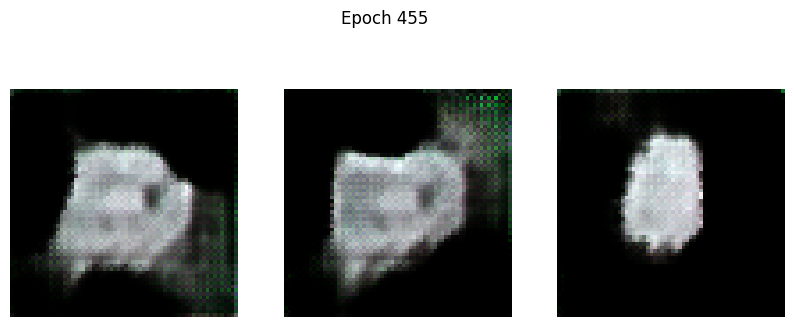

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 85.5198 - g_loss: 83.7320
Epoch 456/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 77.7718 - g_loss: 92.6317

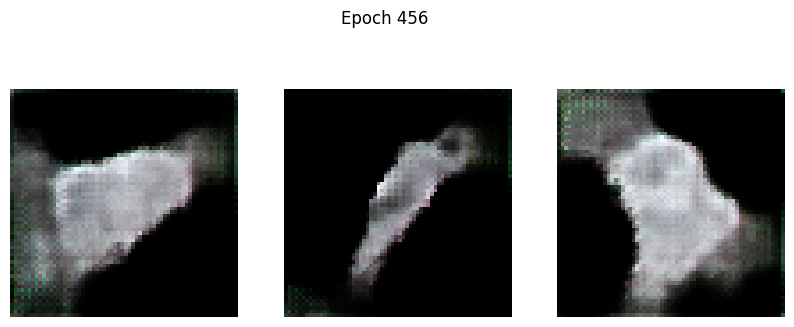

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 77.6879 - g_loss: 92.5595
Epoch 457/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 66.8311 - g_loss: 78.9657

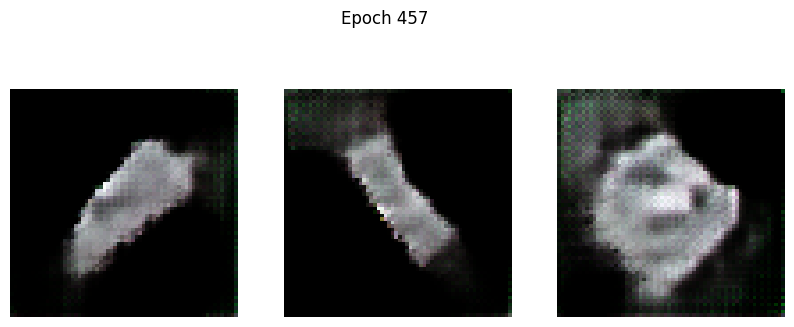

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 66.7634 - g_loss: 78.9090
Epoch 458/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 62.5964 - g_loss: 78.5596

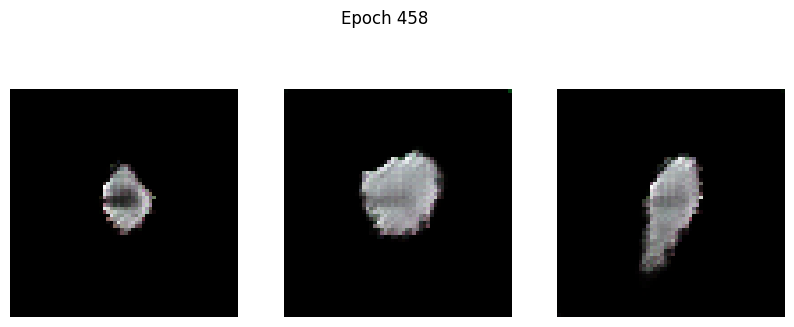

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 62.6239 - g_loss: 78.5486
Epoch 459/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 67.7397 - g_loss: 75.2084

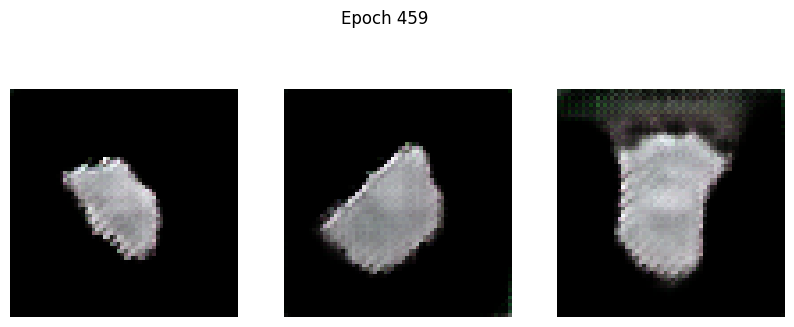

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 67.6932 - g_loss: 75.1646
Epoch 460/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 49.6911 - g_loss: 62.6080

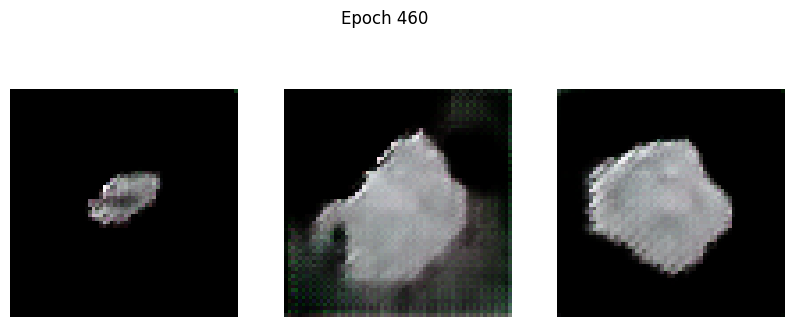

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 49.7073 - g_loss: 62.6117
Epoch 461/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 54.5937 - g_loss: 71.1557

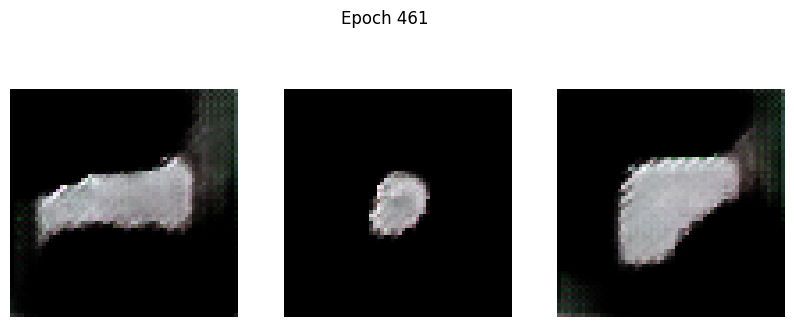

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 54.5533 - g_loss: 71.0759
Epoch 462/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 34.6458 - g_loss: 52.4911

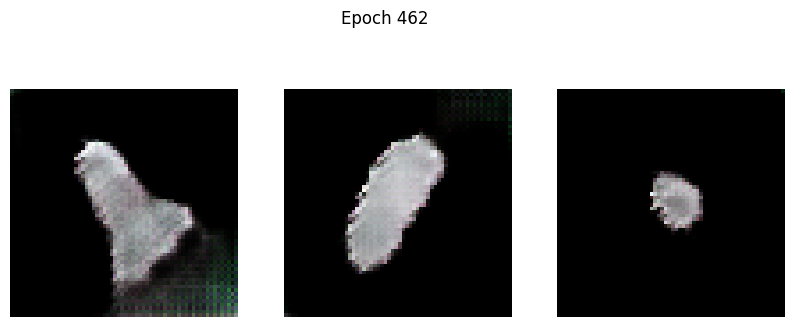

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 34.6567 - g_loss: 52.5204
Epoch 463/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 38.6685 - g_loss: 59.1510

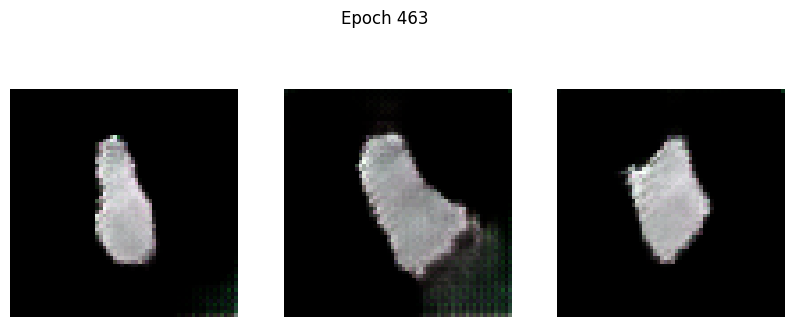

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 38.6558 - g_loss: 59.1404
Epoch 464/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 37.8715 - g_loss: 54.5481

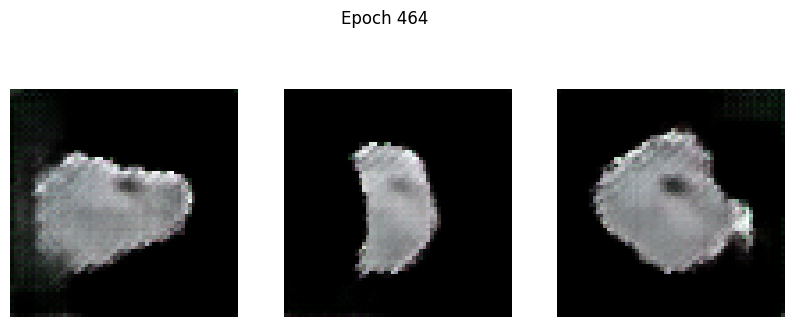

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 37.8793 - g_loss: 54.5125
Epoch 465/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 47.3065 - g_loss: 38.6072

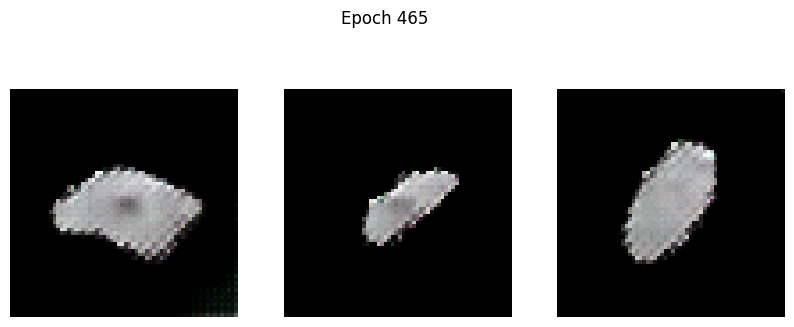

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 47.3214 - g_loss: 38.6514
Epoch 466/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 60.8832 - g_loss: 63.9954

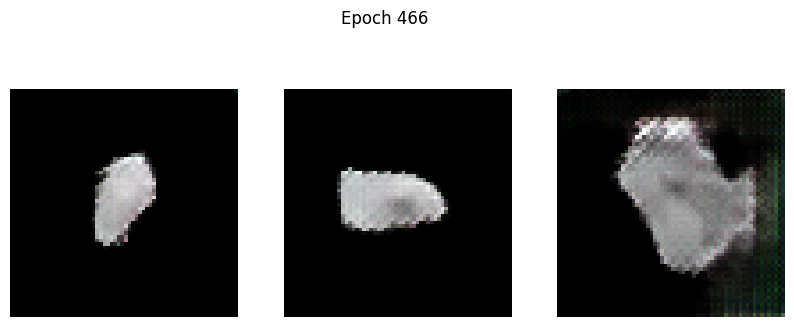

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 60.7954 - g_loss: 63.9309
Epoch 467/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 35.1694 - g_loss: 47.1051

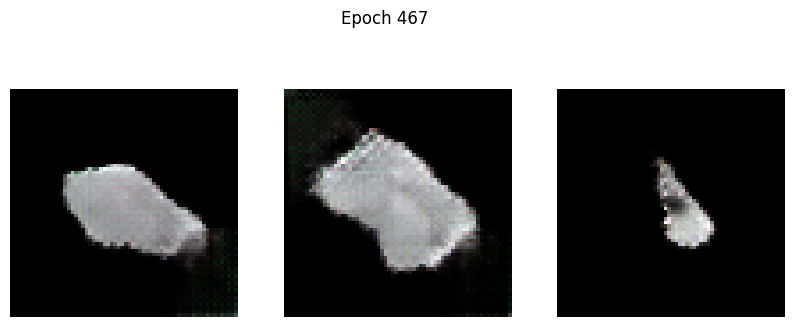

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 35.1184 - g_loss: 47.1344
Epoch 468/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 29.3858 - g_loss: 39.1982

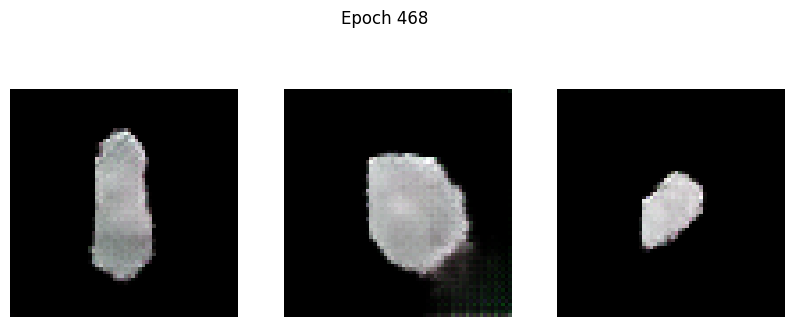

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - d_loss: 29.4307 - g_loss: 39.2445
Epoch 469/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 25.1047 - g_loss: 37.2225

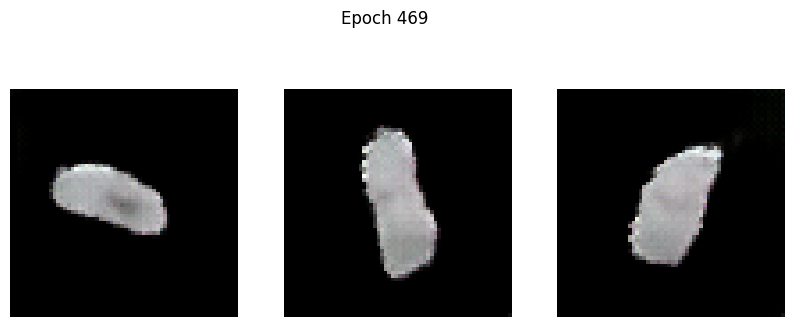

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 25.1285 - g_loss: 37.2474
Epoch 470/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 32.4625 - g_loss: 39.0965

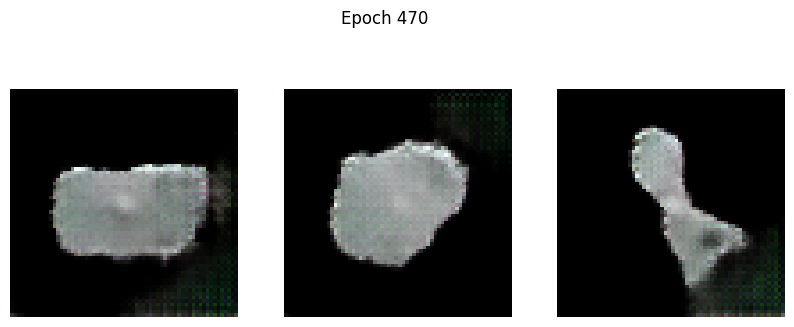

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 32.4613 - g_loss: 39.1233
Epoch 471/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 25.4005 - g_loss: 37.4495

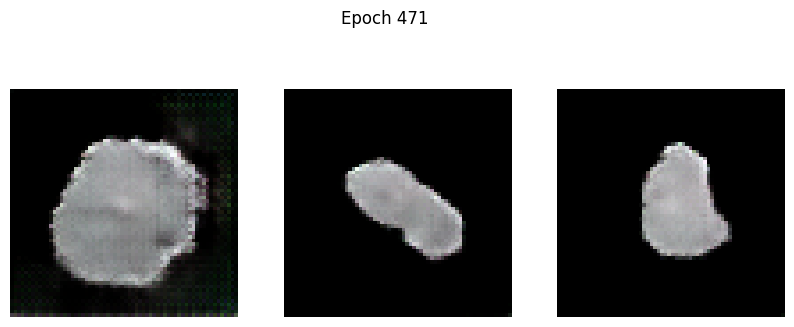

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 25.3849 - g_loss: 37.4850
Epoch 472/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 26.7014 - g_loss: 32.0068

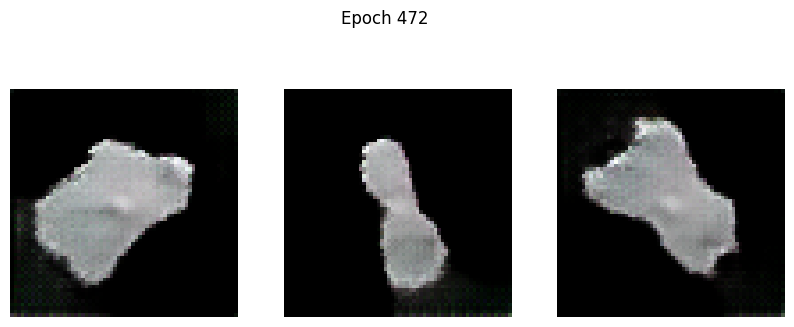

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 26.6725 - g_loss: 32.0337
Epoch 473/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 21.9633 - g_loss: 34.4471

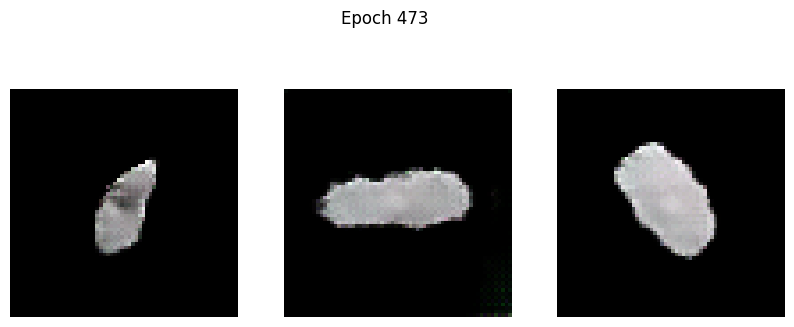

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 21.9843 - g_loss: 34.4543
Epoch 474/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 24.0766 - g_loss: 37.1408

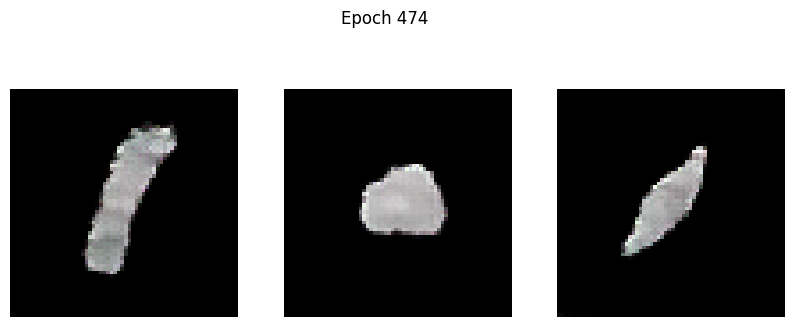

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 24.0515 - g_loss: 37.1166
Epoch 475/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 17.3689 - g_loss: 27.9873

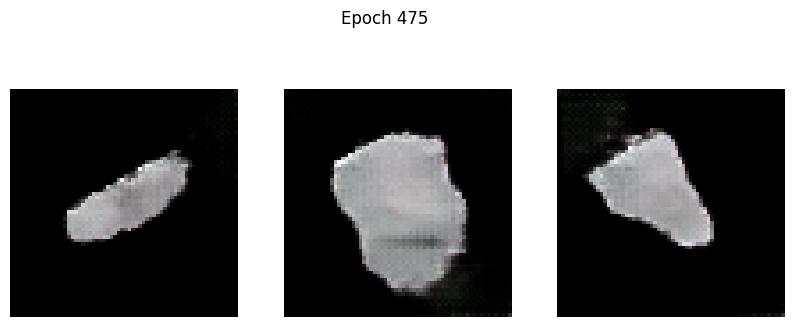

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 17.3672 - g_loss: 27.9972
Epoch 476/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 10.8545 - g_loss: 30.1038

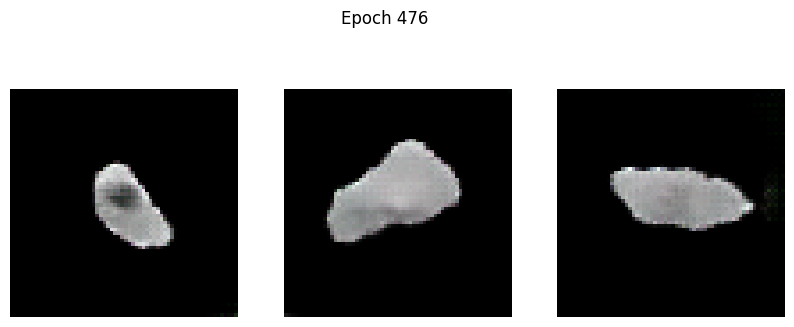

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 10.9002 - g_loss: 30.1062
Epoch 477/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 13.1294 - g_loss: 27.2106

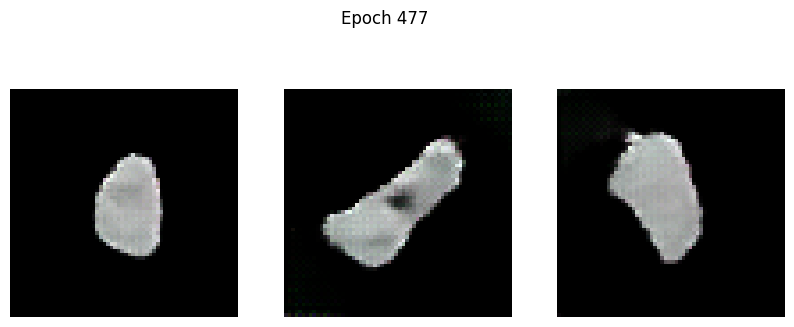

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 13.1211 - g_loss: 27.2190
Epoch 478/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 9.9030 - g_loss: 34.4303

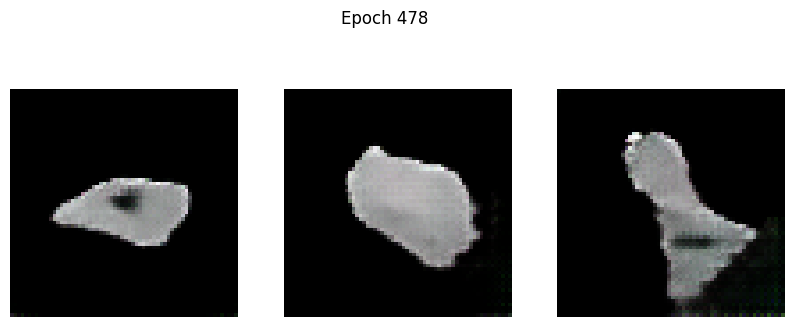

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 9.9377 - g_loss: 34.4045
Epoch 479/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 9.0141 - g_loss: 24.5692

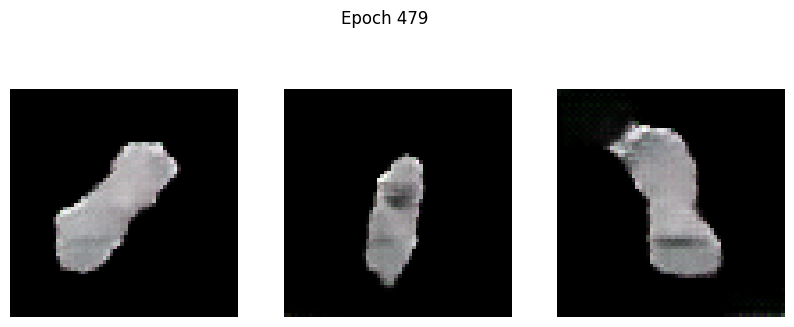

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 9.0177 - g_loss: 24.5871
Epoch 480/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 9.5401 - g_loss: 25.9684

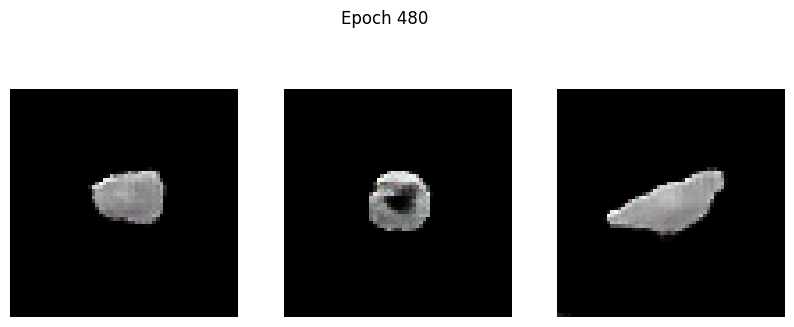

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 9.5345 - g_loss: 25.9704
Epoch 481/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 5.5688 - g_loss: 25.7354

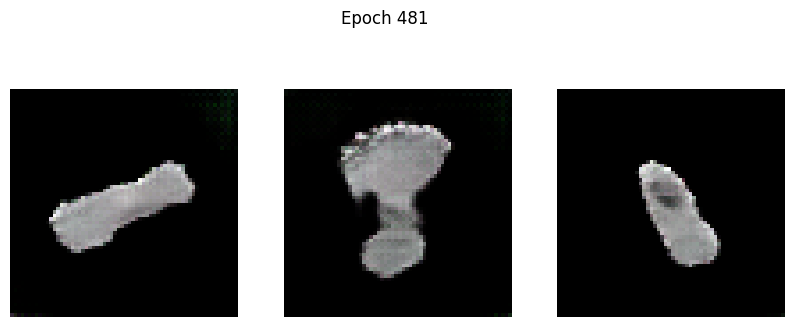

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 5.5429 - g_loss: 25.7679
Epoch 482/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 4.4385 - g_loss: 24.8675

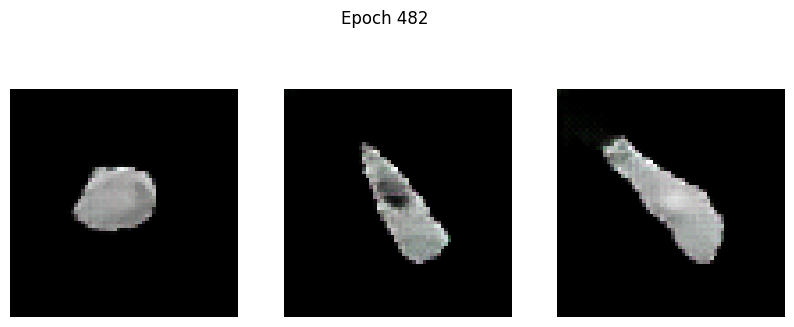

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 4.4385 - g_loss: 24.8567
Epoch 483/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.6189 - g_loss: 27.2405

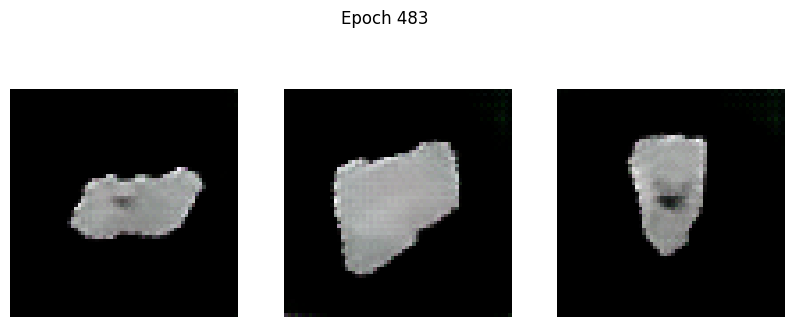

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.6104 - g_loss: 27.2255
Epoch 484/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.7229 - g_loss: 26.5455

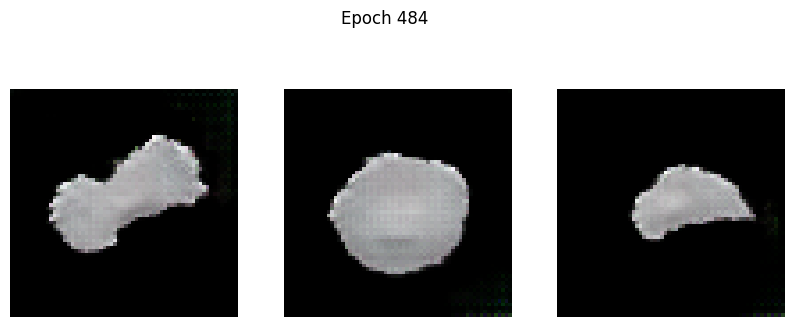

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.7330 - g_loss: 26.5460
Epoch 485/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.3230 - g_loss: 25.8223

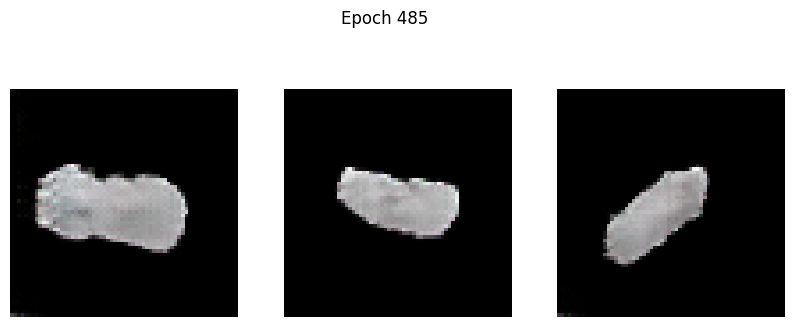

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.3030 - g_loss: 25.8235
Epoch 486/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.8619 - g_loss: 23.4756

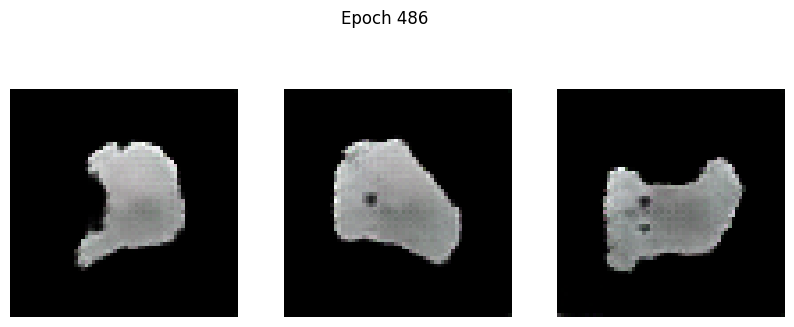

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -5.8749 - g_loss: 23.4853
Epoch 487/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -4.2164 - g_loss: 27.9738

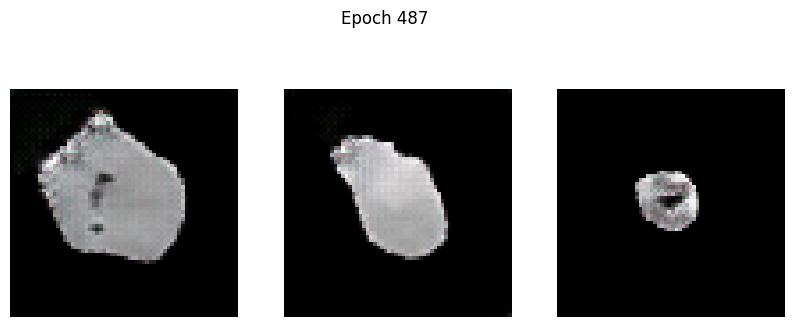

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.2632 - g_loss: 27.9610
Epoch 488/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -14.3062 - g_loss: 24.7498

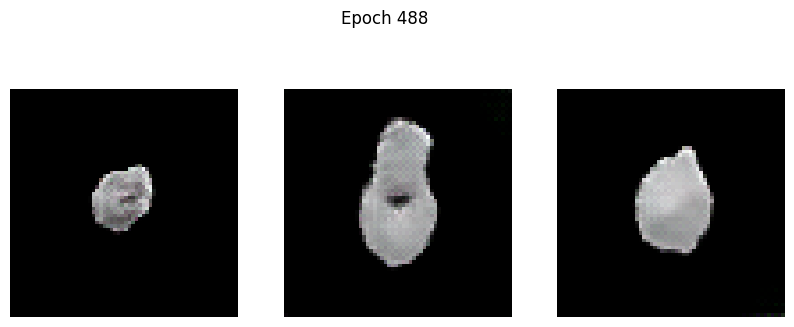

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - d_loss: -14.2854 - g_loss: 24.7359
Epoch 489/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.8720 - g_loss: 37.5649

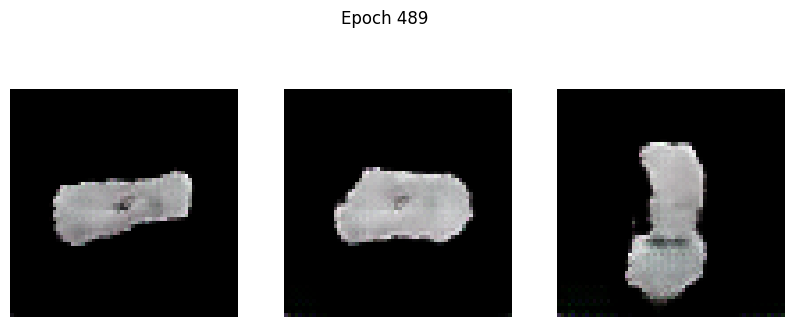

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -5.9342 - g_loss: 37.4087
Epoch 490/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -14.5189 - g_loss: 20.0249

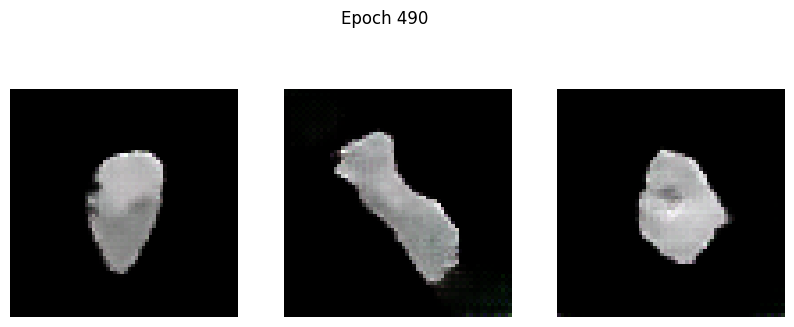

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -14.5429 - g_loss: 20.0292
Epoch 491/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -13.6659 - g_loss: 18.7707

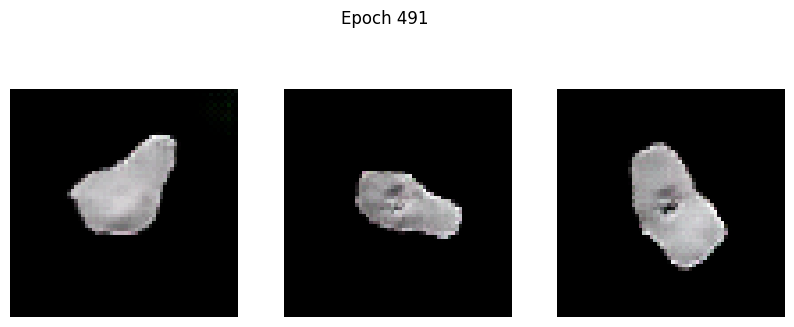

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -13.7002 - g_loss: 18.7920
Epoch 492/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -15.0469 - g_loss: 18.7723

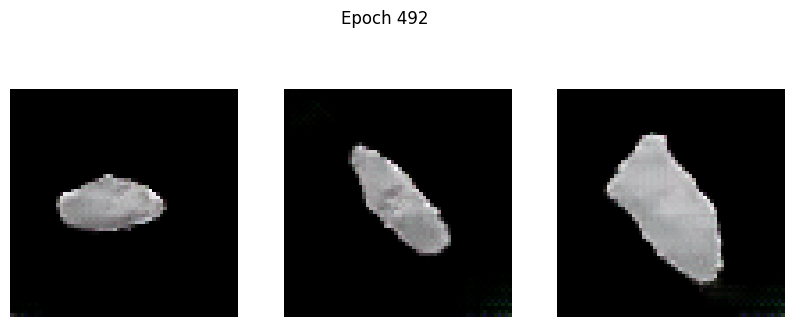

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -15.0665 - g_loss: 18.7714
Epoch 493/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -28.1300 - g_loss: 19.6899

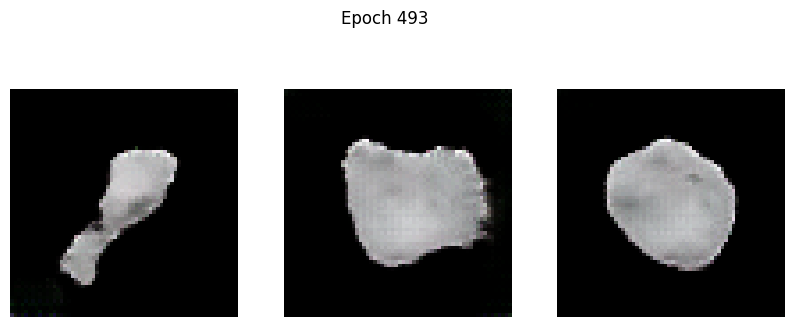

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -28.0994 - g_loss: 19.6857
Epoch 494/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -24.6649 - g_loss: 21.4720

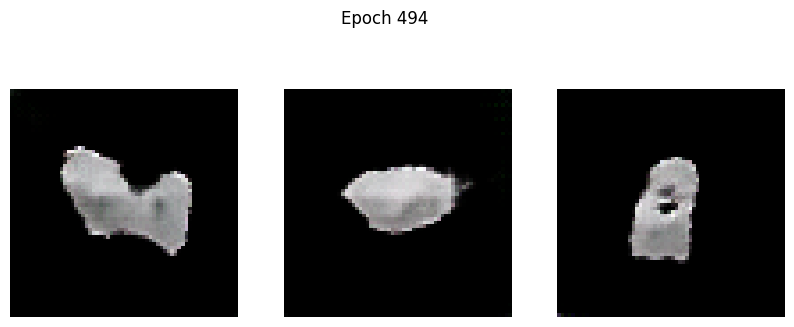

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -24.6738 - g_loss: 21.4535
Epoch 495/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -23.3665 - g_loss: 17.0910

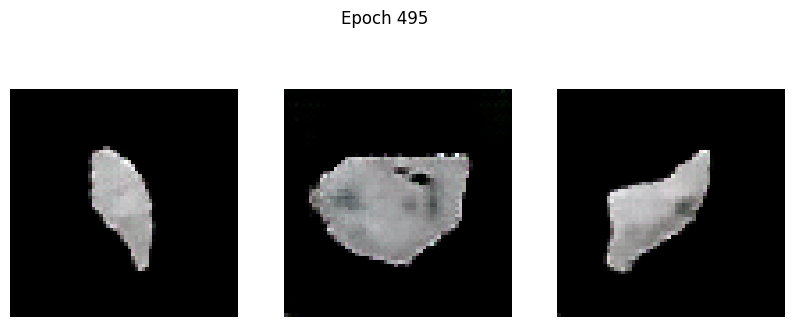

102/102 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - d_loss: -23.4281 - g_loss: 17.0969
Epoch 496/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -39.8875 - g_loss: 15.6347

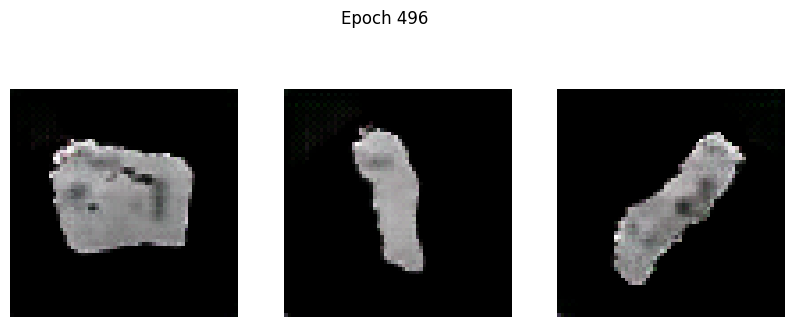

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - d_loss: -39.8661 - g_loss: 15.6436
Epoch 497/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -41.0411 - g_loss: 16.4076

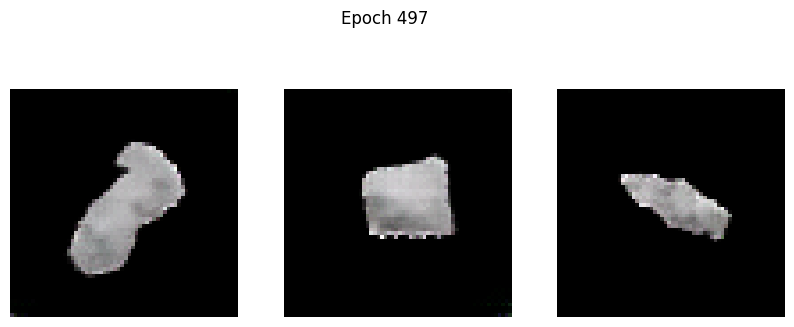

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -40.9977 - g_loss: 16.4045
Epoch 498/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -28.8100 - g_loss: 15.2664

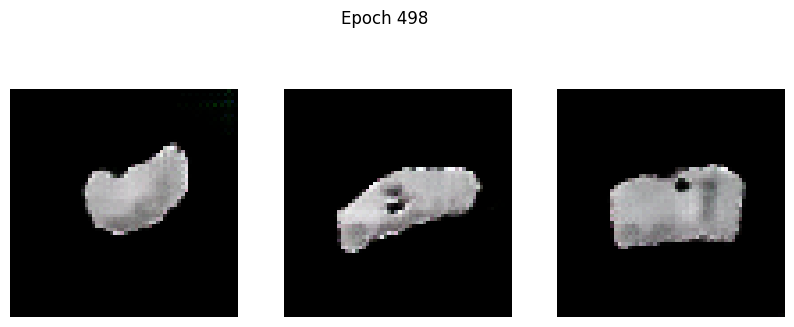

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -28.8416 - g_loss: 15.2647
Epoch 499/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -39.5215 - g_loss: 16.0934

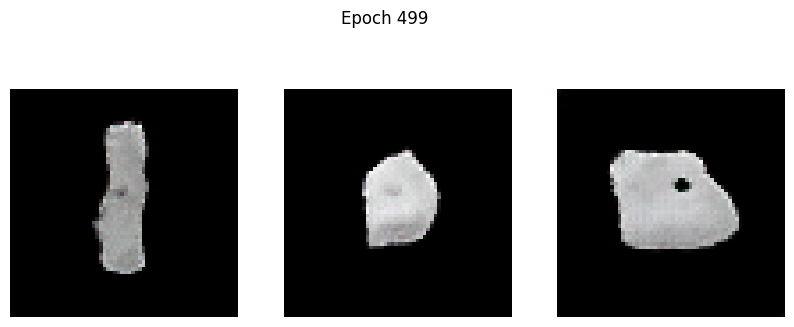

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -39.5204 - g_loss: 16.0856
Epoch 500/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -53.0615 - g_loss: 14.6203

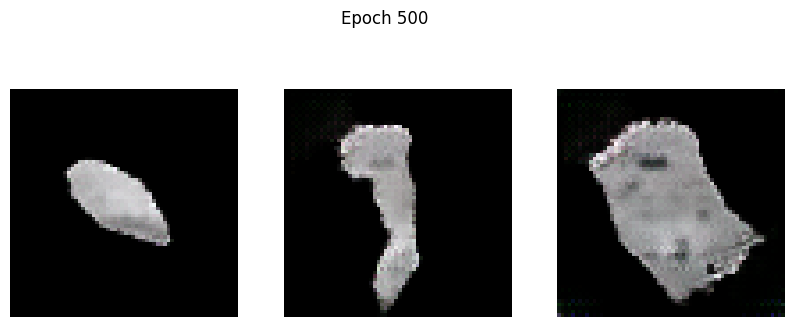

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -52.9639 - g_loss: 14.6176


In [16]:
# Hyperparameters
EPOCHS = 500  # Tambahkan jumlah epoch untuk hasil lebih baik (misal: 100-200)
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)